
focused.csv.gz and focused.T.csv.gz are rounded to 1000.


# Separate runs by HKLE due to size limits

In [1]:
hkle='HERVK113'

['HERVK113', 'SVA_A', 'SVA_B', 'SVA_C', 'SVA_D', 'SVA_E', 'SVA_F']

In [2]:
import numpy as np
np.__version__

'1.19.5'

In [3]:
import pandas as pd
pd.__version__

'1.1.5'

In [4]:
import matplotlib
matplotlib.__version__

'3.3.4'

In [5]:
import matplotlib.pyplot as plt

In [6]:
# Adjust plot size
#options(repr.plot.width=16, repr.plot.height=6)

# For some reason, if this is in the same cell as the import command, it doesn't work.
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [7]:
import scipy
scipy.__version__

'1.5.4'

In [8]:
from scipy import stats

In [9]:
import seaborn as sns
sns.__version__

'0.11.1'

In [10]:
from datetime import datetime

In [11]:
default_max_columns=pd.get_option('display.max_columns')

In [12]:
default_max_rows=pd.get_option('display.max_rows')

In [13]:
default_precision=pd.get_option('display.precision')

In [14]:
pd.set_option('display.precision', 2)

In [15]:
#default_threshold=np.get_printoptions()['threshold']

In [16]:
#np.set_printoptions(threshold=10000000)

# Read Metadata 1

In [17]:
mt1=pd.read_csv("TCGA/metadata.cart.TCGA.GBM-LGG.WGS.bam.2020-07-17.csv",header=None,
 names=['submitter','days_to_death','gender','disease_type','center_name'])

In [18]:
mt1.shape

(127, 5)

In [19]:
mt1.rename(columns={"submitter": "subject"},inplace=True)
mt1.rename(columns={"gender": "gender1"},inplace=True)

In [20]:
mt1.head()

,subject,days_to_death,gender1,disease_type,center_name
0,02-2483,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
1,02-2485,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
2,06-0125,1448.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
3,06-0152,375.0,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
4,06-0157,97.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard


In [21]:
list(mt1)

['subject', 'days_to_death', 'gender1', 'disease_type', 'center_name']

# Read Metadata 2

In [22]:
mt2=pd.read_csv("TCGA/TCGA.Glioma.metadata.tsv",sep="\t")

In [23]:
mt2.shape

(1114, 18)

In [24]:
mt2.head()

,case_submitter_id,project_id,primary_diagnosis,race,ethnicity,gender,RE_names,IDH,x1p19q,TERT,IDH_1p19q_status,WHO_groups,Triple_group,Tissue_sample_location,MGMT,Age,Survival_months,Vital_status
0,TCGA-02-0001,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,44.0,11.76,1.0
1,TCGA-02-0003,TCGA-GBM,Glioblastoma,white,not hispanic or latino,male,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,50.0,4.73,1.0
2,TCGA-02-0004,TCGA-GBM,Glioblastoma,white,not hispanic or latino,male,NaN,WT,NaN,NaN,IDH-WT:1p19q-NA,NaN,IDH-WT:1p19q-NA:TERT-NA,MD Anderson Cancer Center,NaN,59.0,11.33,1.0
3,TCGA-02-0006,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,56.0,18.33,1.0
4,TCGA-02-0007,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,40.0,23.16,1.0


In [25]:
list(mt2)

['case_submitter_id',
 'project_id',
 'primary_diagnosis',
 'race',
 'ethnicity',
 'gender',
 'RE_names',
 'IDH',
 'x1p19q',
 'TERT',
 'IDH_1p19q_status',
 'WHO_groups',
 'Triple_group',
 'Tissue_sample_location',
 'MGMT',
 'Age',
 'Survival_months',
 'Vital_status']

In [26]:
mt2['subject']=mt2['case_submitter_id'].astype(str).str[5:12]

In [27]:
mt2[['subject','case_submitter_id']].head()

,subject,case_submitter_id
0,02-0001,TCGA-02-0001
1,02-0003,TCGA-02-0003
2,02-0004,TCGA-02-0004
3,02-0006,TCGA-02-0006
4,02-0007,TCGA-02-0007


In [28]:
mt2.drop('case_submitter_id',axis='columns',inplace=True)
mt2.rename(columns={"gender": "gender2"},inplace=True)

In [29]:
list(mt2)

['project_id',
 'primary_diagnosis',
 'race',
 'ethnicity',
 'gender2',
 'RE_names',
 'IDH',
 'x1p19q',
 'TERT',
 'IDH_1p19q_status',
 'WHO_groups',
 'Triple_group',
 'Tissue_sample_location',
 'MGMT',
 'Age',
 'Survival_months',
 'Vital_status',
 'subject']

# Merge Metadata

In [30]:
#meta=mt2.merge(mt1,left_on='subject2',right_on='subject1',suffixes=["_mt2","_mt1"],how='inner')
meta=mt2.merge(mt1,on='subject',suffixes=["_mt2","_mt1"],how='inner')

In [31]:
del mt1
del mt2

In [32]:
meta.head()

,project_id,primary_diagnosis,race,ethnicity,gender2,RE_names,IDH,x1p19q,TERT,IDH_1p19q_status,...,Tissue_sample_location,MGMT,Age,Survival_months,Vital_status,subject,days_to_death,gender1,disease_type,center_name
0,TCGA-GBM,Glioblastoma,asian,not hispanic or latino,male,02-2483-01A-01R-1849-01+1,Mutant,non-codel,WT,IDH-Mutant:1p19q-non-codel,...,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,02-2483,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
1,TCGA-GBM,Glioblastoma,black or african american,not hispanic or latino,male,02-2485-01A-01R-1849-01+1,WT,non-codel,Mutant,IDH-WT:1p19q-non-codel,...,MD Anderson Cancer Center,Unmethylated,53.0,15.44,0.0,02-2485,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
2,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,06-0125-01A-01R-1849-01+1,WT,non-codel,Mutant,IDH-WT:1p19q-non-codel,...,Henry Ford Hospital,Methylated,63.0,47.57,1.0,06-0125,1448.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
3,TCGA-GBM,Glioblastoma,white,not hispanic or latino,male,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,...,Henry Ford Hospital,NaN,68.0,12.32,1.0,06-0152,375.0,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
4,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,06-0157-01A-01R-1849-01+1,WT,non-codel,Mutant,IDH-WT:1p19q-non-codel,...,Henry Ford Hospital,NaN,63.0,3.19,1.0,06-0157,97.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard


In [33]:
meta.drop(meta[(meta['subject']=='CS-6186') & (meta['center_name']=='Harvard Medical School')].index,inplace=True)

In [34]:
meta.drop(meta[(meta['subject']=='DU-5872') & (meta['center_name']=='Harvard Medical School')].index,inplace=True)

In [35]:
meta.columns

Index(['project_id', 'primary_diagnosis', 'race', 'ethnicity', 'gender2',
       'RE_names', 'IDH', 'x1p19q', 'TERT', 'IDH_1p19q_status', 'WHO_groups',
       'Triple_group', 'Tissue_sample_location', 'MGMT', 'Age',
       'Survival_months', 'Vital_status', 'subject', 'days_to_death',
       'gender1', 'disease_type', 'center_name'],
      dtype='object')

In [36]:
meta['primary_diagnosis'].value_counts()

Glioblastoma                     35
Oligodendroglioma, NOS           33
Astrocytoma, anaplastic          24
Mixed glioma                     16
Astrocytoma, NOS                  9
Oligodendroglioma, anaplastic     8
Name: primary_diagnosis, dtype: int64

In [37]:
meta['TERT'].value_counts()

Mutant    68
WT        54
Name: TERT, dtype: int64

In [38]:
meta['IDH'].value_counts()

Mutant    74
WT        50
Name: IDH, dtype: int64

In [39]:
meta['x1p19q'].value_counts()

non-codel    102
codel         23
Name: x1p19q, dtype: int64

In [40]:
meta['disease_type'].value_counts()

Brain Lower Grade Glioma    90
Glioblastoma Multiforme     35
Name: disease_type, dtype: int64

In [41]:
meta['gender1'].value_counts()

male      72
female    53
Name: gender1, dtype: int64

In [42]:
meta['race'].value_counts()

white                        114
black or african american      7
not reported                   3
asian                          1
Name: race, dtype: int64

In [43]:
meta['ethnicity'].value_counts()

not hispanic or latino    108
not reported               11
hispanic or latino          6
Name: ethnicity, dtype: int64

In [44]:
meta['IDH_1p19q_status'].value_counts()

IDH-Mutant:1p19q-non-codel    51
IDH-WT:1p19q-non-codel        50
IDH-Mutant:1p19q-codel        23
IDH-NA:1p19q-non-codel         1
Name: IDH_1p19q_status, dtype: int64

In [45]:
meta['WHO_groups'].value_counts()

glioblastoma:IDH-WT:1p19q-non-codel             29
oligodendroglioma:IDH-Mutant:1p19q-codel        23
astrocytoma:IDH-Mutant:1p19q-non-codel          18
astrocytoma:IDH-WT:1p19q-non-codel              13
oligodendroglioma:IDH-Mutant:1p19q-non-codel    13
oligoastrocytoma:IDH-Mutant:1p19q-non-codel     11
glioblastoma:IDH-Mutant:1p19q-non-codel          5
oligodendroglioma:IDH-WT:1p19q-non-codel         4
oligoastrocytoma:IDH-WT:1p19q-non-codel          4
Name: WHO_groups, dtype: int64

In [46]:
meta['Triple_group'].value_counts()

IDH-Mutant:1p19q-non-codel:TERT-WT        49
IDH-WT:1p19q-non-codel:TERT-Mutant        44
IDH-Mutant:1p19q-codel:TERT-Mutant        22
IDH-WT:1p19q-non-codel:TERT-WT             4
IDH-WT:1p19q-non-codel:TERT-NA             2
IDH-Mutant:1p19q-codel:TERT-WT             1
IDH-NA:1p19q-non-codel:TERT-Mutant         1
IDH-Mutant:1p19q-non-codel:TERT-NA         1
IDH-Mutant:1p19q-non-codel:TERT-Mutant     1
Name: Triple_group, dtype: int64

In [47]:
meta['MGMT'].value_counts()

Methylated      87
Unmethylated    27
Name: MGMT, dtype: int64

In [48]:
meta['center_name'].value_counts()

Broad Institute of MIT and Harvard    75
Harvard Medical School                50
Name: center_name, dtype: int64

## We need a multi-level index to merge with df later so adding an empty index level

In [49]:
meta.columns=[meta.columns,[''] * len(meta.columns)]

In [50]:
#meta.columns.names=['chromosome','position']

In [51]:
meta.columns

MultiIndex([(            'project_id', ''),
            (     'primary_diagnosis', ''),
            (                  'race', ''),
            (             'ethnicity', ''),
            (               'gender2', ''),
            (              'RE_names', ''),
            (                   'IDH', ''),
            (                'x1p19q', ''),
            (                  'TERT', ''),
            (      'IDH_1p19q_status', ''),
            (            'WHO_groups', ''),
            (          'Triple_group', ''),
            ('Tissue_sample_location', ''),
            (                  'MGMT', ''),
            (                   'Age', ''),
            (       'Survival_months', ''),
            (          'Vital_status', ''),
            (               'subject', ''),
            (         'days_to_death', ''),
            (               'gender1', ''),
            (          'disease_type', ''),
            (           'center_name', '')],
           )

# Read raw data and cleanup

In [52]:
#df=pd.read_csv("focused.csv.gz",header=[0,1,2,3],index_col=[0,1])
#df.columns.names=['sample','pup','hkle','q']
#df=df.T
df=pd.read_csv("focused.T.csv.gz",header=[0,1],index_col=[0,1,2,3])

df.reset_index(inplace=True)
df.head()


chromosome       sample     pup      hkle mapq    chr1                  \
position                                       1048000 1190000 1308000   
0           02-2483-01A  paired  HERVK113  Q20       0       0       0   
1           02-2483-01A  paired     SVA_A  Q20       0       0       0   
2           02-2483-01A  paired     SVA_B  Q20       0       0       0   
3           02-2483-01A  paired     SVA_C  Q20       0       0       0   
4           02-2483-01A  paired     SVA_D  Q20       0       0       0   

chromosome                          ...     chrY                             \
position   1409000 1410000 1580000  ... 19535000 19536000 19699000 19700000   
0                4       1       4  ...        0        0        2        0   
1                0       0       0  ...        0        0        0        0   
2                0       0       0  ...        0        0        0        0   
3                0       0       0  ...        0        0        0        0   
4                0       0       0  ...        0        0        0        0   

chromosome                                                        
position   20552000 20553000 20976000 21047000 21217000 21639000  
0                 0        0        0        0        0        0  
1                 0        0        0        0        0        0  
2                 0        0        0        0        0        0  
3                 0        0        0        0        0        0  
4                 0        0        0        0        0        0  

[5 rows x 17413 columns]

In [53]:
df['subject']=df['sample'].str[0:7]
df['subject']

0       02-2483
1       02-2483
2       02-2483
3       02-2483
4       02-2483
         ...   
1913    TQ-A8XE
1914    TQ-A8XE
1915    TQ-A8XE
1916    TQ-A8XE
1917    TQ-A8XE
Name: subject, Length: 1918, dtype: object

In [54]:
df.columns

MultiIndex([( 'sample',         ''),
            (    'pup',         ''),
            (   'hkle',         ''),
            (   'mapq',         ''),
            (   'chr1',  '1048000'),
            (   'chr1',  '1190000'),
            (   'chr1',  '1308000'),
            (   'chr1',  '1409000'),
            (   'chr1',  '1410000'),
            (   'chr1',  '1580000'),
            ...
            (   'chrY', '19536000'),
            (   'chrY', '19699000'),
            (   'chrY', '19700000'),
            (   'chrY', '20552000'),
            (   'chrY', '20553000'),
            (   'chrY', '20976000'),
            (   'chrY', '21047000'),
            (   'chrY', '21217000'),
            (   'chrY', '21639000'),
            ('subject',         '')],
           names=['chromosome', 'position'], length=17414)

In [55]:
df.head()

chromosome       sample     pup      hkle mapq    chr1                  \
position                                       1048000 1190000 1308000   
0           02-2483-01A  paired  HERVK113  Q20       0       0       0   
1           02-2483-01A  paired     SVA_A  Q20       0       0       0   
2           02-2483-01A  paired     SVA_B  Q20       0       0       0   
3           02-2483-01A  paired     SVA_C  Q20       0       0       0   
4           02-2483-01A  paired     SVA_D  Q20       0       0       0   

chromosome                          ...     chrY                             \
position   1409000 1410000 1580000  ... 19536000 19699000 19700000 20552000   
0                4       1       4  ...        0        2        0        0   
1                0       0       0  ...        0        0        0        0   
2                0       0       0  ...        0        0        0        0   
3                0       0       0  ...        0        0        0        0   
4                0       0       0  ...        0        0        0        0   

chromosome                                               subject  
position   20553000 20976000 21047000 21217000 21639000           
0                 0        0        0        0        0  02-2483  
1                 0        0        0        0        0  02-2483  
2                 0        0        0        0        0  02-2483  
3                 0        0        0        0        0  02-2483  
4                 0        0        0        0        0  02-2483  

[5 rows x 17414 columns]

In [56]:
df.set_index(['subject','sample','pup','hkle','mapq'],inplace=True)

In [57]:
df.head()

chromosome                                  chr1                          \
position                                 1048000 1190000 1308000 1409000   
subject sample      pup    hkle     mapq                                   
02-2483 02-2483-01A paired HERVK113 Q20        0       0       0       4   
                           SVA_A    Q20        0       0       0       0   
                           SVA_B    Q20        0       0       0       0   
                           SVA_C    Q20        0       0       0       0   
                           SVA_D    Q20        0       0       0       0   

chromosome                                                                \
position                                 1410000 1580000 1581000 2211000   
subject sample      pup    hkle     mapq                                   
02-2483 02-2483-01A paired HERVK113 Q20        1       4       0       0   
                           SVA_A    Q20        0       0       0       0   
                           SVA_B    Q20        0       0       0       0   
                           SVA_C    Q20        0       0       0       0   
                           SVA_D    Q20        0       0       0       0   

chromosome                                                ...     chrY  \
position                                 2513000 2581000  ... 19535000   
subject sample      pup    hkle     mapq                  ...            
02-2483 02-2483-01A paired HERVK113 Q20        0       0  ...        0   
                           SVA_A    Q20        0       0  ...        0   
                           SVA_B    Q20        0       0  ...        0   
                           SVA_C    Q20        0       0  ...        0   
                           SVA_D    Q20        0       0  ...        0   

chromosome                                                                    \
position                                 19536000 19699000 19700000 20552000   
subject sample      pup    hkle     mapq                                       
02-2483 02-2483-01A paired HERVK113 Q20         0        2        0        0   
                           SVA_A    Q20         0        0        0        0   
                           SVA_B    Q20         0        0        0        0   
                           SVA_C    Q20         0        0        0        0   
                           SVA_D    Q20         0        0        0        0   

chromosome                                                                    \
position                                 20553000 20976000 21047000 21217000   
subject sample      pup    hkle     mapq                                       
02-2483 02-2483-01A paired HERVK113 Q20         0        0        0        0   
                           SVA_A    Q20         0        0        0        0   
                           SVA_B    Q20         0        0        0        0   
                           SVA_C    Q20         0        0        0        0   
                           SVA_D    Q20         0        0        0        0   

chromosome                                         
position                                 21639000  
subject sample      pup    hkle     mapq           
02-2483 02-2483-01A paired HERVK113 Q20         0  
                           SVA_A    Q20         0  
                           SVA_B    Q20         0  
                           SVA_C    Q20         0  
                           SVA_D    Q20         0  

[5 rows x 17409 columns]

In [58]:
df.shape

(1918, 17409)

## Remove "pup" and "q" as they are useless in this dataset.

In [59]:
df=df.droplevel('pup',axis='index').droplevel('mapq',axis='index')

In [60]:
df.head()

chromosome                      chr1                                          \
position                     1048000 1190000 1308000 1409000 1410000 1580000   
subject sample      hkle                                                       
02-2483 02-2483-01A HERVK113       0       0       0       4       1       4   
                    SVA_A          0       0       0       0       0       0   
                    SVA_B          0       0       0       0       0       0   
                    SVA_C          0       0       0       0       0       0   
                    SVA_D          0       0       0       0       0       0   

chromosome                                                    ...     chrY  \
position                     1581000 2211000 2513000 2581000  ... 19535000   
subject sample      hkle                                      ...            
02-2483 02-2483-01A HERVK113       0       0       0       0  ...        0   
                    SVA_A          0       0       0       0  ...        0   
                    SVA_B          0       0       0       0  ...        0   
                    SVA_C          0       0       0       0  ...        0   
                    SVA_D          0       0       0       0  ...        0   

chromosome                                                                 \
position                     19536000 19699000 19700000 20552000 20553000   
subject sample      hkle                                                    
02-2483 02-2483-01A HERVK113        0        2        0        0        0   
                    SVA_A           0        0        0        0        0   
                    SVA_B           0        0        0        0        0   
                    SVA_C           0        0        0        0        0   
                    SVA_D           0        0        0        0        0   

chromosome                                                        
position                     20976000 21047000 21217000 21639000  
subject sample      hkle                                          
02-2483 02-2483-01A HERVK113        0        0        0        0  
                    SVA_A           0        0        0        0  
                    SVA_B           0        0        0        0  
                    SVA_C           0        0        0        0  
                    SVA_D           0        0        0        0  

[5 rows x 17409 columns]

In [61]:
df.shape

(1918, 17409)

## Drop recurrent tumor (-02?)

In [62]:
df.loc[df.index.get_level_values('sample').str.contains("-02.$")].index

MultiIndex([('06-0125', '06-0125-02A', 'HERVK113'),
            ('06-0125', '06-0125-02A',    'SVA_A'),
            ('06-0125', '06-0125-02A',    'SVA_B'),
            ('06-0125', '06-0125-02A',    'SVA_C'),
            ('06-0125', '06-0125-02A',    'SVA_D'),
            ('06-0125', '06-0125-02A',    'SVA_E'),
            ('06-0125', '06-0125-02A',    'SVA_F'),
            ('06-0152', '06-0152-02A', 'HERVK113'),
            ('06-0152', '06-0152-02A',    'SVA_A'),
            ('06-0152', '06-0152-02A',    'SVA_B'),
            ...
            ('TQ-A7RV', 'TQ-A7RV-02A',    'SVA_D'),
            ('TQ-A7RV', 'TQ-A7RV-02A',    'SVA_E'),
            ('TQ-A7RV', 'TQ-A7RV-02A',    'SVA_F'),
            ('TQ-A8XE', 'TQ-A8XE-02A', 'HERVK113'),
            ('TQ-A8XE', 'TQ-A8XE-02A',    'SVA_A'),
            ('TQ-A8XE', 'TQ-A8XE-02A',    'SVA_B'),
            ('TQ-A8XE', 'TQ-A8XE-02A',    'SVA_C'),
            ('TQ-A8XE', 'TQ-A8XE-02A',    'SVA_D'),
            ('TQ-A8XE', 'TQ-A8XE-02A',    'SVA_E

In [63]:
df.drop(df.loc[df.index.get_level_values('sample').str.contains("-02.$")].index,axis='index',inplace=True)

In [64]:
df.loc[df.index.get_level_values('sample').str.contains("-02.$")].index

MultiIndex([], names=['subject', 'sample', 'hkle'])

## Drop solid normal (-11?) (I've seen a couple)

In [65]:
df.loc[df.index.get_level_values('sample').str.contains("-11.$")].index

MultiIndex([('FG-5963', 'FG-5963-11A', 'HERVK113'),
            ('FG-5963', 'FG-5963-11A',    'SVA_A'),
            ('FG-5963', 'FG-5963-11A',    'SVA_B'),
            ('FG-5963', 'FG-5963-11A',    'SVA_C'),
            ('FG-5963', 'FG-5963-11A',    'SVA_D'),
            ('FG-5963', 'FG-5963-11A',    'SVA_E'),
            ('FG-5963', 'FG-5963-11A',    'SVA_F')],
           names=['subject', 'sample', 'hkle'])

In [66]:
df.drop(df.loc[df.index.get_level_values('sample').str.contains("-11.$")].index,axis='index',inplace=True)

In [67]:
df.loc[df.index.get_level_values('sample').str.contains("-11.$")].index

MultiIndex([], names=['subject', 'sample', 'hkle'])

## Drop solitary tumor / normal ( not sure how to do this programmatically )

* FG-5963-01A
* CS-5390-10A

In [68]:
df.loc[df.index.get_level_values('sample') == 'FG-5963-01A'].index

MultiIndex([('FG-5963', 'FG-5963-01A', 'HERVK113'),
            ('FG-5963', 'FG-5963-01A',    'SVA_A'),
            ('FG-5963', 'FG-5963-01A',    'SVA_B'),
            ('FG-5963', 'FG-5963-01A',    'SVA_C'),
            ('FG-5963', 'FG-5963-01A',    'SVA_D'),
            ('FG-5963', 'FG-5963-01A',    'SVA_E'),
            ('FG-5963', 'FG-5963-01A',    'SVA_F')],
           names=['subject', 'sample', 'hkle'])

In [69]:
df.drop(df.loc[df.index.get_level_values('sample') == 'FG-5963-01A'].index,axis='index',inplace=True)

In [70]:
df.loc[df.index.get_level_values('sample') == 'FG-5963-01A'].index

MultiIndex([], names=['subject', 'sample', 'hkle'])

In [71]:
df.loc[df.index.get_level_values('sample') == "CS-5390-10A"].index

MultiIndex([('CS-5390', 'CS-5390-10A', 'HERVK113'),
            ('CS-5390', 'CS-5390-10A',    'SVA_A'),
            ('CS-5390', 'CS-5390-10A',    'SVA_B'),
            ('CS-5390', 'CS-5390-10A',    'SVA_C'),
            ('CS-5390', 'CS-5390-10A',    'SVA_D'),
            ('CS-5390', 'CS-5390-10A',    'SVA_E'),
            ('CS-5390', 'CS-5390-10A',    'SVA_F')],
           names=['subject', 'sample', 'hkle'])

In [72]:
df.drop(df.loc[df.index.get_level_values('sample') == "CS-5390-10A"].index,axis='index',inplace=True)

In [73]:
df.loc[df.index.get_level_values('sample') == "CS-5390-10A"].index

MultiIndex([], names=['subject', 'sample', 'hkle'])

# Match earlier HERVK113 notebook counts
* CS-5390-10A - 553
* FG-5963-01A - 68
* CS-6186-01A - 1100
* CS-6186-10A - 950
* DU-5872-01A - 1108
* DU-5872-10A - 776
* 02-2483-01A - 568
* 02-2483-10A - 557
* 02-2485-01A - 587
* 02-2485-10A - 498
* 06-0125-01A - 734

In [74]:
df[df[df.columns]>0].count(axis='columns')['CS-6186','CS-6186-01A']

hkle
HERVK113    1100
SVA_A       2224
SVA_B       2141
SVA_C       2174
SVA_D       2200
SVA_E       2159
SVA_F       1784
dtype: int64

In [75]:
df[df[df.columns]>0].count(axis='columns')['CS-6186','CS-6186-10A']

hkle
HERVK113     950
SVA_A       1962
SVA_B       1839
SVA_C       1845
SVA_D       1868
SVA_E       1827
SVA_F       1512
dtype: int64

In [76]:
df[df[df.columns]>0].count(axis='columns')['DU-5872','DU-5872-01A']

hkle
HERVK113    1108
SVA_A       2744
SVA_B       2640
SVA_C       2625
SVA_D       2644
SVA_E       2614
SVA_F       2285
dtype: int64

In [77]:
df[df[df.columns]>0].count(axis='columns')['DU-5872','DU-5872-10A']

hkle
HERVK113     776
SVA_A       2008
SVA_B       1904
SVA_C       1908
SVA_D       1926
SVA_E       1884
SVA_F       1547
dtype: int64

## Keep only Broad and drop Harvard Medical School

### Harvard's samples were really low coverage?

In [78]:
meta[meta['center_name'] == 'Broad Institute of MIT and Harvard']['subject'].unique()


array(['02-2483', '02-2485', '06-0125', '06-0152', '06-0157', '06-0171',
       '06-0190', '06-0210', '06-0211', '06-0214', '06-0221', '06-0686',
       '06-0744', '06-0745', '06-2557', '06-2570', '06-5411', '06-5415',
       '14-1034', '14-1402', '14-1823', '14-2554', '15-1444', '19-1389',
       '19-2620', '19-2624', '19-2629', '19-5960', '26-5132', '26-5135',
       '27-1831', '27-2523', '27-2528', '32-1970', '41-5651', 'CS-5390',
       'CS-5395', 'CS-6186', 'CS-6665', 'CS-6668', 'CS-6669', 'DB-5278',
       'DH-A669', 'DU-5870', 'DU-5872', 'DU-5874', 'DU-6397', 'DU-6401',
       'DU-6404', 'DU-6407', 'DU-7009', 'DU-7013', 'DU-7301', 'DU-7304',
       'E1-5318', 'E1-5319', 'EZ-7264', 'FG-5964', 'FG-5965', 'FG-7643',
       'FG-8182', 'FG-A4MT', 'HT-7602', 'HT-7689', 'HT-7695', 'HT-8104',
       'HT-A5R7', 'HT-A61B', 'HW-7486', 'HW-7487', 'IK-7675', 'TM-A7CF',
       'TQ-A7RK', 'TQ-A7RV', 'TQ-A8XE'], dtype=object)

In [79]:
df.index.get_level_values('subject')


Index(['02-2483', '02-2483', '02-2483', '02-2483', '02-2483', '02-2483',
       '02-2483', '02-2483', '02-2483', '02-2483',
       ...
       'TQ-A8XE', 'TQ-A8XE', 'TQ-A8XE', 'TQ-A8XE', 'TQ-A8XE', 'TQ-A8XE',
       'TQ-A8XE', 'TQ-A8XE', 'TQ-A8XE', 'TQ-A8XE'],
      dtype='object', name='subject', length=1708)

In [80]:
df.index.get_level_values('subject').isin(
    meta[meta['center_name'] == 'Broad Institute of MIT and Harvard']['subject'].unique())


array([ True,  True,  True, ...,  True,  True,  True])

In [81]:
df=df[df.index.get_level_values('subject').isin(
    meta[meta['center_name'] == 'Broad Institute of MIT and Harvard']['subject'].unique())]
df.head()


chromosome                      chr1                                          \
position                     1048000 1190000 1308000 1409000 1410000 1580000   
subject sample      hkle                                                       
02-2483 02-2483-01A HERVK113       0       0       0       4       1       4   
                    SVA_A          0       0       0       0       0       0   
                    SVA_B          0       0       0       0       0       0   
                    SVA_C          0       0       0       0       0       0   
                    SVA_D          0       0       0       0       0       0   

chromosome                                                    ...     chrY  \
position                     1581000 2211000 2513000 2581000  ... 19535000   
subject sample      hkle                                      ...            
02-2483 02-2483-01A HERVK113       0       0       0       0  ...        0   
                    SVA_A          0       0       0       0  ...        0   
                    SVA_B          0       0       0       0  ...        0   
                    SVA_C          0       0       0       0  ...        0   
                    SVA_D          0       0       0       0  ...        0   

chromosome                                                                 \
position                     19536000 19699000 19700000 20552000 20553000   
subject sample      hkle                                                    
02-2483 02-2483-01A HERVK113        0        2        0        0        0   
                    SVA_A           0        0        0        0        0   
                    SVA_B           0        0        0        0        0   
                    SVA_C           0        0        0        0        0   
                    SVA_D           0        0        0        0        0   

chromosome                                                        
position                     20976000 21047000 21217000 21639000  
subject sample      hkle                                          
02-2483 02-2483-01A HERVK113        0        0        0        0  
                    SVA_A           0        0        0        0  
                    SVA_B           0        0        0        0  
                    SVA_C           0        0        0        0  
                    SVA_D           0        0        0        0  

[5 rows x 17409 columns]

In [82]:
df.shape

(1022, 17409)

## Search for the presence of HKLE insertions with positions unique to tumor or normal

### Copy raw dataframe, remove sample level and clear out the values

compdf2=df.copy()
compdf2.drop(compdf2.loc[compdf2.index.get_level_values('sample').str.contains("-10.$")].index,axis='index',inplace=True)
compdf2=compdf2.droplevel('sample',axis='index')
compdf2.loc[:,:] = 0
compdf2.head(10)

## Ok. This is some dark magic I think. Gotta be a better, cleaner way to do this.

* Loop over the subjects and hkles. (Loops aren't really pythony.)
* Do an "XOR-AND" for the first (tumor 01) and second (normal 10) samples.
* This returns a Boolean mask
* Change it to 0/1
* Subtract the tumor array from the normal array and assign it to the subject/hkle

### This will create a dataframe of positions representing "tumor - normal" so with values of only

* -1 : normal only
*  0 : both or neither
* +1 : tumor only


for subject in df.index.get_level_values('subject').unique():
    for hkle in df.index.get_level_values('hkle').unique():
        tm=(((  df.loc[subject,:,hkle].iloc[0]>0)^(
                df.loc[subject,:,hkle].iloc[1]>0))&(
                df.loc[subject,:,hkle].iloc[0]>0))
        tm.replace([False,True],[0,1],inplace=True)
        nm=(((  df.loc[subject,:,hkle].iloc[0]>0)^(
                df.loc[subject,:,hkle].iloc[1]>0))&(
                df.loc[subject,:,hkle].iloc[1]>0))
        nm.replace([False,True],[0,1],inplace=True)
        compdf2.loc[subject,hkle]=tm.values-nm.values

compdf.equals(compdf2)

# New technique. Separate the tumor and normal counts.
### Remove the sample column
### DO NOT RESHAPE

In [83]:
n=df.copy()    # NORMAL
t=df.copy()    # TUMOR

In [84]:
n.drop(n.loc[n.index.get_level_values('sample').str.contains("-01.$")].index,axis='index',inplace=True)
t.drop(t.loc[t.index.get_level_values('sample').str.contains("-10.$")].index,axis='index',inplace=True)

In [85]:
n=n.droplevel('sample',axis='index')
t=t.droplevel('sample',axis='index')

In [86]:
n.head()

chromosome          chr1                                                  \
position         1048000 1190000 1308000 1409000 1410000 1580000 1581000   
subject hkle                                                               
02-2483 HERVK113       0       0       0       2       3       3       0   
        SVA_A          0       0       0       0       0       0       0   
        SVA_B          0       0       0       0       0       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   

chromosome                                ...     chrY                    \
position         2211000 2513000 2581000  ... 19535000 19536000 19699000   
subject hkle                              ...                              
02-2483 HERVK113       0       0       0  ...        0        0        1   
        SVA_A          0       0       0  ...        0        0        0   
        SVA_B          0       0       0  ...        0        0        0   
        SVA_C          0       0       0  ...        0        0        0   
        SVA_D          0       0       0  ...        0        0        0   

chromosome                                                              \
position         19700000 20552000 20553000 20976000 21047000 21217000   
subject hkle                                                             
02-2483 HERVK113        1        0        0        0        0        0   
        SVA_A           0        0        0        0        0        0   
        SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   

chromosome                 
position         21639000  
subject hkle               
02-2483 HERVK113        0  
        SVA_A           0  
        SVA_B           0  
        SVA_C           0  
        SVA_D           0  

[5 rows x 17409 columns]

In [87]:
t.head()

chromosome          chr1                                                  \
position         1048000 1190000 1308000 1409000 1410000 1580000 1581000   
subject hkle                                                               
02-2483 HERVK113       0       0       0       4       1       4       0   
        SVA_A          0       0       0       0       0       0       0   
        SVA_B          0       0       0       0       0       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   

chromosome                                ...     chrY                    \
position         2211000 2513000 2581000  ... 19535000 19536000 19699000   
subject hkle                              ...                              
02-2483 HERVK113       0       0       0  ...        0        0        2   
        SVA_A          0       0       0  ...        0        0        0   
        SVA_B          0       0       0  ...        0        0        0   
        SVA_C          0       0       0  ...        0        0        0   
        SVA_D          0       0       0  ...        0        0        0   

chromosome                                                              \
position         19700000 20552000 20553000 20976000 21047000 21217000   
subject hkle                                                             
02-2483 HERVK113        0        0        0        0        0        0   
        SVA_A           0        0        0        0        0        0   
        SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   

chromosome                 
position         21639000  
subject hkle               
02-2483 HERVK113        0  
        SVA_A           0  
        SVA_B           0  
        SVA_C           0  
        SVA_D           0  

[5 rows x 17409 columns]

In [88]:
n_index=n.index
t_index=t.index

### Compare the indexes. An empty array shows that the indexes are the same. Yay.

In [89]:
n_index[n_index != t_index]

MultiIndex([], names=['subject', 'hkle'])

In [90]:
compdf=(((n>0)^(t>0))&(t>0)).replace([False,True],[0,1]) - (((n>0)^(t>0))&(n>0)).replace([False,True],[0,1])

In [91]:
compdf

chromosome          chr1                                                  \
position         1048000 1190000 1308000 1409000 1410000 1580000 1581000   
subject hkle                                                               
02-2483 HERVK113       0       0       0       0       0       0       0   
        SVA_A          0       0       0       0       0       0       0   
        SVA_B          0       0       0       0       0       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   
...                  ...     ...     ...     ...     ...     ...     ...   
TQ-A8XE SVA_B          0       0       0       0       0       0       1   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   
        SVA_E          0       0       0       0       0       0       0   
        SVA_F          0       0       0       0       0       0       0   

chromosome                                ...     chrY                    \
position         2211000 2513000 2581000  ... 19535000 19536000 19699000   
subject hkle                              ...                              
02-2483 HERVK113       0       0       0  ...        0        0        0   
        SVA_A          0       0       0  ...        0        0        0   
        SVA_B          0       0       0  ...        0        0        0   
        SVA_C          0       0       0  ...        0        0        0   
        SVA_D          0       0       0  ...        0        0        0   
...                  ...     ...     ...  ...      ...      ...      ...   
TQ-A8XE SVA_B          0       0       0  ...        0        0        0   
        SVA_C          0       0       0  ...        0        0        0   
        SVA_D          0       0       0  ...        0        0        0   
        SVA_E          0       0       0  ...        0        0        0   
        SVA_F          0       0       0  ...        0        0        0   

chromosome                                                              \
position         19700000 20552000 20553000 20976000 21047000 21217000   
subject hkle                                                             
02-2483 HERVK113       -1        0        0        0        0        0   
        SVA_A           0        0        0        0        0        0   
        SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   
...                   ...      ...      ...      ...      ...      ...   
TQ-A8XE SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   
        SVA_E           0        0        0        0        0        0   
        SVA_F           0        0        0        0        0        0   

chromosome                 
position         21639000  
subject hkle               
02-2483 HERVK113        0  
        SVA_A           0  
        SVA_B           0  
        SVA_C           0  
        SVA_D           0  
...                   ...  
TQ-A8XE SVA_B           0  
        SVA_C           0  
        SVA_D           0  
        SVA_E           0  
        SVA_F           0  

[511 rows x 17409 columns]

This is cleaner, faster and more pythonic than what follows for compdf.


In [92]:
compdf.head()

chromosome          chr1                                                  \
position         1048000 1190000 1308000 1409000 1410000 1580000 1581000   
subject hkle                                                               
02-2483 HERVK113       0       0       0       0       0       0       0   
        SVA_A          0       0       0       0       0       0       0   
        SVA_B          0       0       0       0       0       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   

chromosome                                ...     chrY                    \
position         2211000 2513000 2581000  ... 19535000 19536000 19699000   
subject hkle                              ...                              
02-2483 HERVK113       0       0       0  ...        0        0        0   
        SVA_A          0       0       0  ...        0        0        0   
        SVA_B          0       0       0  ...        0        0        0   
        SVA_C          0       0       0  ...        0        0        0   
        SVA_D          0       0       0  ...        0        0        0   

chromosome                                                              \
position         19700000 20552000 20553000 20976000 21047000 21217000   
subject hkle                                                             
02-2483 HERVK113       -1        0        0        0        0        0   
        SVA_A           0        0        0        0        0        0   
        SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   

chromosome                 
position         21639000  
subject hkle               
02-2483 HERVK113        0  
        SVA_A           0  
        SVA_B           0  
        SVA_C           0  
        SVA_D           0  

[5 rows x 17409 columns]

In [93]:
compdf.shape

(511, 17409)

### Keep only positions with any sample with something other than 0

### We lose over 3000 positions

In [94]:
compdf=compdf.loc[:, (compdf != 0).any(axis=0)]

In [95]:
compdf.shape

(511, 14280)

In [96]:
compdf

chromosome          chr1                                                  \
position         1308000 1409000 1410000 1580000 1581000 2211000 2513000   
subject hkle                                                               
02-2483 HERVK113       0       0       0       0       0       0       0   
        SVA_A          0       0       0       0       0       0       0   
        SVA_B          0       0       0       0       0       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   
...                  ...     ...     ...     ...     ...     ...     ...   
TQ-A8XE SVA_B          0       0       0       0       1       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   
        SVA_E          0       0       0       0       0       0       0   
        SVA_F          0       0       0       0       0       0       0   

chromosome                                ...     chrY                    \
position         2581000 3129000 3315000  ... 17181000 19536000 19699000   
subject hkle                              ...                              
02-2483 HERVK113       0       0       0  ...        0        0        0   
        SVA_A          0       0       0  ...        0        0        0   
        SVA_B          0       0       0  ...        0        0        0   
        SVA_C          0       0       0  ...        0        0        0   
        SVA_D          0       0       0  ...        0        0        0   
...                  ...     ...     ...  ...      ...      ...      ...   
TQ-A8XE SVA_B          0       0       0  ...        0        0        0   
        SVA_C          0       0       0  ...        0        0        0   
        SVA_D          0       0       0  ...        0        0        0   
        SVA_E          0       0       0  ...        0        0        0   
        SVA_F          0       0       0  ...        0        0        0   

chromosome                                                              \
position         19700000 20552000 20553000 20976000 21047000 21217000   
subject hkle                                                             
02-2483 HERVK113       -1        0        0        0        0        0   
        SVA_A           0        0        0        0        0        0   
        SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   
...                   ...      ...      ...      ...      ...      ...   
TQ-A8XE SVA_B           0        0        0        0        0        0   
        SVA_C           0        0        0        0        0        0   
        SVA_D           0        0        0        0        0        0   
        SVA_E           0        0        0        0        0        0   
        SVA_F           0        0        0        0        0        0   

chromosome                 
position         21639000  
subject hkle               
02-2483 HERVK113        0  
        SVA_A           0  
        SVA_B           0  
        SVA_C           0  
        SVA_D           0  
...                   ...  
TQ-A8XE SVA_B           0  
        SVA_C           0  
        SVA_D           0  
        SVA_E           0  
        SVA_F           0  

[511 rows x 14280 columns]

### Get the chromosome columns for analysis after merging with the metadata

In [97]:
chromosome_columns=compdf.columns[compdf.columns.get_level_values('chromosome').str.contains("^chr")]
chromosome_columns

MultiIndex([('chr1',  '1308000'),
            ('chr1',  '1409000'),
            ('chr1',  '1410000'),
            ('chr1',  '1580000'),
            ('chr1',  '1581000'),
            ('chr1',  '2211000'),
            ('chr1',  '2513000'),
            ('chr1',  '2581000'),
            ('chr1',  '3129000'),
            ('chr1',  '3315000'),
            ...
            ('chrY', '17181000'),
            ('chrY', '19536000'),
            ('chrY', '19699000'),
            ('chrY', '19700000'),
            ('chrY', '20552000'),
            ('chrY', '20553000'),
            ('chrY', '20976000'),
            ('chrY', '21047000'),
            ('chrY', '21217000'),
            ('chrY', '21639000')],
           names=['chromosome', 'position'], length=14280)

### Merge with the metadata for later grouping

In [98]:
compdf.reset_index(inplace=True)
compdf=compdf.merge(meta,on='subject')
compdf.set_index(['subject','hkle'],inplace=True)
compdf.head()

/Users/jakewendt/Library/Python/3.6/lib/python/site-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


chromosome          chr1                                                  \
position         1308000 1409000 1410000 1580000 1581000 2211000 2513000   
subject hkle                                                               
02-2483 HERVK113       0       0       0       0       0       0       0   
        SVA_A          0       0       0       0       0       0       0   
        SVA_B          0       0       0       0       0       0       0   
        SVA_C          0       0       0       0       0       0       0   
        SVA_D          0       0       0       0       0       0       0   

chromosome                                ...  \
position         2581000 3129000 3315000  ...   
subject hkle                              ...   
02-2483 HERVK113       0       0       0  ...   
        SVA_A          0       0       0  ...   
        SVA_B          0       0       0  ...   
        SVA_C          0       0       0  ...   
        SVA_D          0       0       0  ...   

chromosome                              Triple_group  \
position                                               
subject hkle                                           
02-2483 HERVK113  IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_A     IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_B     IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_C     IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_D     IDH-Mutant:1p19q-non-codel:TERT-WT   

chromosome           Tissue_sample_location        MGMT   Age Survival_months  \
position                                                                        
subject hkle                                                                    
02-2483 HERVK113  MD Anderson Cancer Center  Methylated  43.0           15.31   
        SVA_A     MD Anderson Cancer Center  Methylated  43.0           15.31   
        SVA_B     MD Anderson Cancer Center  Methylated  43.0           15.31   
        SVA_C     MD Anderson Cancer Center  Methylated  43.0           15.31   
        SVA_D     MD Anderson Cancer Center  Methylated  43.0           15.31   

chromosome       Vital_status days_to_death gender1             disease_type  \
position                                                                       
subject hkle                                                                   
02-2483 HERVK113          0.0           NaN    male  Glioblastoma Multiforme   
        SVA_A             0.0           NaN    male  Glioblastoma Multiforme   
        SVA_B             0.0           NaN    male  Glioblastoma Multiforme   
        SVA_C             0.0           NaN    male  Glioblastoma Multiforme   
        SVA_D             0.0           NaN    male  Glioblastoma Multiforme   

chromosome                               center_name  
position                                              
subject hkle                                          
02-2483 HERVK113  Broad Institute of MIT and Harvard  
        SVA_A     Broad Institute of MIT and Harvard  
        SVA_B     Broad Institute of MIT and Harvard  
        SVA_C     Broad Institute of MIT and Harvard  
        SVA_D     Broad Institute of MIT and Harvard  

[5 rows x 14301 columns]

### More dark magic here. 

* Select all subjects and HERVK113 on the y-axis and all the chromosome columns on the x-axis.
* We will count all the incidence of each of the previously computed "tumor-normal" values
* Then we will transpose and sort descending by "-1". This will put the highest occurence of normal at the top.


In [99]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210524 14:45:26'

In [100]:
compdf.loc[pd.IndexSlice[:,hkle],chromosome_columns].apply(
    pd.Series.value_counts, axis=0).T.sort_values(by=[-1],ascending=False).head(10)


,,-1,0,1
chromosome,position,,,
chr10,121929000,21.0,34.0,18.0
chr20,29440000,21.0,36.0,16.0
chr21,17932000,20.0,30.0,23.0
chr18,50404000,20.0,27.0,26.0
chr19,51924000,20.0,37.0,16.0
chr5,120194000,20.0,31.0,22.0
chr9,17446000,19.0,35.0,19.0
chr2,208257000,19.0,35.0,19.0
chr3,118539000,19.0,34.0,20.0


In [101]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210524 14:46:03'

### We see that the unique normal positions aren't really that unique.

### If we do the same, but sort by tumor ...

In [102]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210524 14:46:03'

In [103]:
compdf.loc[pd.IndexSlice[:,hkle],chromosome_columns].apply(
    pd.Series.value_counts, axis=0).T.sort_values(by=[1],ascending=False).head(10)


-1     0     1
chromosome position                   
chr19      37629000   10.0  34.0  29.0
           27814000   10.0  34.0  29.0
chrX       113990000  13.0  31.0  29.0
chr19      23078000   16.0  29.0  28.0
chr1       160914000  11.0  34.0  28.0
chr9       111876000  15.0  31.0  27.0
chr20      7957000     8.0  38.0  27.0
chr7       99432000    6.0  40.0  27.0
chr19      52420000   10.0  36.0  27.0
           57557000   14.0  32.0  27.0

In [104]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210524 14:46:32'

### These values seem to be a bit more lopsided.

### Further analysis forthcoming.

compdf.loc[pd.IndexSlice[:,'HERVK113'],chromosome_columns].apply(
    pd.Series.value_counts, axis=0).T.sort_values(by=[1],ascending=False).head(10)


Index(['project_id', 'primary_diagnosis', 'race', 'ethnicity', 'gender2',
       'RE_names', 'IDH', 'x1p19q', 'TERT', 'IDH_1p19q_status', 'WHO_groups',
       'Triple_group', 'Tissue_sample_location', 'MGMT', 'Age',
       'Survival_months', 'Vital_status', 'subject', 'days_to_death',
       'gender1', 'disease_type', 'center_name'],

In [105]:
def ttests_boxplots_and_heatmaps(localdf,columns,group_column,box_p=0.05,heat_p=0.15):
    select_p_values=[]
    groups=localdf[group_column].unique().tolist()
    print("T-Testing")
    for col in columns:
        if ( col not in localdf.columns ):
            continue
        for group in groups:
            others = groups.copy()
            others.remove(group)
            for other in others:
                t,p = stats.ttest_ind(
                    localdf[localdf[group_column]==group][col],
                    localdf[localdf[group_column]==other][col])
                #if(p<0.1):
                #    print(col,group,other,t,p)
                if(( p > 0 ) and ( p < heat_p )):
                    select_p_values.append([abs(t),p,col])

    pdf = pd.DataFrame(select_p_values, columns=['t','p','col'])                        
    pdf=pdf.drop_duplicates().sort_values('p')
    print("Boxplotting")
    for index, row in pdf.iterrows():
        if(( row['p'] > 0 ) and ( row['p'] < box_p )):
            print(" p : "+str(row['p'])+"  ( t : "+str(row['t'])+" ) :  "+str(row['col']))
            
            localdf.boxplot(column=row['col'],by=[group_column])
            plt.title(str(row['col']))
            plt.xticks(rotation=75,ha='right')
            plt.show()                            

    print("Clustermapping")
#    selected=['subject','sample','Lab kit','trimmer','diag','idh']
    selected=['subject',group_column]
    selected=np.append(selected,pdf['col'])
    selected=np.unique(selected)
    print(selected)
    
    #['Lab kit' 'NR_029609.1' 'trimmer' 'diag' 'idh' 'sample' 'subject']
    if len(selected) > 3: #7:
#        for trimmer in 'bbduk2','cutadapt2':
#            for labkit in dfn['Lab kit'].unique():
        tmp=localdf[selected].copy()
#        tmp=tmp[(tmp['trimmer']==trimmer) & (tmp['Lab kit']==labkit)]
#        tmp=tmp.drop('trimmer',axis='columns')
#        tmp=tmp.drop('Lab kit',axis='columns')
#        tmp.set_index(['subject','sample','diag','idh'],inplace=True)
        tmp.set_index(['subject',group_column],inplace=True)

        #tmp-=tmp.min() # This may almost always be 0 now.
#        tmp/=tmp.max() # given that there should be no NAs now, coule let clustermap do this
        # ...
        #standard_scale int or None, optional
        #Either 0 (rows) or 1 (columns).
        #Whether or not to standardize that dimension, meaning for each row or column,
        #subtract the minimum and divide each by its maximum.
        # how would that deal with 0s or empty cells

        tmp=tmp.fillna(0) # Somehow, some scaled values become NaN so keep this

        tmp.reset_index(inplace=True)

        #tmp1=tmp.sort_values(['diag']).T
#        tmp=tmp.sort_values(['idh','diag'])
        tmp=tmp.sort_values([group_column])
        #print(tmp.head())
#        tmp.drop(['subject'],inplace=True,axis='columns')
#        tmp.set_index(['sample','idh'],inplace=True)
        tmp.set_index(['subject'],inplace=True)

        diagnoses=tmp.pop(group_column)
        #lut = dict(zip(diagnoses.unique(), "rgbcmykb"))
        #col_colors = diagnoses.map(lut)
        #print(col_colors)
        #print(tmp.columns)

        tmp=tmp.T

        #print('pal')
        network_pal = sns.cubehelix_palette(len(diagnoses.unique()),
                            light=.9, dark=.1, reverse=True,
                            start=1, rot=-2)
        #print(network_pal)
        network_pal
        #print('lut')
        network_lut = dict(zip(diagnoses.unique(), network_pal))
        #print(network_lut)
        #print('labels')
        # Convert the palette to vectors that will be drawn on the side of the matrix
        network_labels = diagnoses
        #print(network_labels)
        network_colors = pd.Series(network_labels, index=tmp.columns).map(network_lut)                
        #print('colors')
        #print(network_colors)

#        print(tmp)

        g=sns.clustermap(tmp,col_cluster=False,figsize=(15,20),cmap="Spectral",
                         col_colors=network_colors,xticklabels=True)
        g.fig.suptitle("Clustermap 1 : " + group_column)
        plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')

        # Draw the legend bar for the classes                 
        for label in network_labels.unique():
            g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                                    label=label, linewidth=0)
        g.ax_col_dendrogram.legend(loc="center", ncol=4)

        # Adjust the postion of the main colorbar for the heatmap
        #g.cax.set_position([.97, .2, .03, .45])
        g.cax.set_position([0, .15, .005, .6])
        plt.show()

        g=sns.clustermap(tmp,figsize=(15,20),cmap="Spectral",
                         col_colors=network_colors,xticklabels=True)
        g.fig.suptitle("Clustermap 2 : " + group_column)
        plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')

        # Draw the legend bar for the classes                 
        for label in network_labels.unique():
            g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                                    label=label, linewidth=0)
        g.ax_col_dendrogram.legend(loc="center", ncol=4)

        # Adjust the postion of the main colorbar for the heatmap
        # [dist from left,dist from bottom?,width?,height?]
        g.cax.set_position([0, .15, .005, .6])
        plt.show()  
    else:
        print("Not enough data to produce cluster maps")
        

In [106]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210524 14:46:32'

### Flatten the multi-level column names

In [107]:
compdf.columns= [' '.join(col).strip() for col in compdf.columns.values]
compdf.head()

chr1 1308000  chr1 1409000  chr1 1410000  chr1 1580000  \
subject hkle                                                               
02-2483 HERVK113             0             0             0             0   
        SVA_A                0             0             0             0   
        SVA_B                0             0             0             0   
        SVA_C                0             0             0             0   
        SVA_D                0             0             0             0   

                  chr1 1581000  chr1 2211000  chr1 2513000  chr1 2581000  \
subject hkle                                                               
02-2483 HERVK113             0             0             0             0   
        SVA_A                0             0             0             0   
        SVA_B                0             0             0             0   
        SVA_C                0             0             0             0   
        SVA_D                0             0             0             0   

                  chr1 3129000  chr1 3315000  ...  \
subject hkle                                  ...   
02-2483 HERVK113             0             0  ...   
        SVA_A                0             0  ...   
        SVA_B                0             0  ...   
        SVA_C                0             0  ...   
        SVA_D                0             0  ...   

                                        Triple_group  \
subject hkle                                           
02-2483 HERVK113  IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_A     IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_B     IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_C     IDH-Mutant:1p19q-non-codel:TERT-WT   
        SVA_D     IDH-Mutant:1p19q-non-codel:TERT-WT   

                     Tissue_sample_location        MGMT   Age  \
subject hkle                                                    
02-2483 HERVK113  MD Anderson Cancer Center  Methylated  43.0   
        SVA_A     MD Anderson Cancer Center  Methylated  43.0   
        SVA_B     MD Anderson Cancer Center  Methylated  43.0   
        SVA_C     MD Anderson Cancer Center  Methylated  43.0   
        SVA_D     MD Anderson Cancer Center  Methylated  43.0   

                  Survival_months  Vital_status  days_to_death  gender1  \
subject hkle                                                              
02-2483 HERVK113            15.31           0.0            NaN     male   
        SVA_A               15.31           0.0            NaN     male   
        SVA_B               15.31           0.0            NaN     male   
        SVA_C               15.31           0.0            NaN     male   
        SVA_D               15.31           0.0            NaN     male   

                             disease_type                         center_name  
subject hkle                                                                   
02-2483 HERVK113  Glioblastoma Multiforme  Broad Institute of MIT and Harvard  
        SVA_A     Glioblastoma Multiforme  Broad Institute of MIT and Harvard  
        SVA_B     Glioblastoma Multiforme  Broad Institute of MIT and Harvard  
        SVA_C     Glioblastoma Multiforme  Broad Institute of MIT and Harvard  
        SVA_D     Glioblastoma Multiforme  Broad Institute of MIT and Harvard  

[5 rows x 14301 columns]

### Reset Index

In [108]:
compdf.reset_index(inplace=True)
compdf.head()

,subject,hkle,chr1 1308000,chr1 1409000,chr1 1410000,chr1 1580000,chr1 1581000,chr1 2211000,chr1 2513000,chr1 2581000,...,Triple_group,Tissue_sample_location,MGMT,Age,Survival_months,Vital_status,days_to_death,gender1,disease_type,center_name
0,02-2483,HERVK113,0,0,0,0,0,0,0,0,...,IDH-Mutant:1p19q-non-codel:TERT-WT,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
1,02-2483,SVA_A,0,0,0,0,0,0,0,0,...,IDH-Mutant:1p19q-non-codel:TERT-WT,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
2,02-2483,SVA_B,0,0,0,0,0,0,0,0,...,IDH-Mutant:1p19q-non-codel:TERT-WT,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
3,02-2483,SVA_C,0,0,0,0,0,0,0,0,...,IDH-Mutant:1p19q-non-codel:TERT-WT,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
4,02-2483,SVA_D,0,0,0,0,0,0,0,0,...,IDH-Mutant:1p19q-non-codel:TERT-WT,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard


In [109]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210524 14:46:33'

In [110]:
#for chromosome in sorted(
#    df.columns[df.columns.get_level_values(
#        'chromosome').str.contains("^chr")].get_level_values('chromosome').unique()):
#    print(chromosome)
#    for column in 'primary_diagnosis','IDH','x1p19q','TERT','disease_type','IDH_1p19q_status','WHO_groups','Triple_group','MGMT','gender1':
#        print(column)
#        ttests_boxplots_and_heatmaps(compdf[compdf['hkle']==hkle],
#            compdf.columns[compdf.columns.str.contains("^"+chromosome+" ")],column,box_p=0.0000001,heat_p=0.1)

In [111]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210524 14:46:33'

primary_diagnosis
T-Testing
Boxplotting
 p : 2.948014870353662e-15  ( t : 12.708265027138834 ) :  chr7 113341000


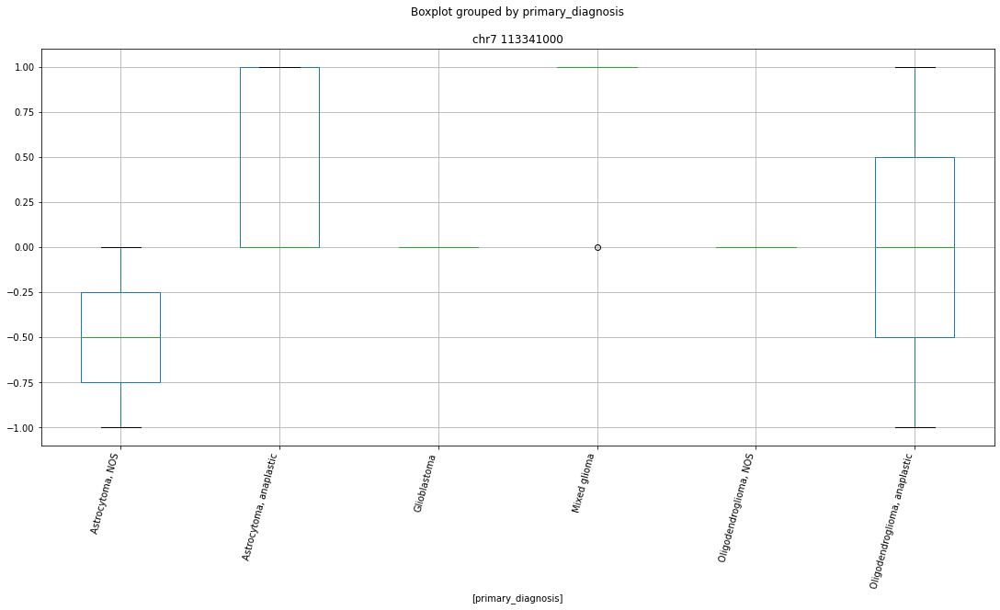

 p : 2.948014870353662e-15  ( t : 12.708265027138834 ) :  chr12 68484000


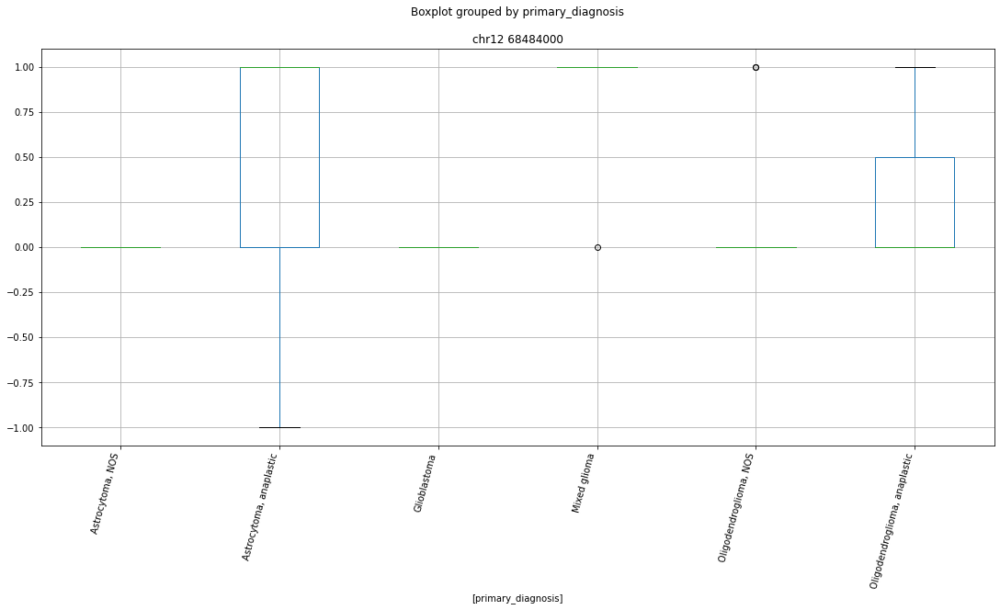

 p : 2.948014870353662e-15  ( t : 12.708265027138834 ) :  chr2 71542000


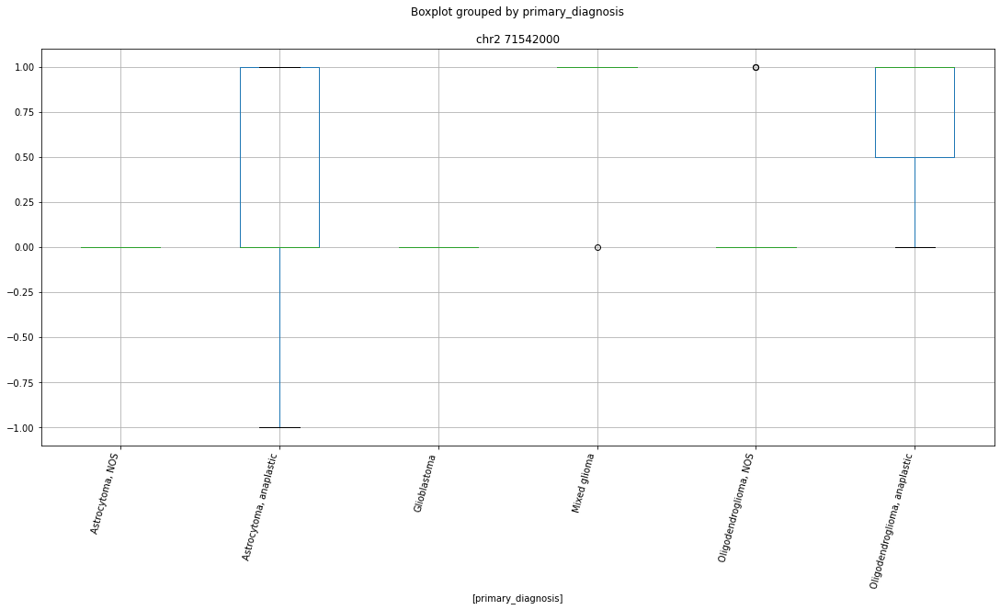

 p : 1.2735213637763693e-13  ( t : 11.358945418727965 ) :  chr3 9592000


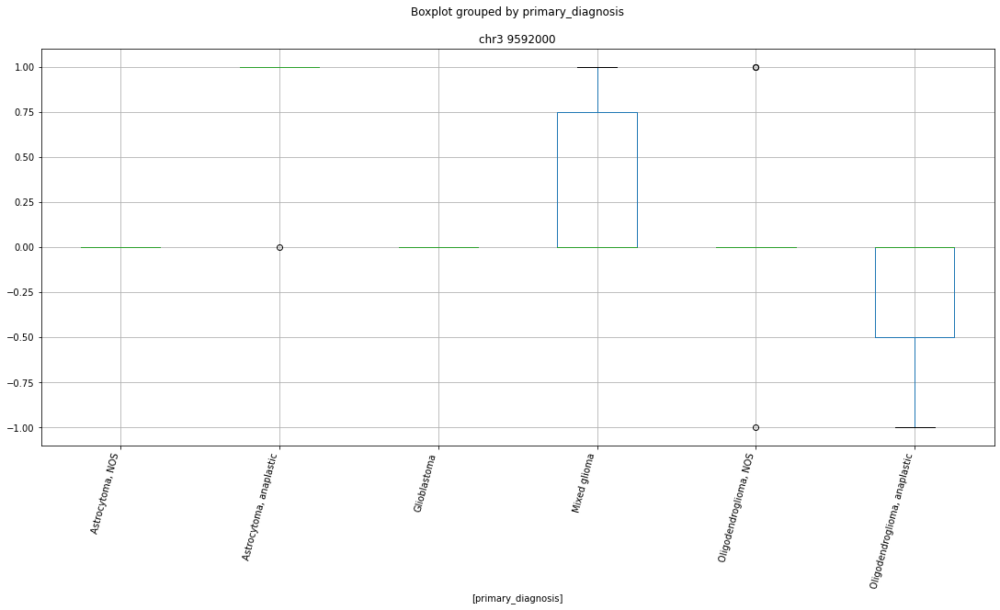

 p : 1.2735213637763693e-13  ( t : 11.358945418727965 ) :  chr12 89867000


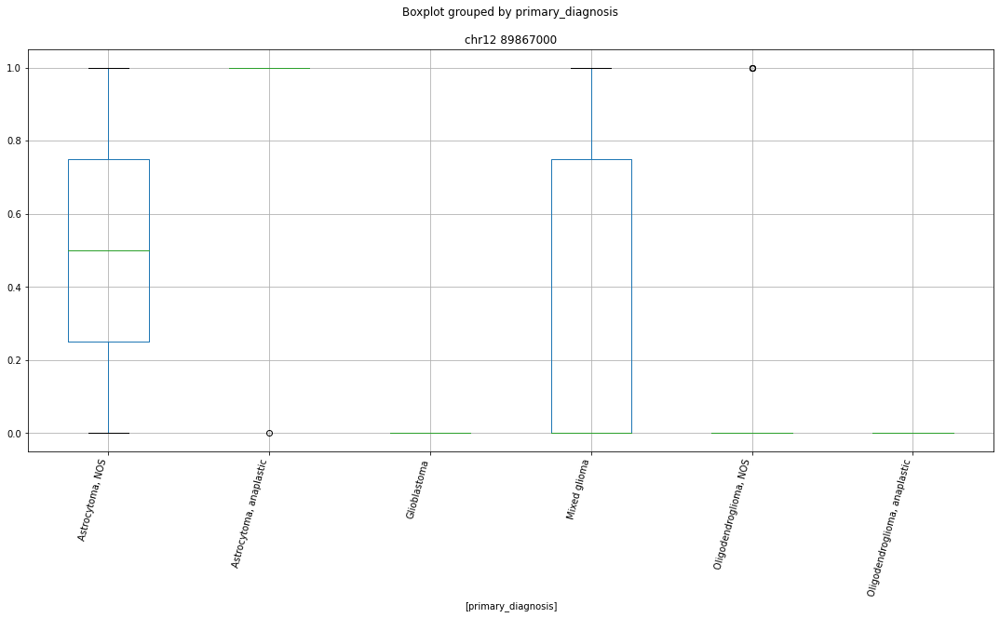

 p : 1.2735213637763693e-13  ( t : 11.358945418727965 ) :  chr17 19519000


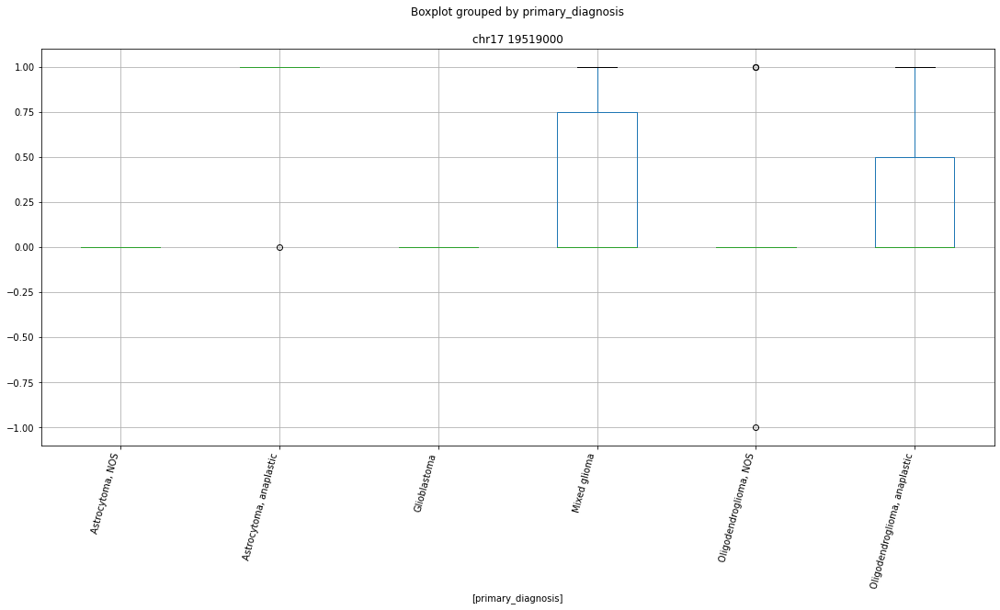

 p : 1.2735213637763693e-13  ( t : 11.358945418727965 ) :  chr3 16979000


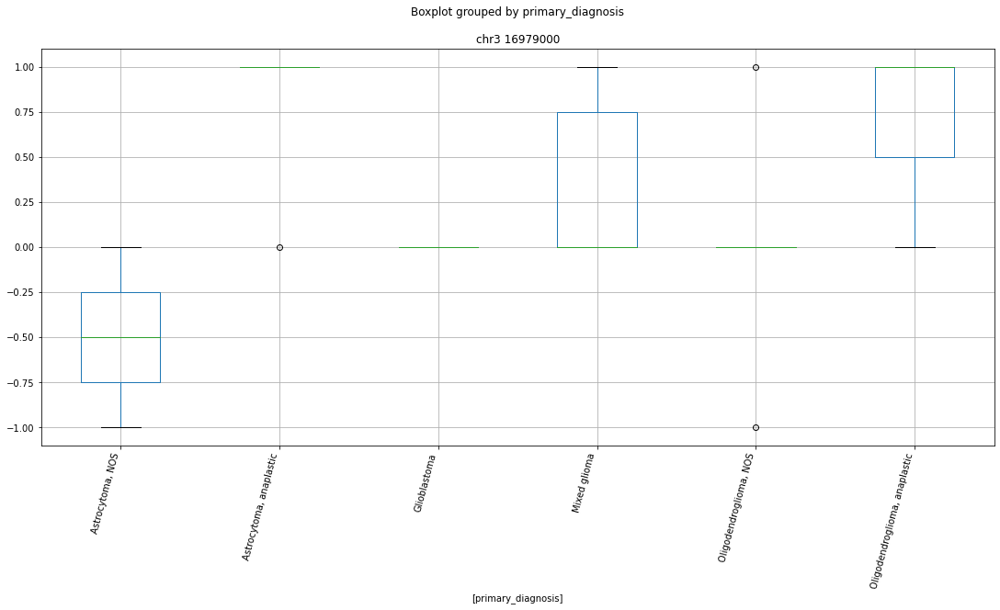

 p : 1.2735213637763693e-13  ( t : 11.358945418727965 ) :  chr3 197602000


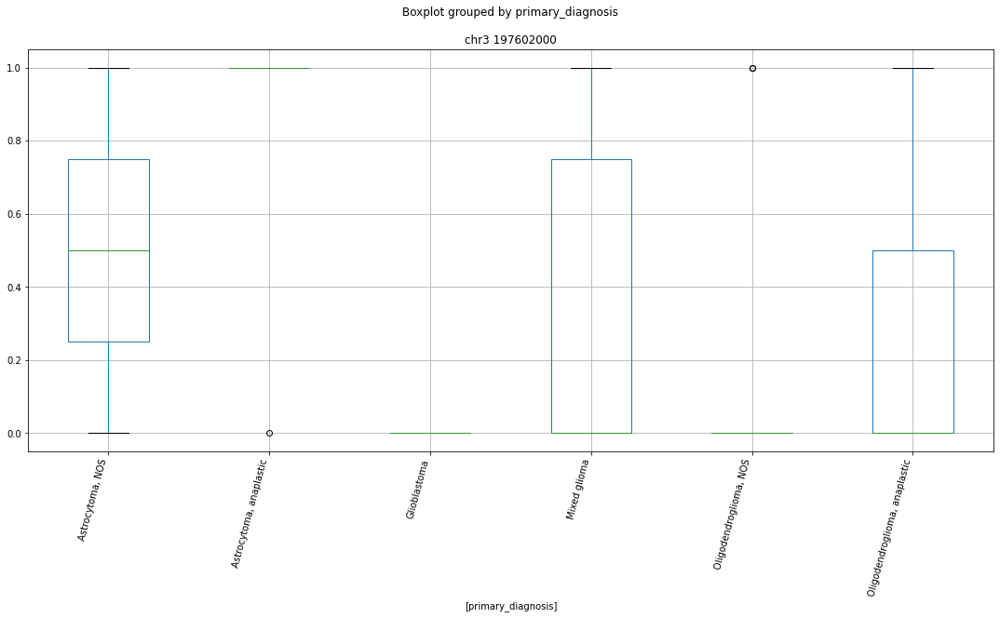

 p : 1.2735213637763693e-13  ( t : 11.358945418727965 ) :  chr7 150506000


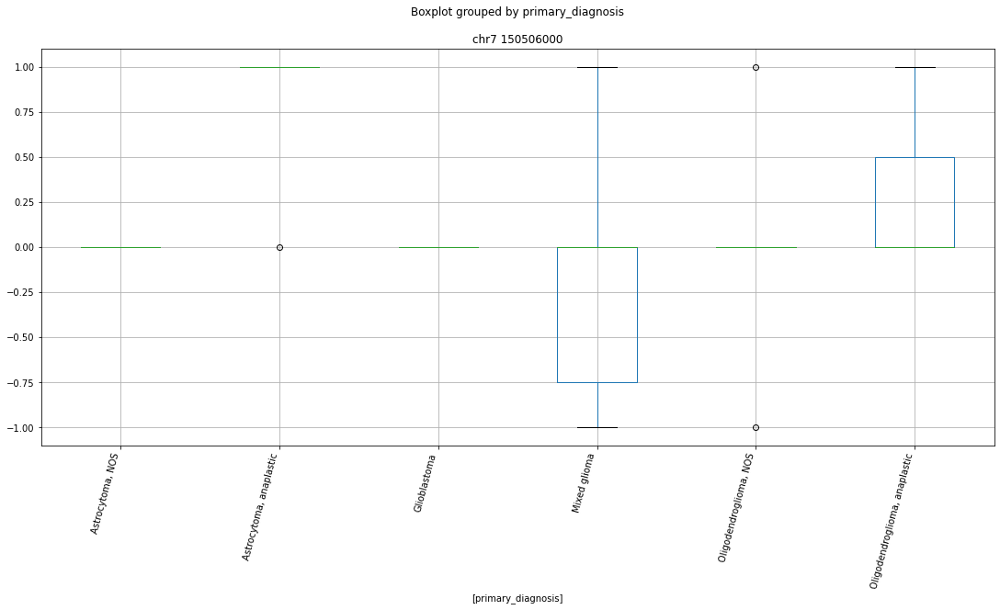

 p : 1.2735213637763784e-13  ( t : 11.358945418727963 ) :  chr1 30346000


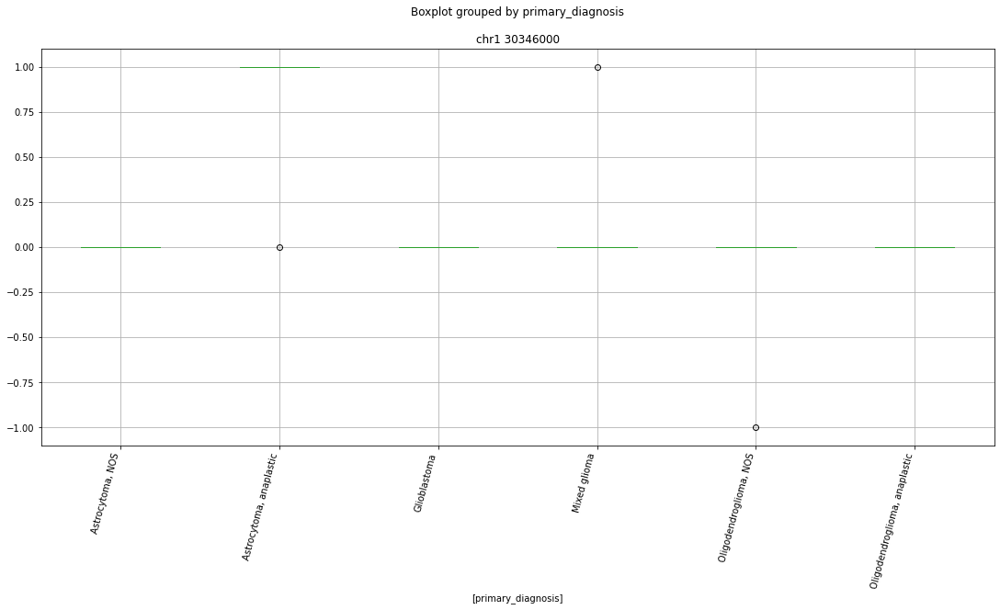

 p : 1.2735213637763784e-13  ( t : 11.358945418727963 ) :  chr11 59700000


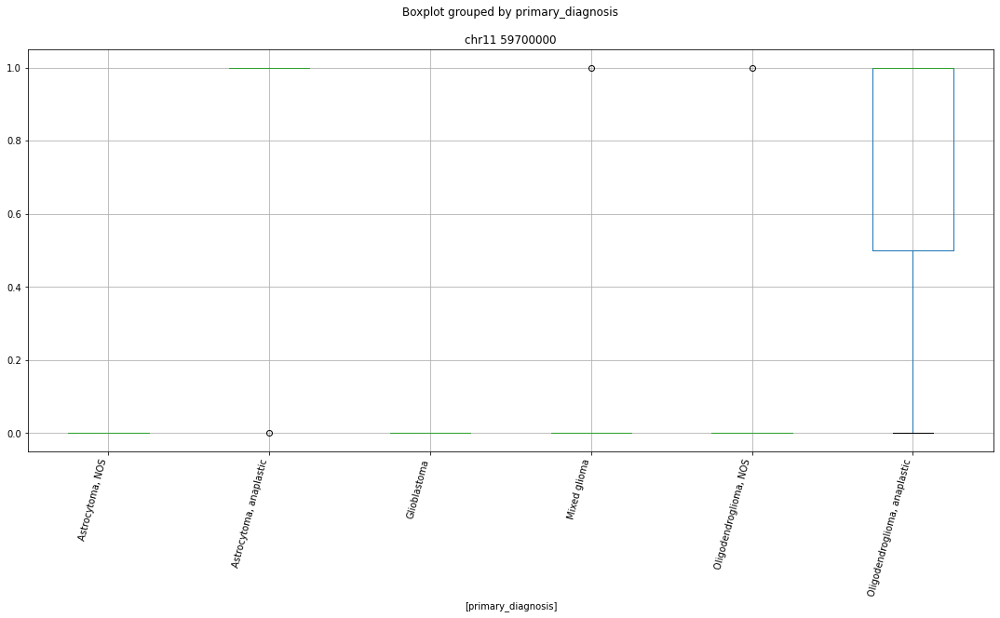

 p : 1.2735213637763784e-13  ( t : 11.358945418727963 ) :  chr19 21486000


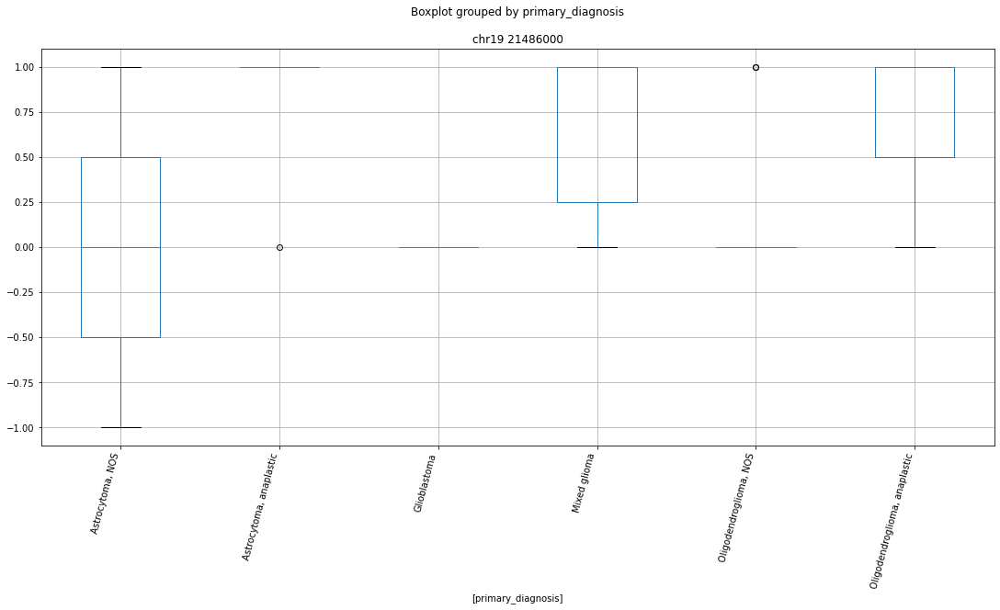

 p : 1.9864071913231304e-11  ( t : 9.677223188944682 ) :  chr10 86032000


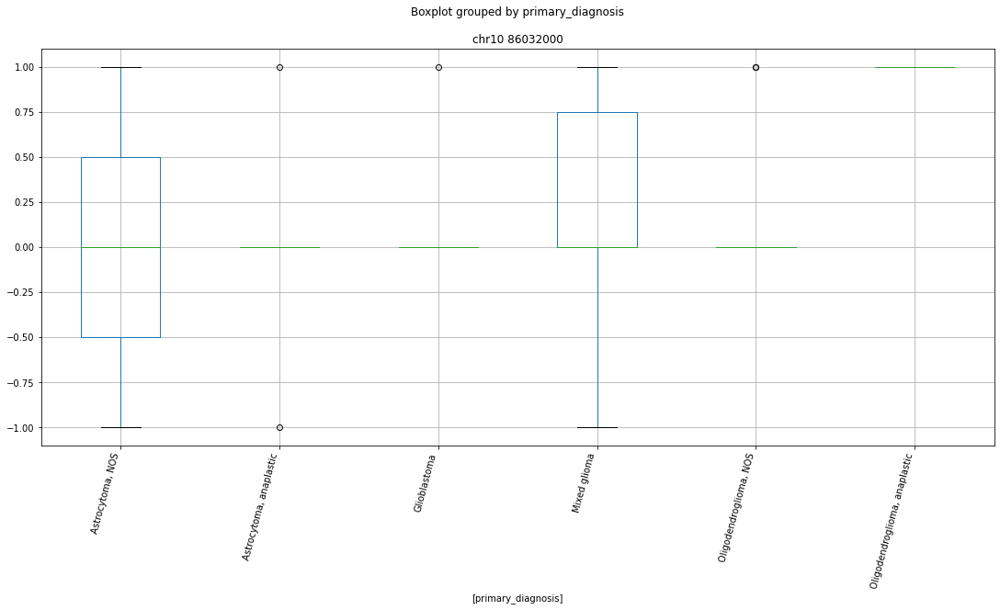

 p : 1.9864071913231304e-11  ( t : 9.677223188944682 ) :  chr8 39650000


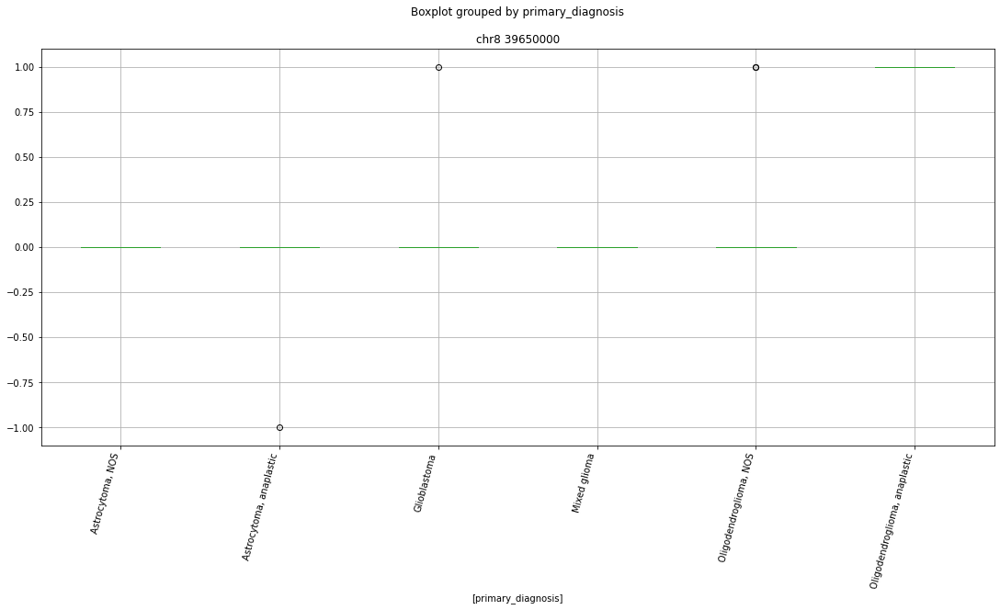

 p : 6.789629778491773e-11  ( t : 10.34741346990838 ) :  chr7 113341000


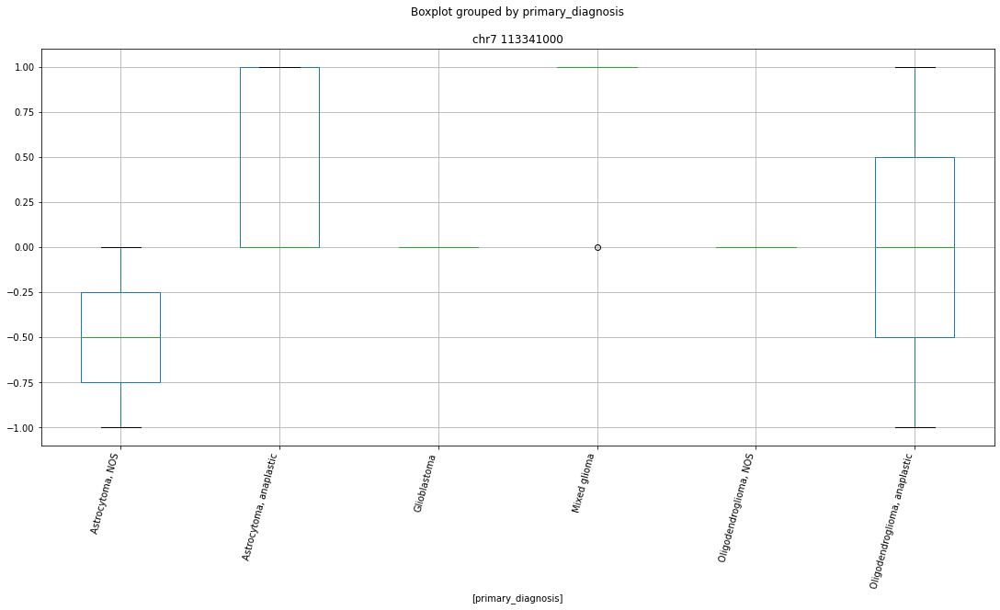

 p : 1.6993364715758493e-10  ( t : 10.106574946185138 ) :  chr17 81618000


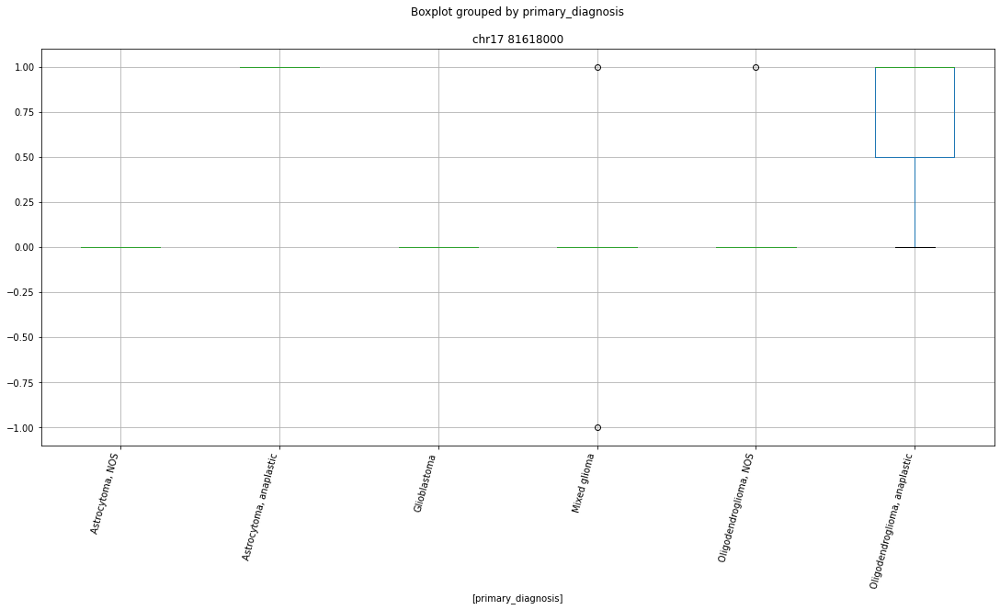

 p : 8.92060821762298e-10  ( t : 8.373639896594856 ) :  chr3 103531000


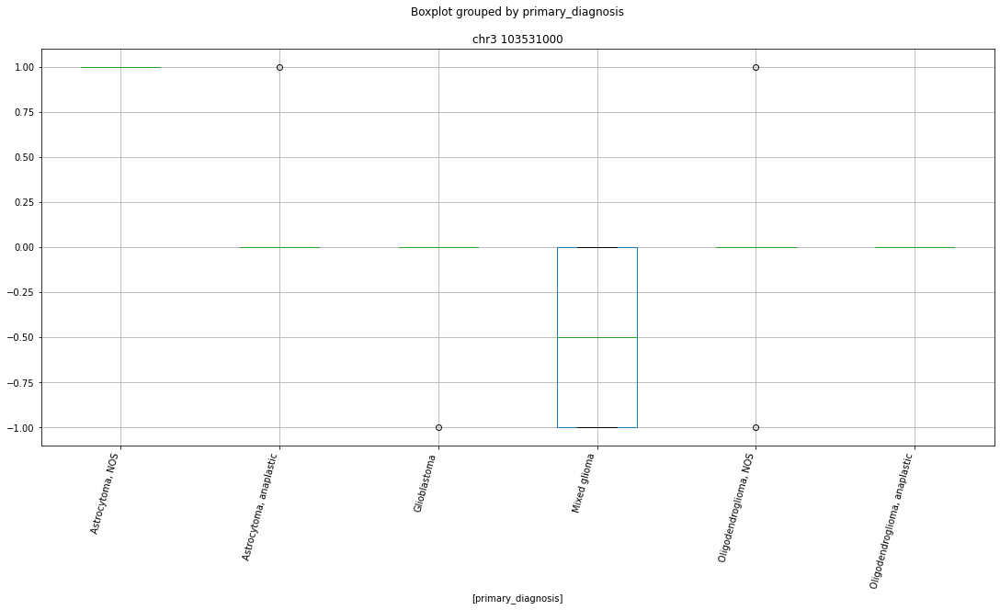

 p : 8.92060821762298e-10  ( t : 8.373639896594856 ) :  chr13 114181000


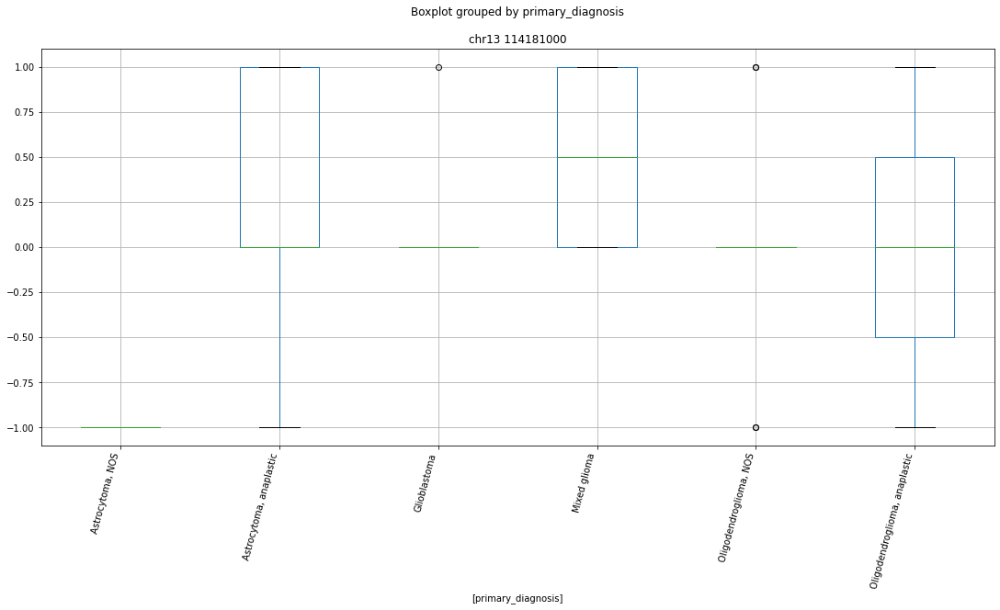

 p : 1.0175569557093286e-09  ( t : 8.037412518964047 ) :  chr3 8440000


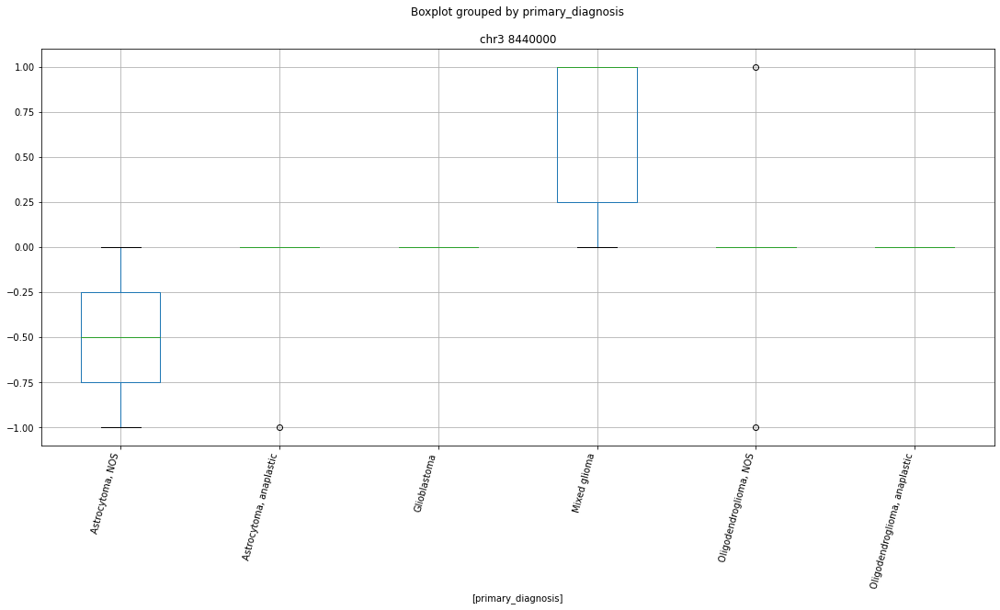

 p : 1.0175569557093286e-09  ( t : 8.037412518964047 ) :  chr5 37012000


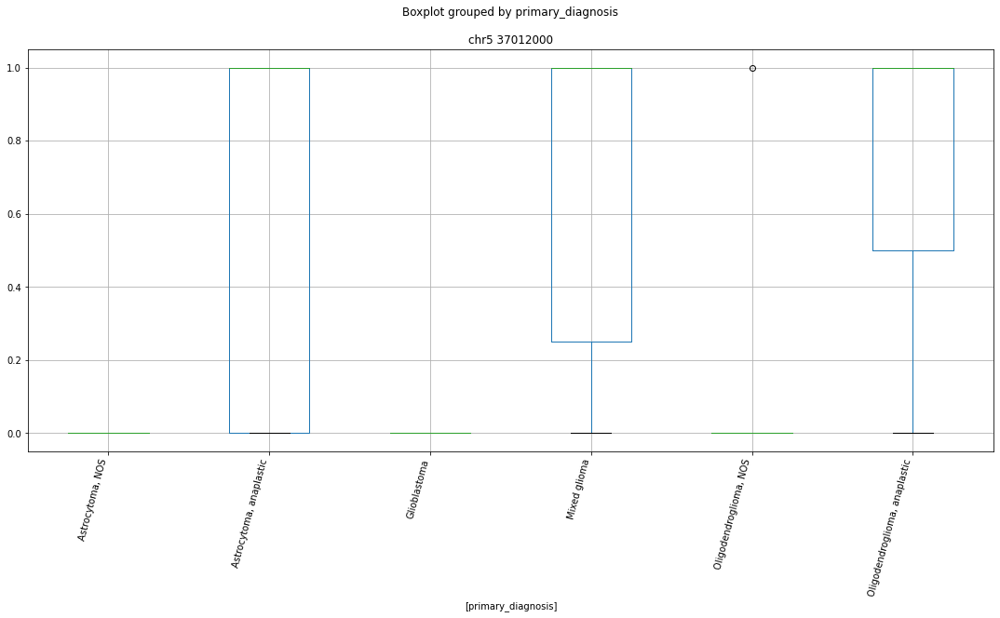

 p : 1.0175569557093286e-09  ( t : 8.037412518964047 ) :  chrX 55749000


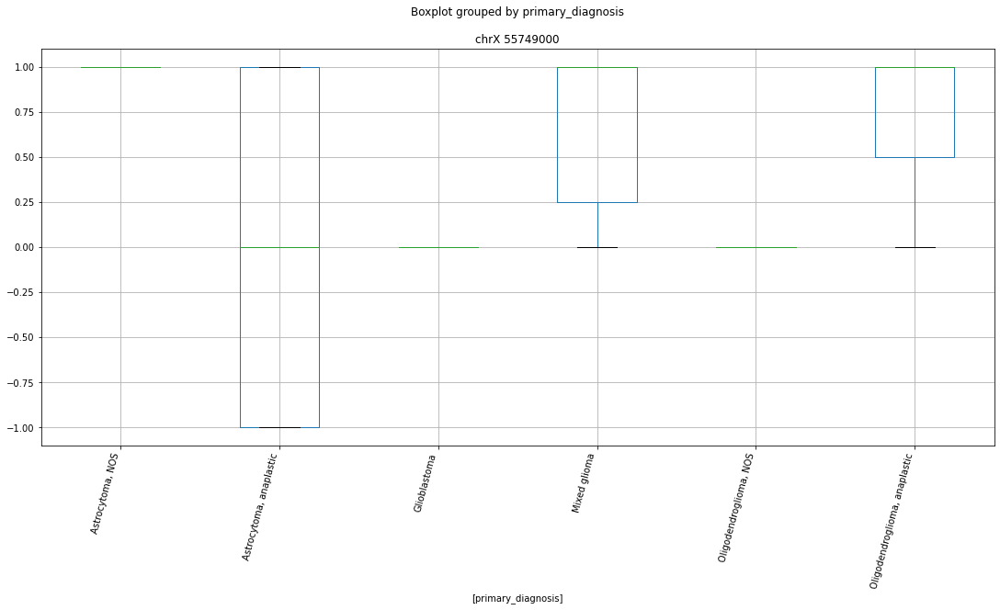

 p : 1.0175569557093286e-09  ( t : 8.037412518964047 ) :  chr15 80647000


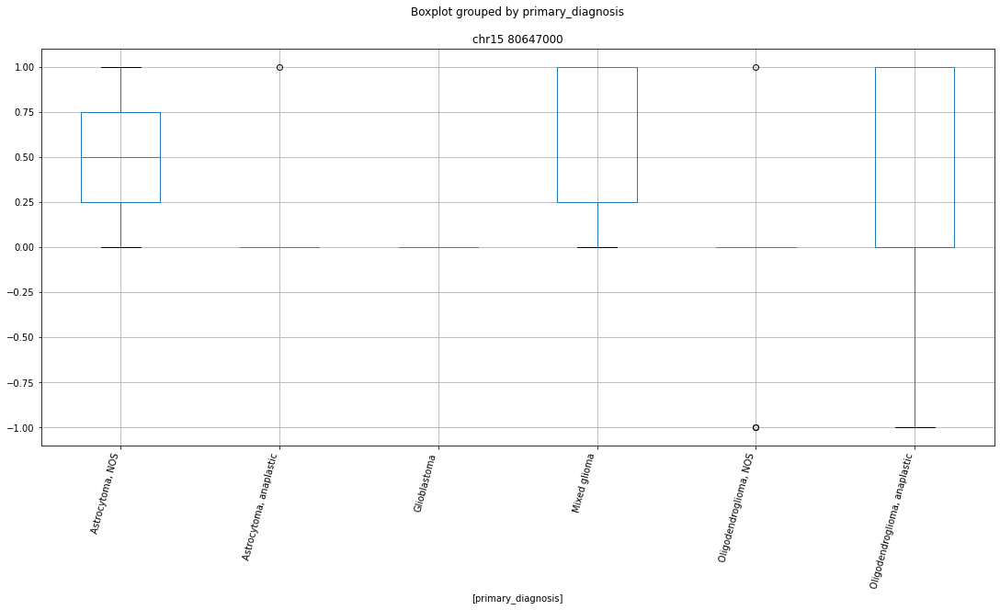

 p : 1.0175569557093286e-09  ( t : 8.037412518964047 ) :  chr5 179650000


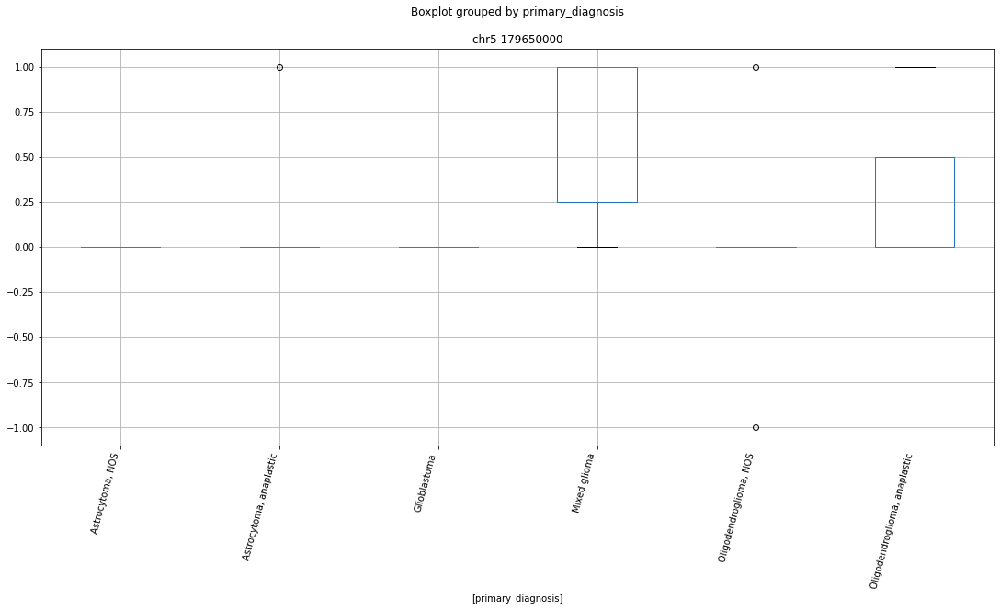

 p : 1.0175569557093286e-09  ( t : 8.037412518964047 ) :  chr1 37897000


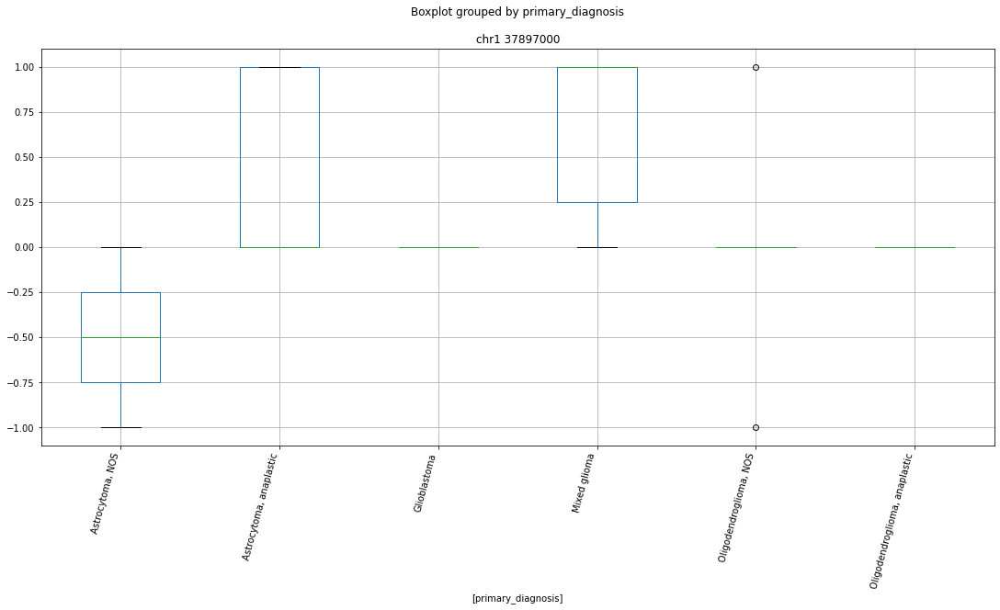

 p : 1.0175569557093286e-09  ( t : 8.037412518964047 ) :  chr19 23936000


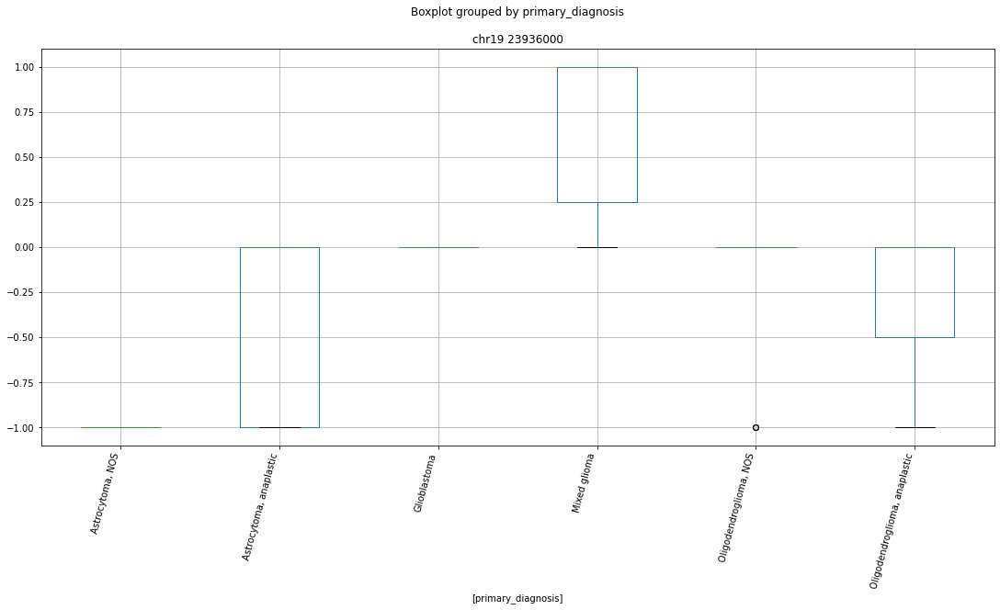

 p : 1.0175569557093286e-09  ( t : 8.037412518964047 ) :  chr16 66955000


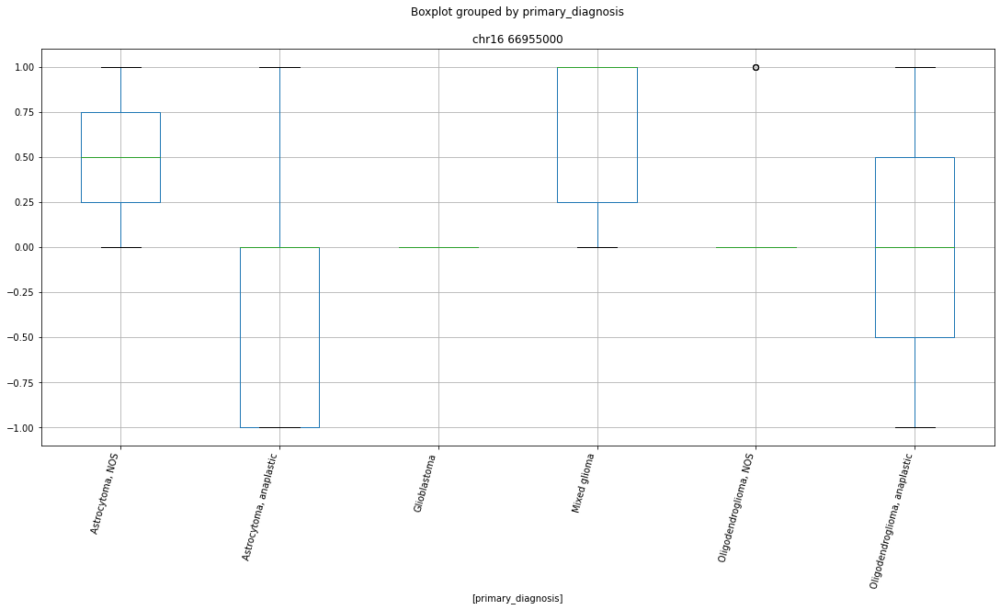

 p : 1.0175569557093286e-09  ( t : 8.037412518964047 ) :  chr1 111529000


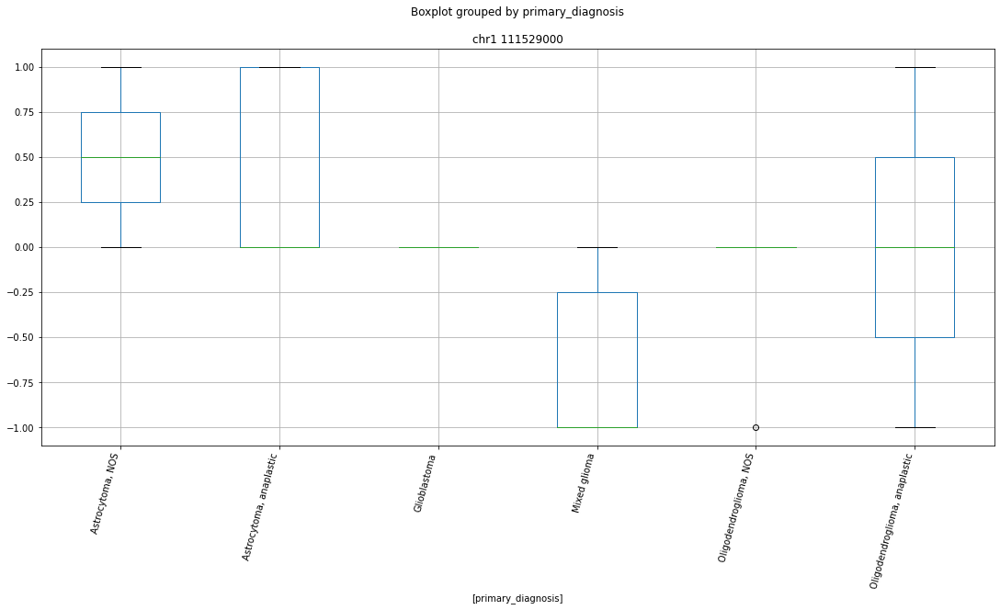

 p : 1.0175569557093286e-09  ( t : 8.037412518964047 ) :  chr1 6304000


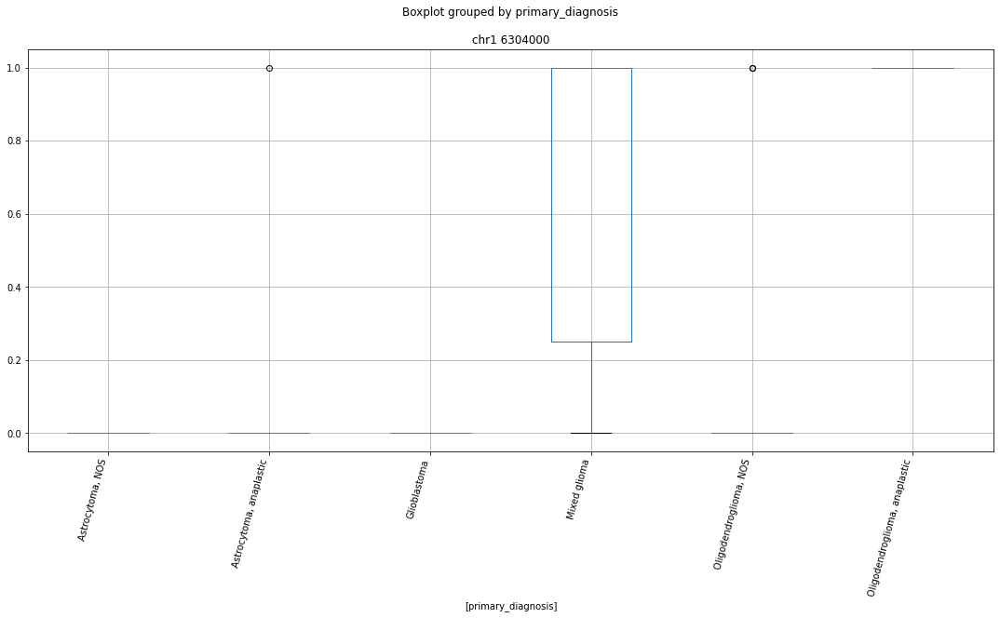

 p : 1.0175569557093286e-09  ( t : 8.037412518964047 ) :  chr17 4578000


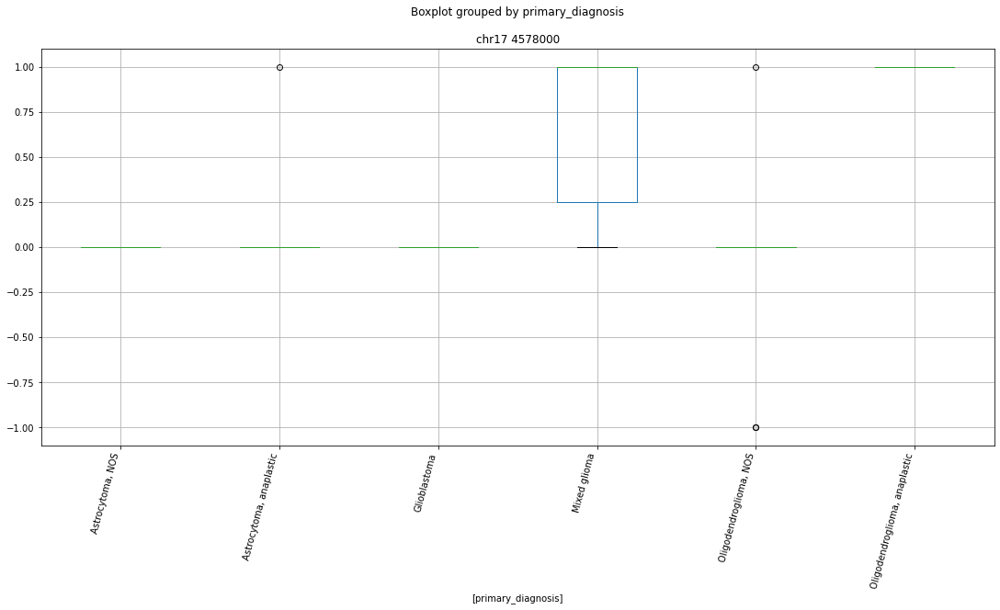

 p : 1.0175569557093286e-09  ( t : 8.037412518964047 ) :  chr11 74353000


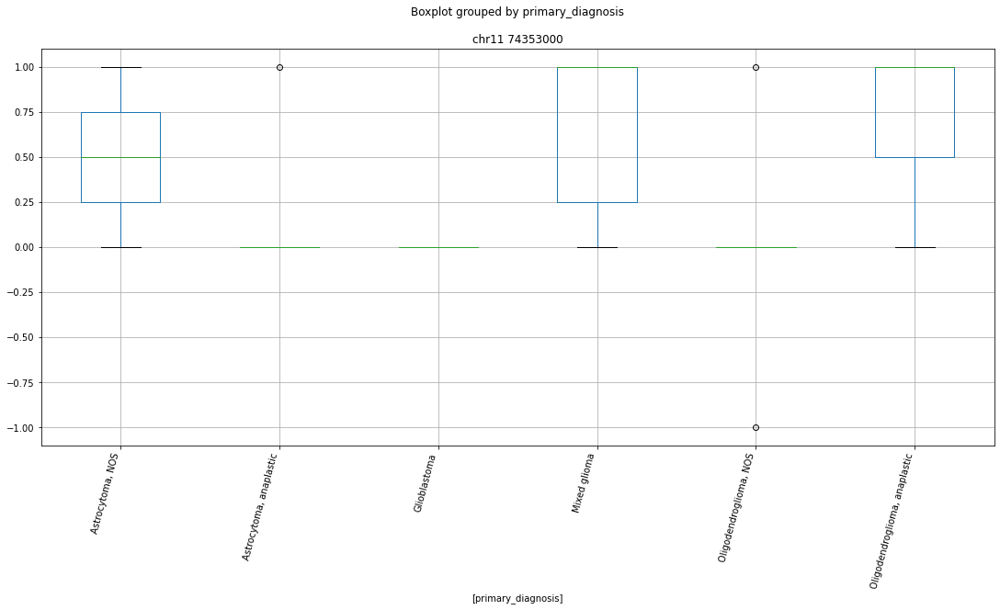

 p : 1.0175569557093286e-09  ( t : 8.037412518964047 ) :  chr9 29188000


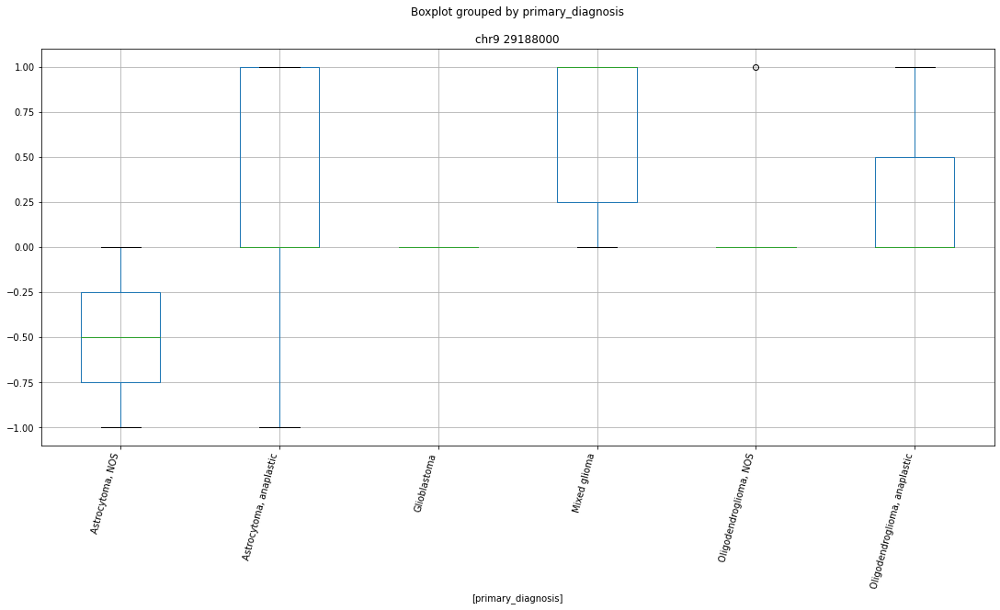

 p : 1.0175569557093286e-09  ( t : 8.037412518964047 ) :  chr1 46321000


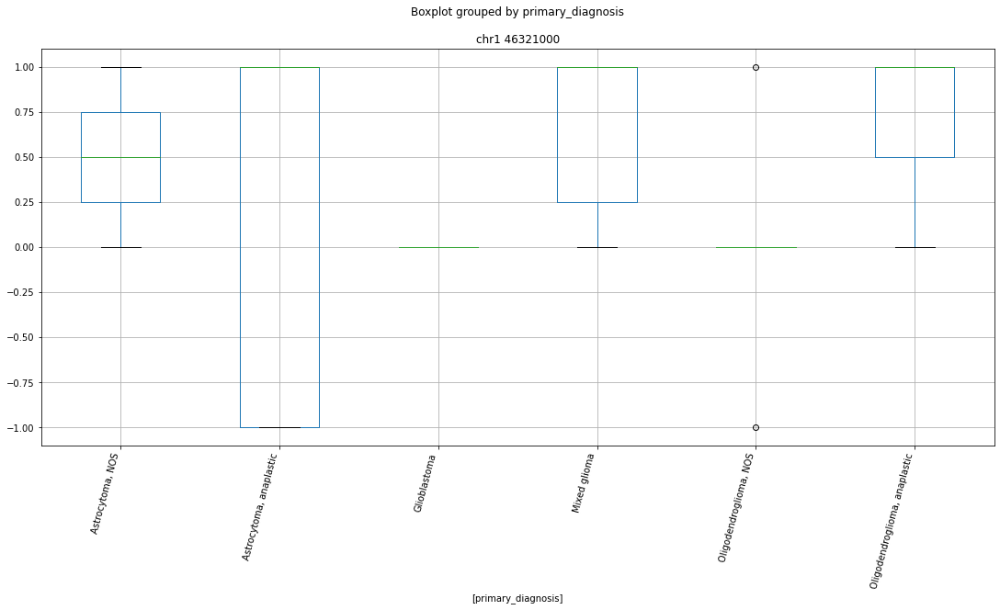

 p : 1.0175569557093286e-09  ( t : 8.037412518964047 ) :  chr20 25551000


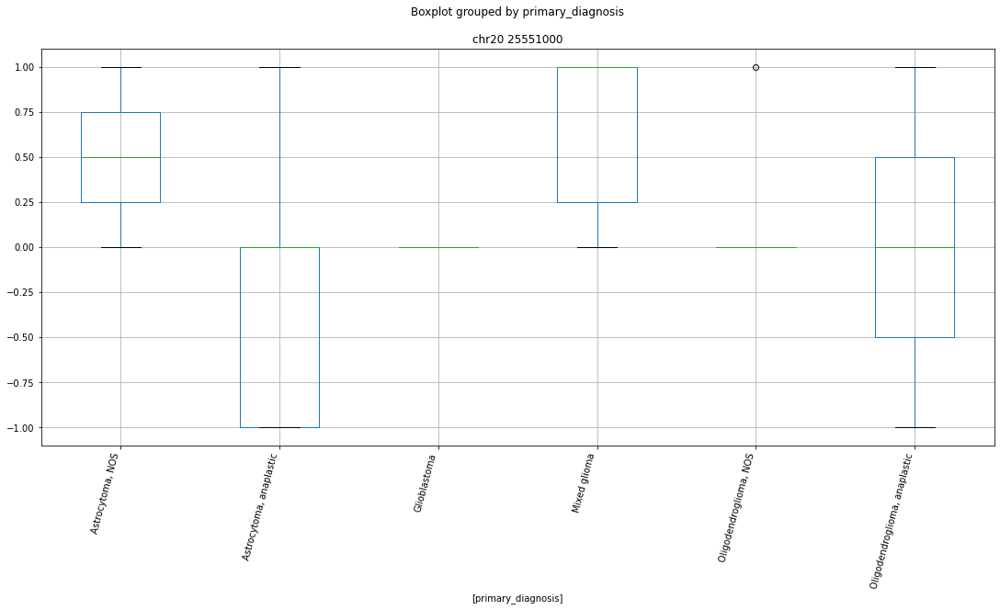

 p : 1.0175569557093286e-09  ( t : 8.037412518964047 ) :  chr11 8523000


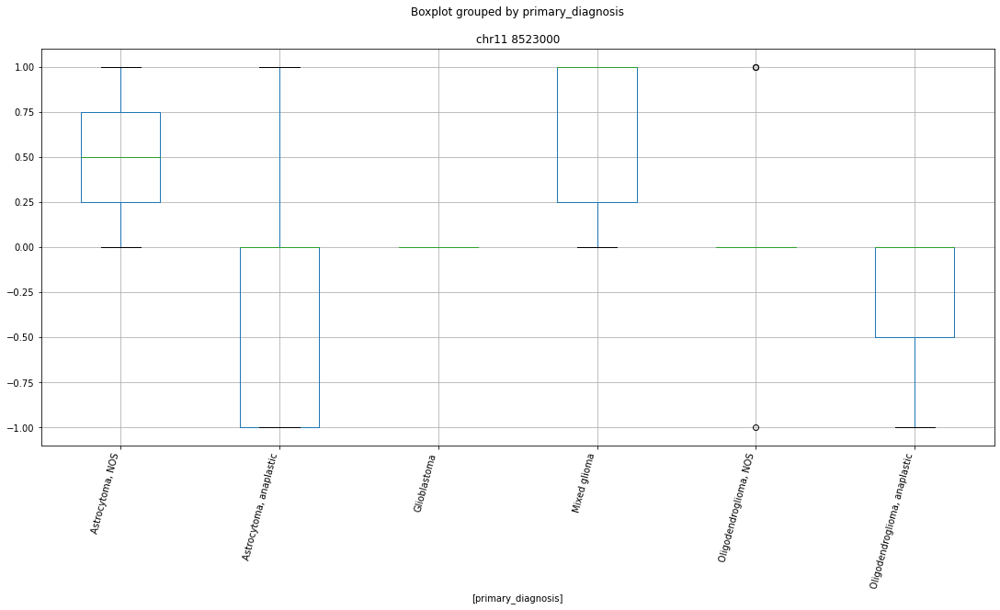

 p : 1.0175569557093286e-09  ( t : 8.037412518964047 ) :  chr19 21486000


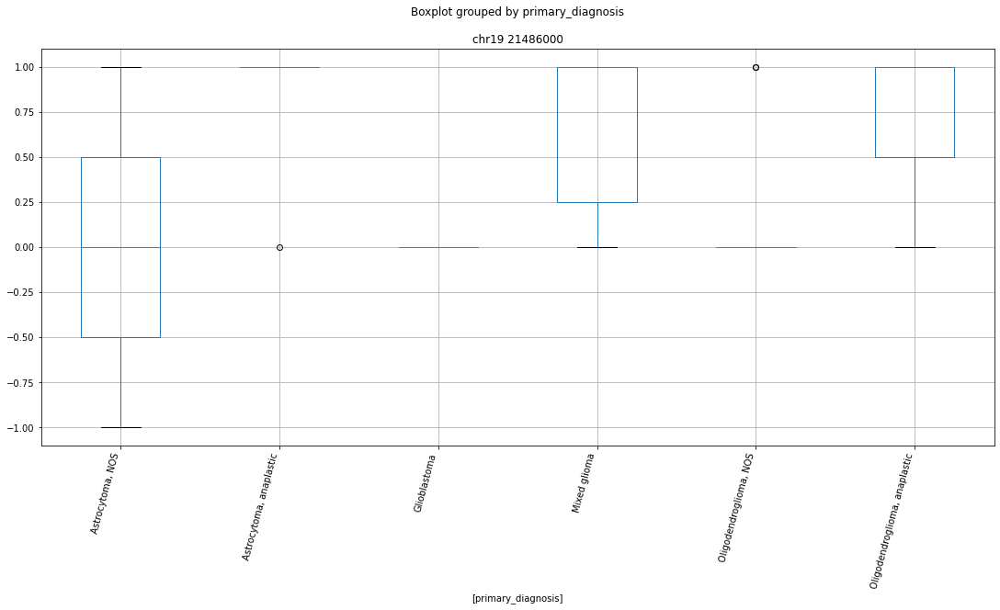

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr7 32754000


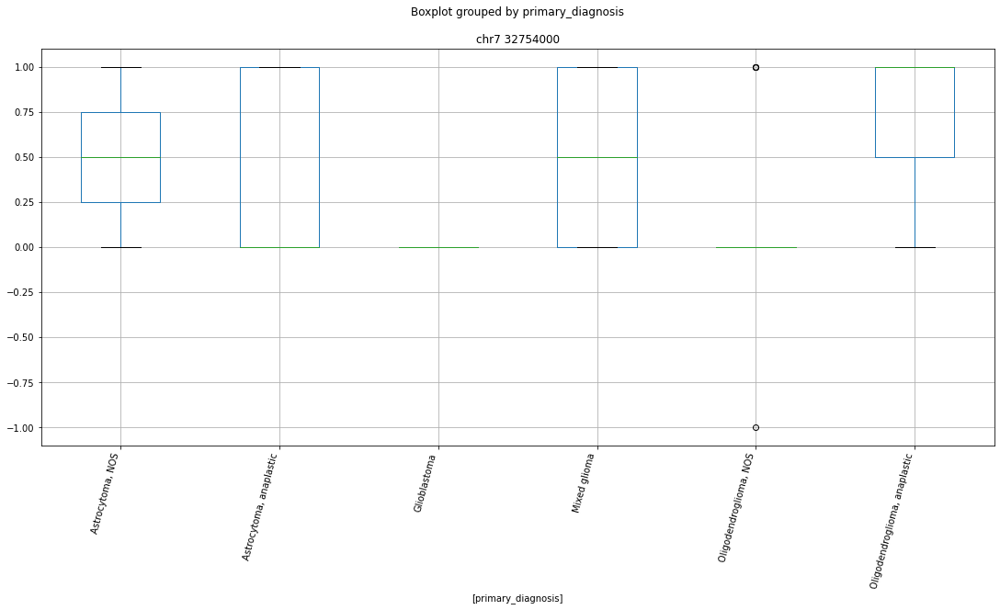

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr2 55651000


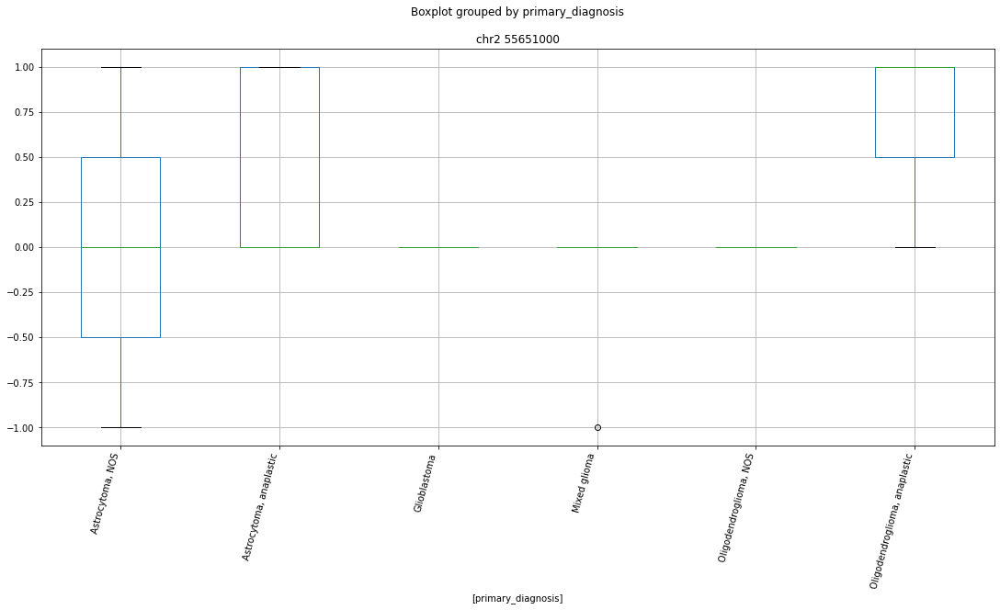

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr7 26148000


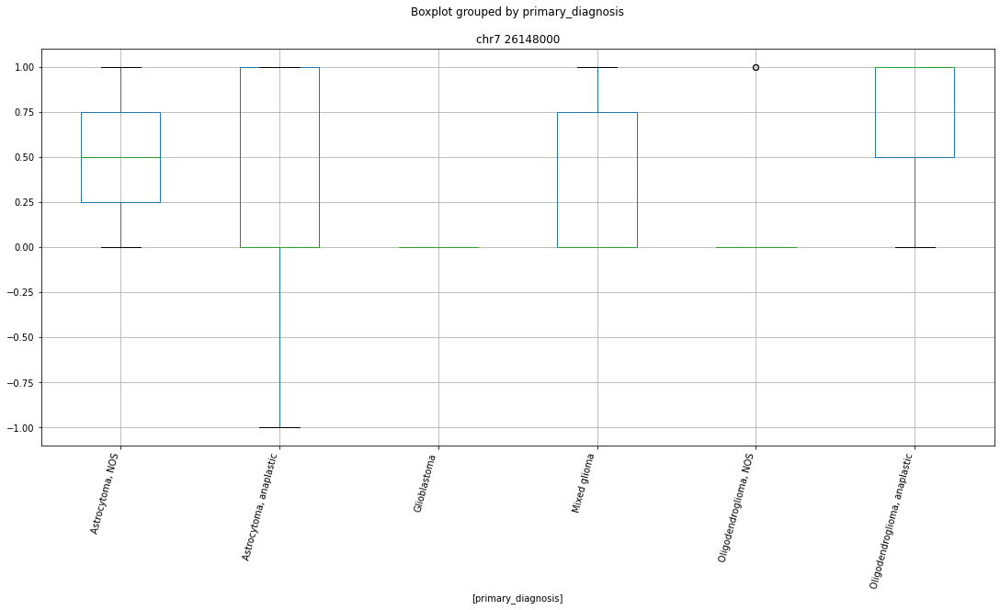

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr1 247220000


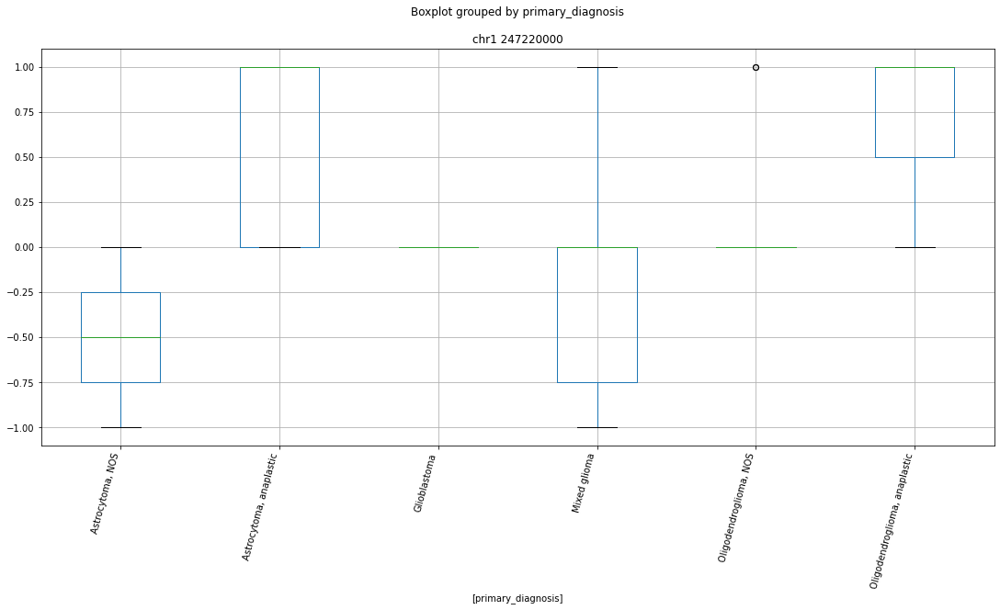

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr1 234267000


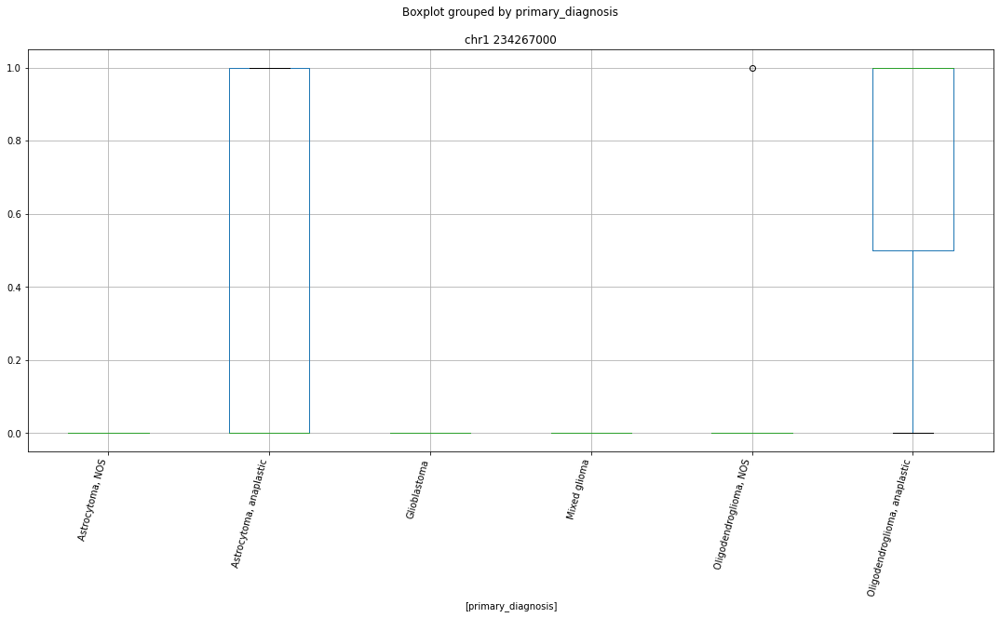

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr2 95243000


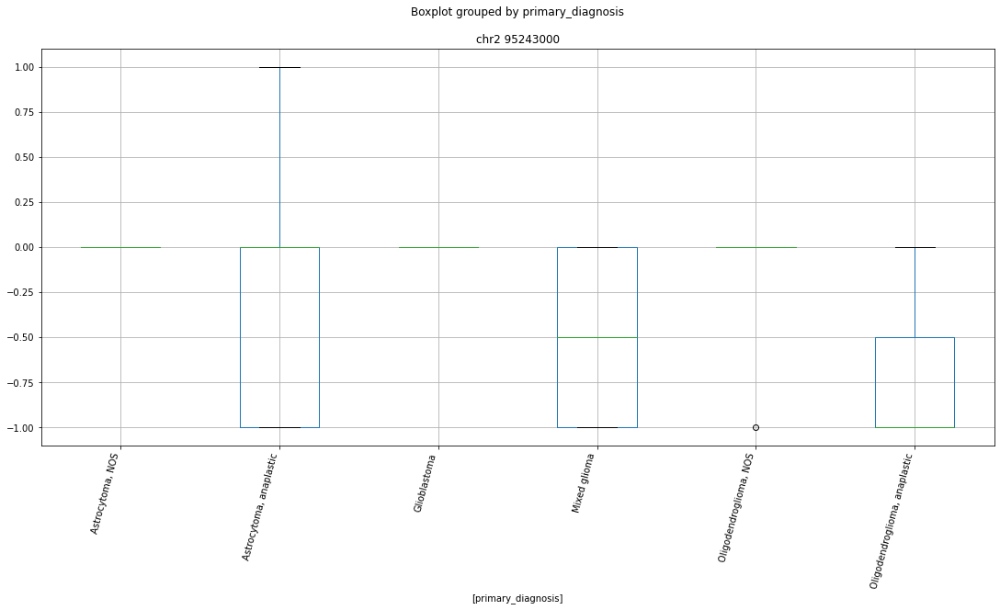

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr1 86899000


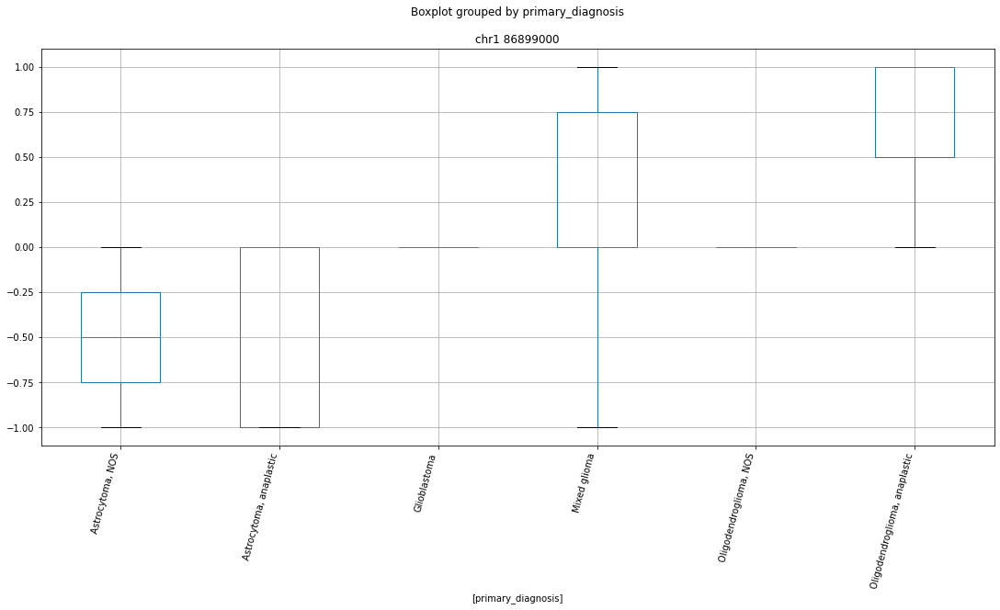

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr2 65600000


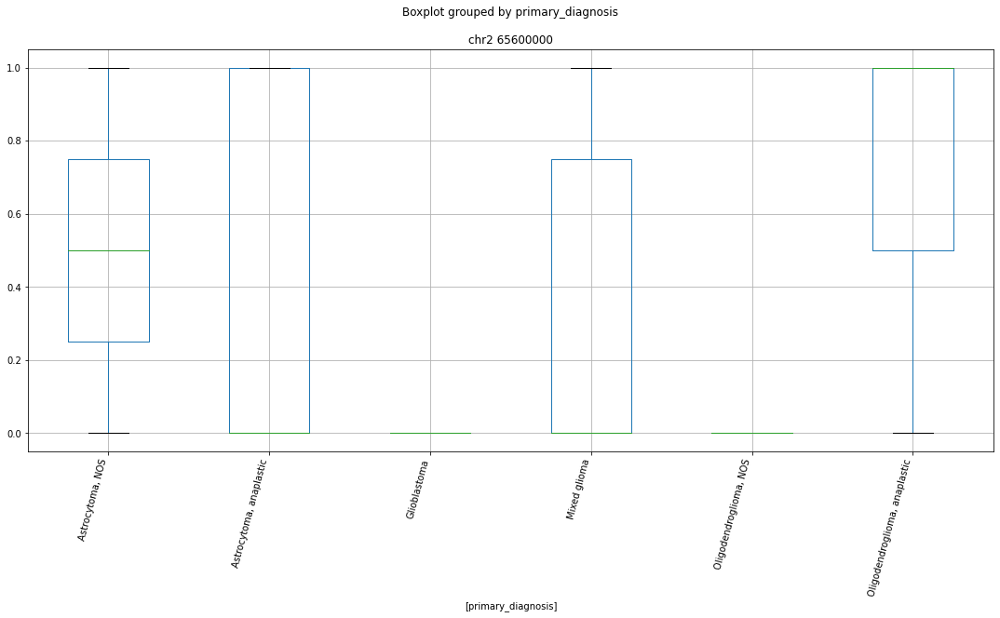

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr2 71542000


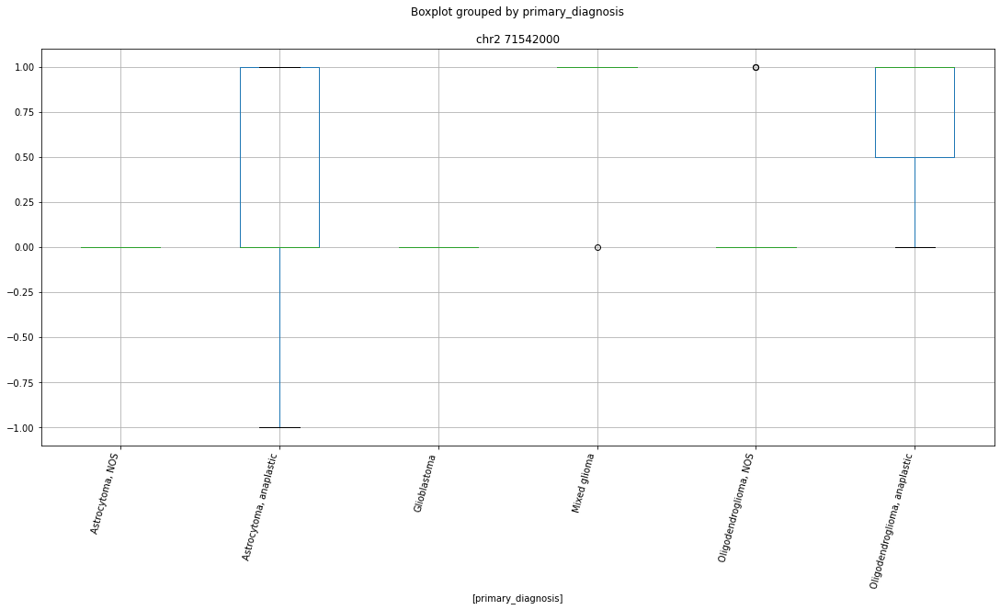

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr7 28839000


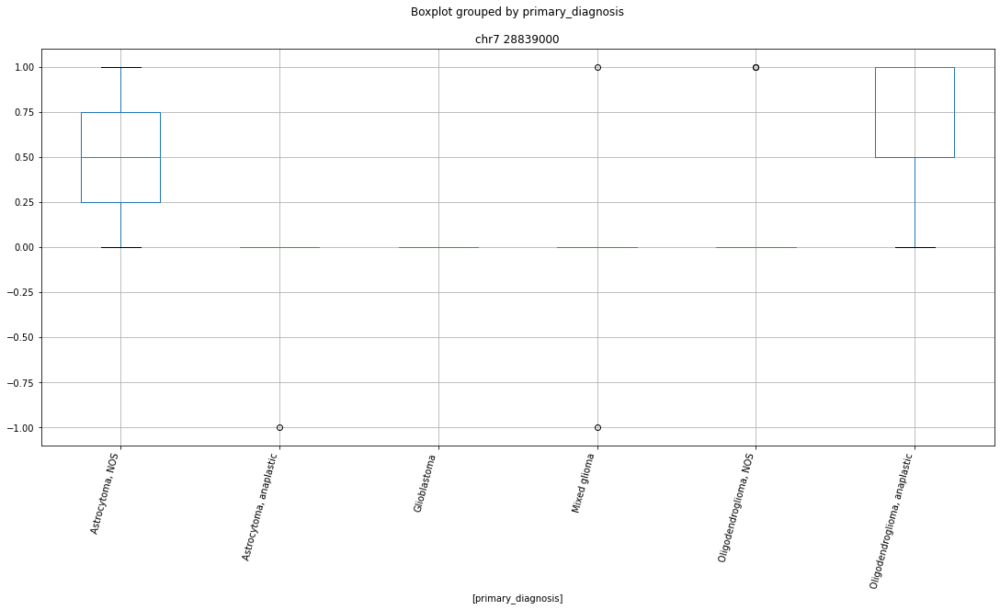

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr2 75725000


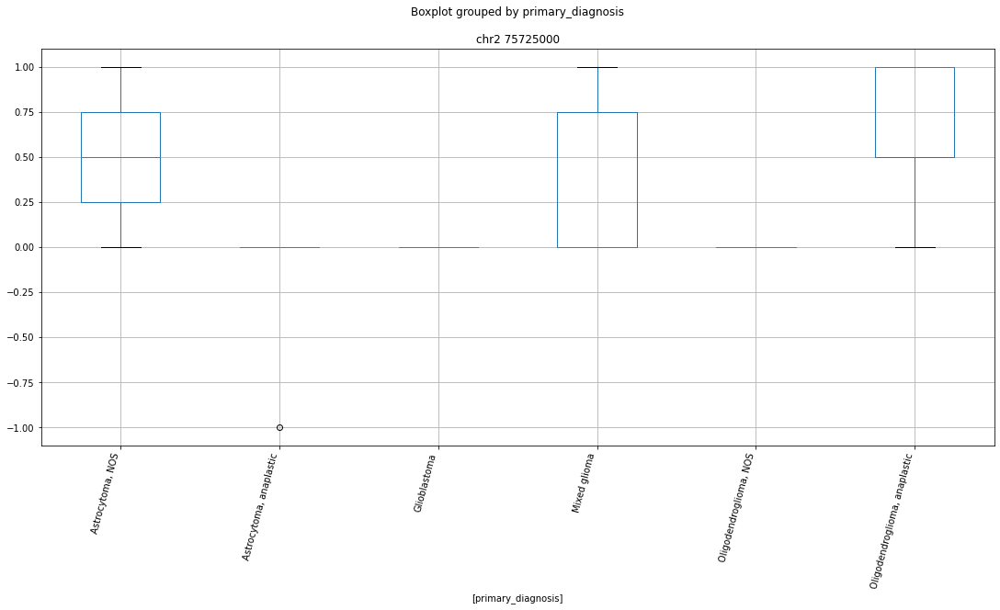

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr7 4624000


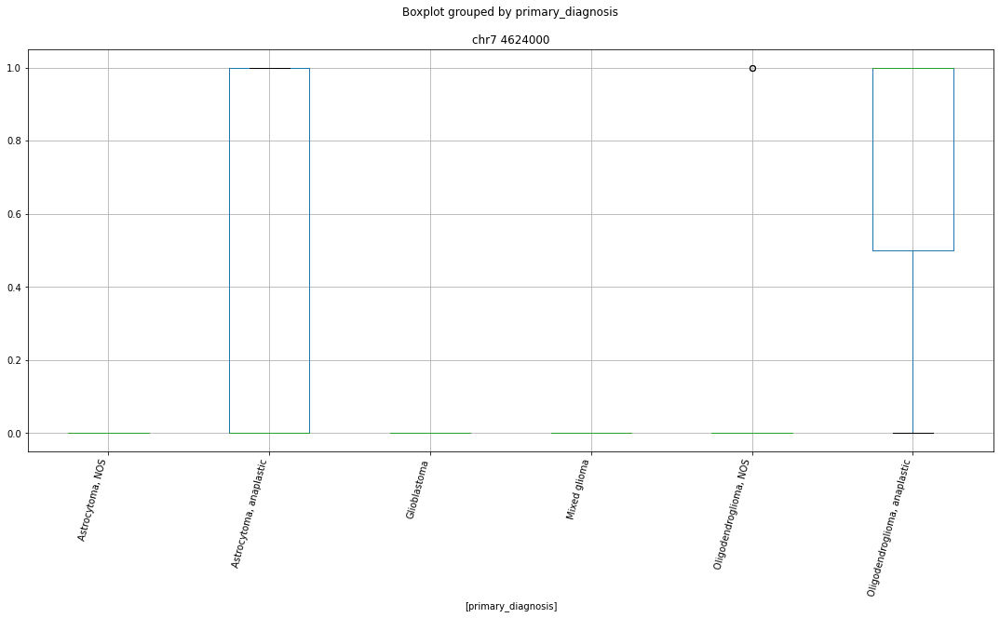

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr7 23045000


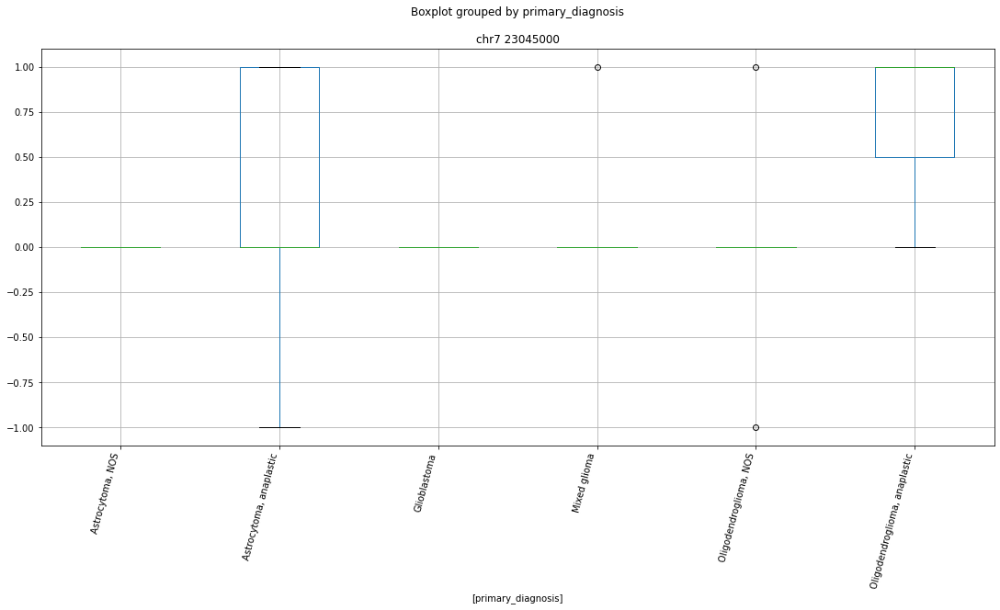

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr10 42138000


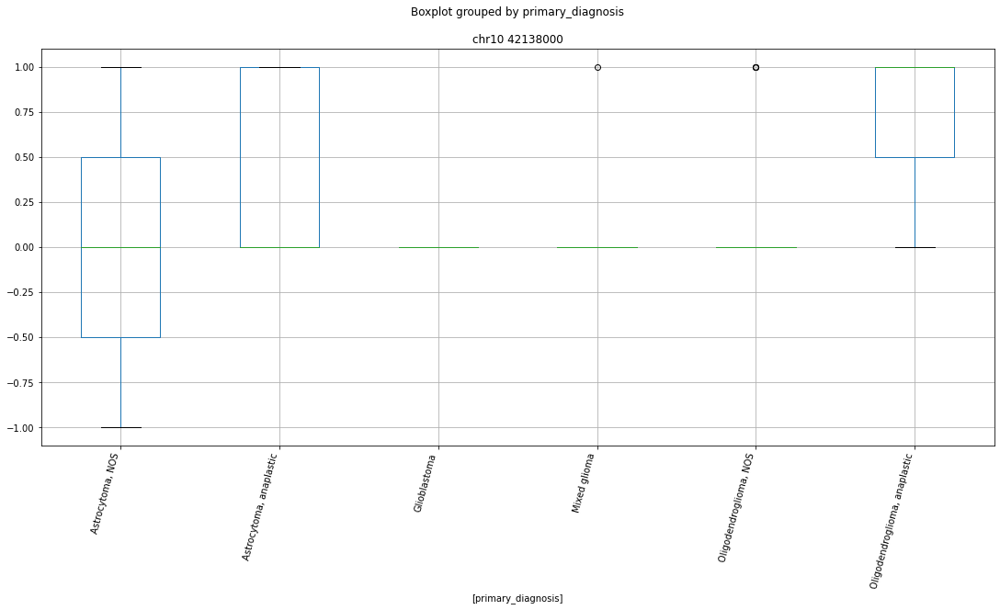

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr19 54214000


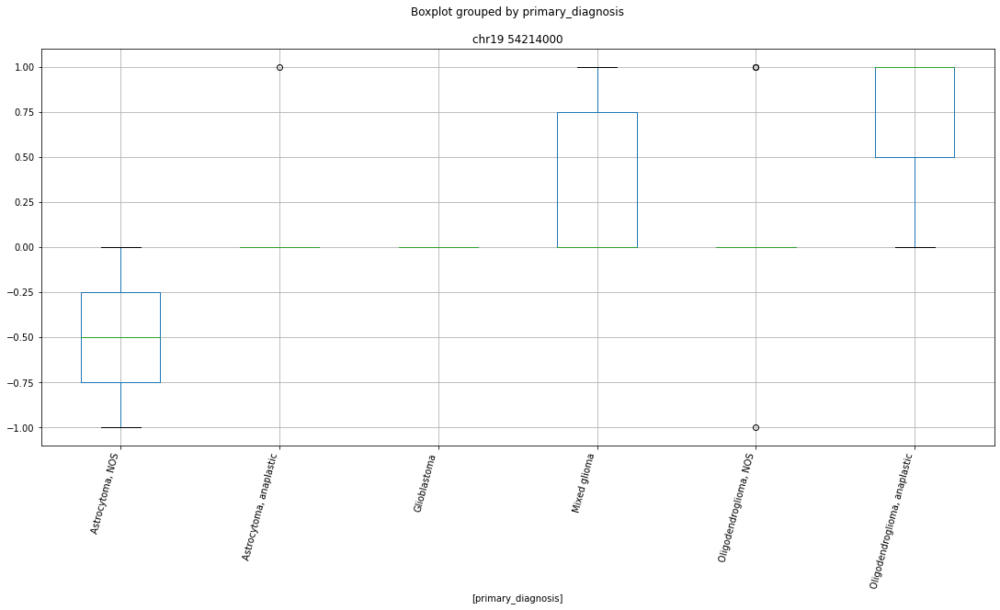

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr18 512000


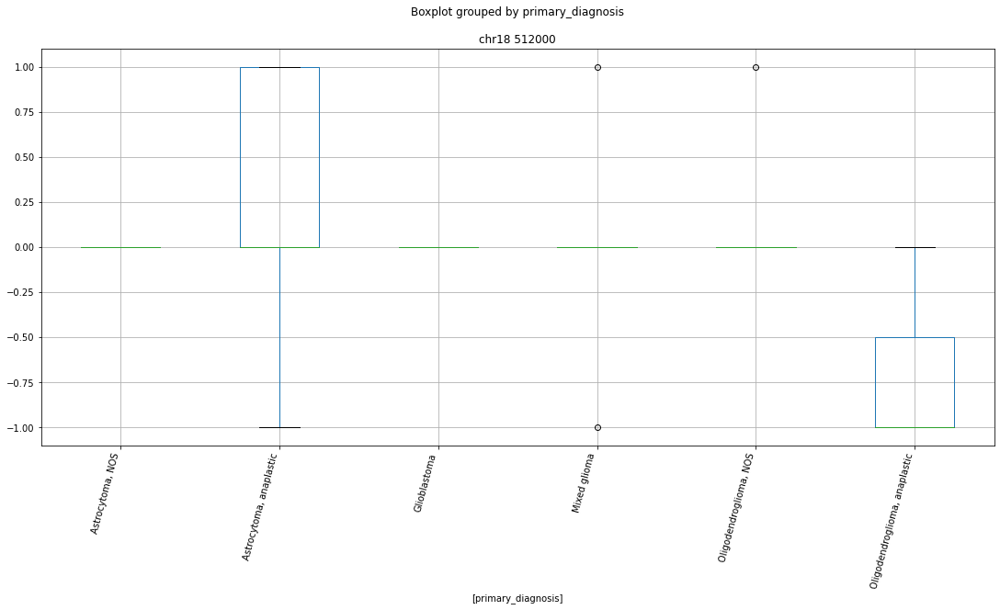

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr8 37928000


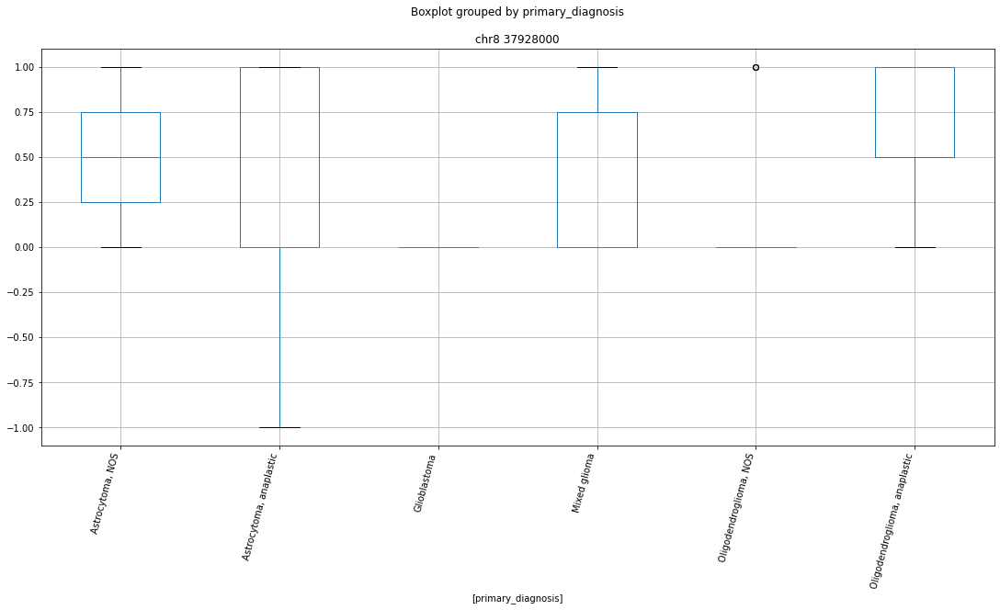

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr19 8315000


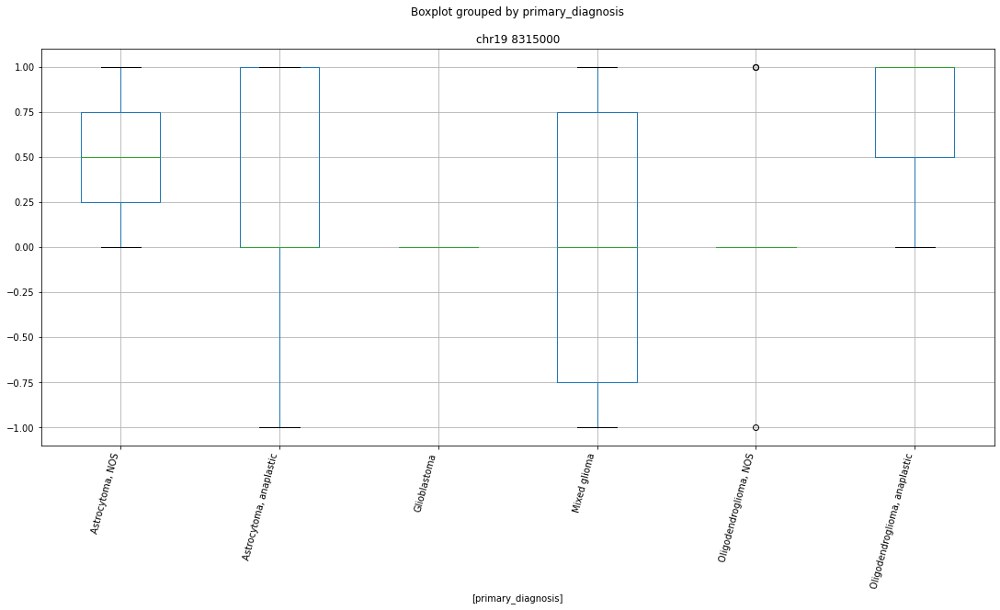

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr19 19961000


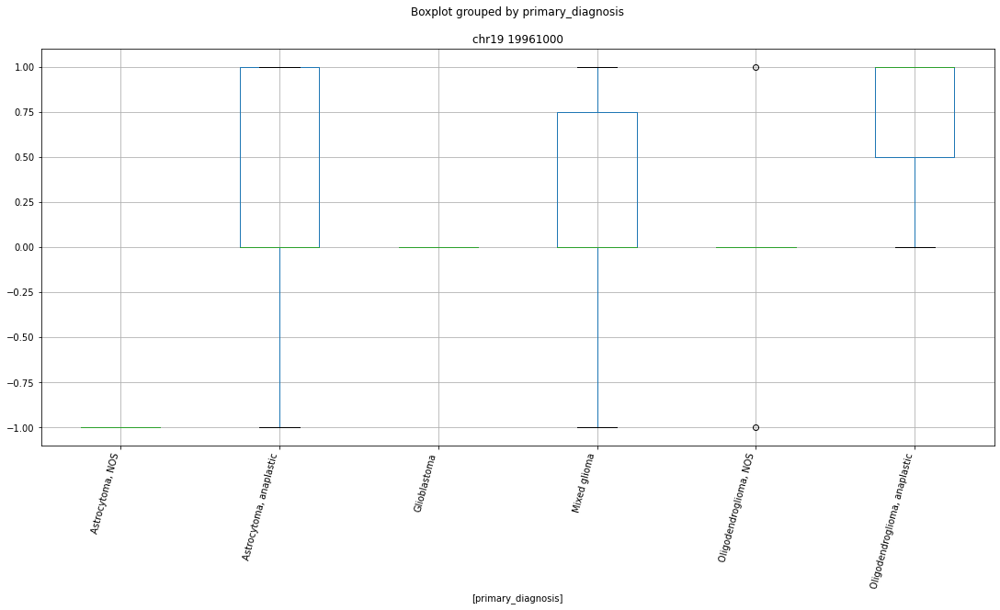

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr1 46321000


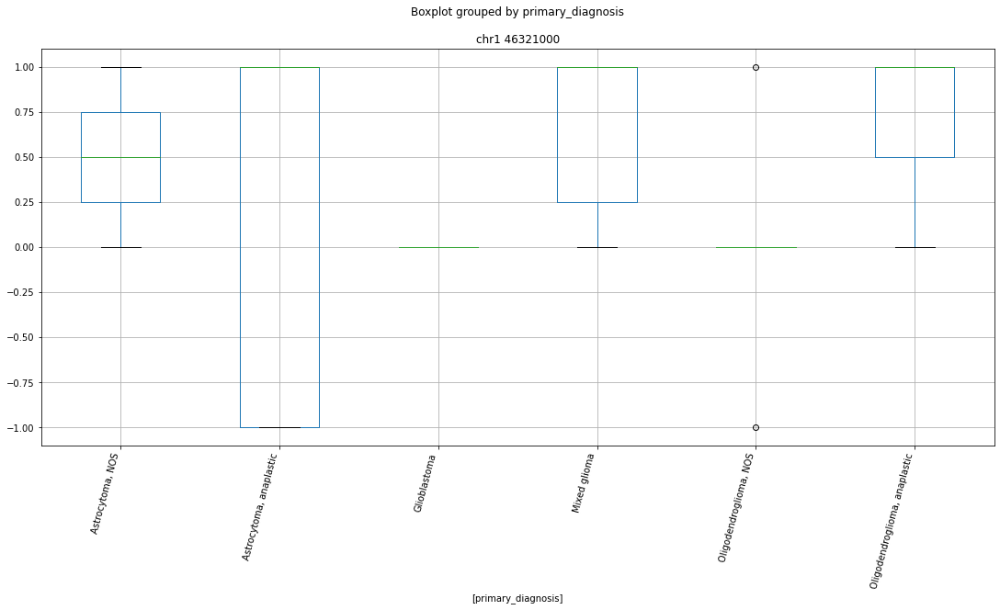

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr8 5725000


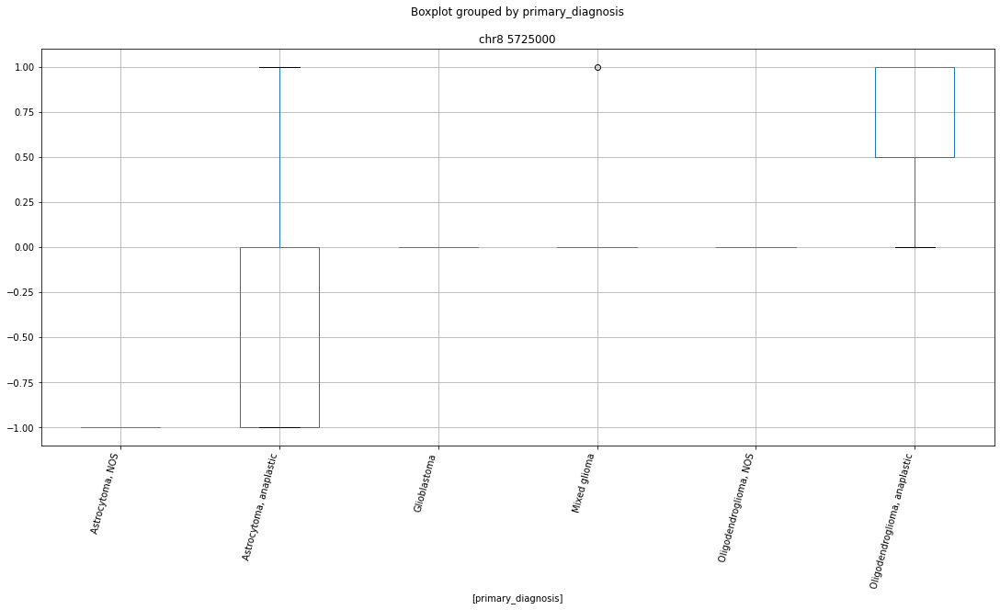

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr10 87081000


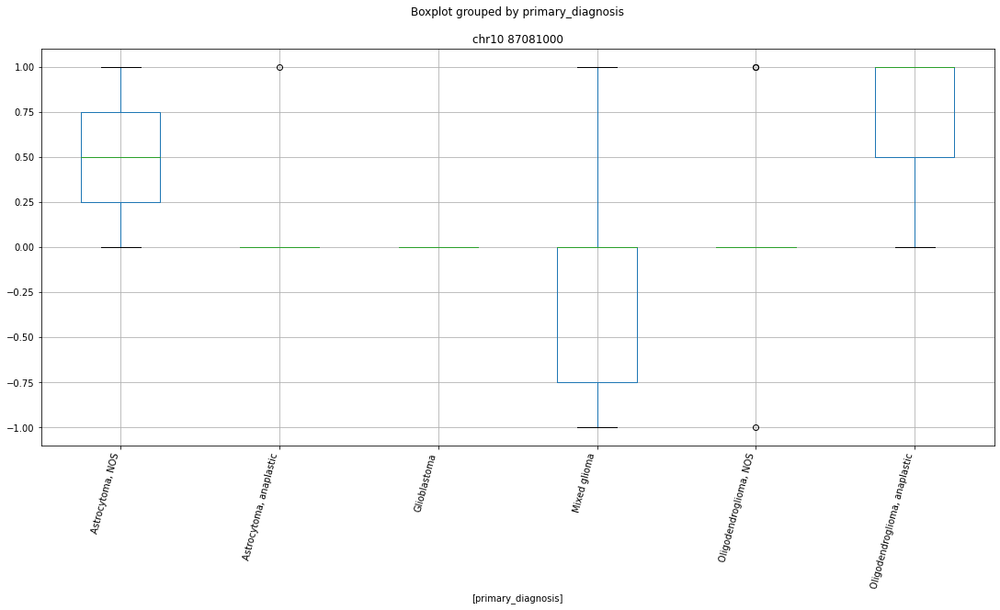

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr1 48174000


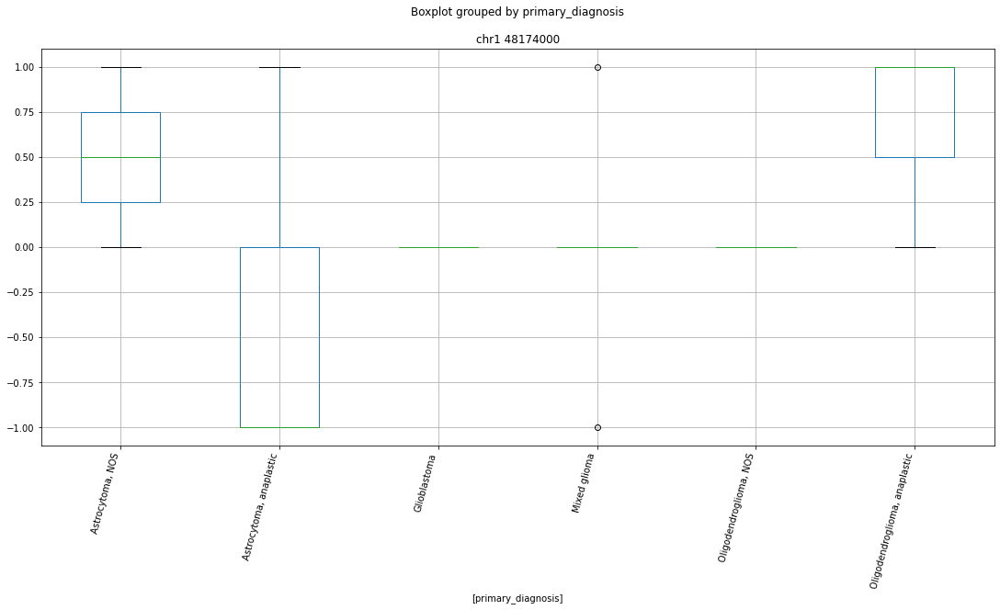

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr19 21486000


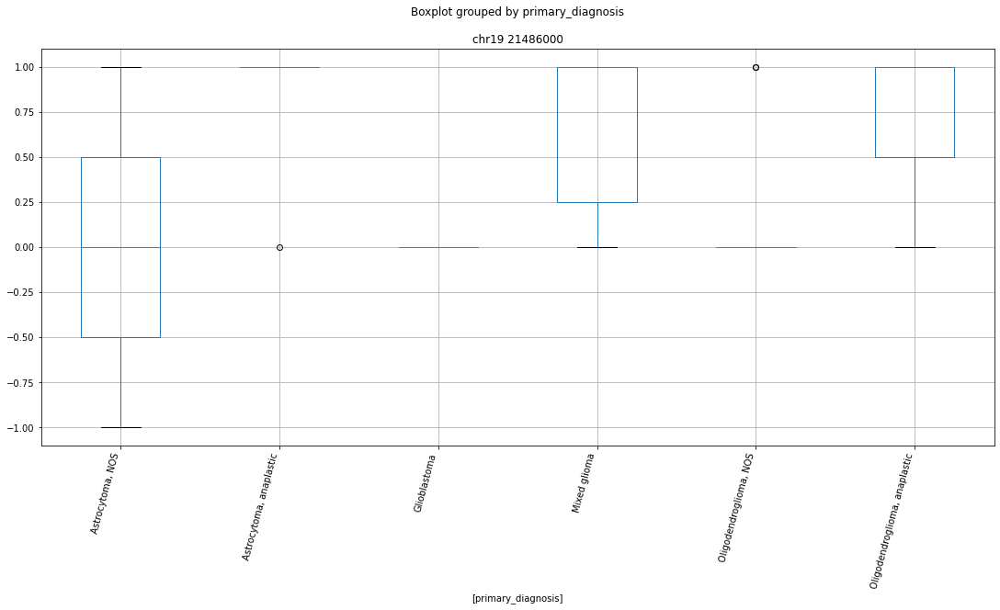

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr19 21606000


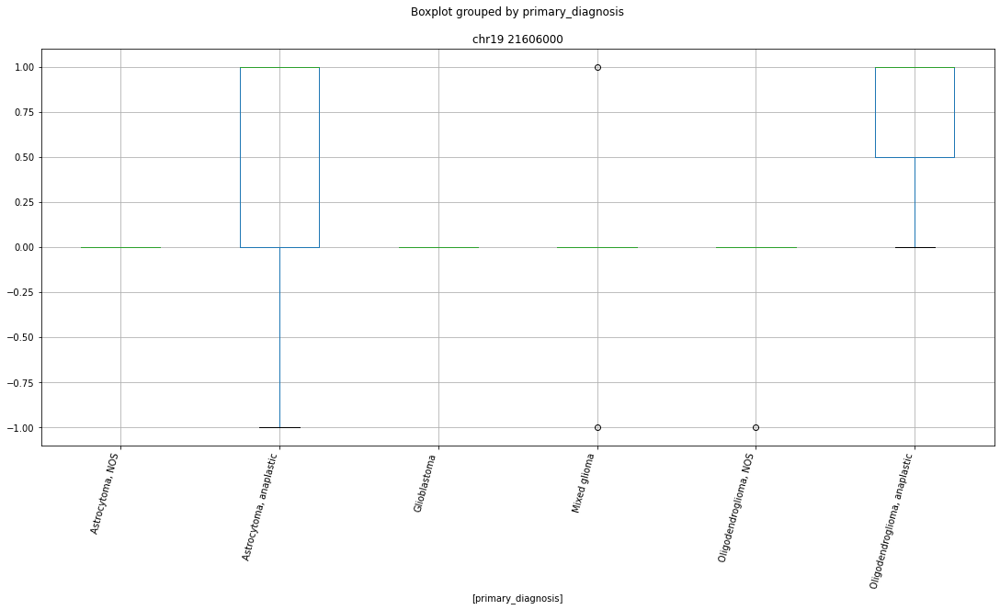

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr19 21776000


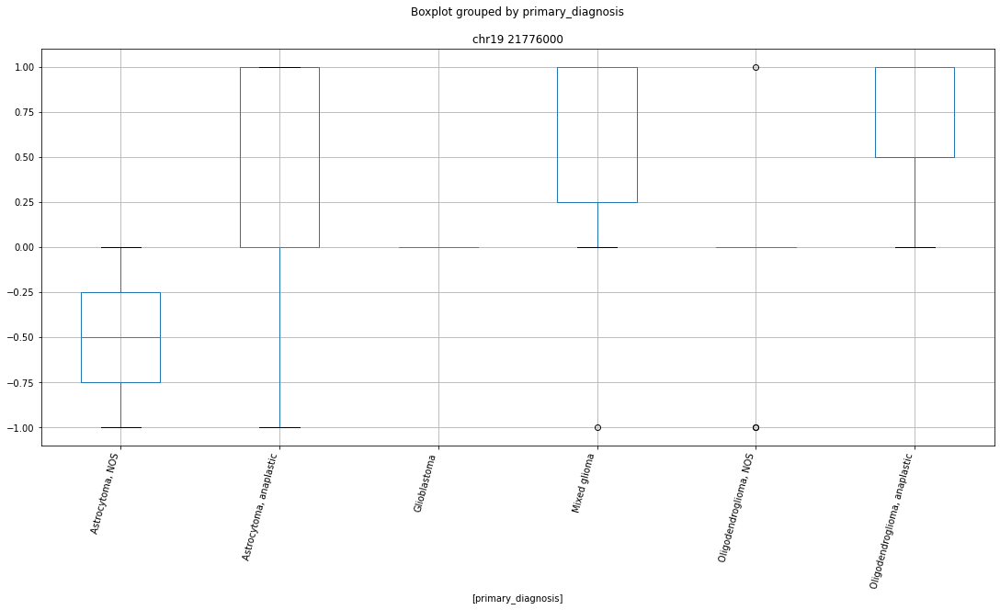

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr19 27678000


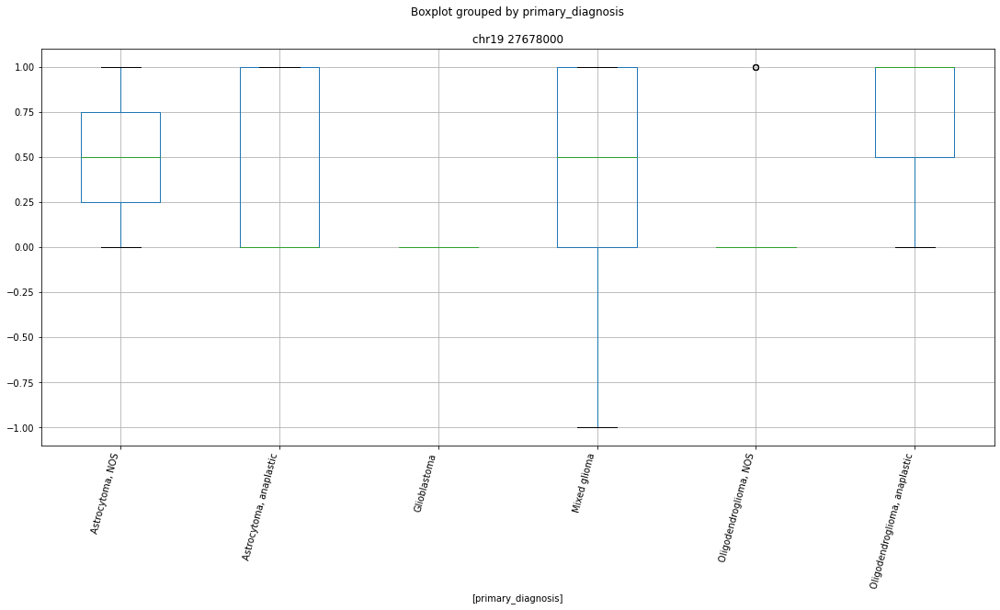

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr19 37502000


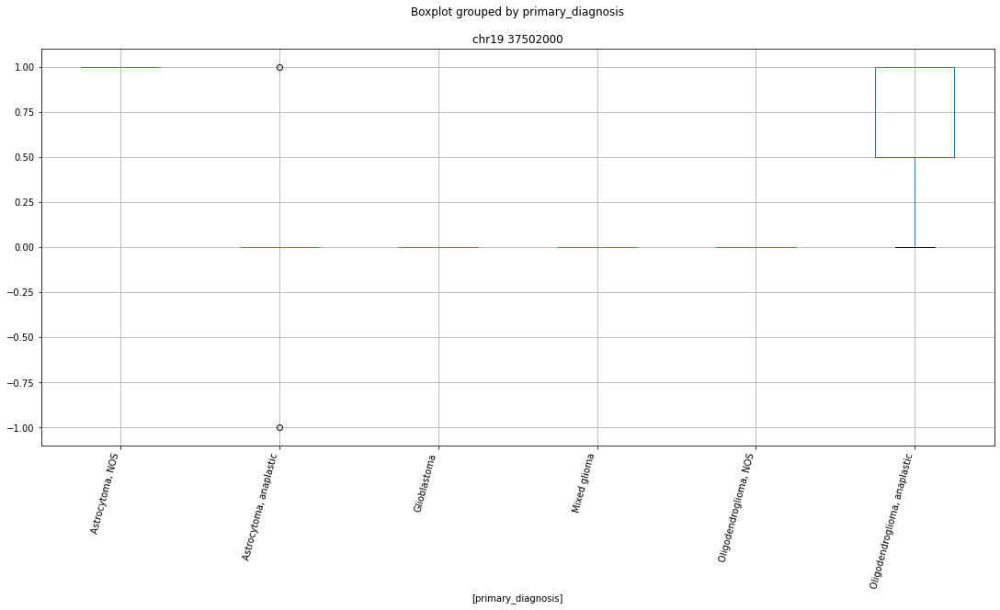

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr7 90744000


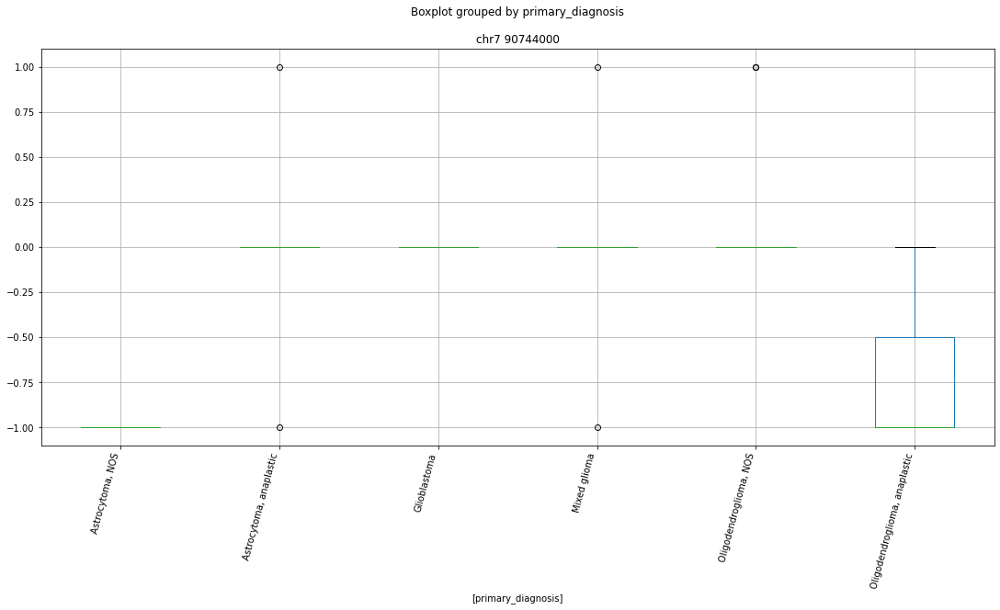

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr19 51906000


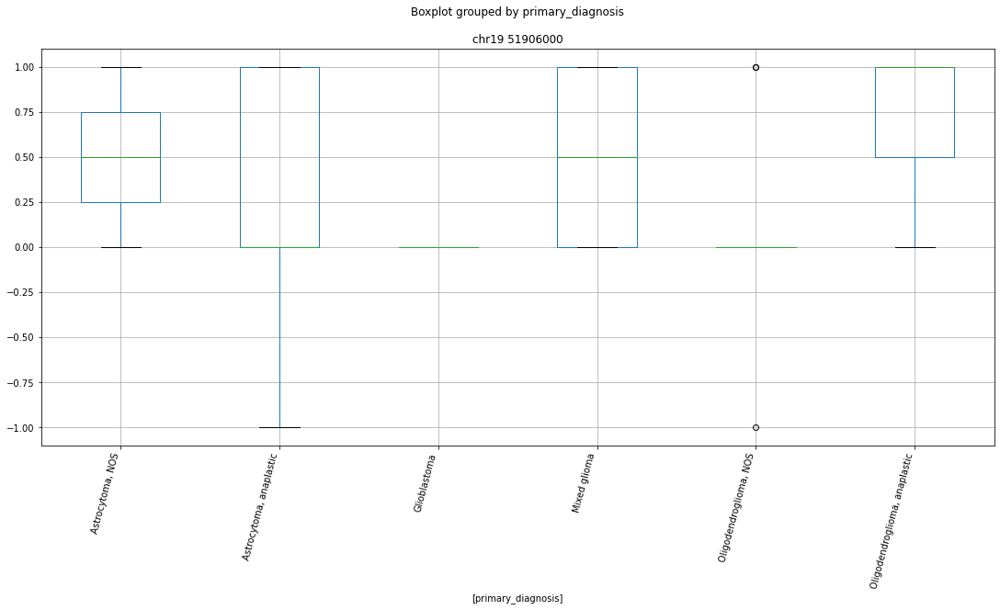

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr19 51957000


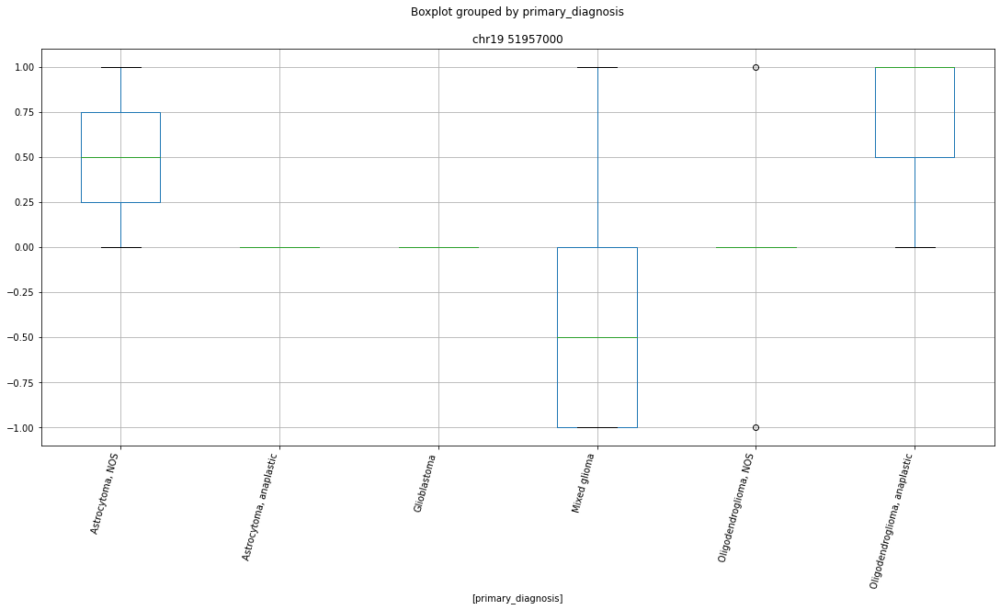

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr1 76111000


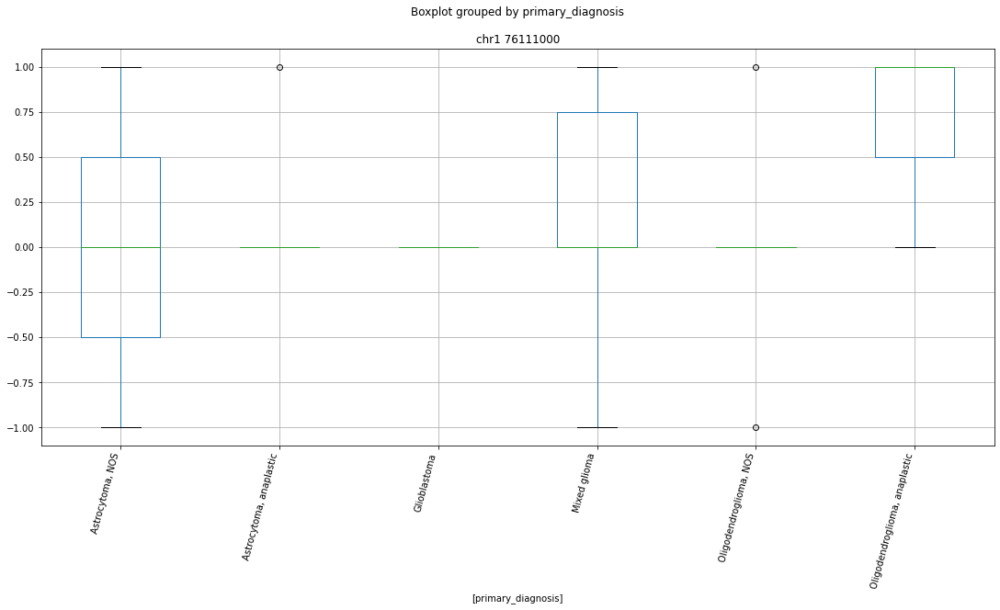

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr19 57556000


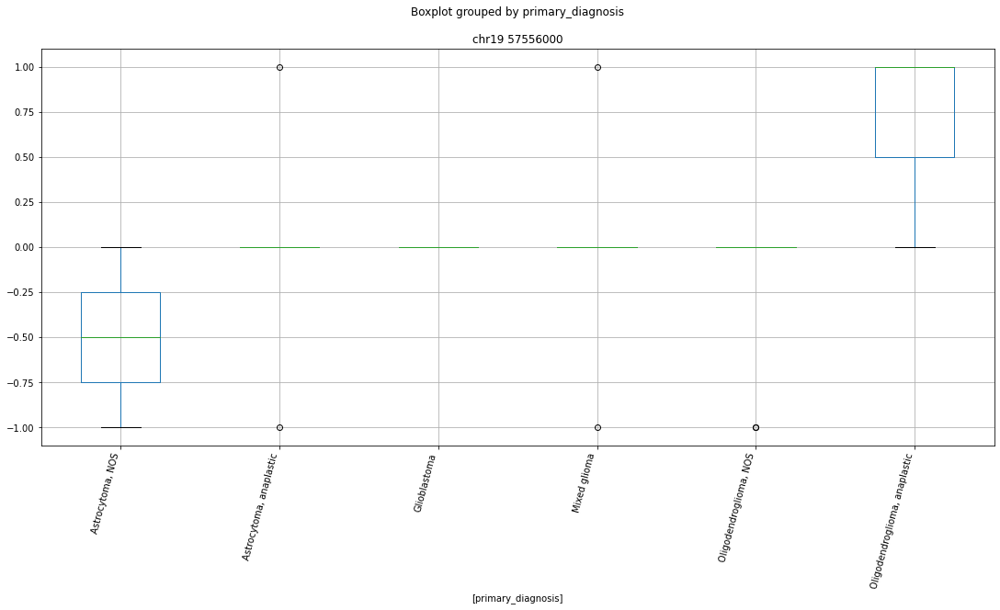

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr6 156670000


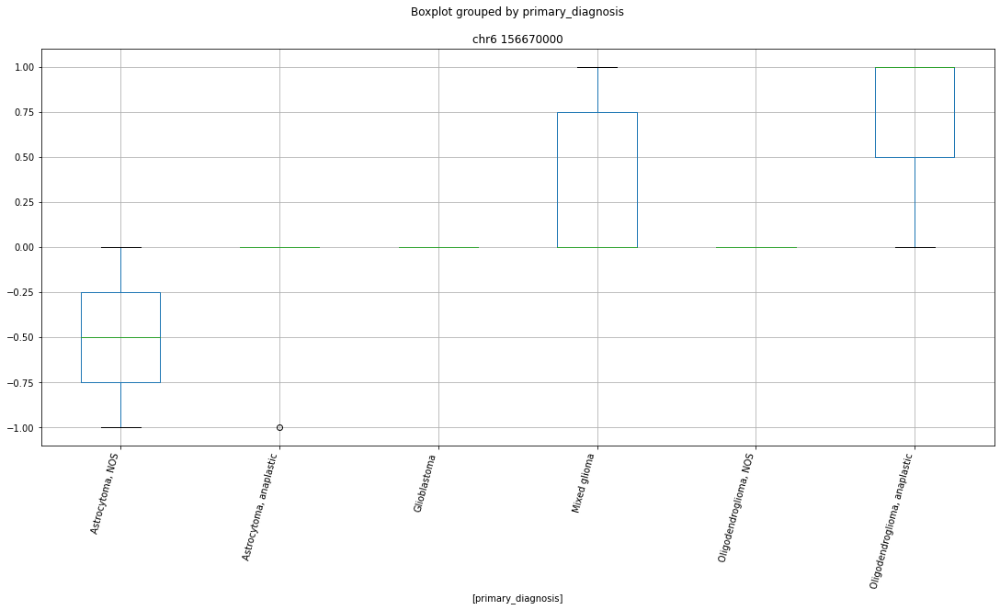

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr1 108535000


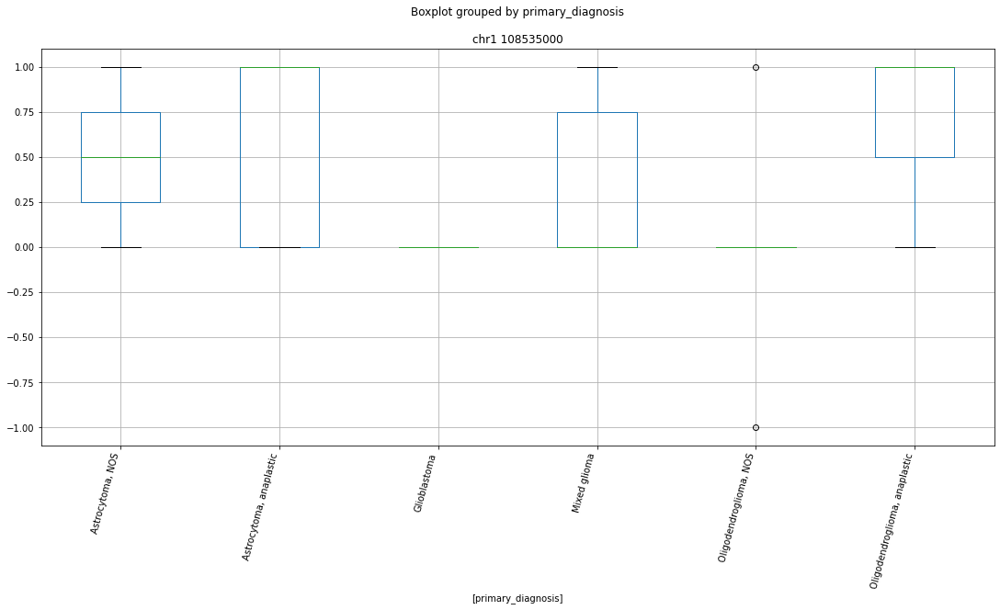

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr2 143992000


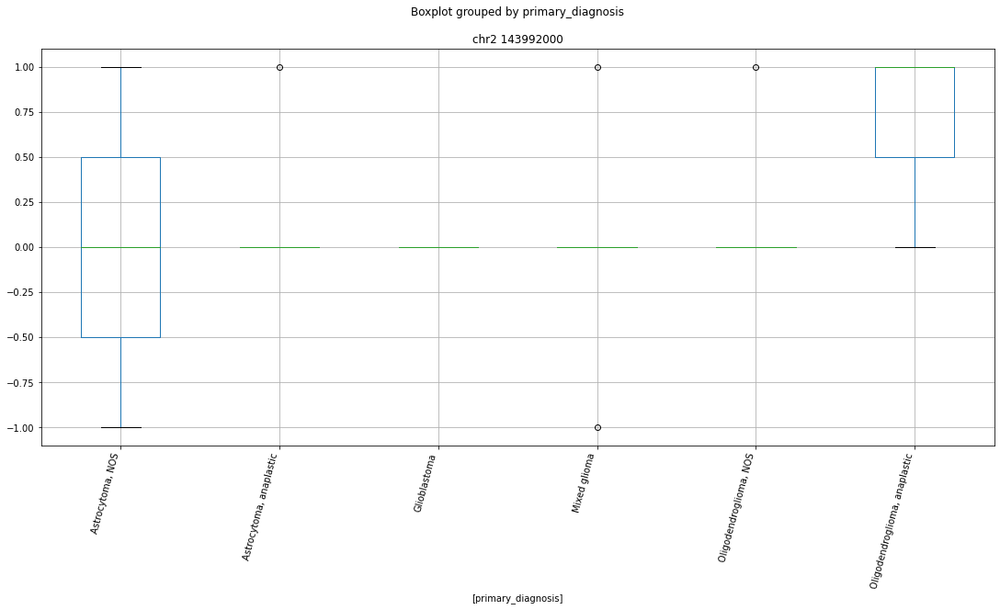

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr3 124749000


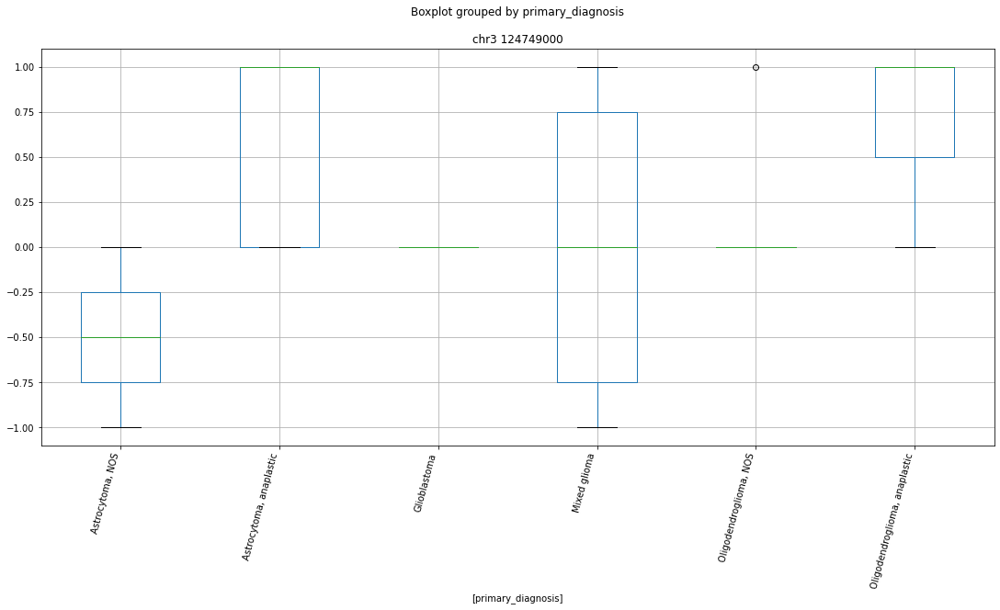

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr1 168837000


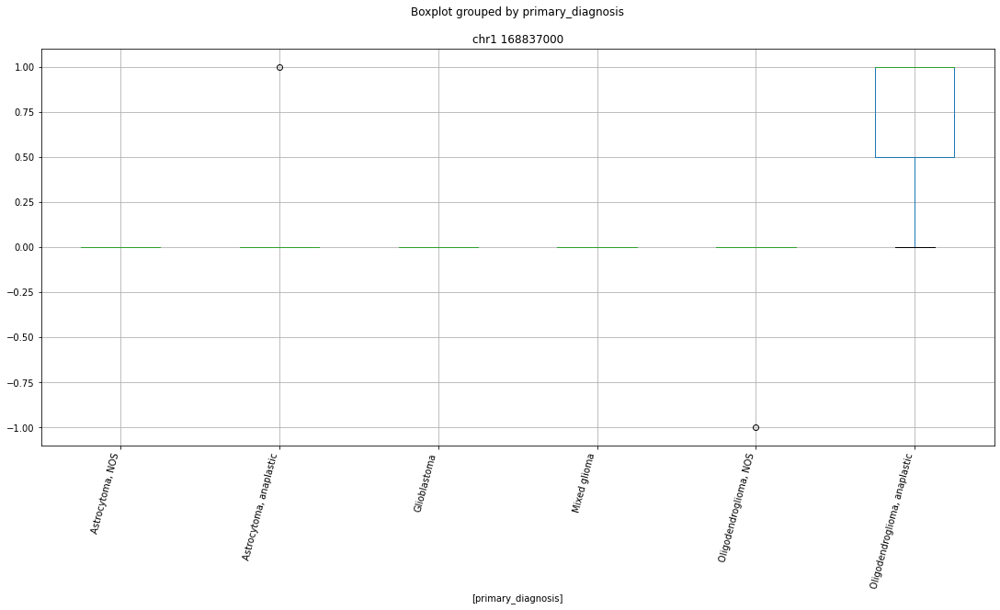

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr3 145710000


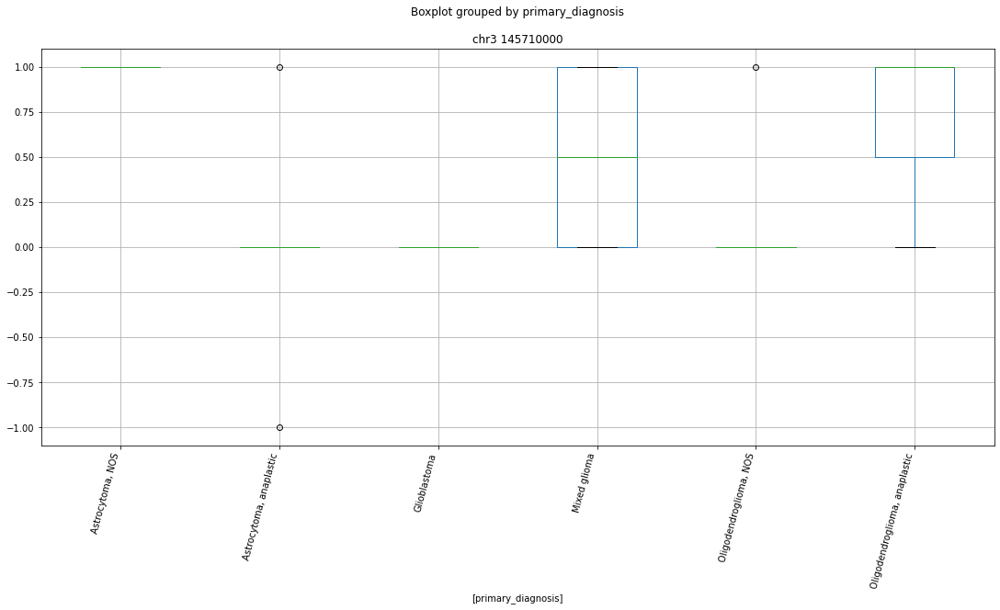

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr1 143703000


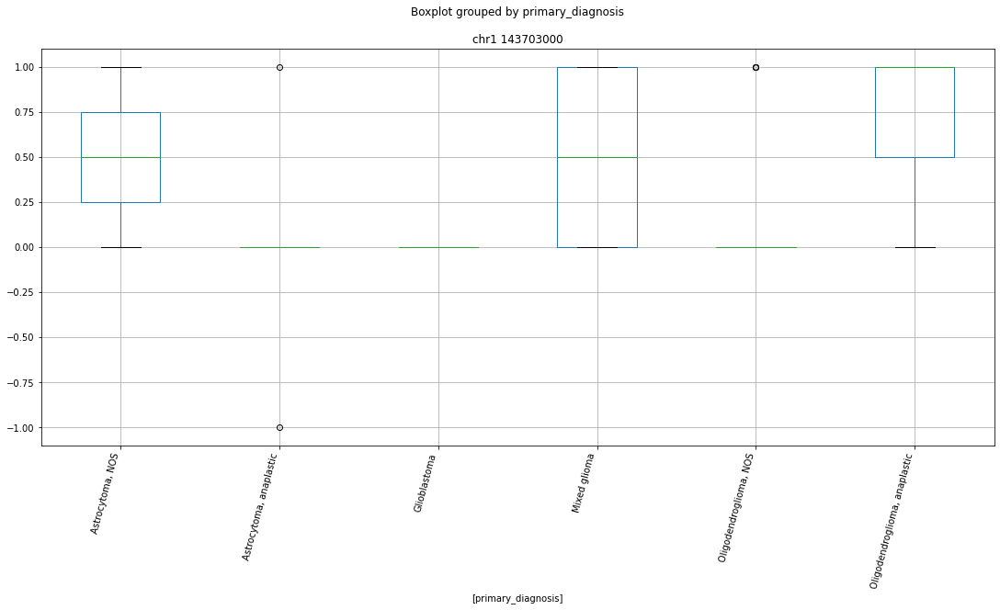

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr3 190473000


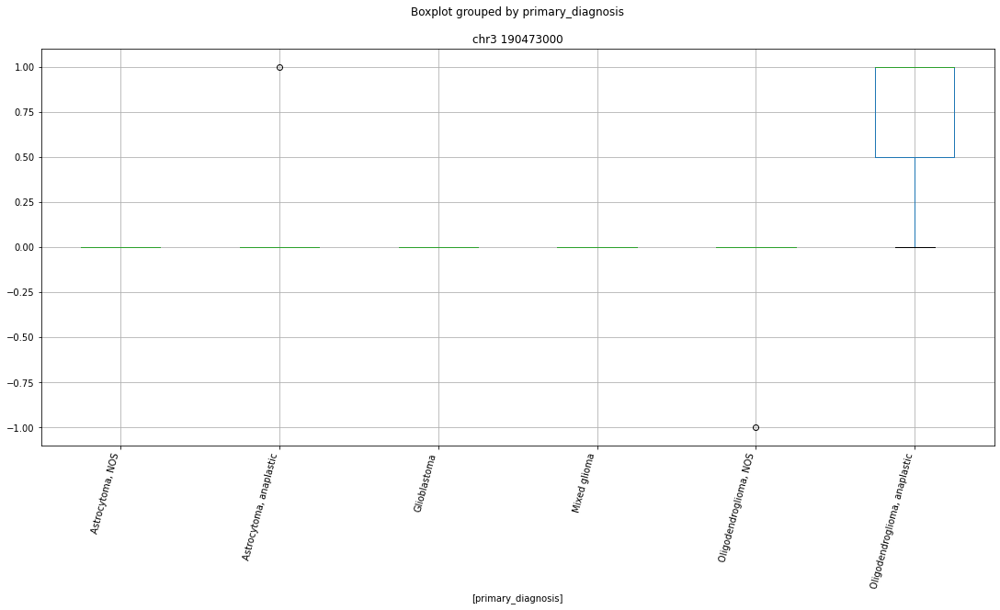

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr5 106260000


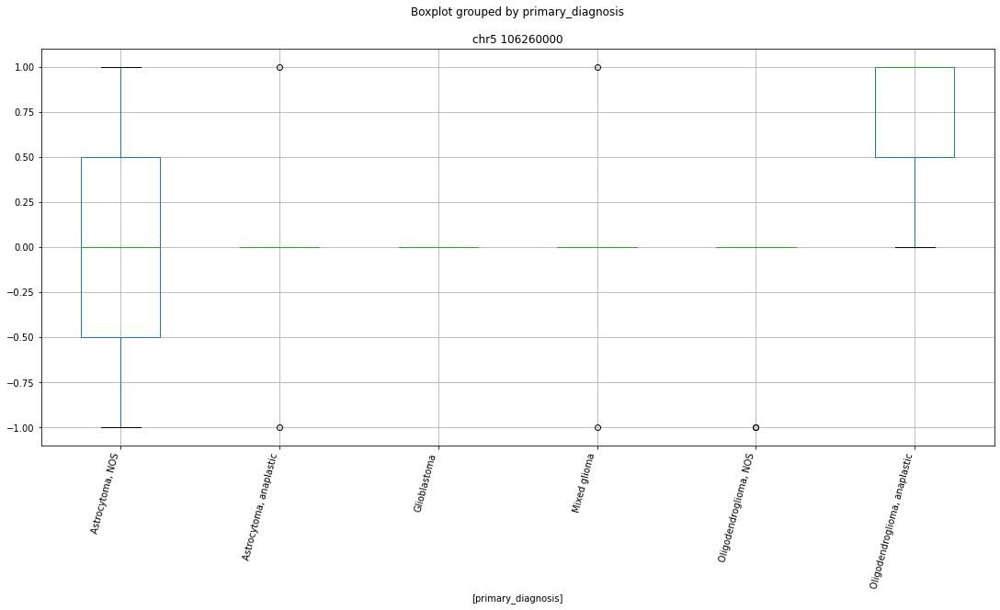

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr1 160936000


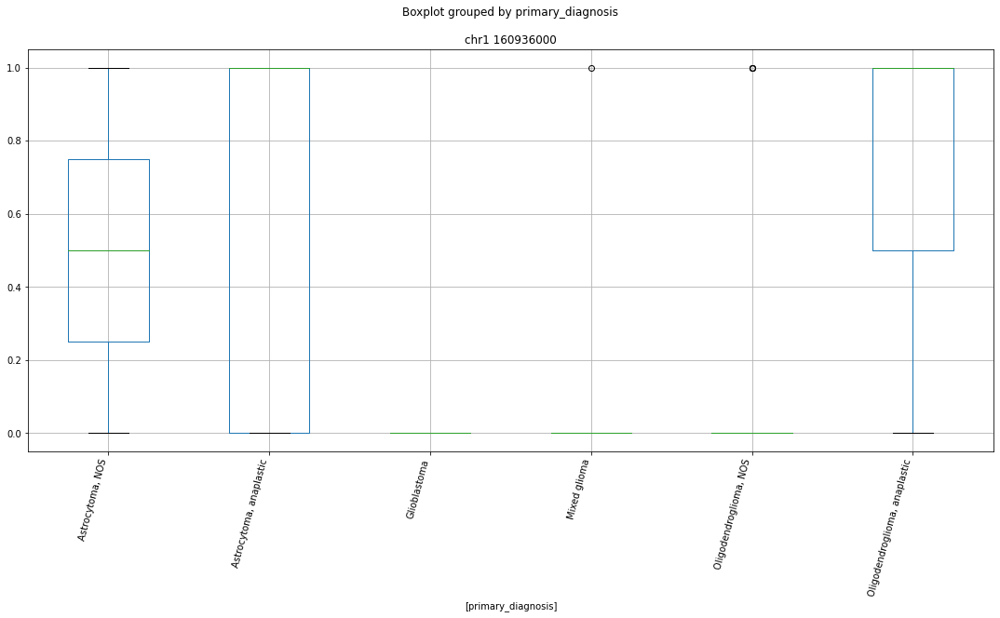

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr5 75271000


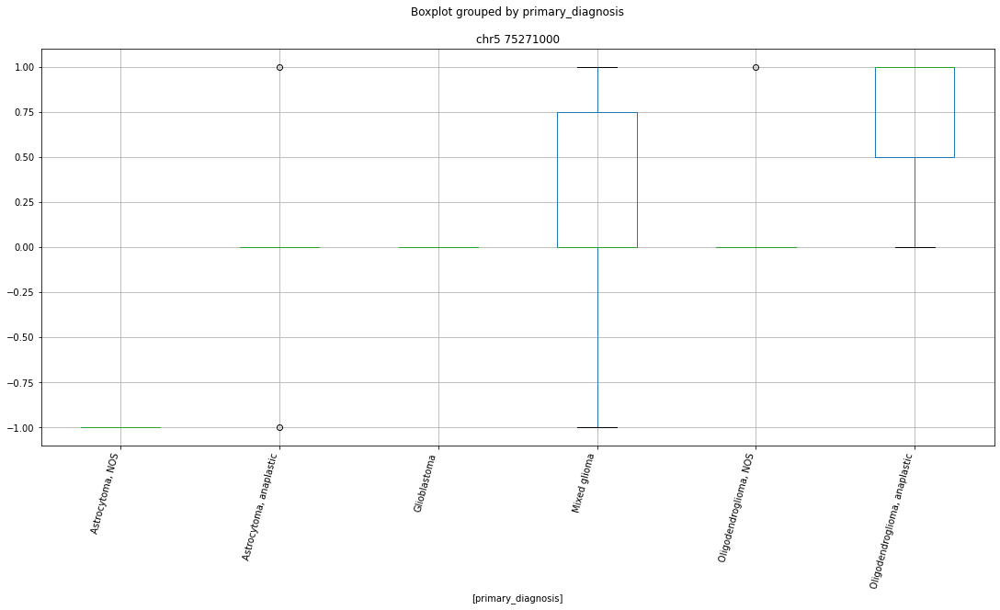

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr5 68323000


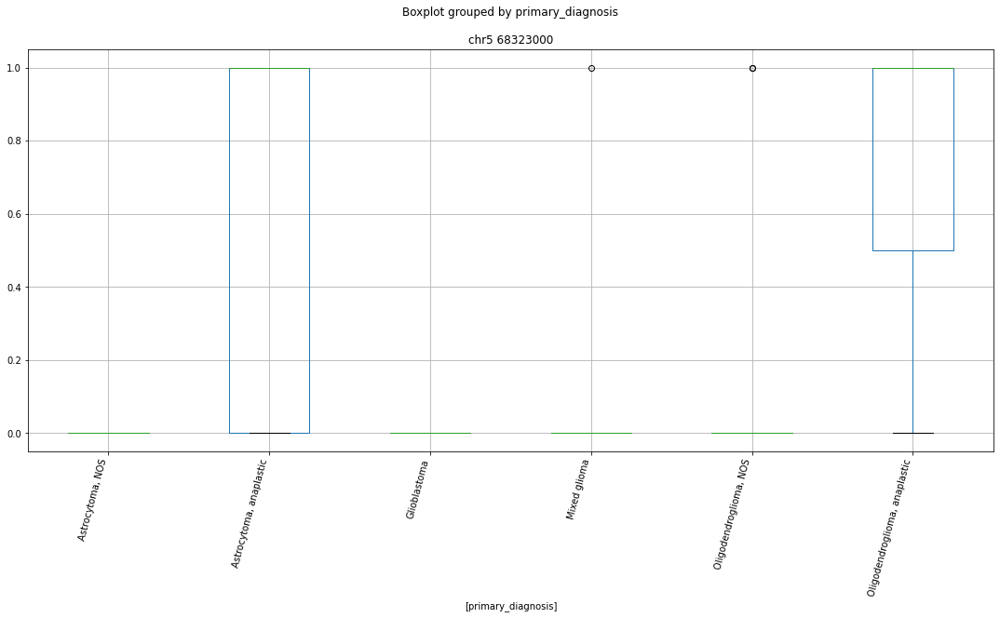

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr5 65976000


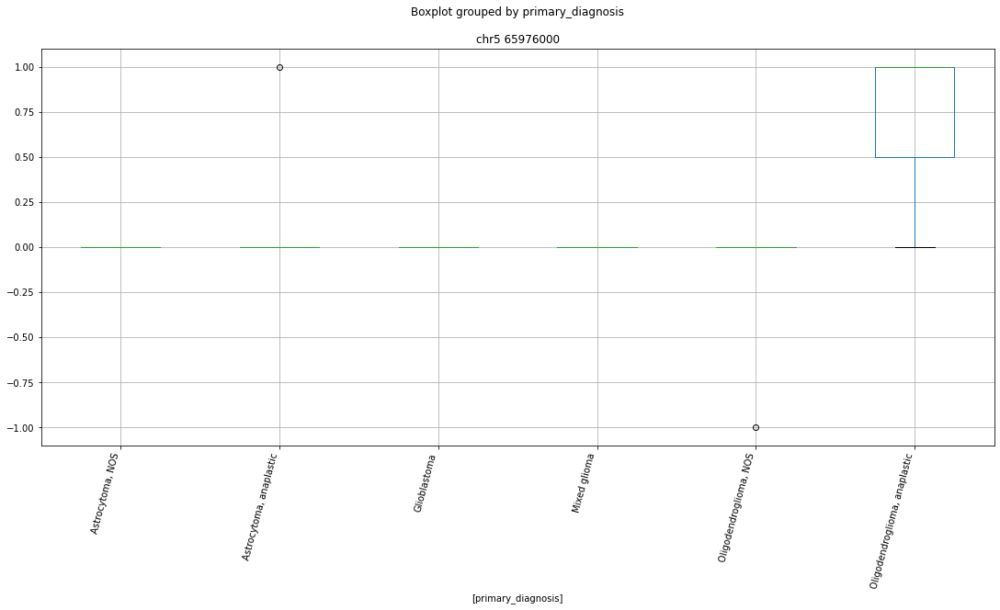

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr5 60430000


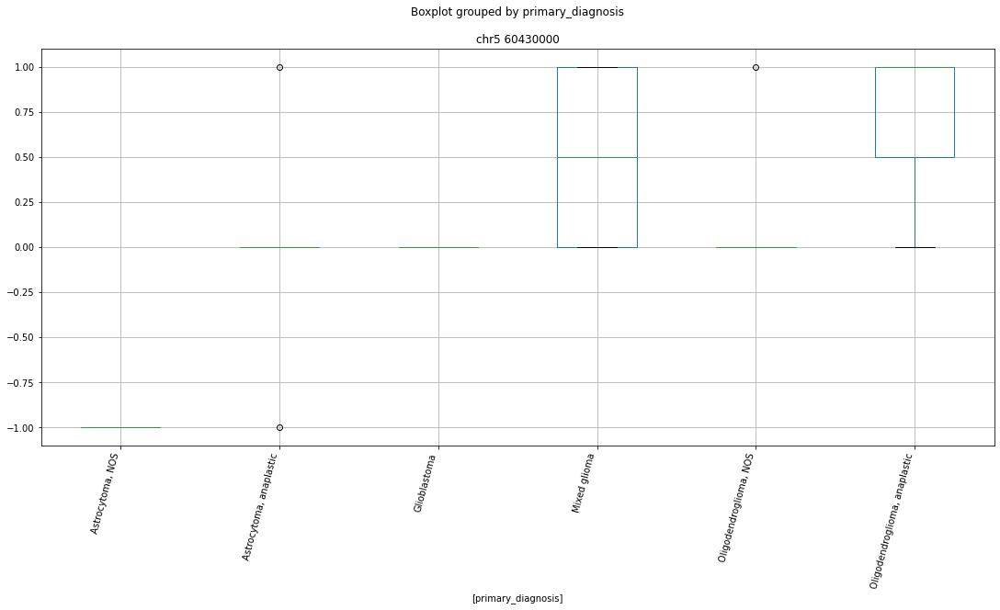

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr4 592000


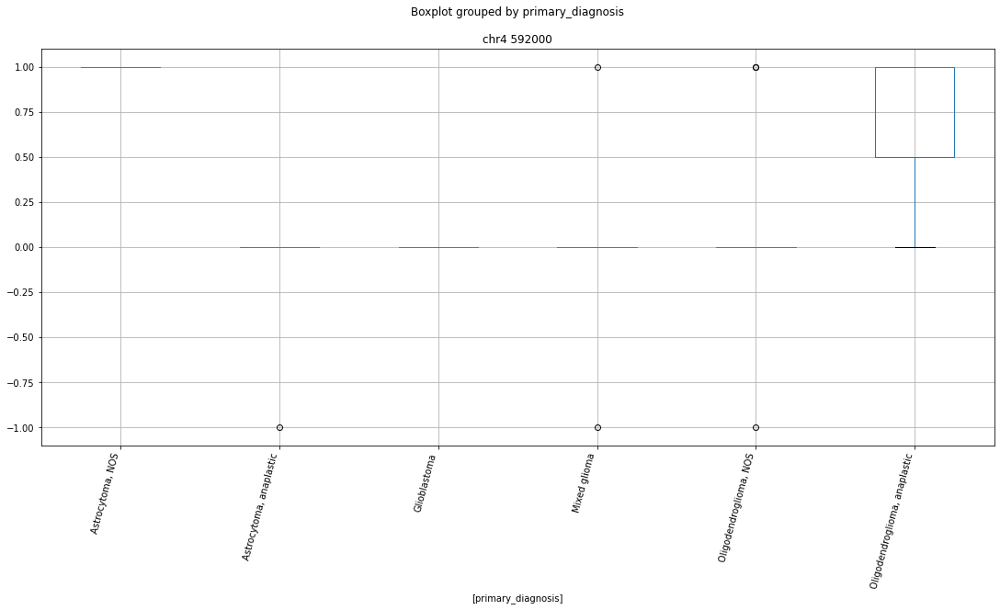

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr5 56373000


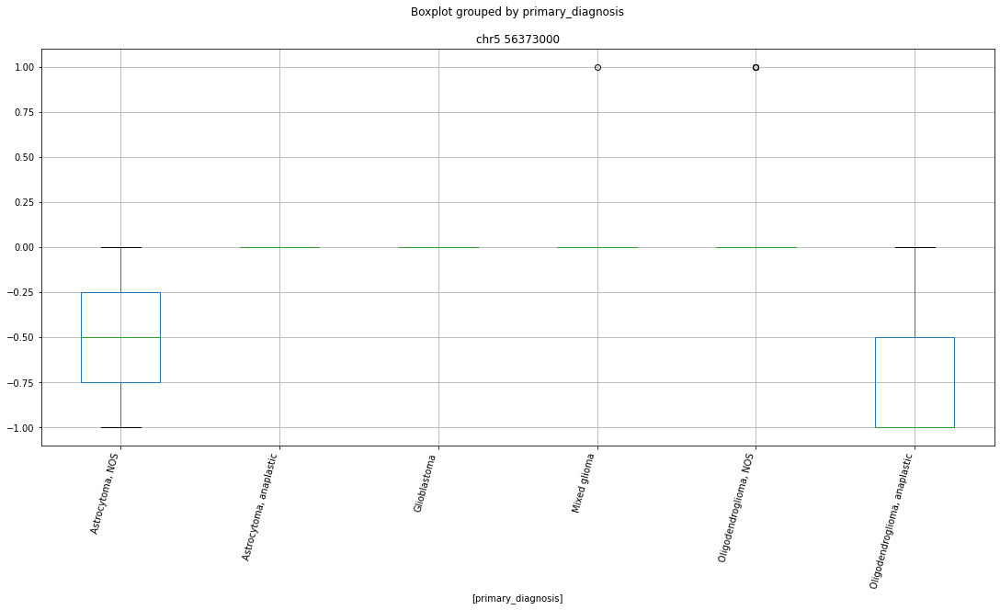

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr1 154287000


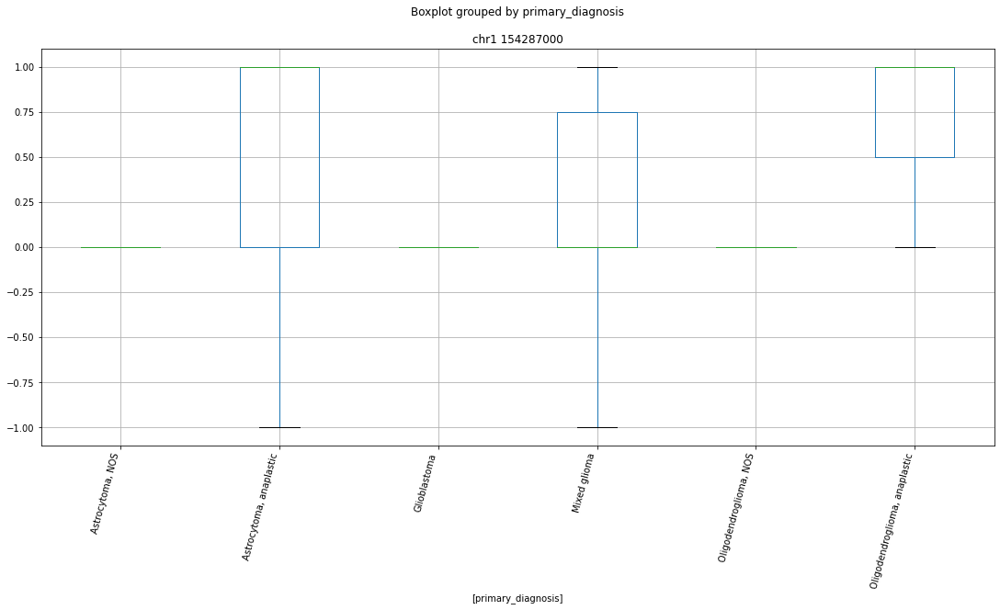

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr5 56156000


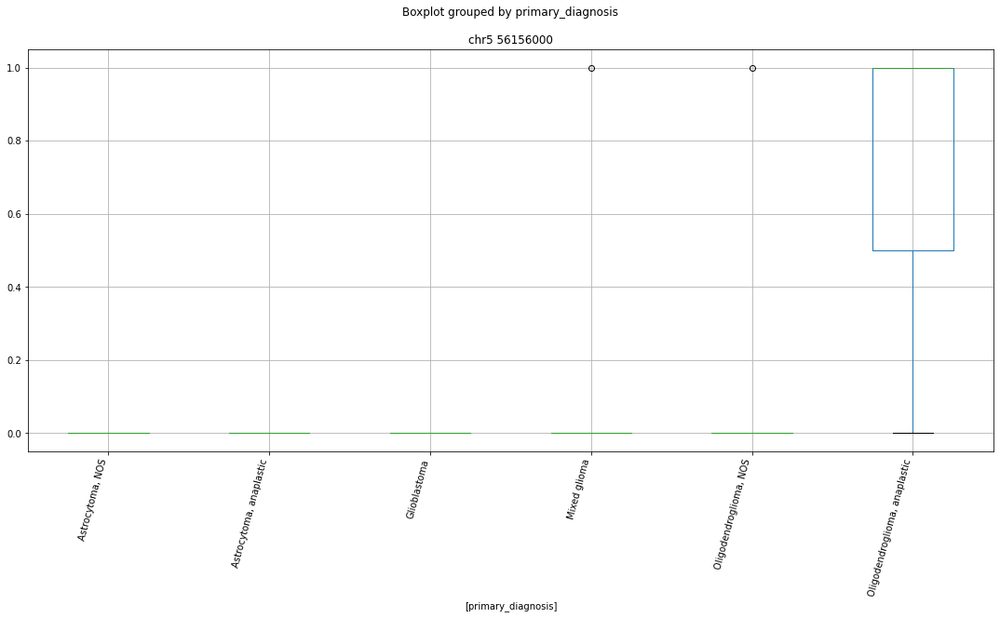

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr4 13760000


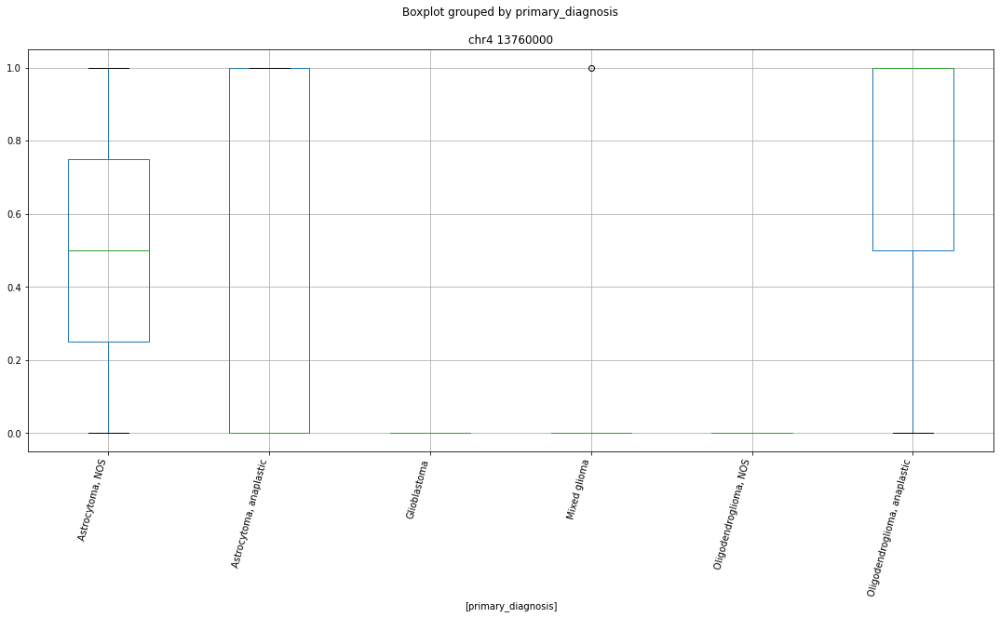

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr1 152471000


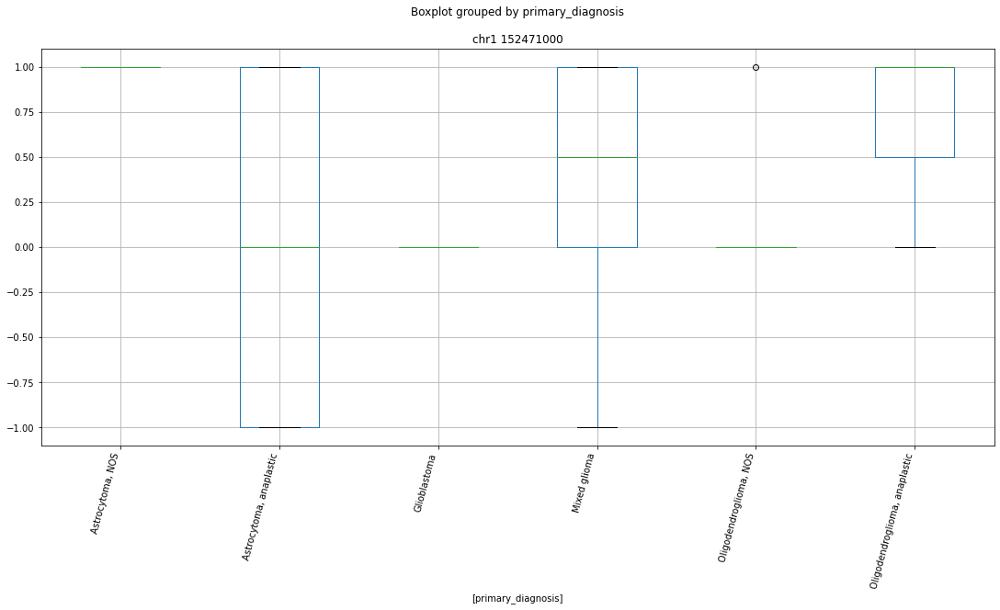

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr4 41049000


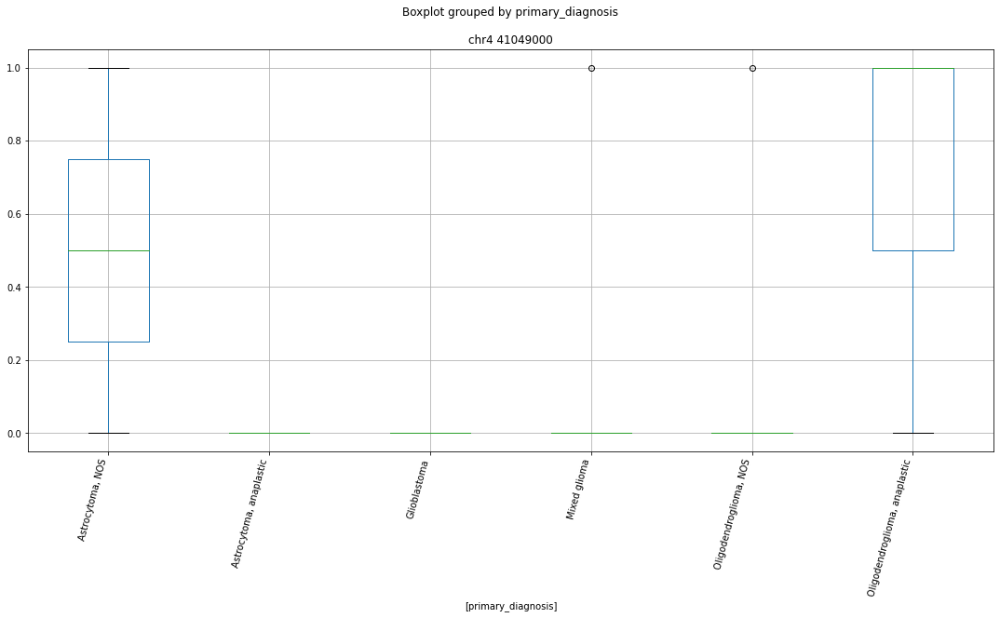

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr4 64900000


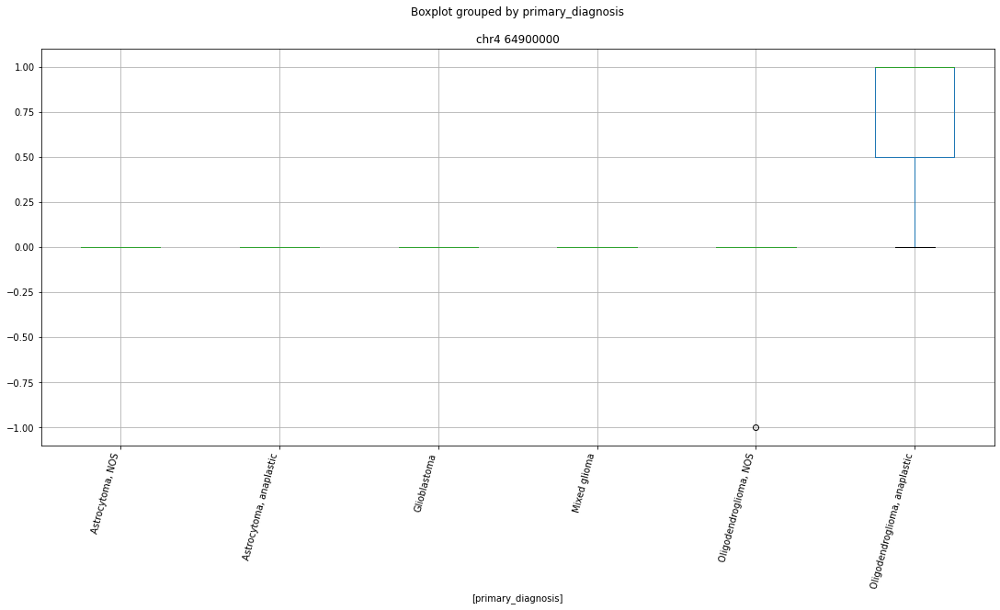

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr5 43058000


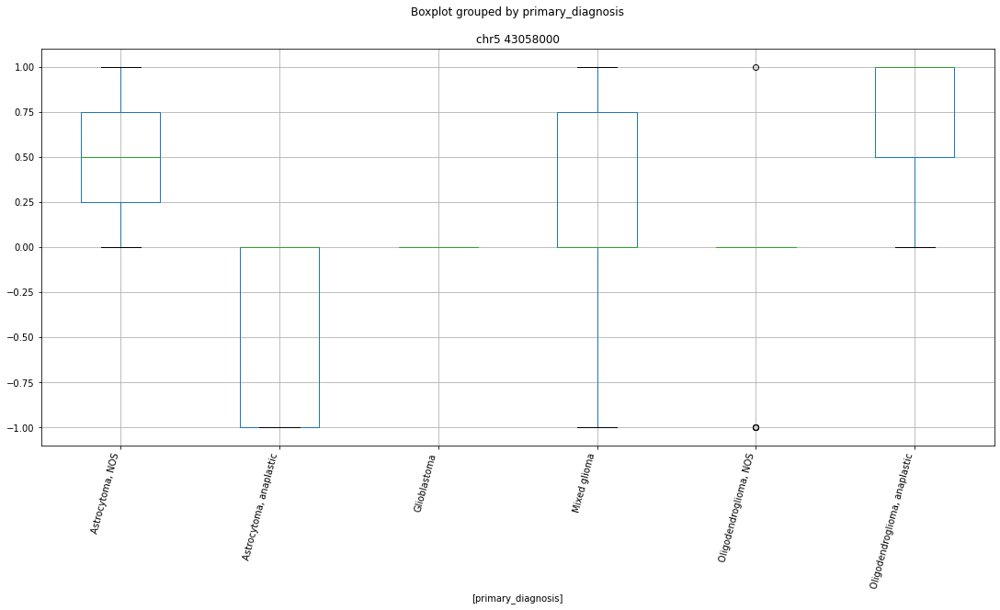

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr1 147241000


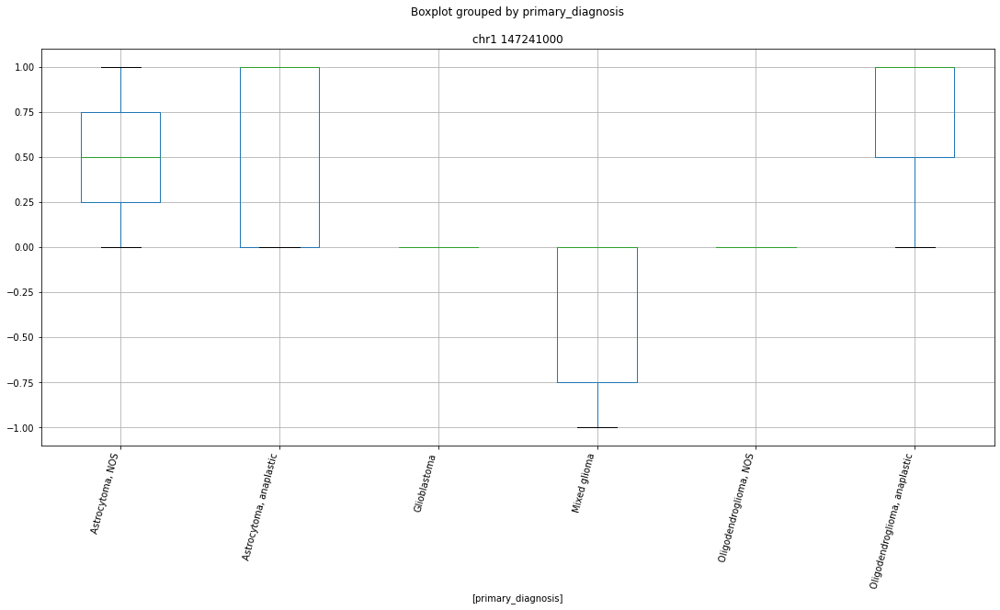

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr4 78548000


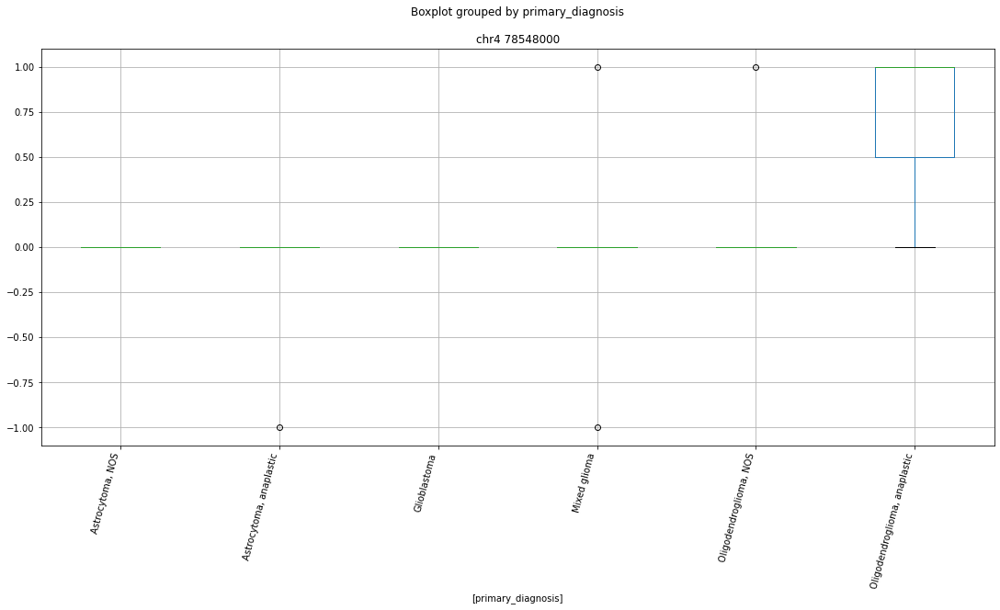

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr4 83943000


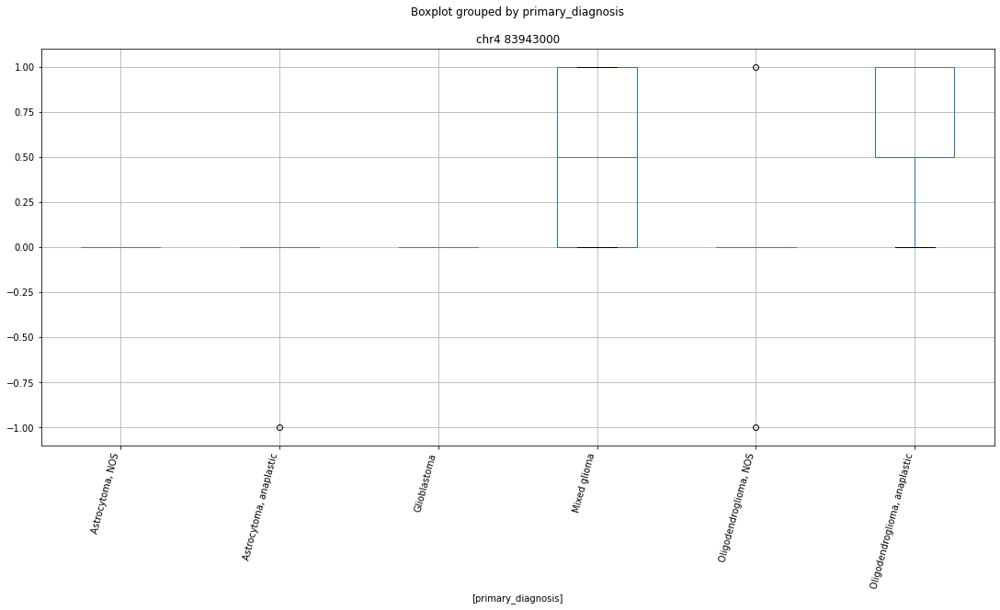

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr5 132982000


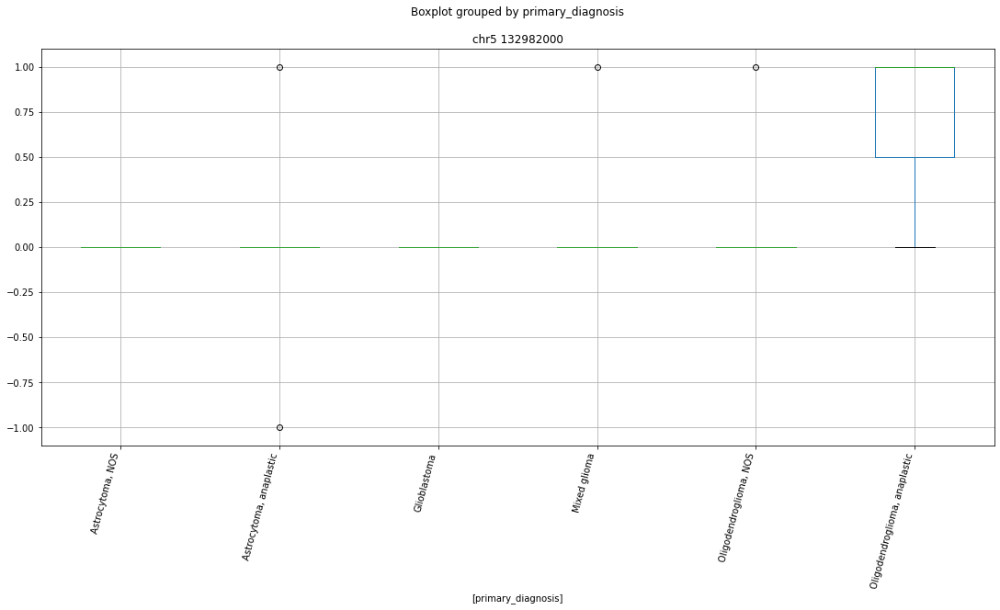

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr5 138070000


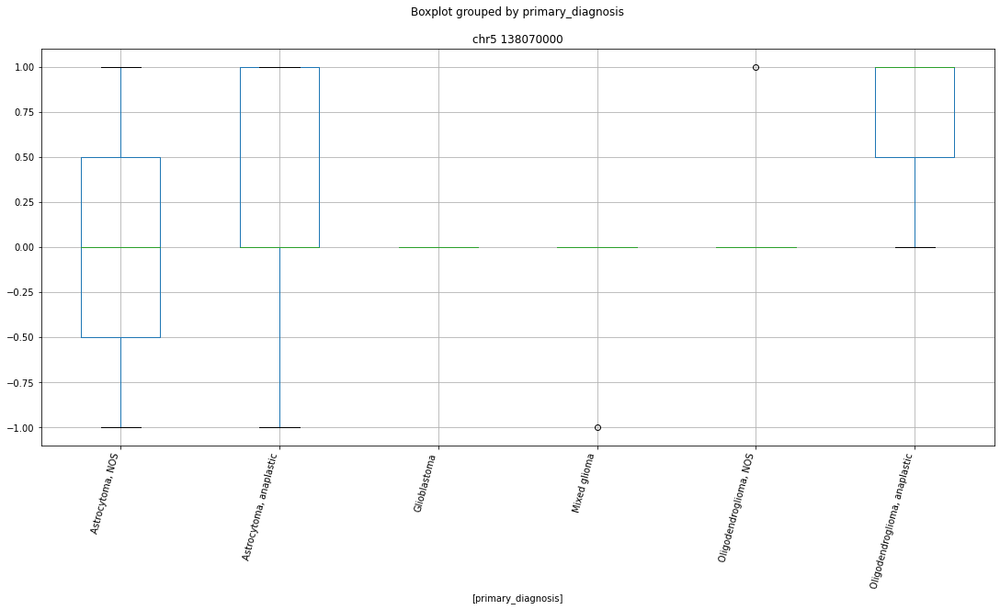

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr3 50823000


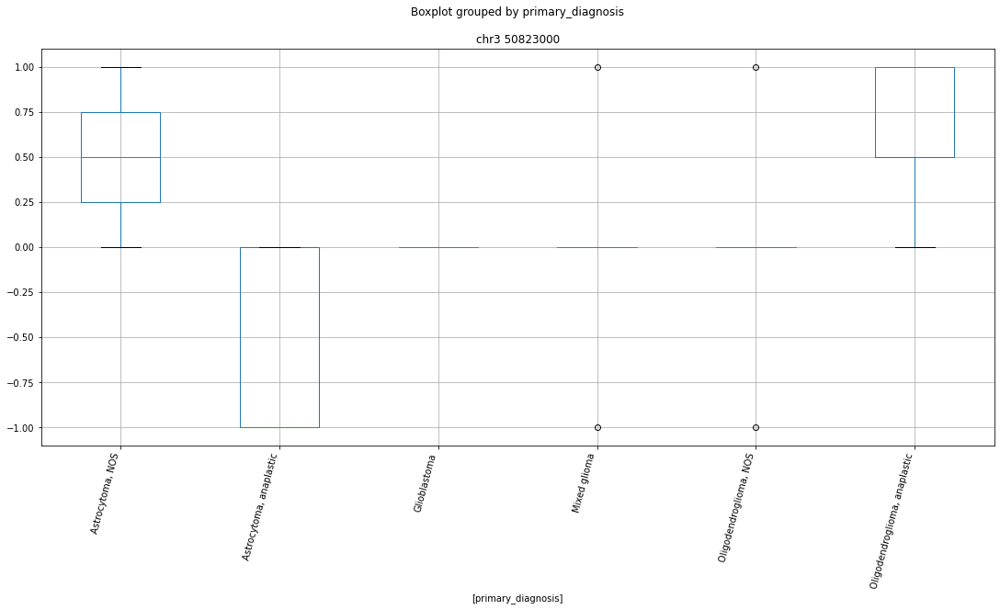

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr5 149669000


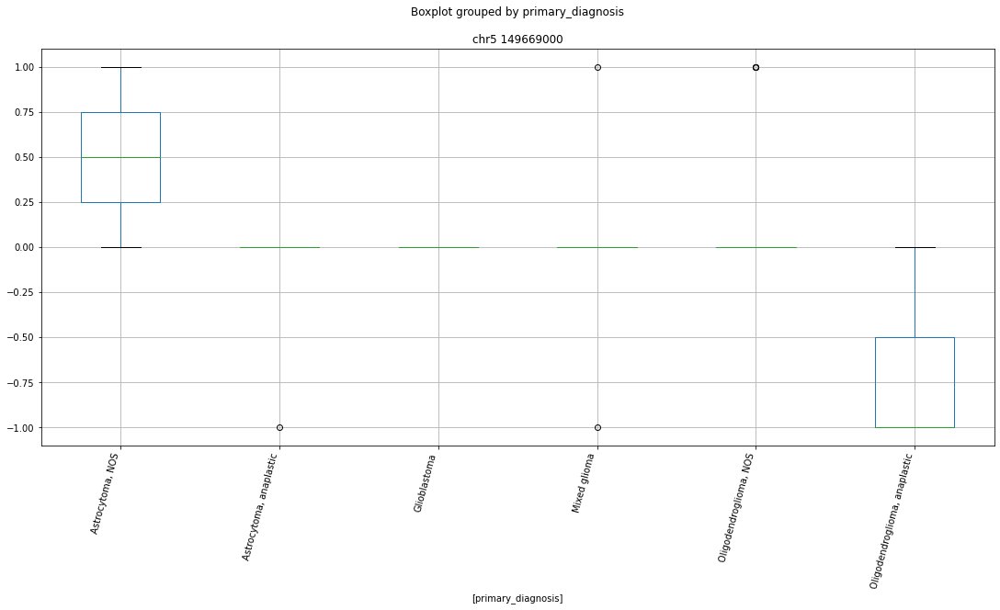

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr1 232332000


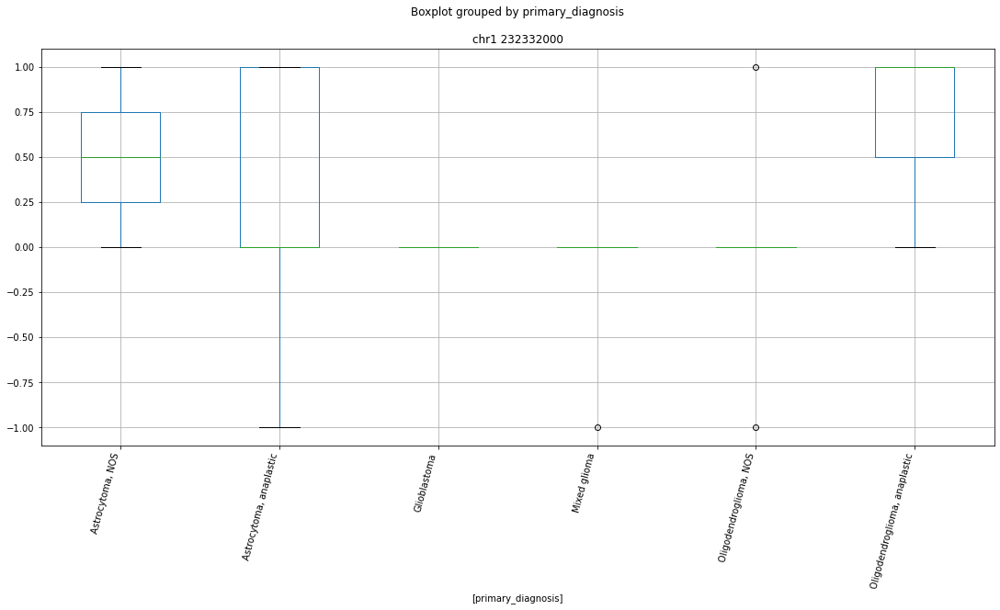

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr6 131478000


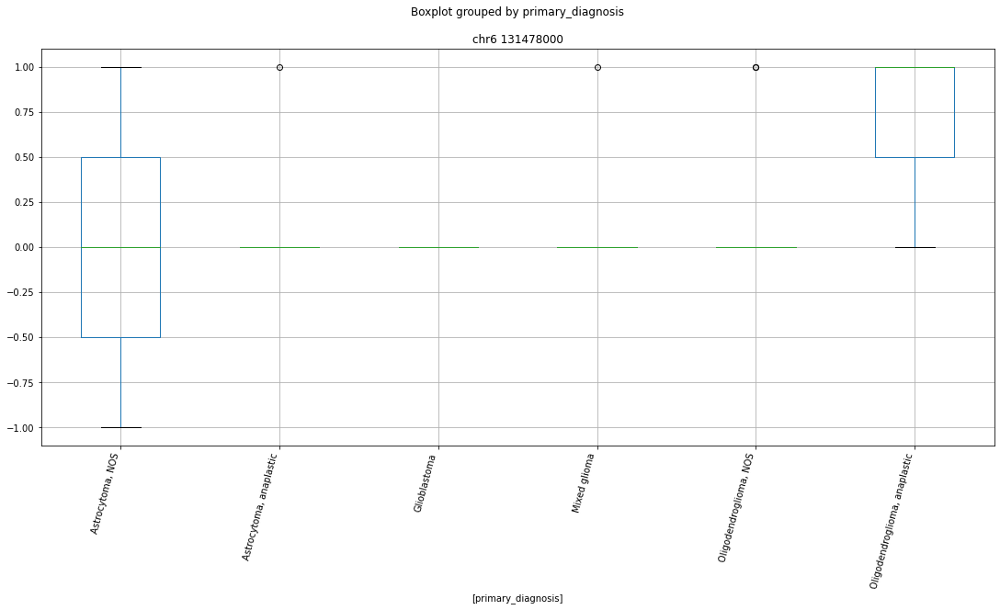

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr2 182386000


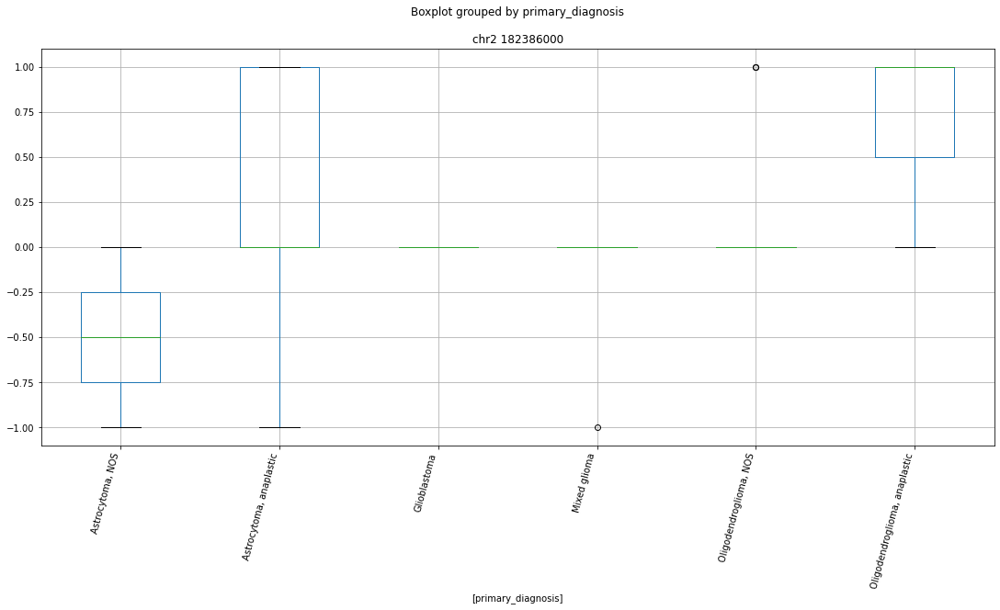

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr1 229931000


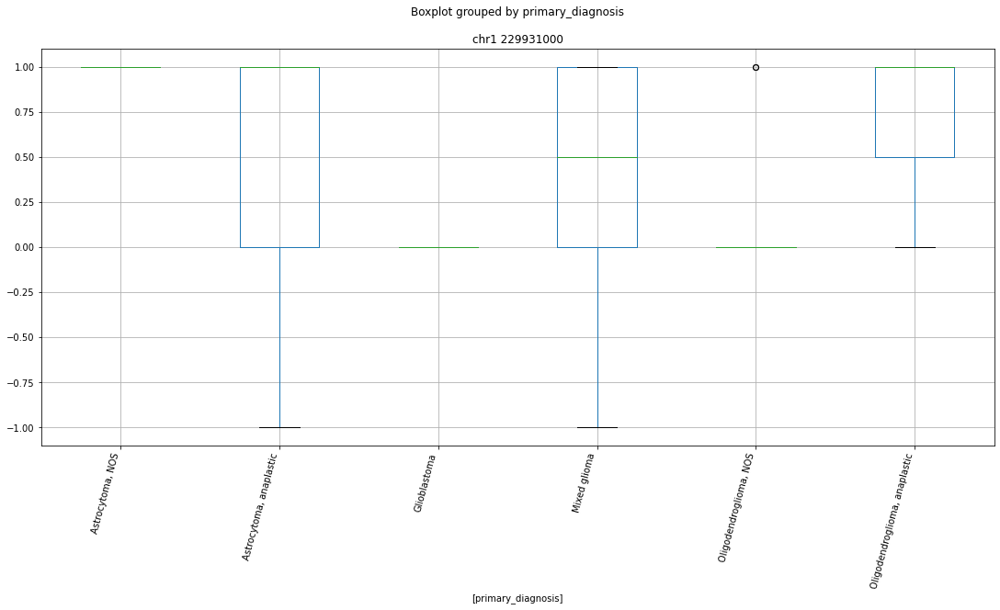

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr2 201239000


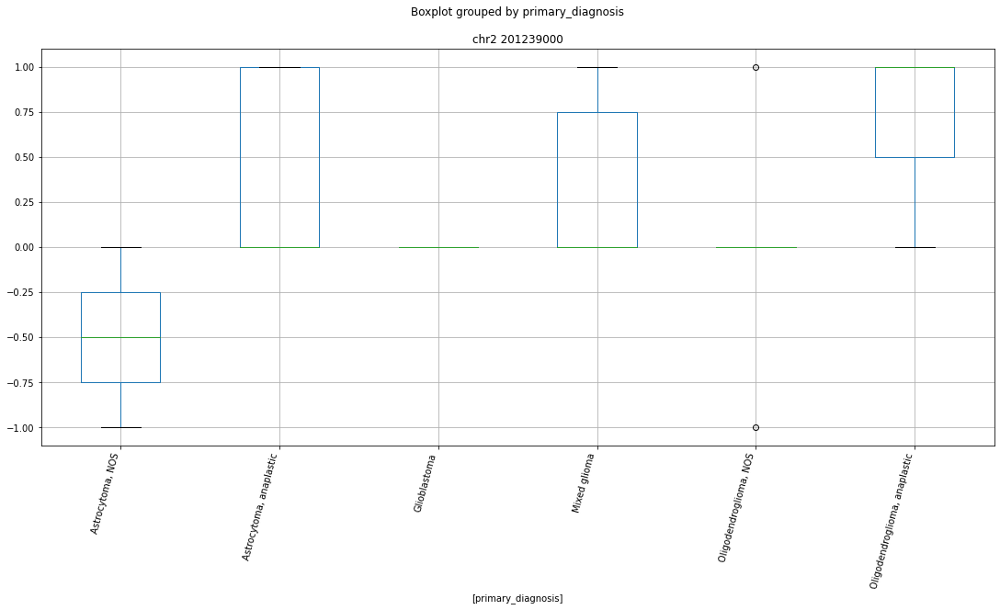

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr17 81618000


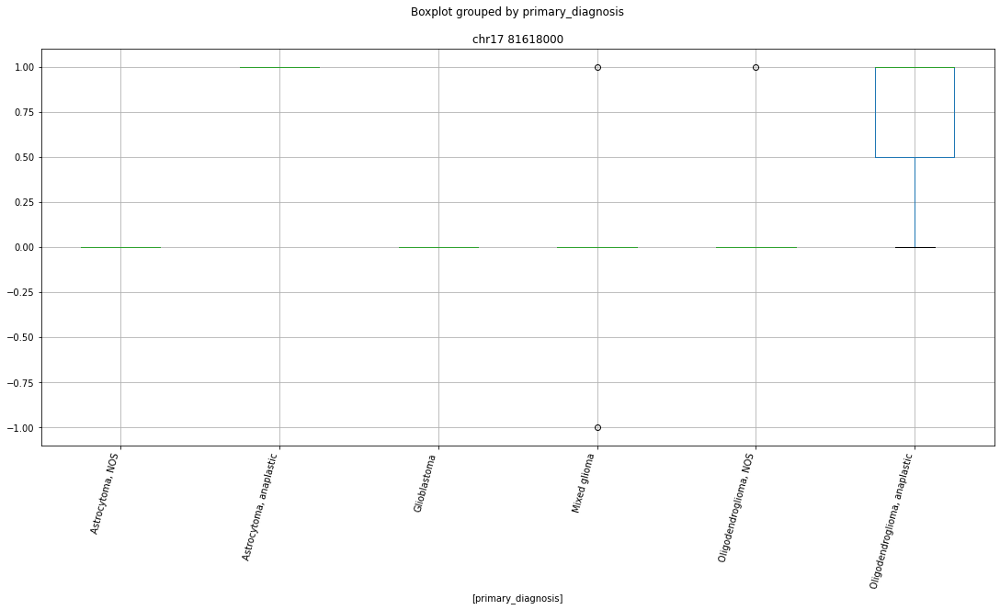

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr6 95561000


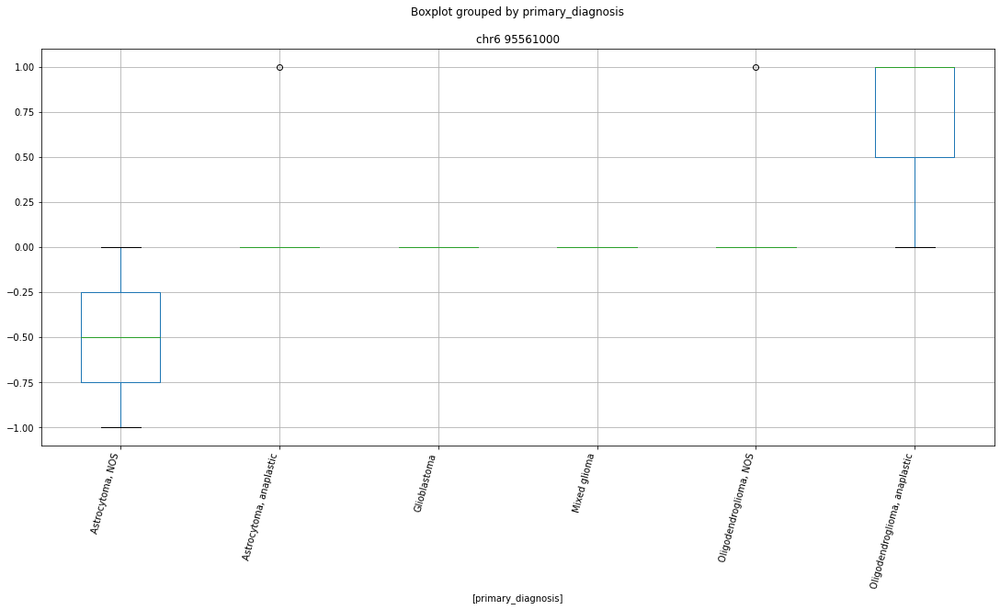

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr20 30850000


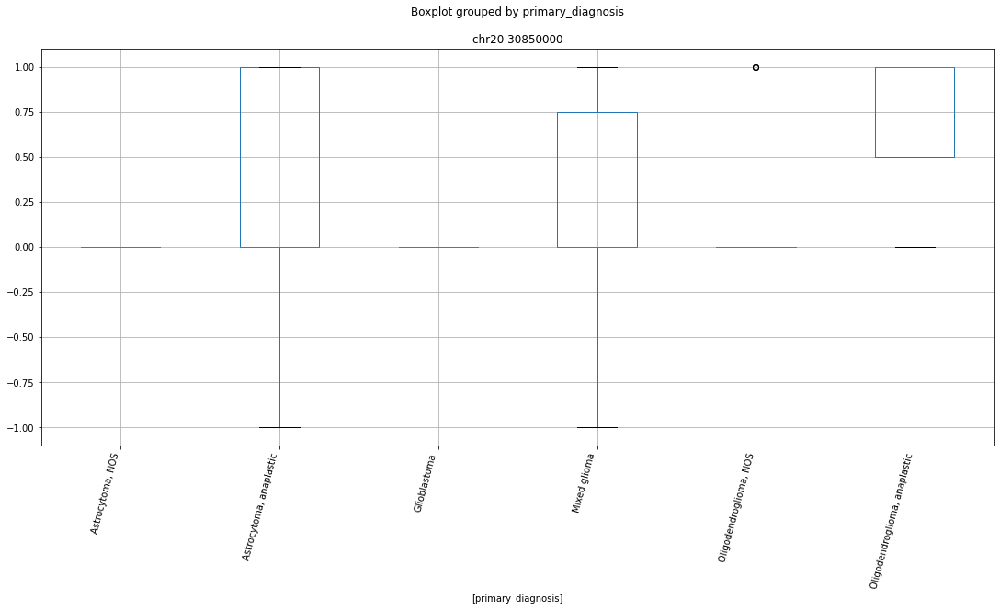

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr20 37001000


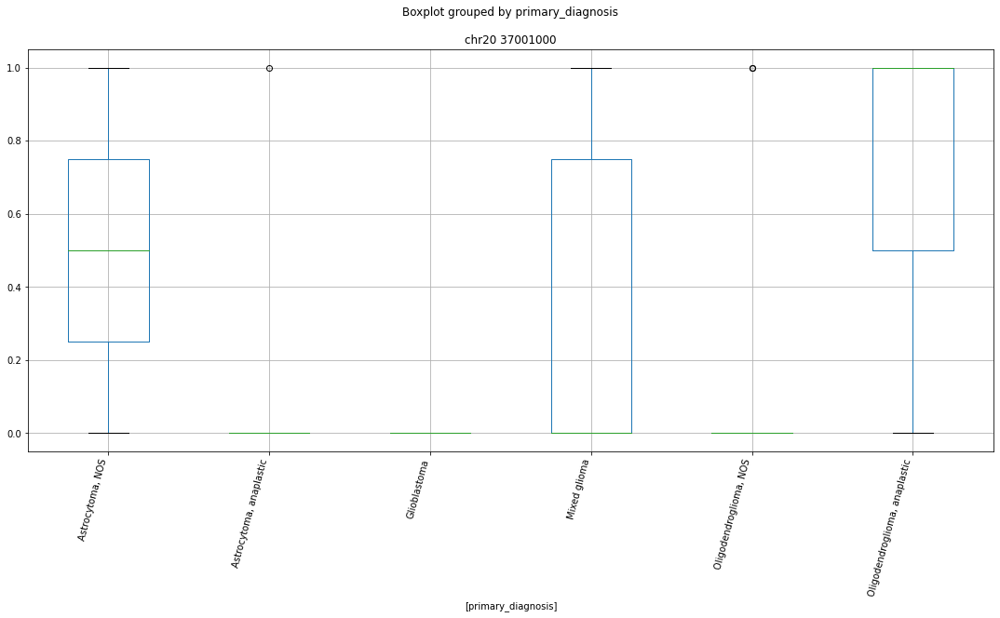

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr20 38407000


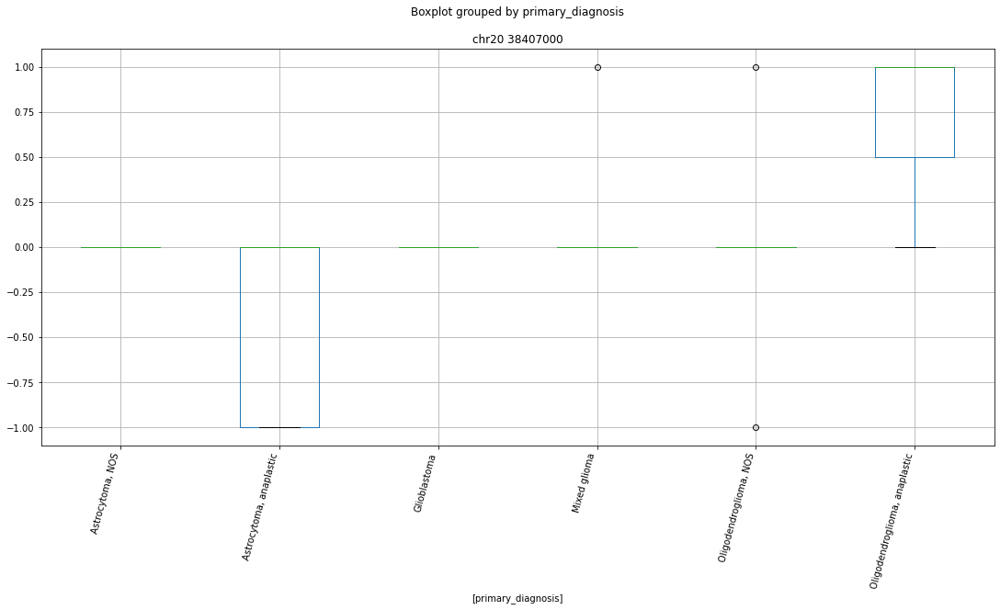

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr20 43677000


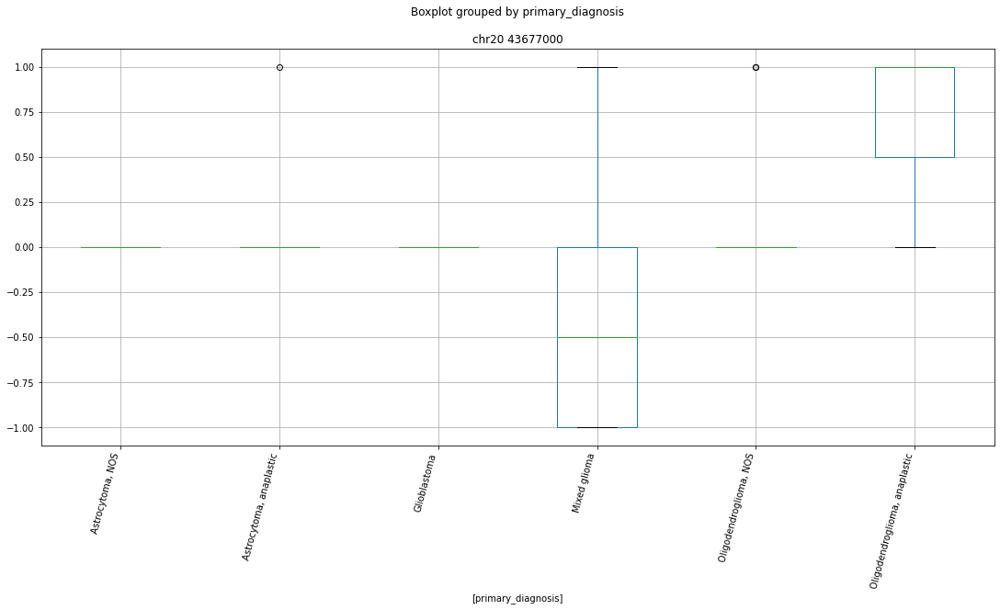

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr2 134968000


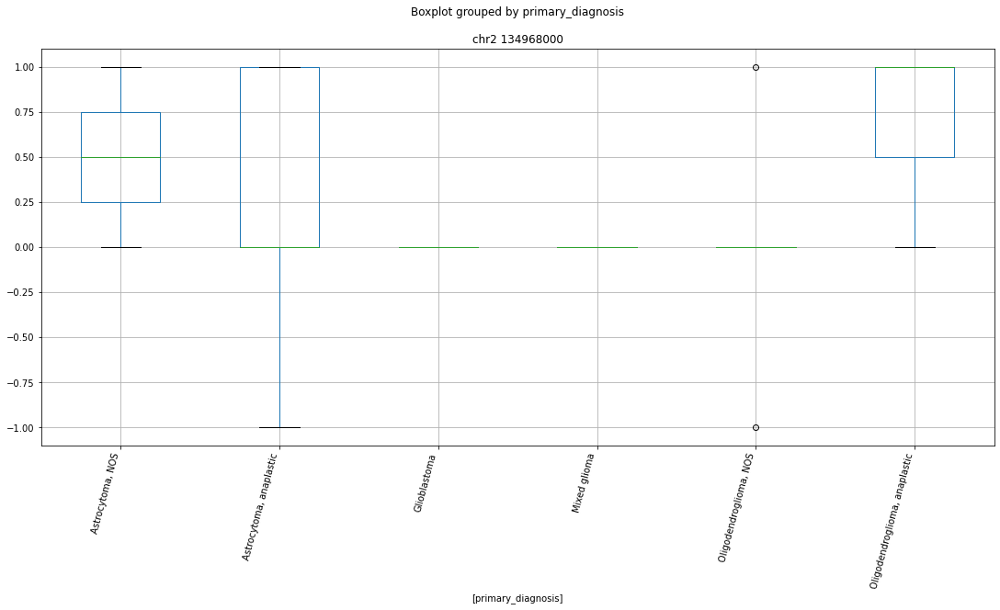

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr1 224101000


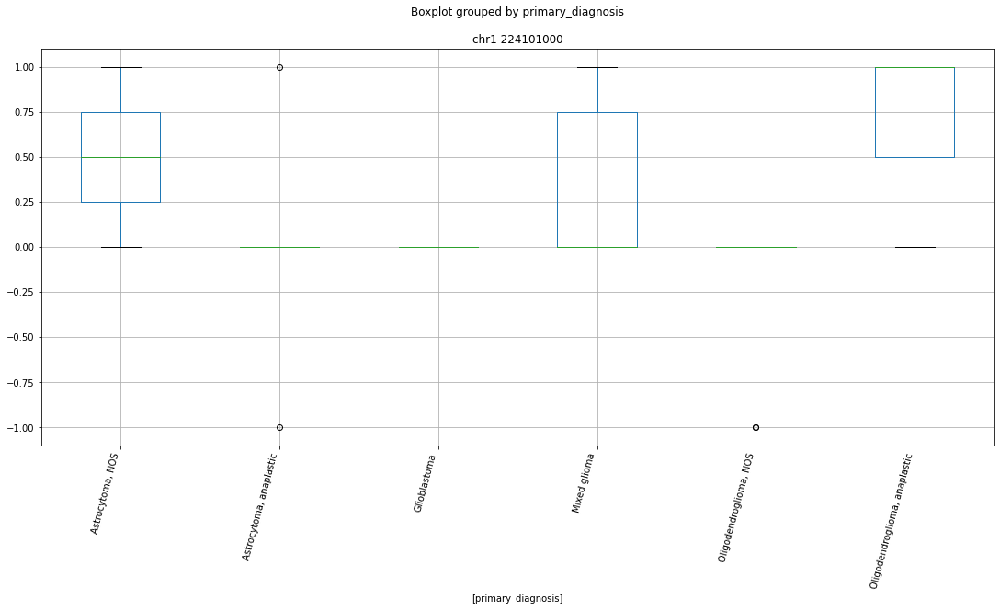

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr22 23536000


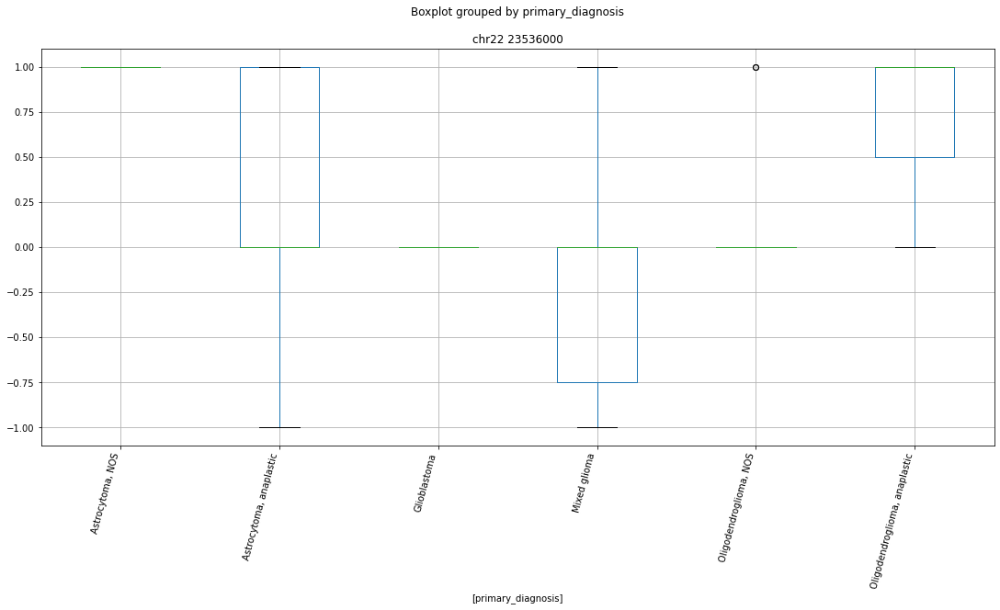

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr22 28553000


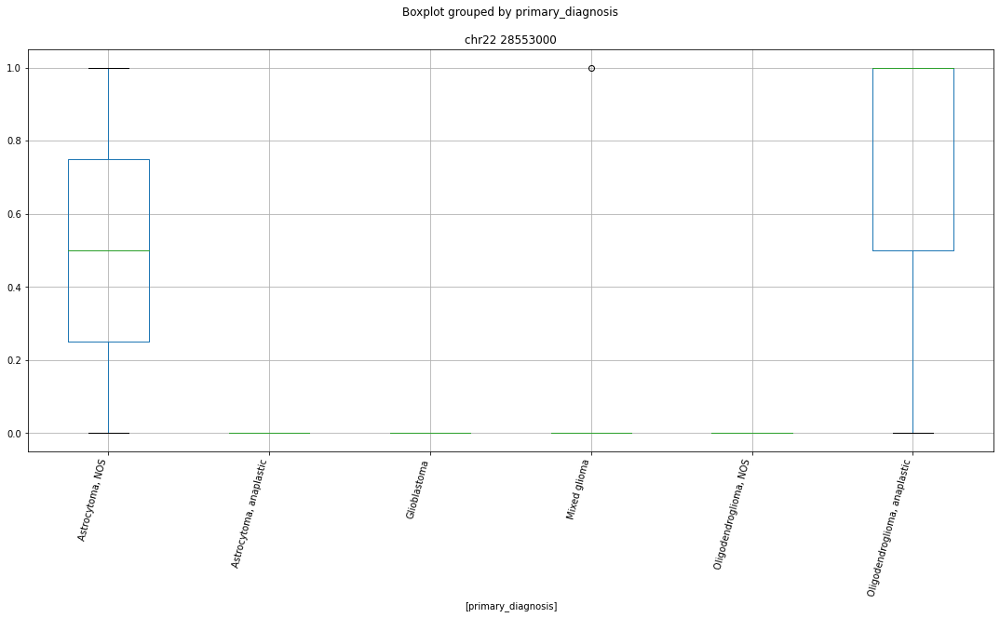

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr11 91064000


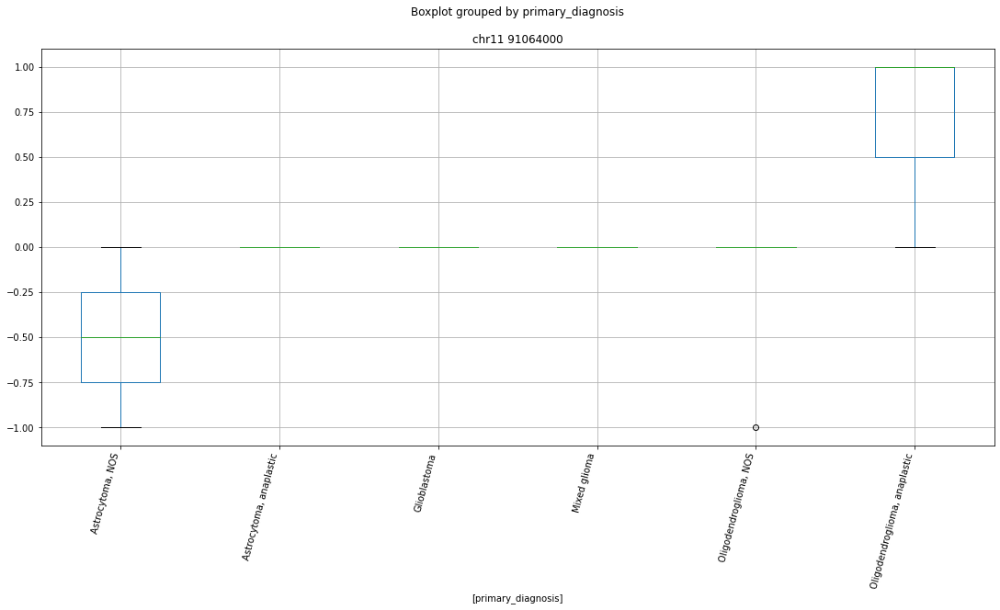

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr6 31067000


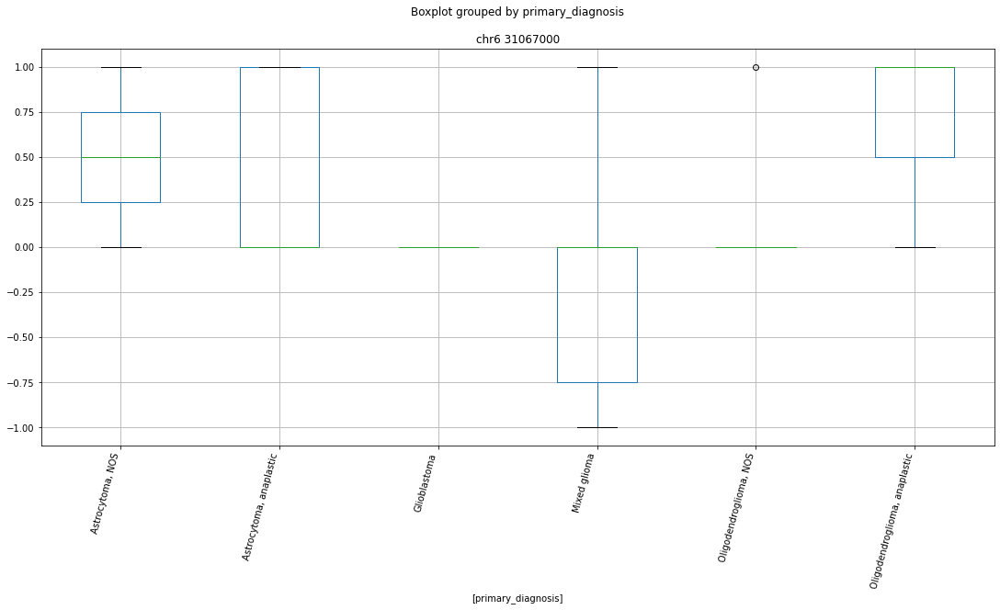

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr6 30993000


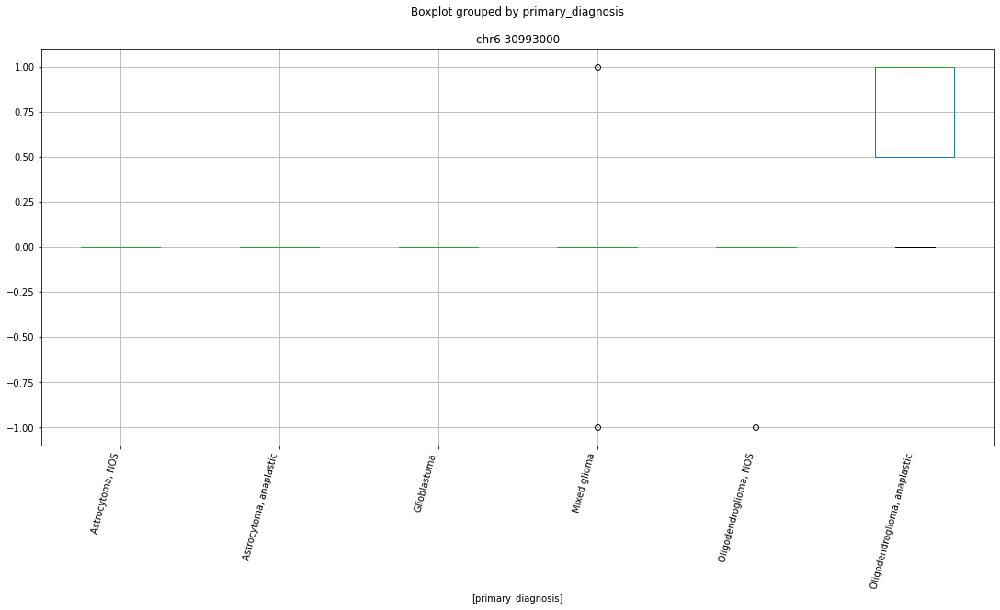

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr3 8326000


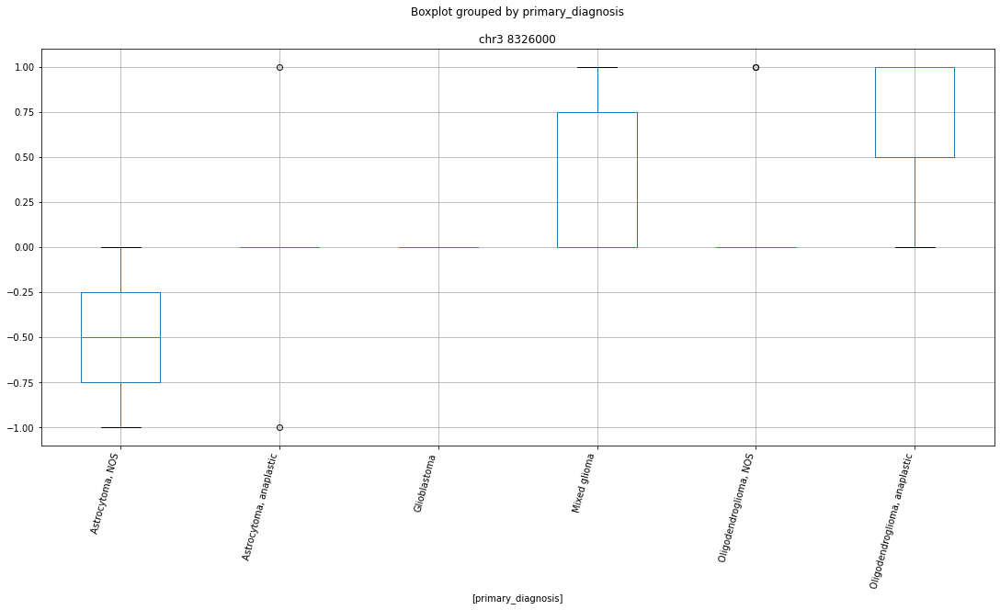

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr6 30475000


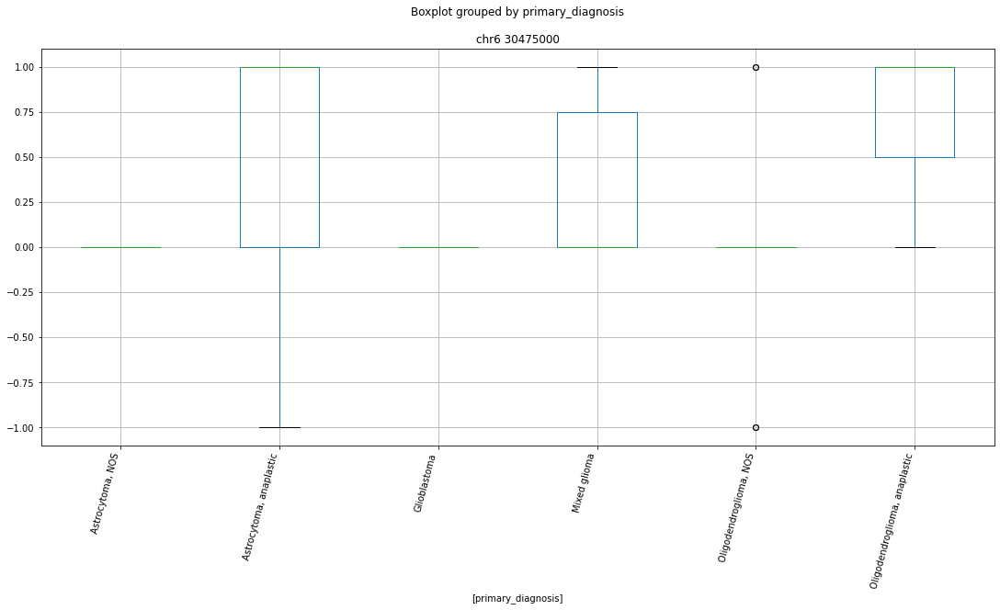

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr3 15062000


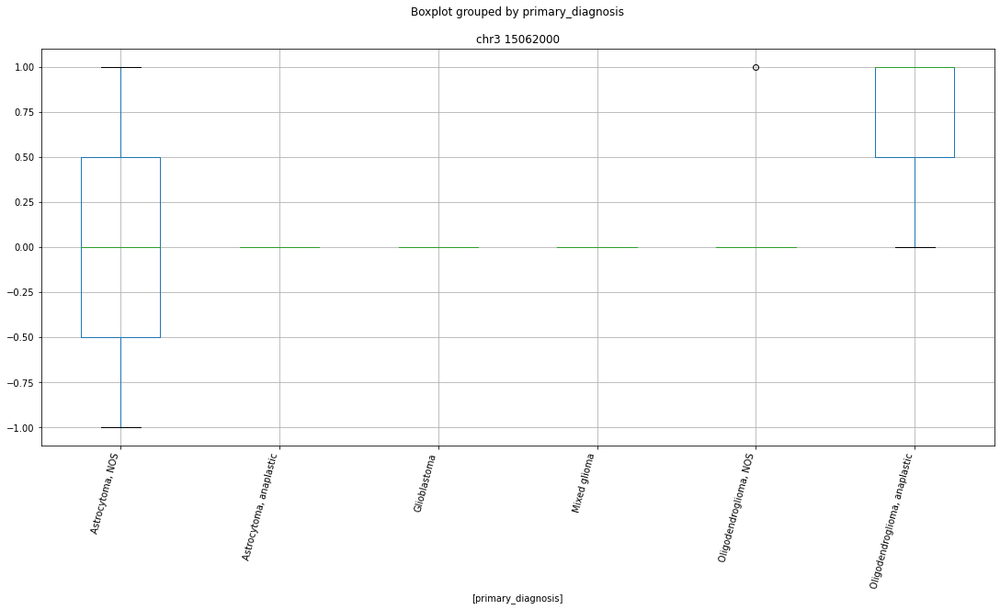

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr3 16979000


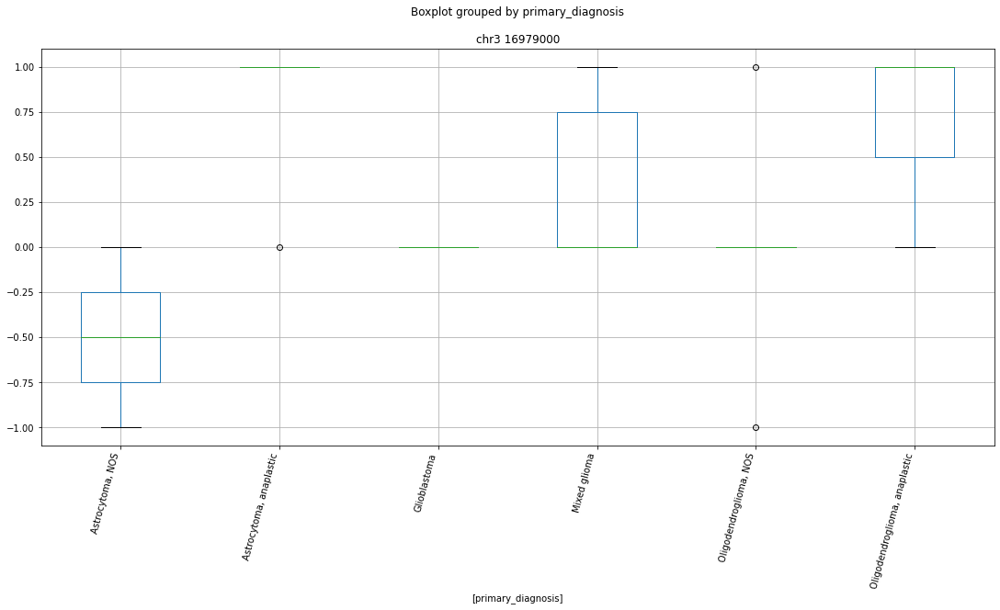

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr3 48062000


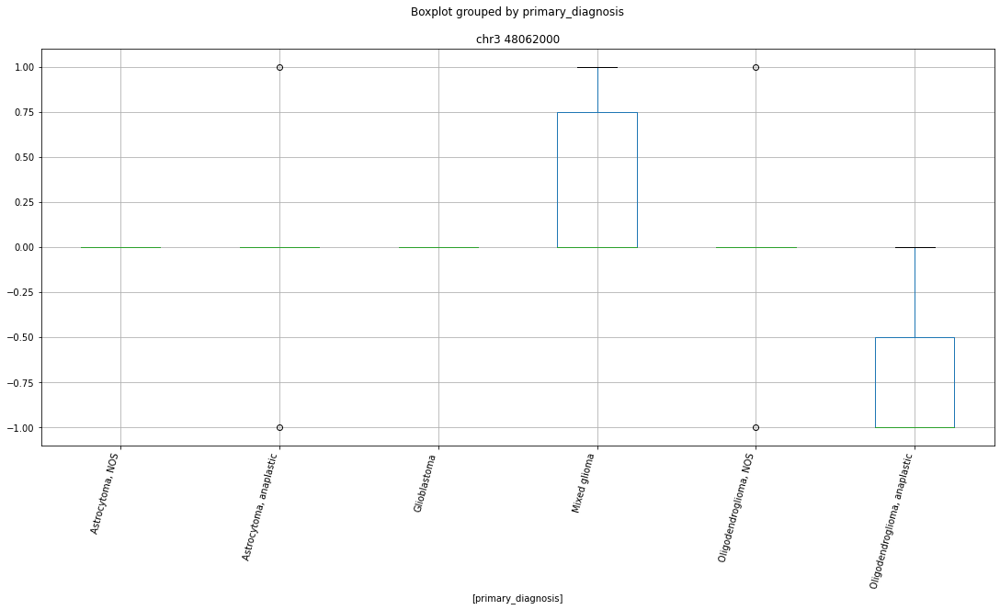

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr1 199904000


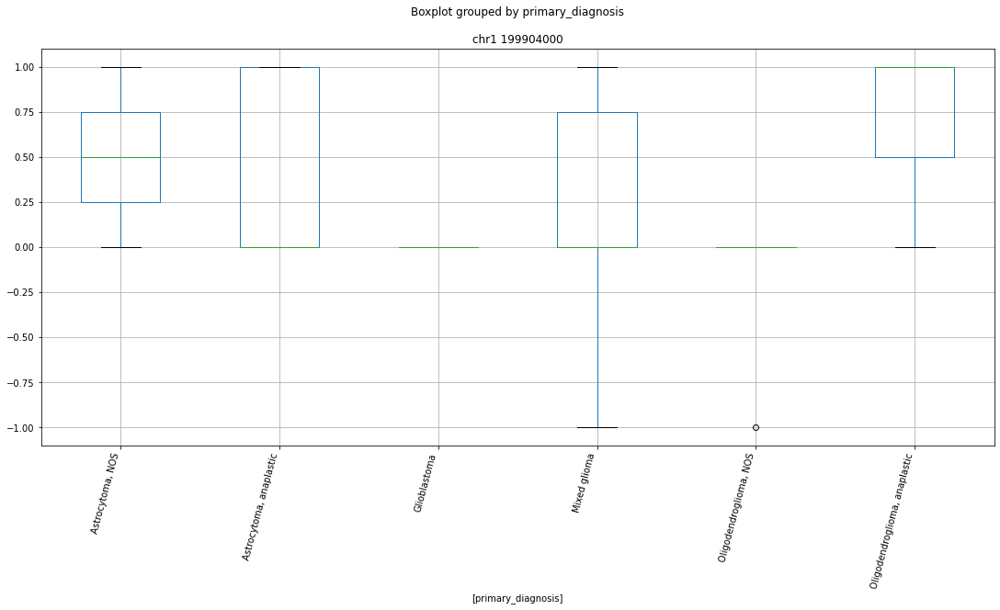

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr20 49922000


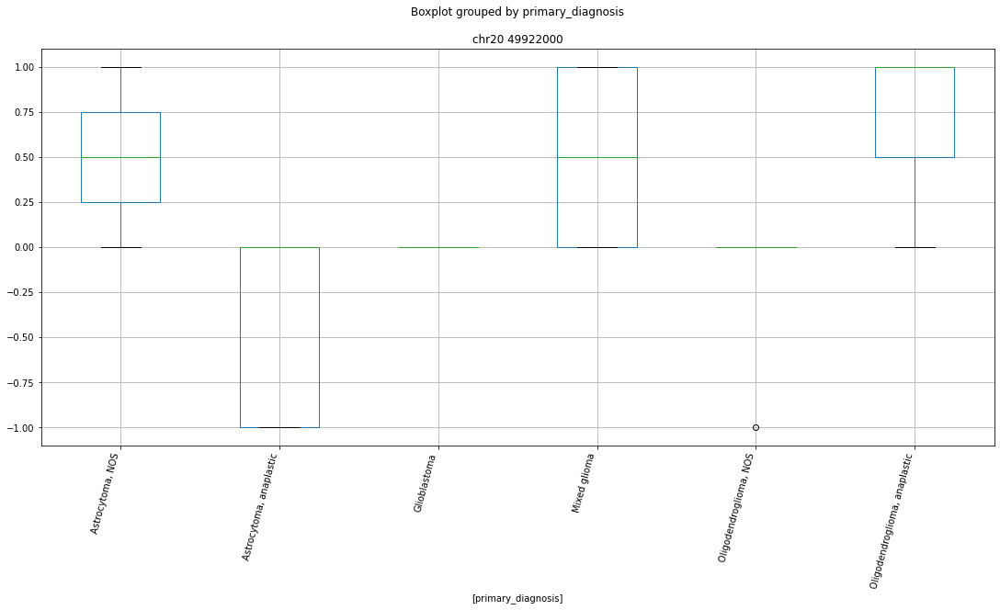

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr8 42939000


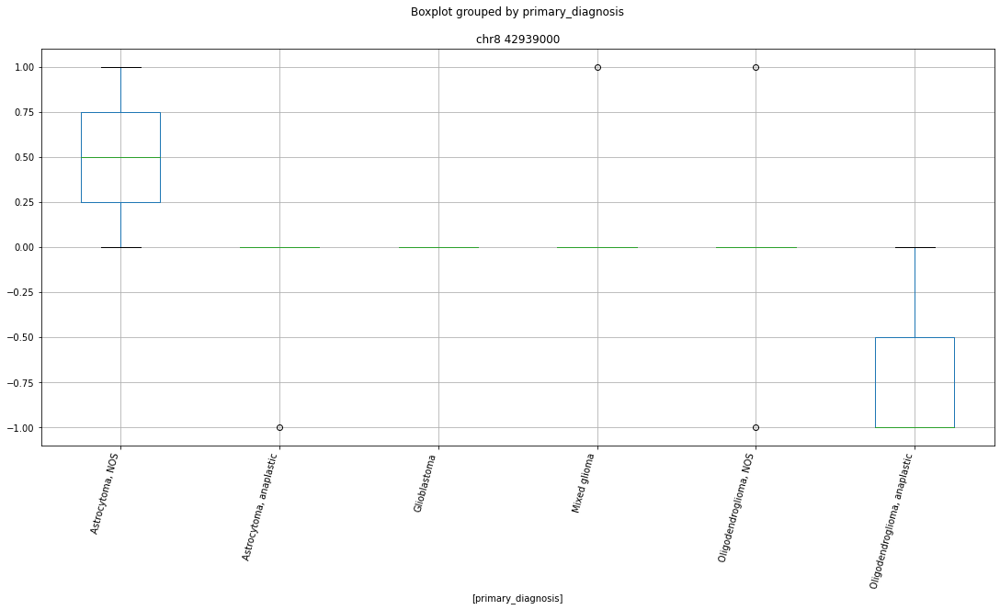

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr11 83133000


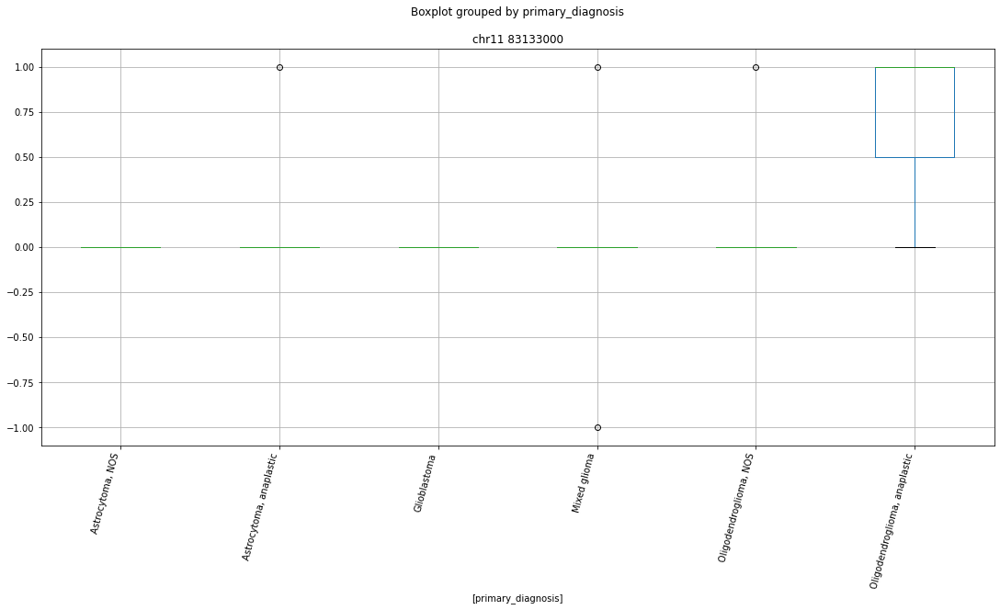

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr17 62073000


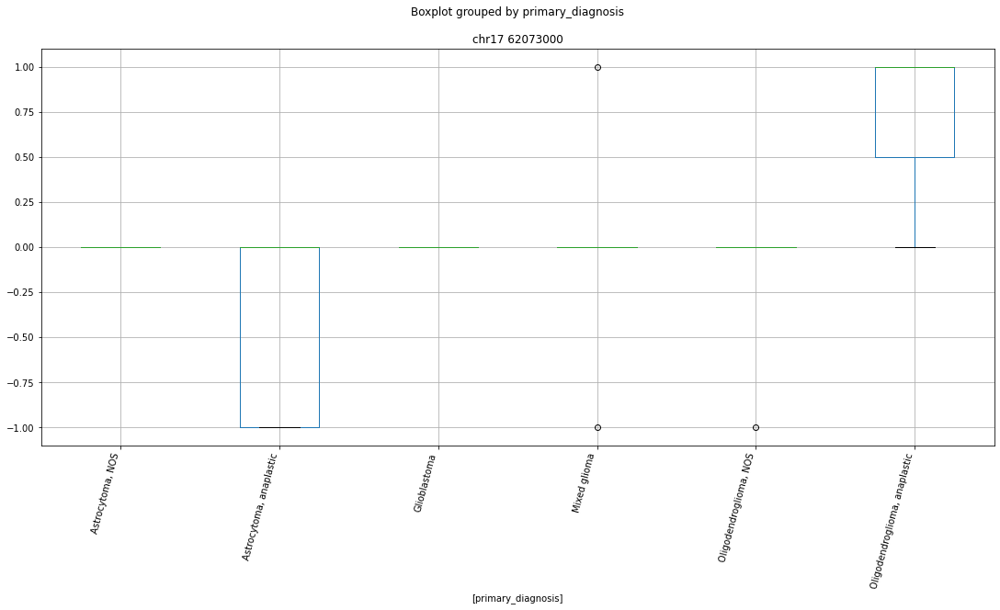

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr13 26724000


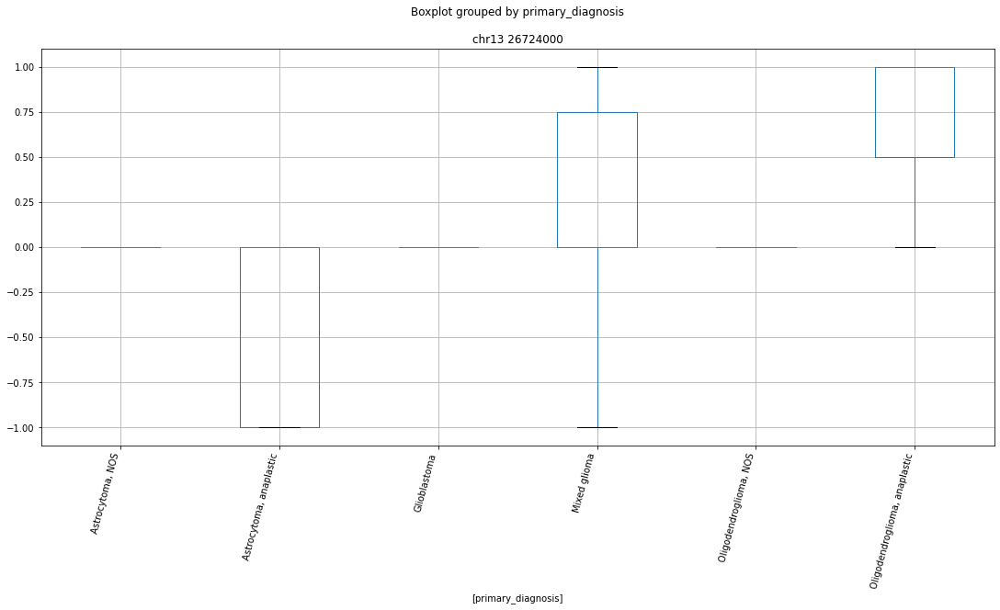

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr13 30839000


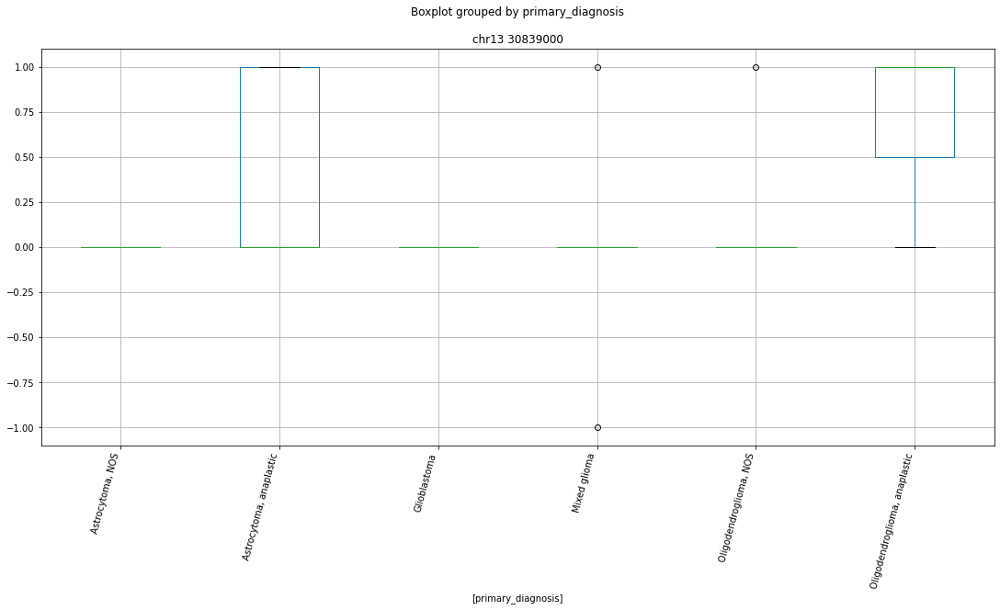

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr13 34181000


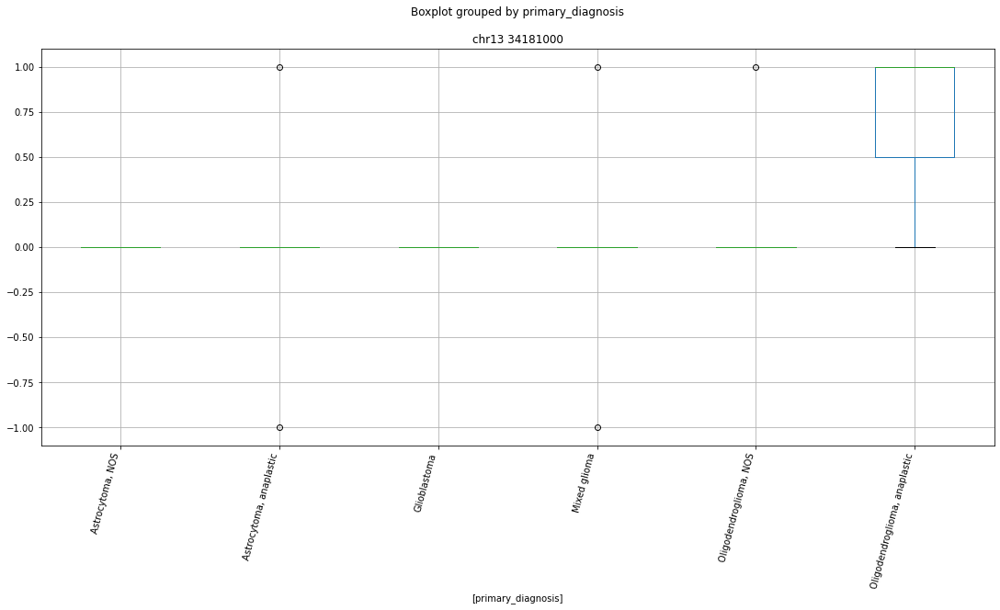

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr13 99242000


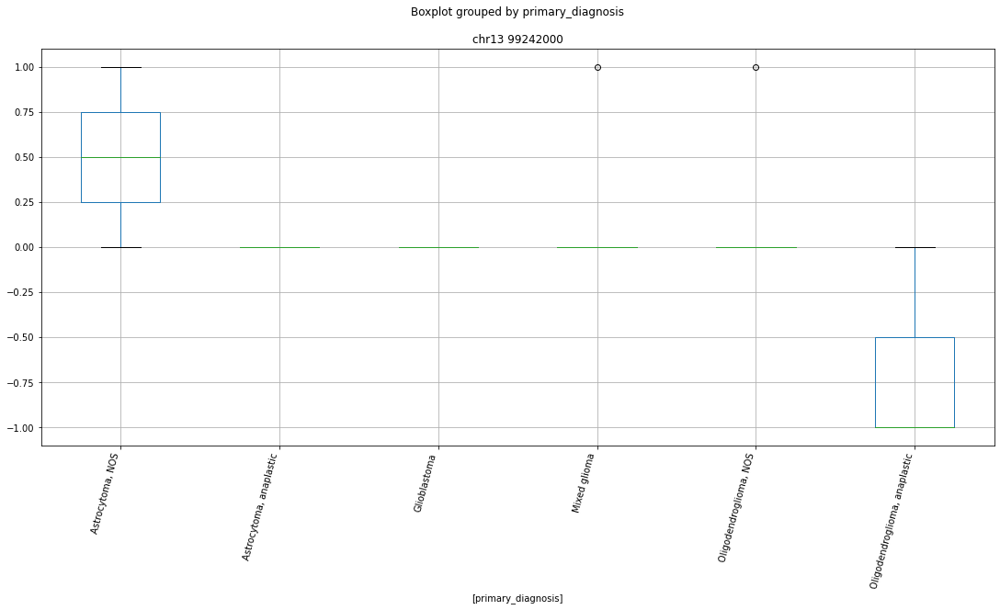

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr14 20507000


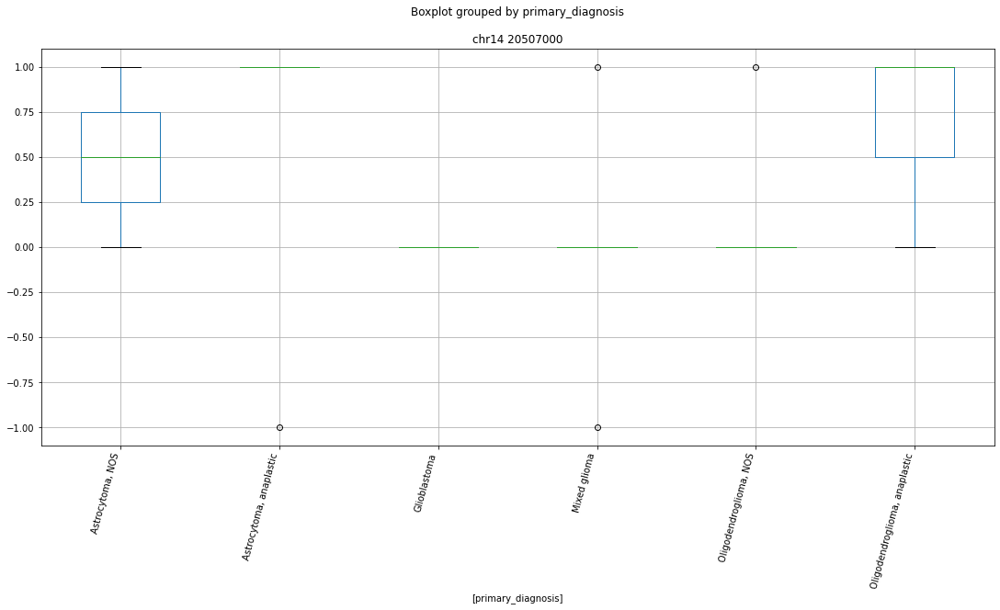

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr11 62326000


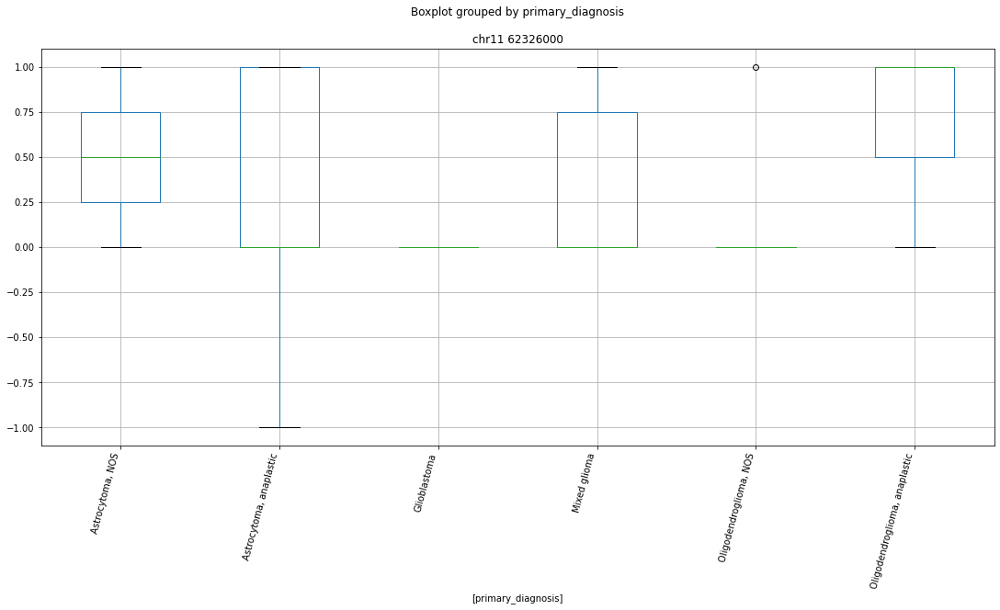

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr14 25792000


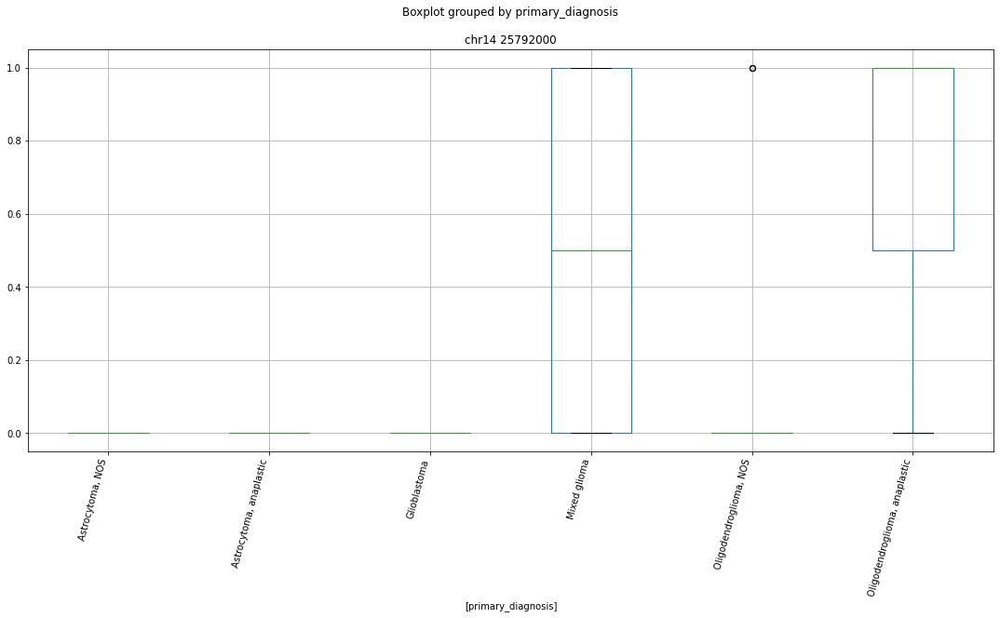

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr9 97232000


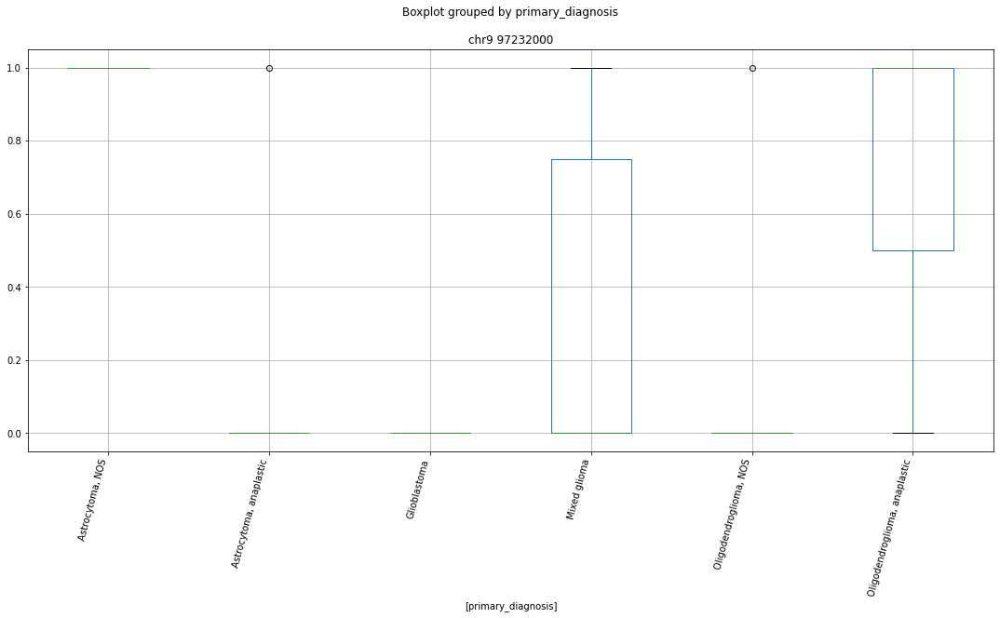

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chrX 16968000


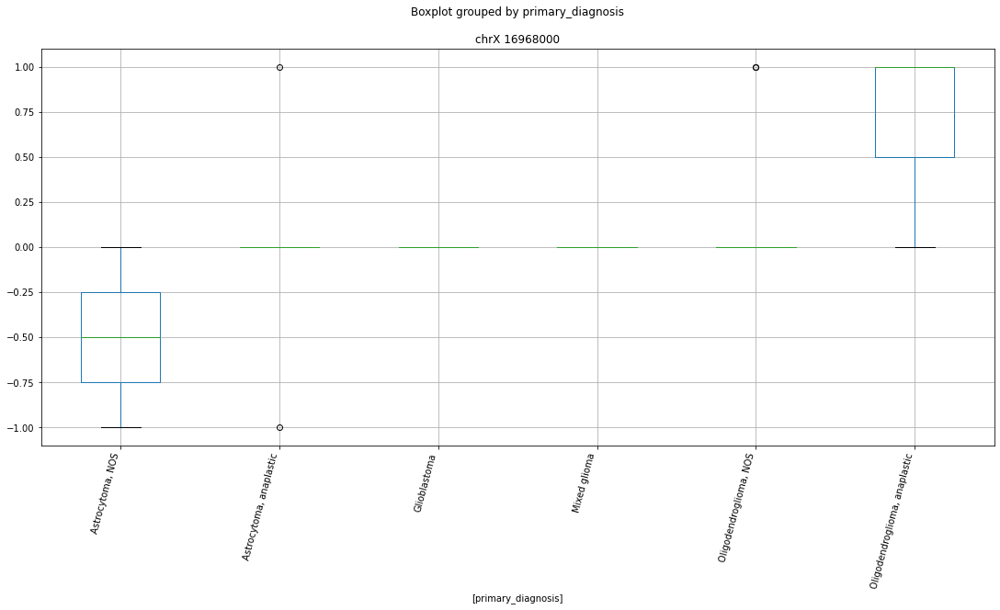

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr14 41673000


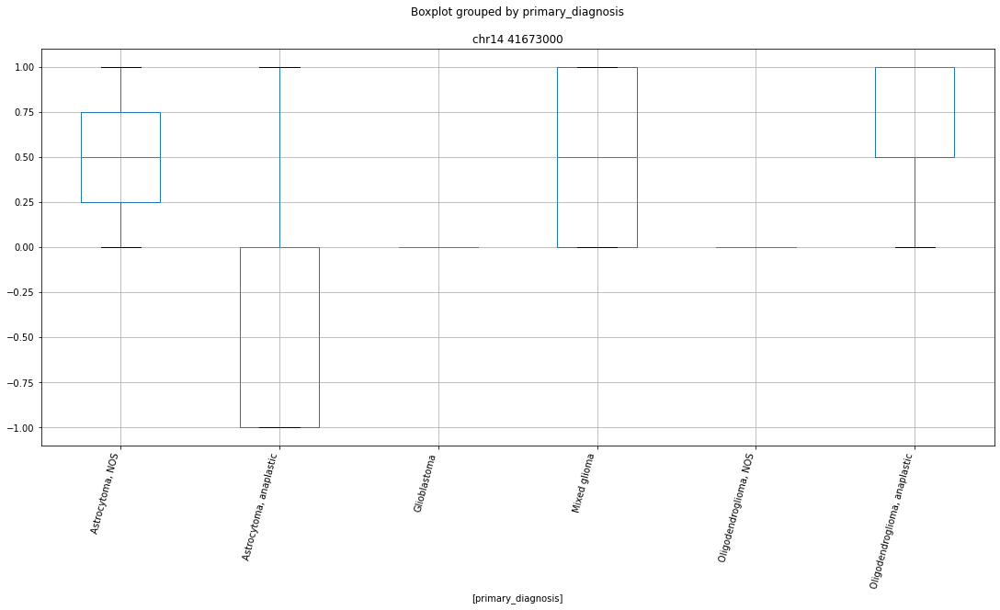

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr11 59700000


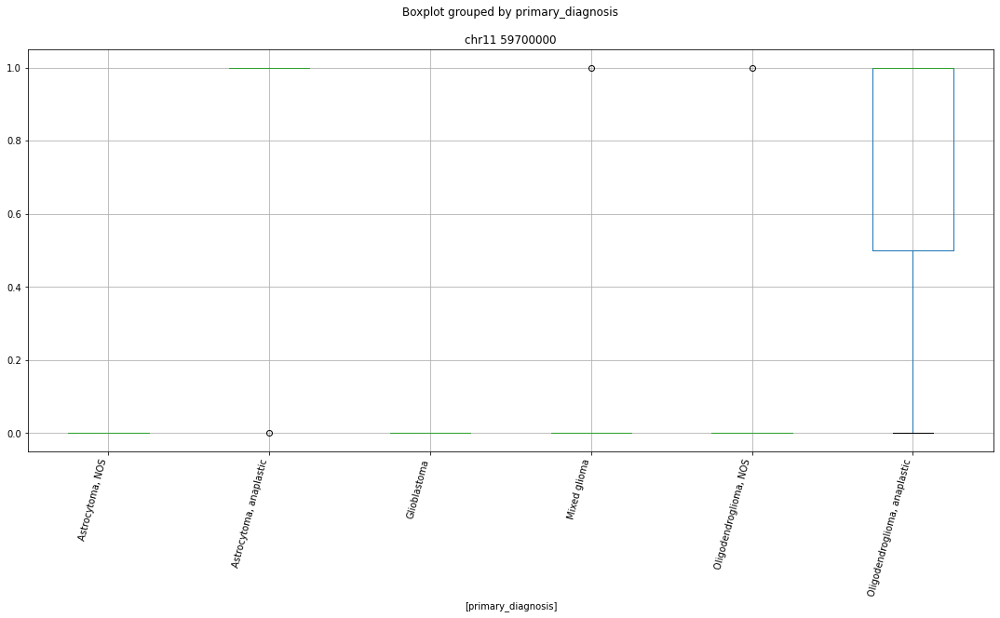

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr1 31177000


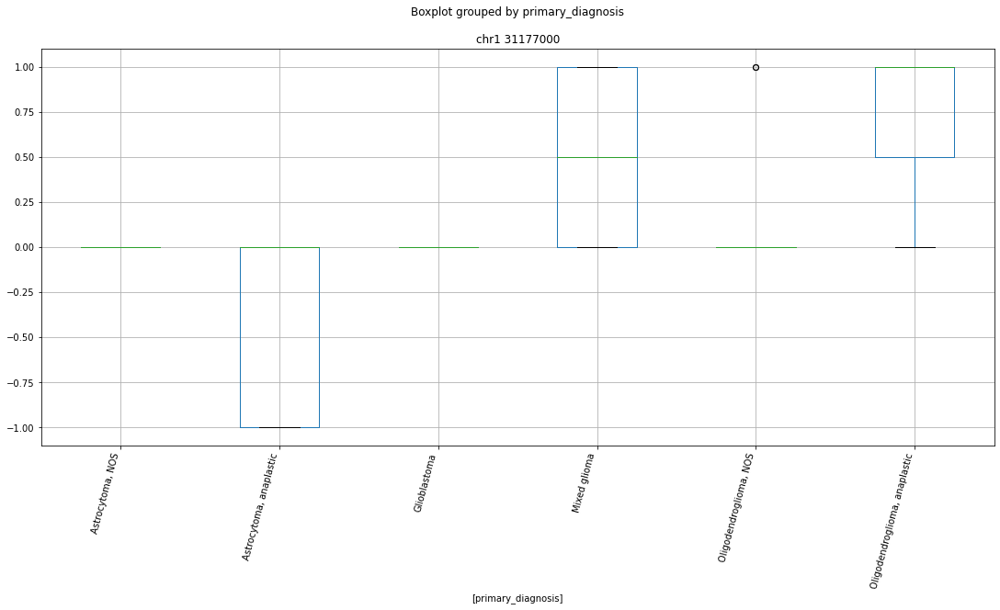

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr9 87758000


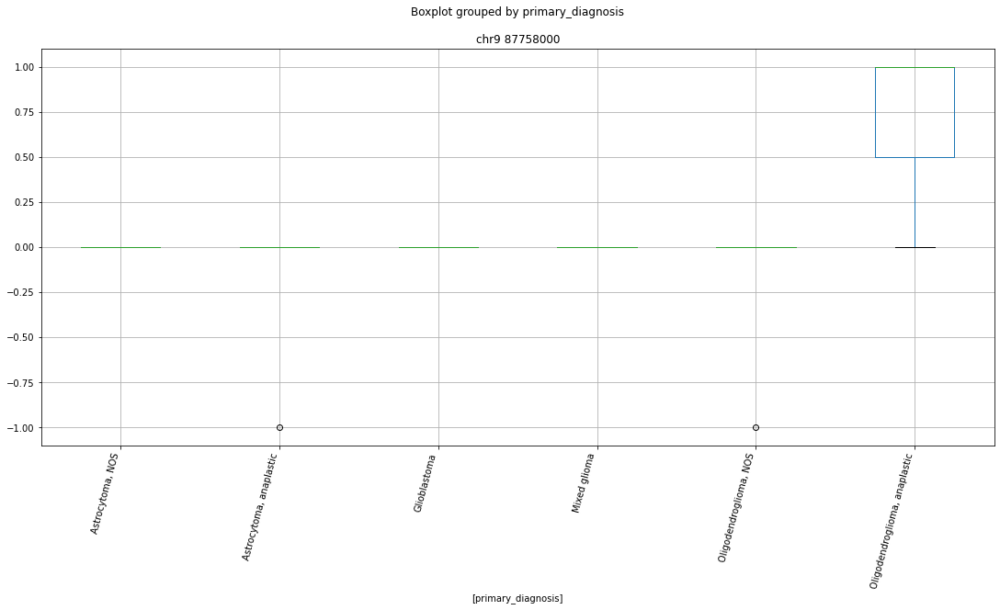

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr14_KI270724v1_random 18000


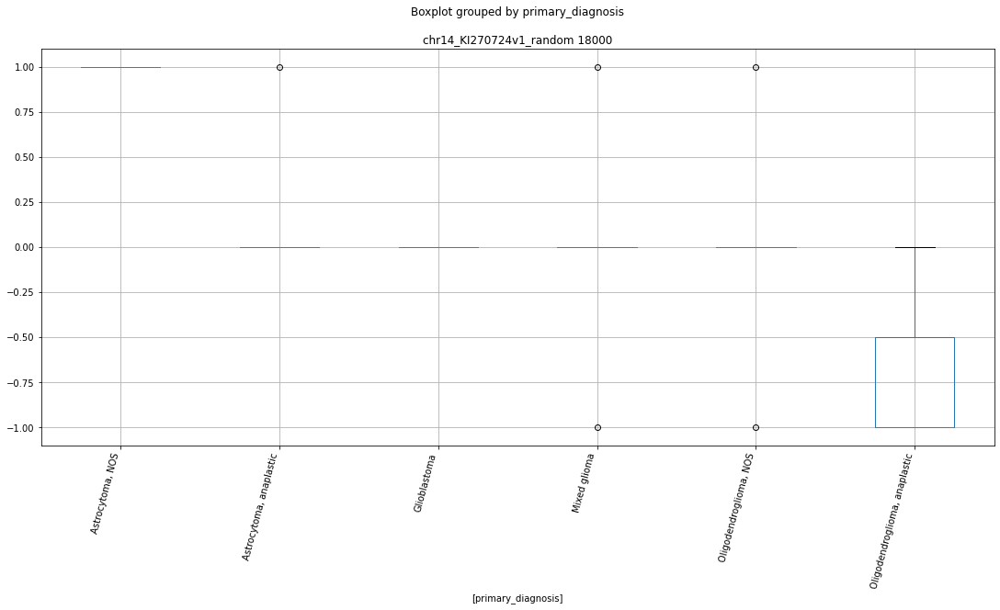

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr15 74729000


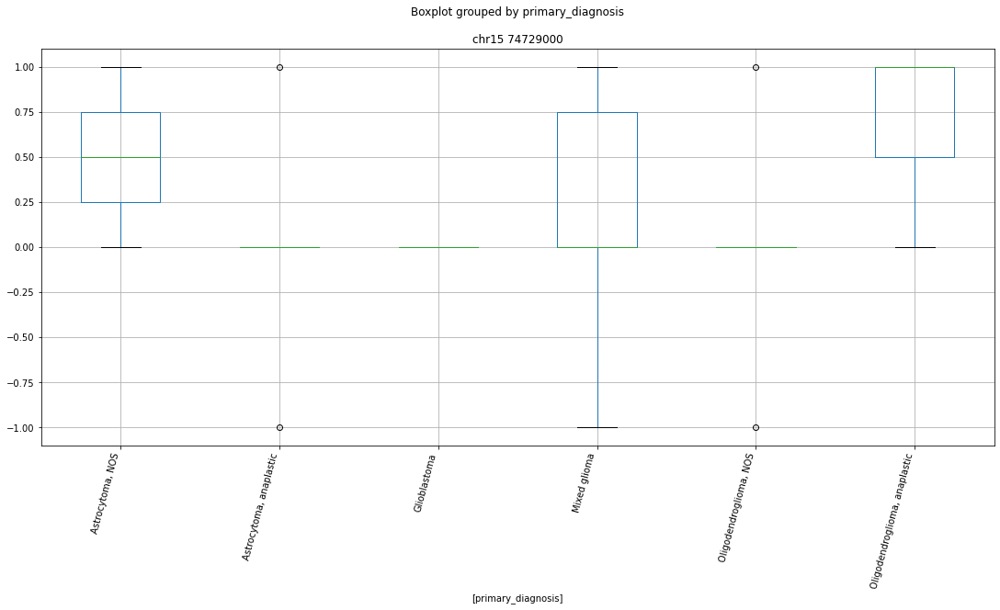

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr9 76955000


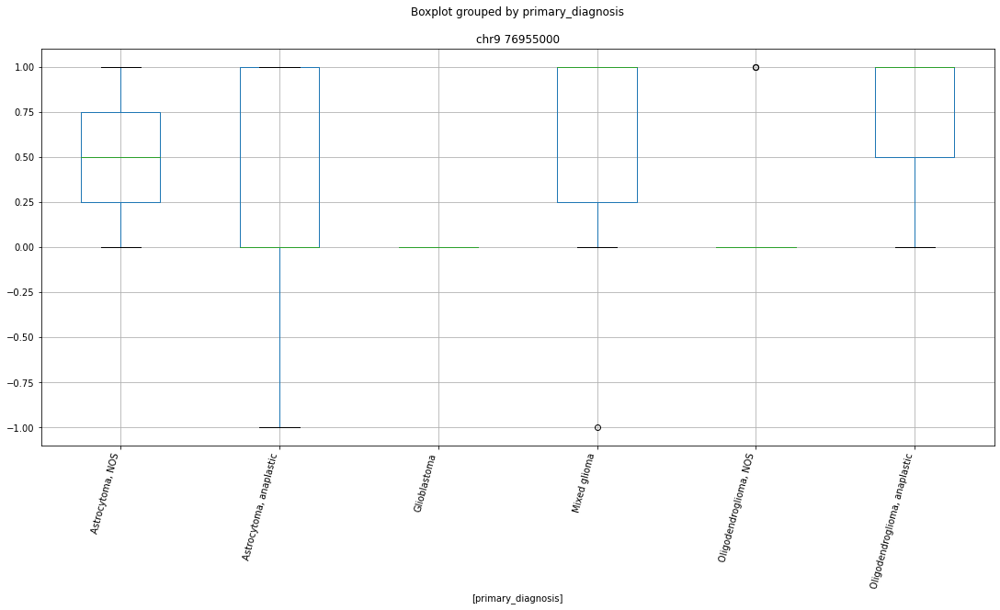

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr15 89296000


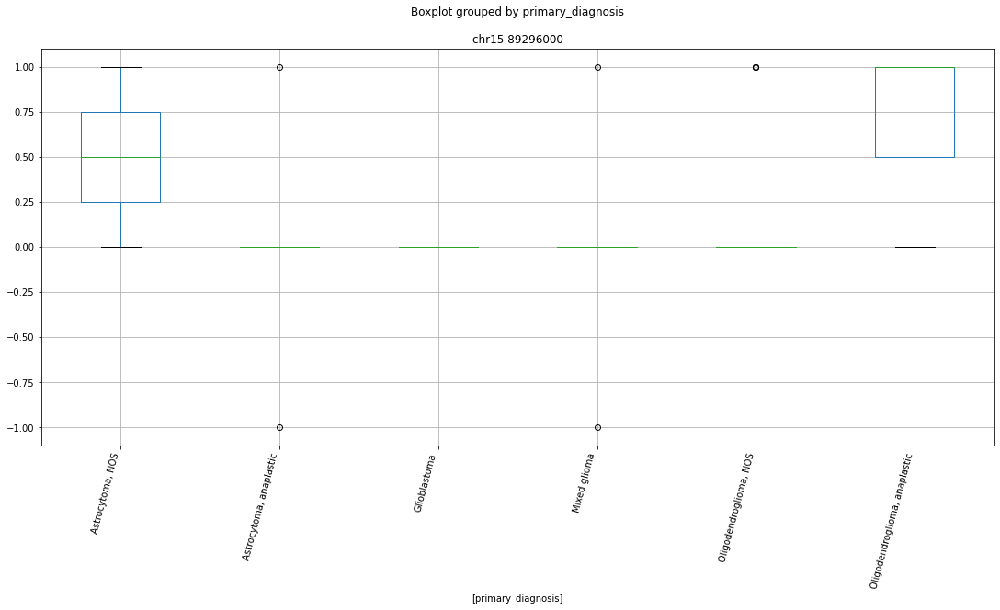

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr9 19433000


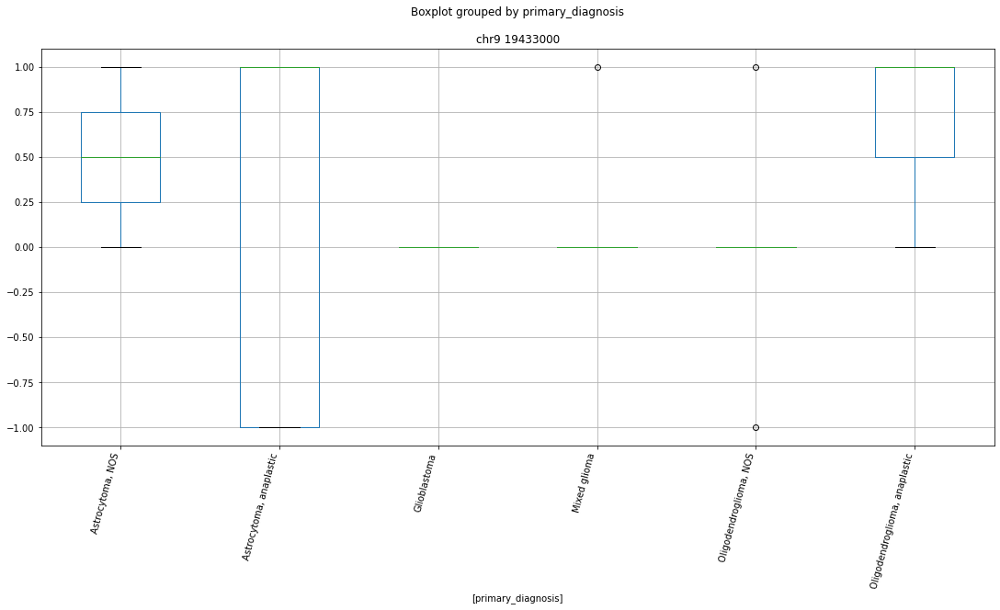

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr14 45213000


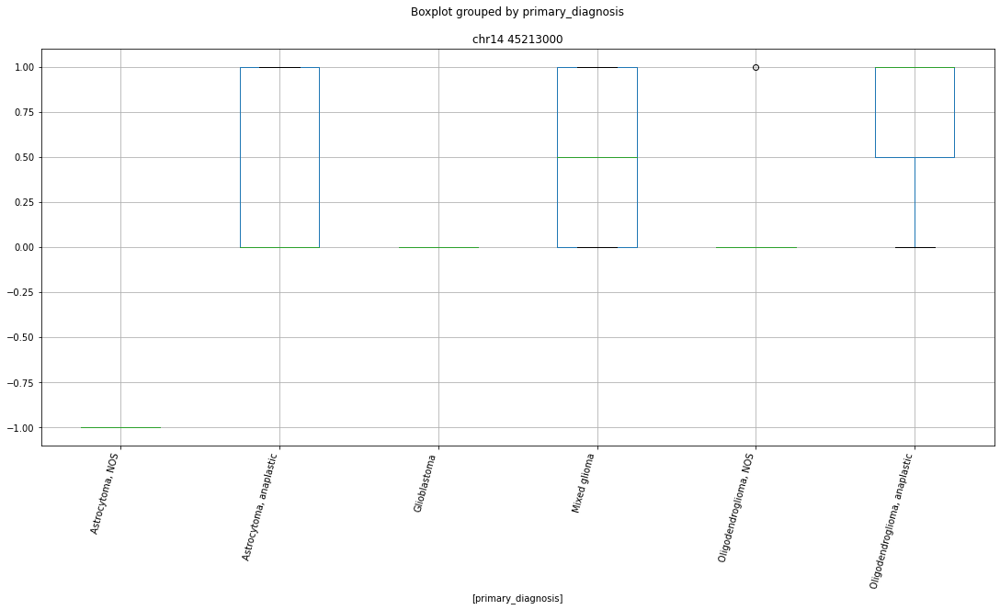

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr11 67477000


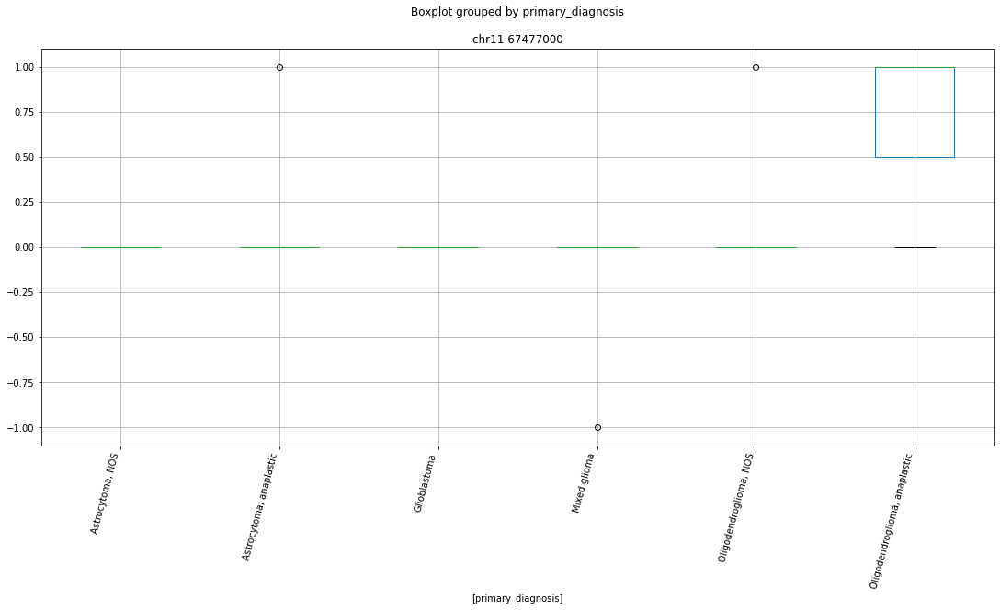

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr1 25604000


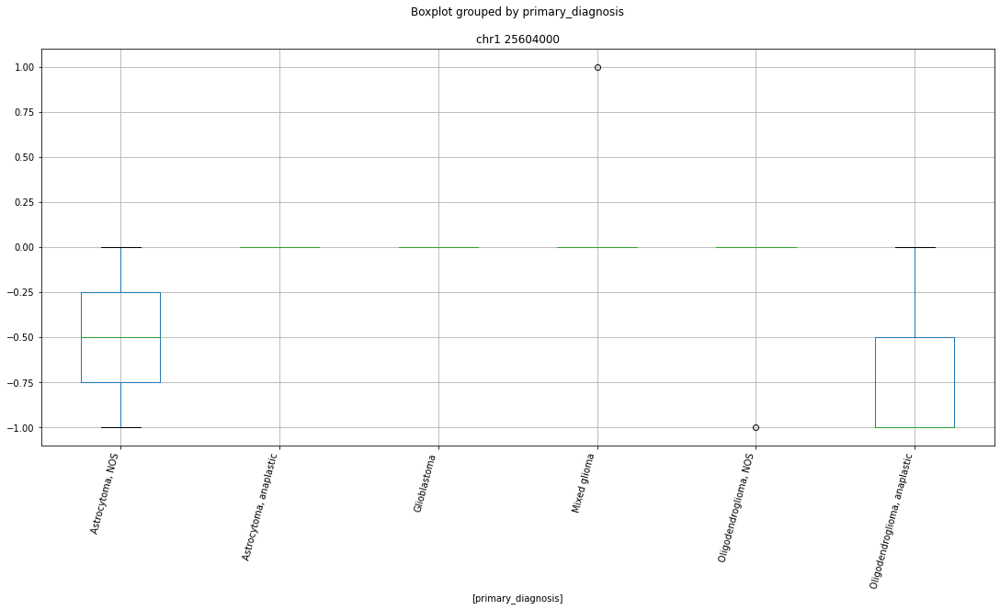

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr13 23972000


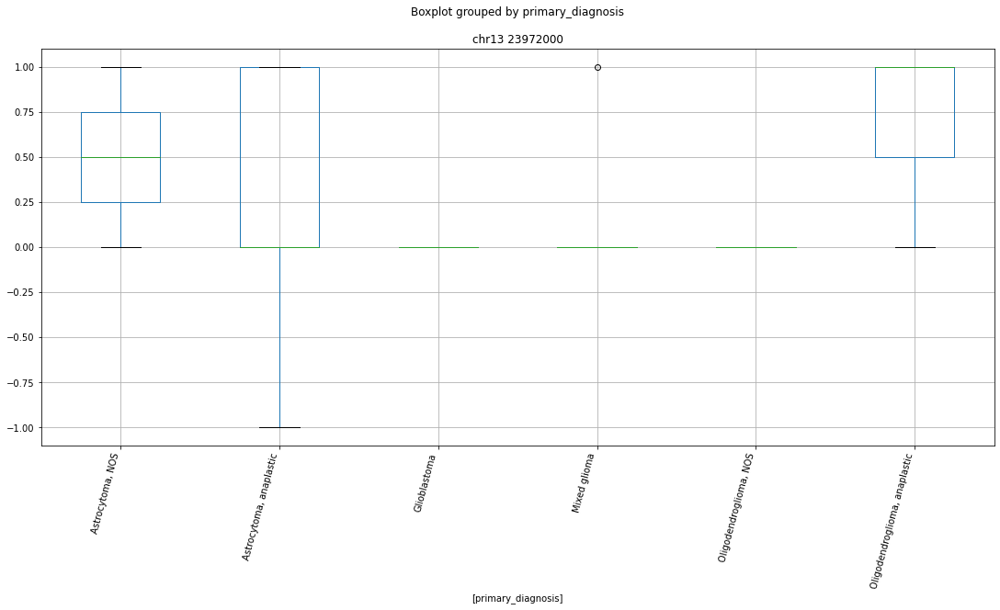

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr11 119059000


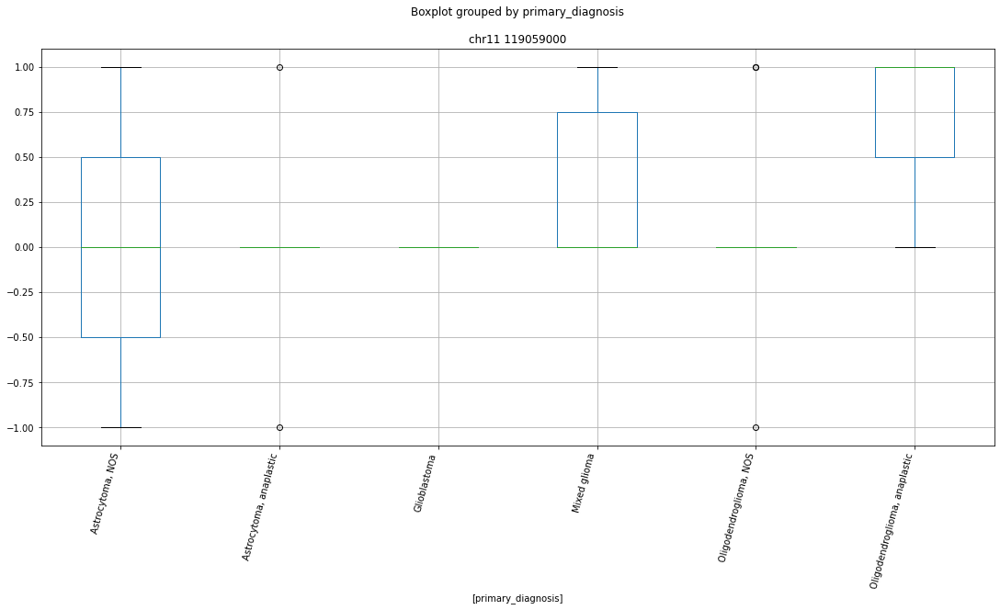

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chrX 155907000


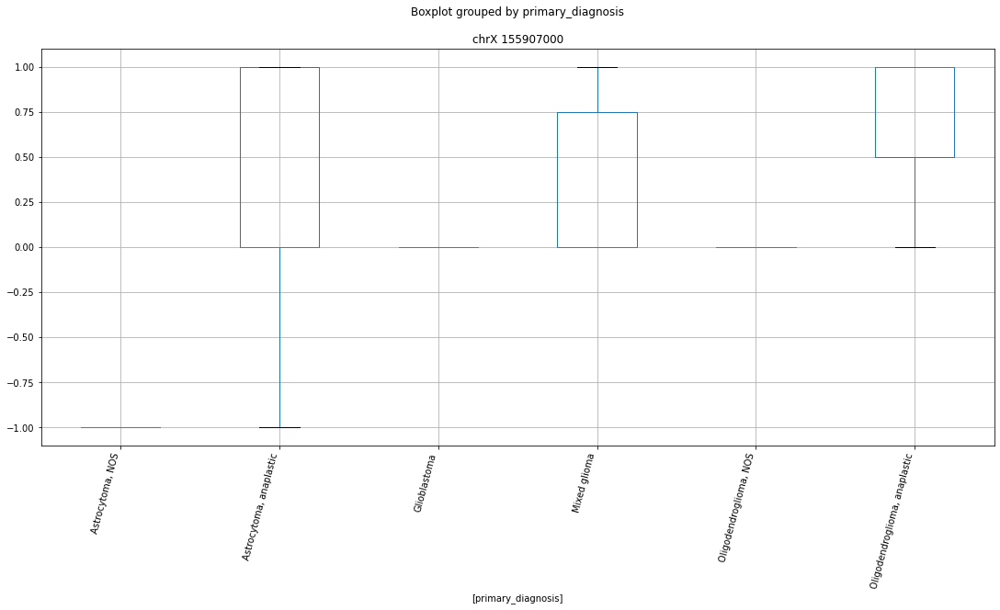

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr12 7589000


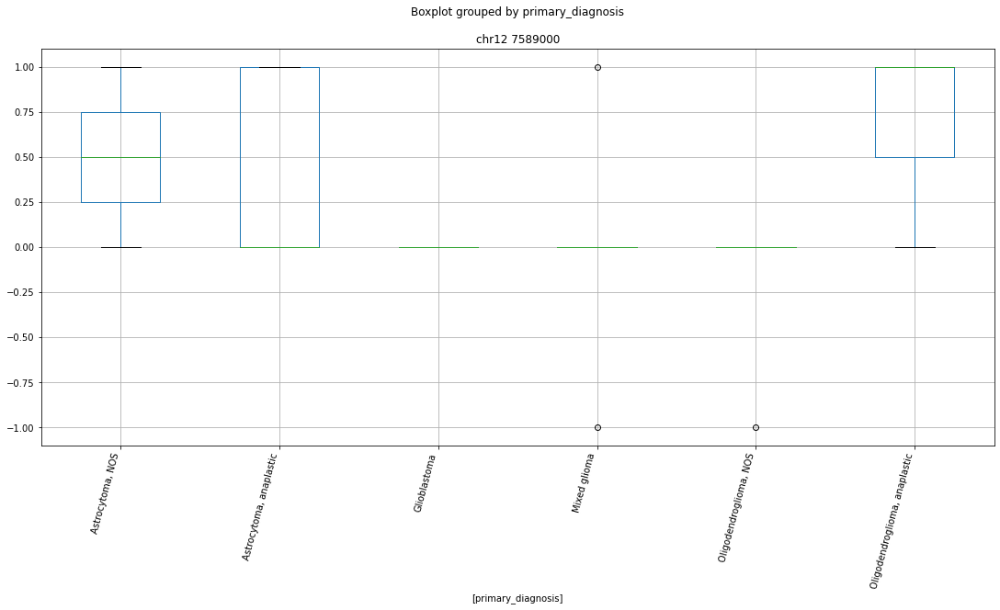

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chrX 145436000


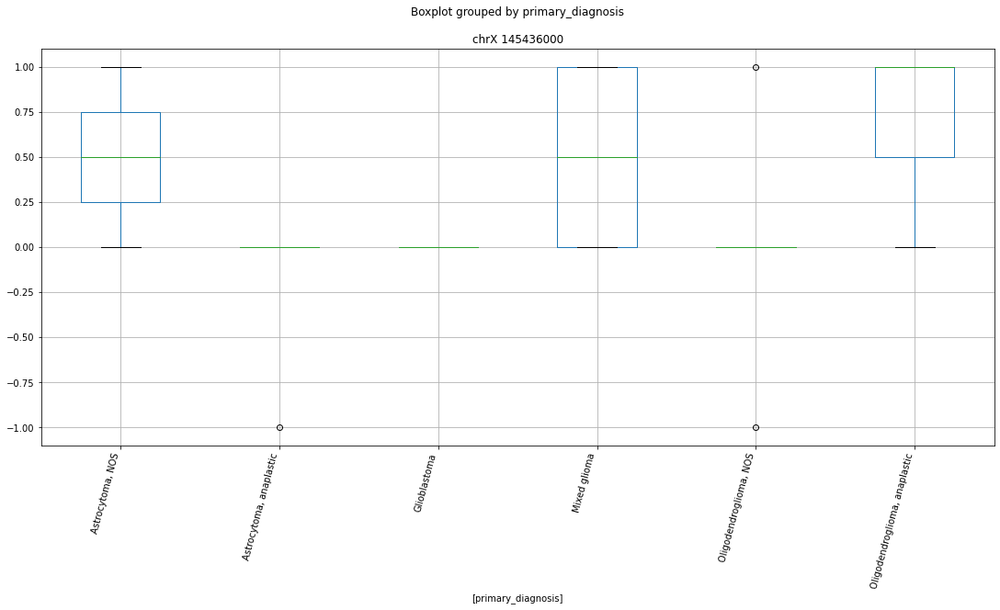

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr12 8184000


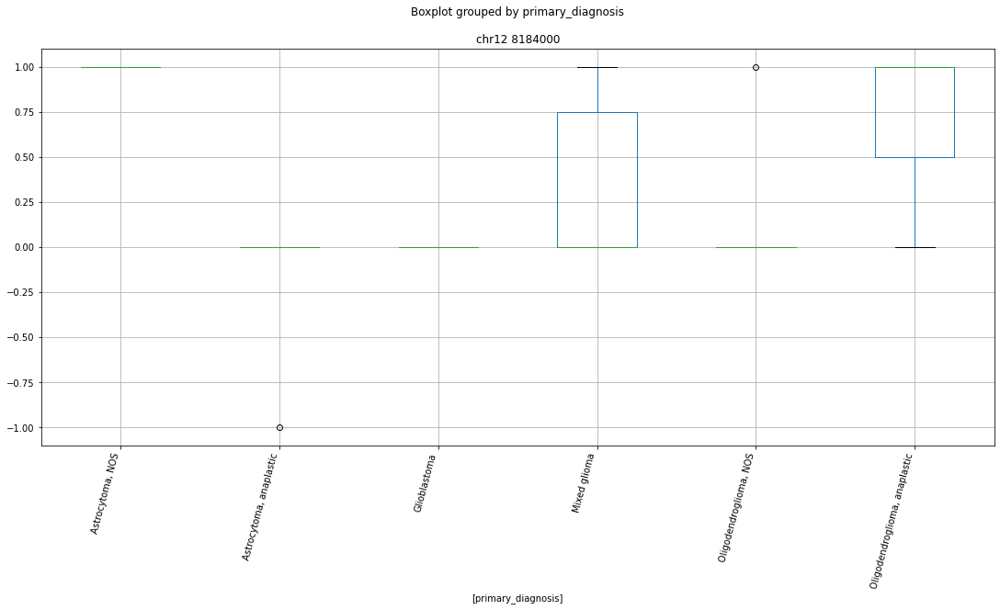

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr11 74353000


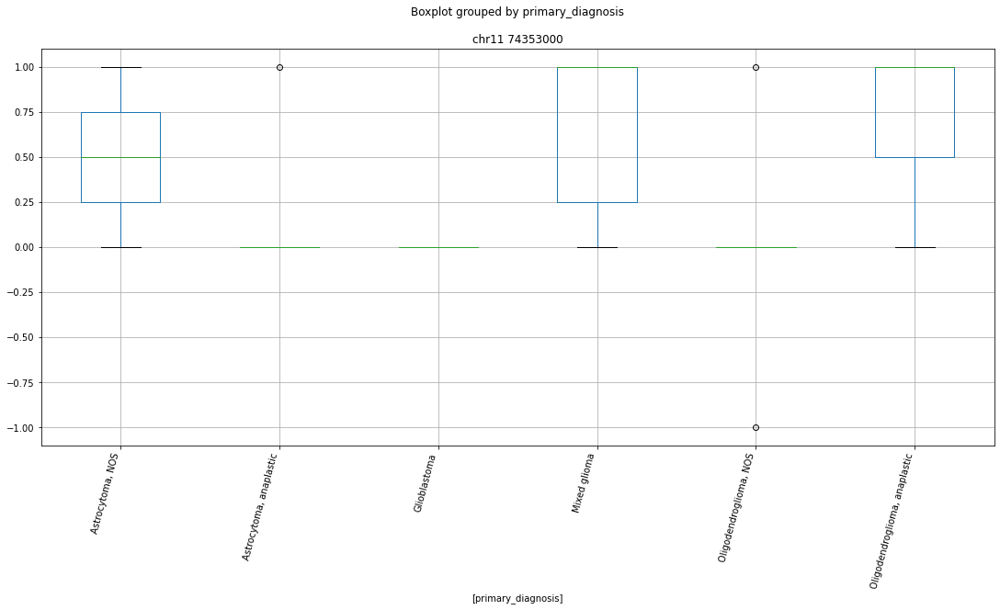

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr12 8635000


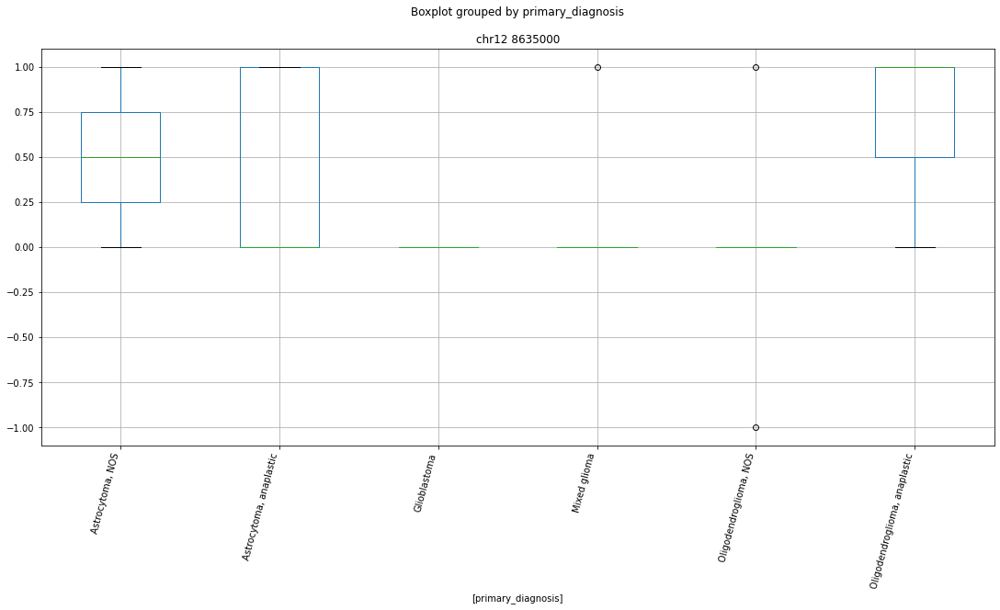

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr11 73896000


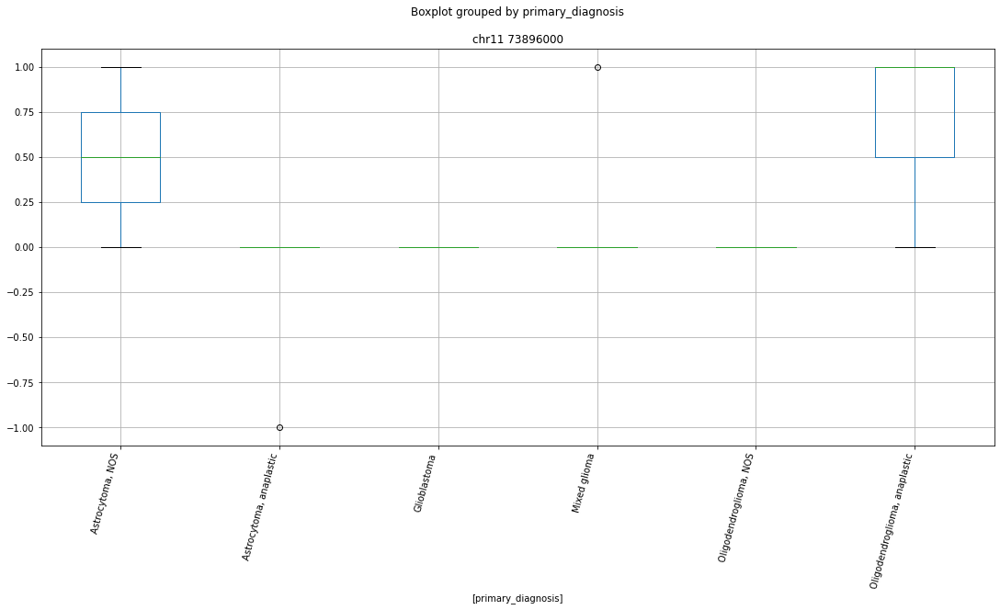

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr12 48725000


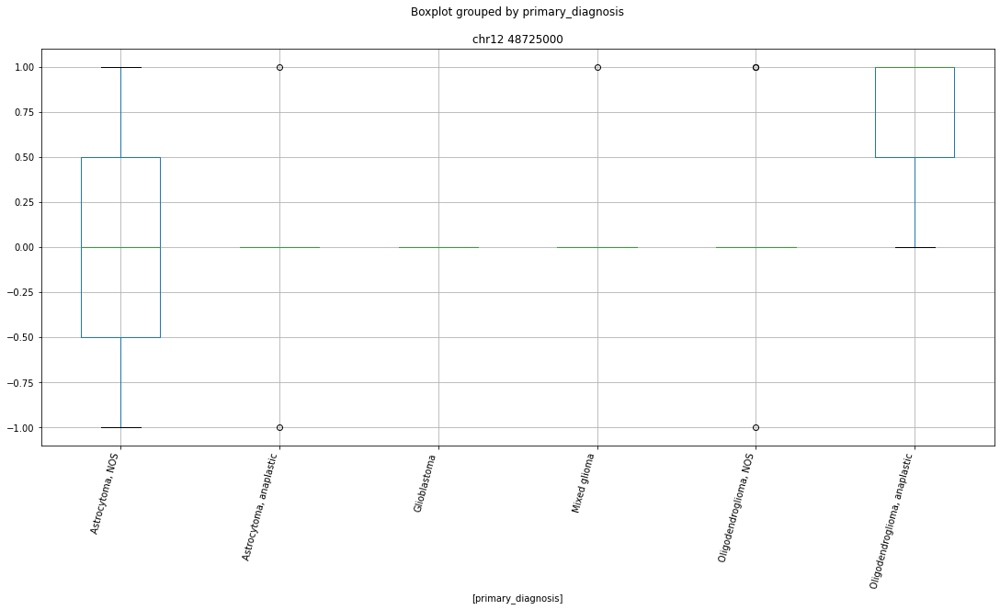

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr12 49283000


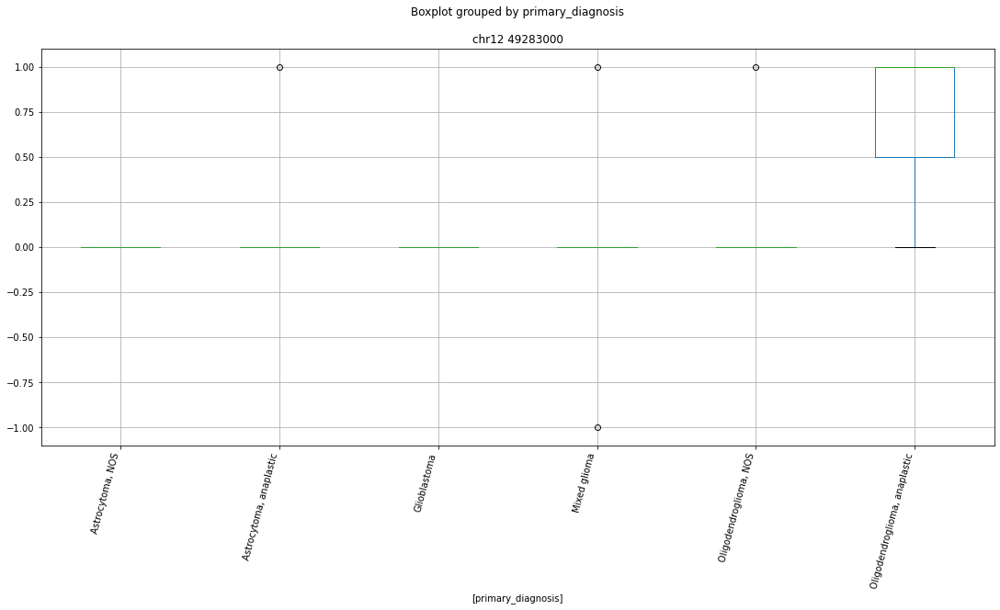

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr12 49436000


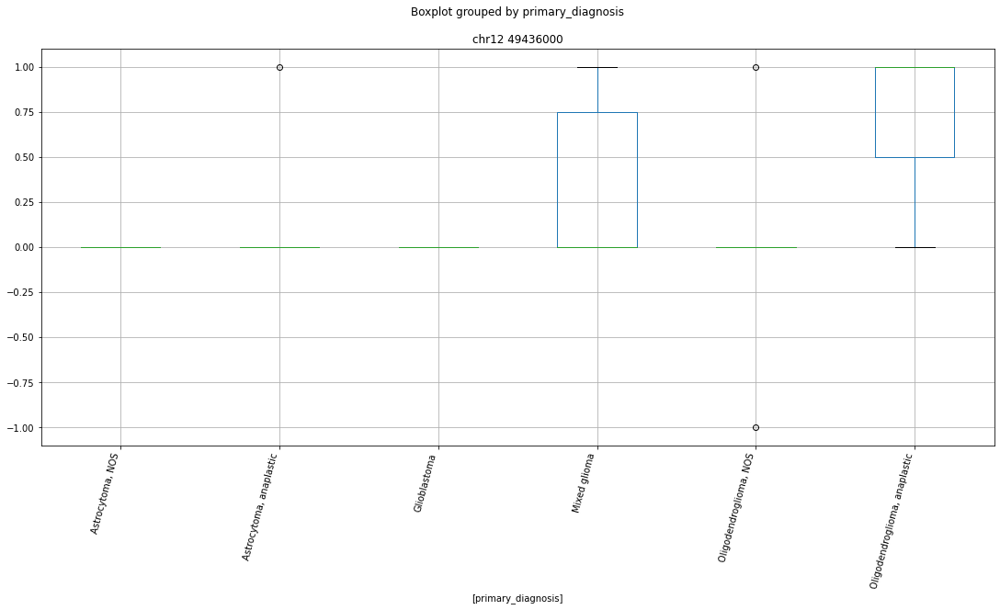

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr12 49861000


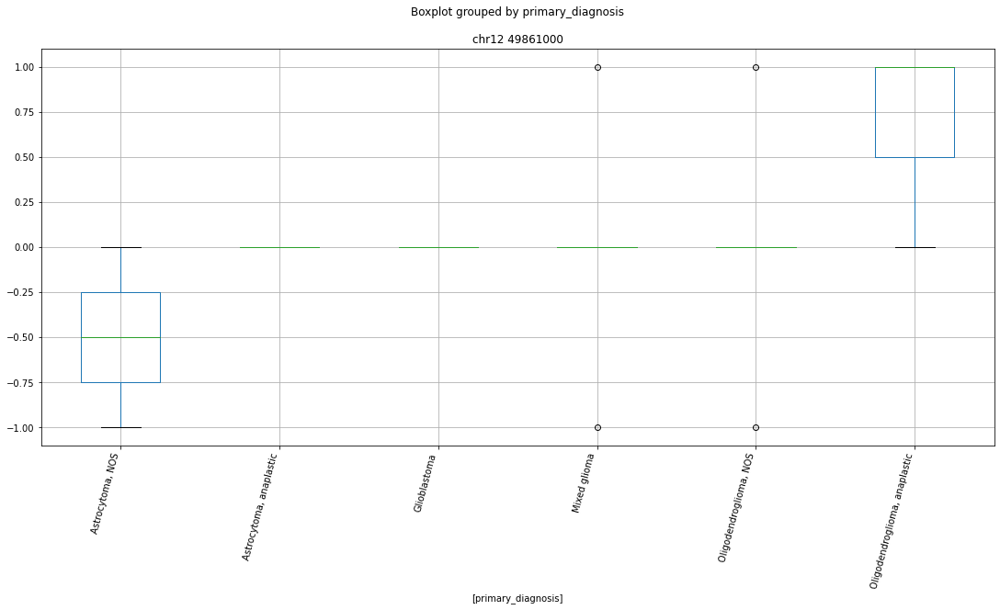

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chrX 74568000


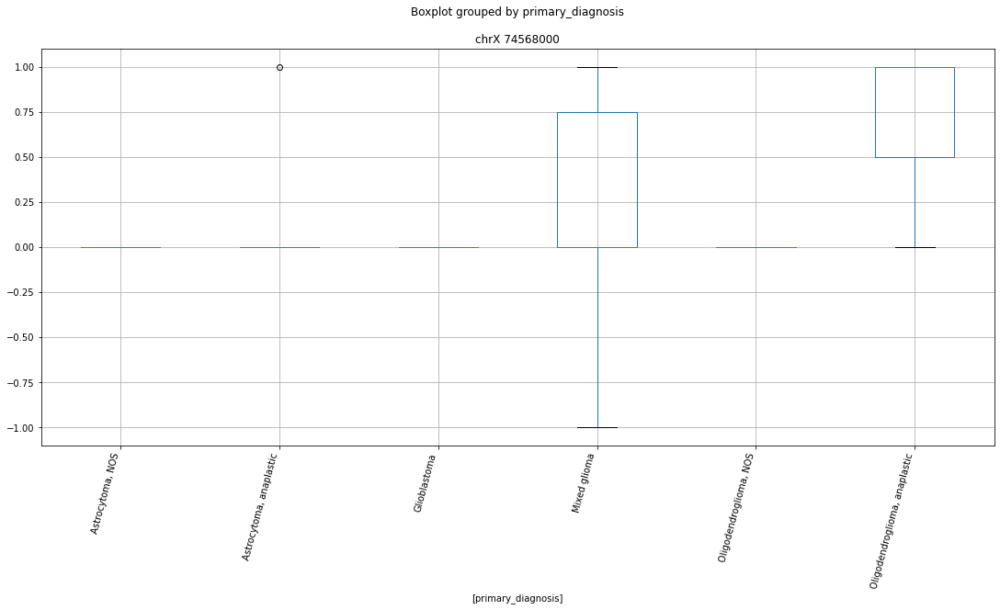

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr12 53122000


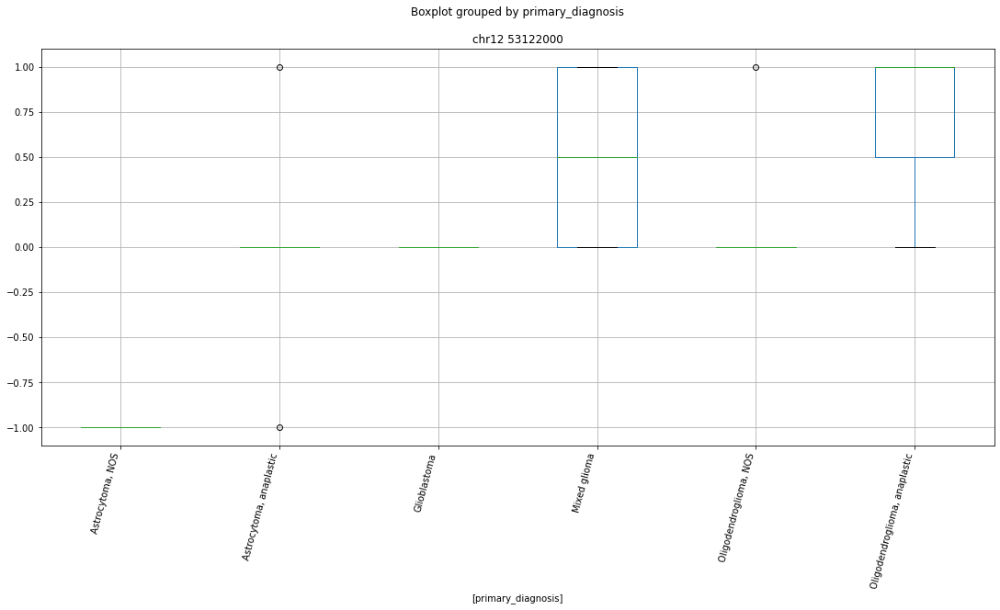

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chrX 74098000


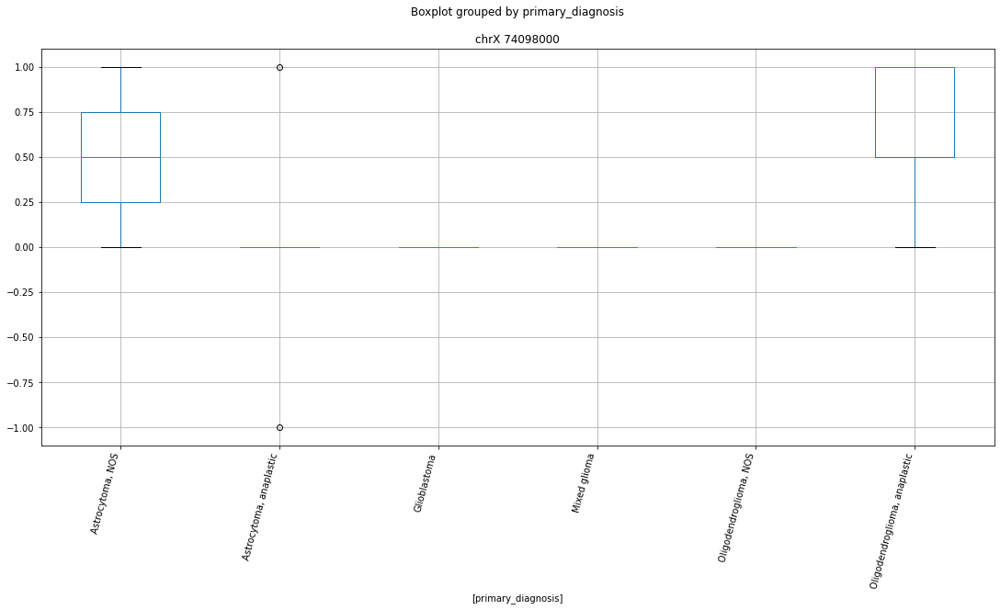

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr11 71167000


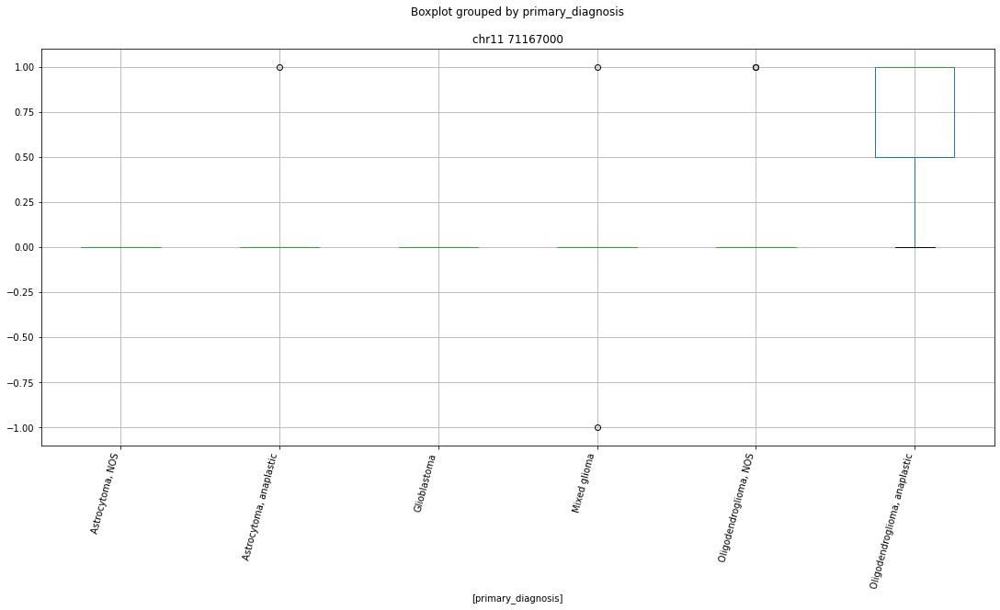

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr12 56788000


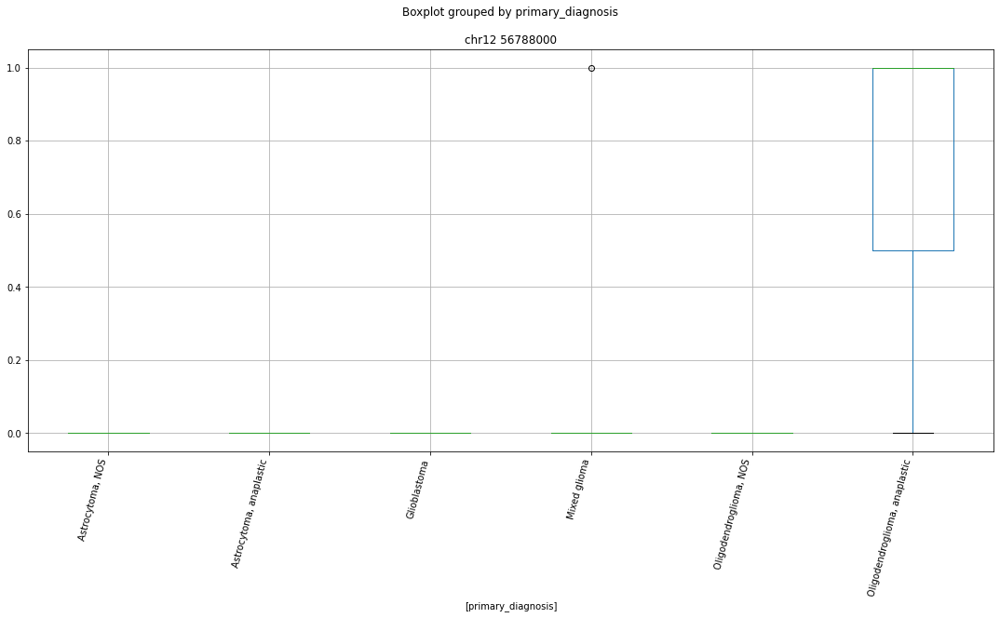

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr12 80307000


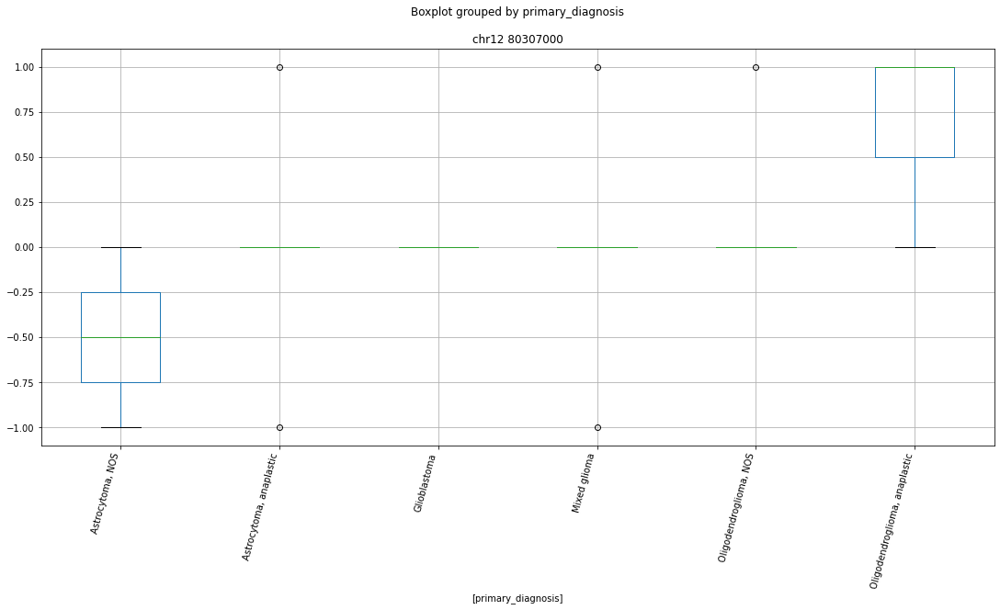

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chrX 55749000


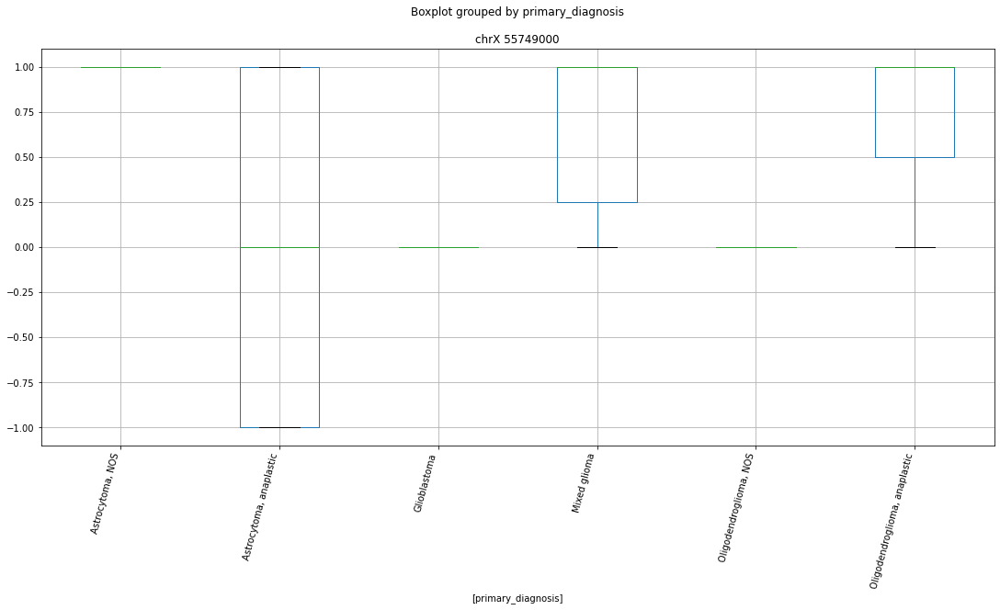

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr16 2801000


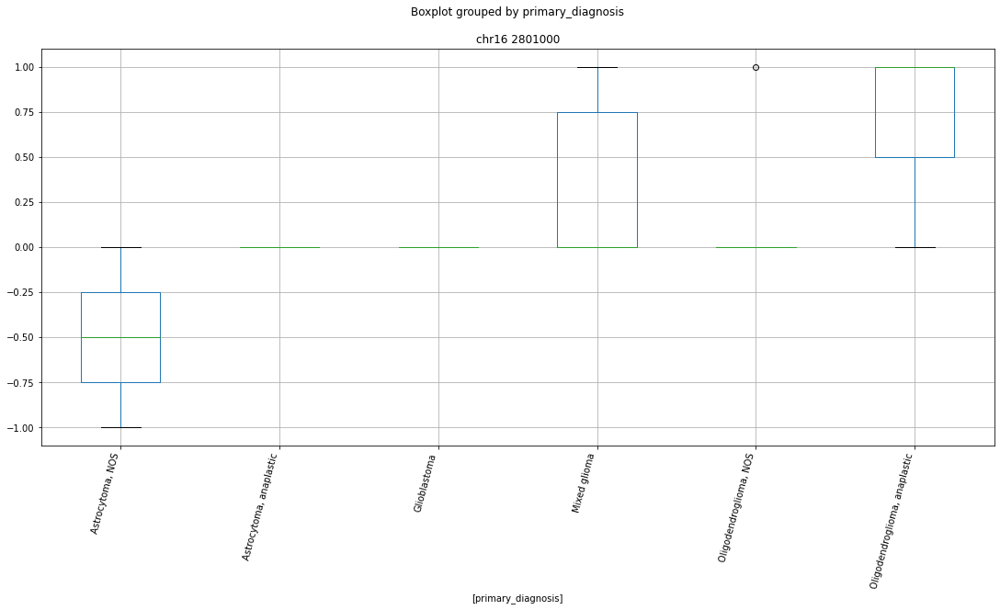

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr16 8115000


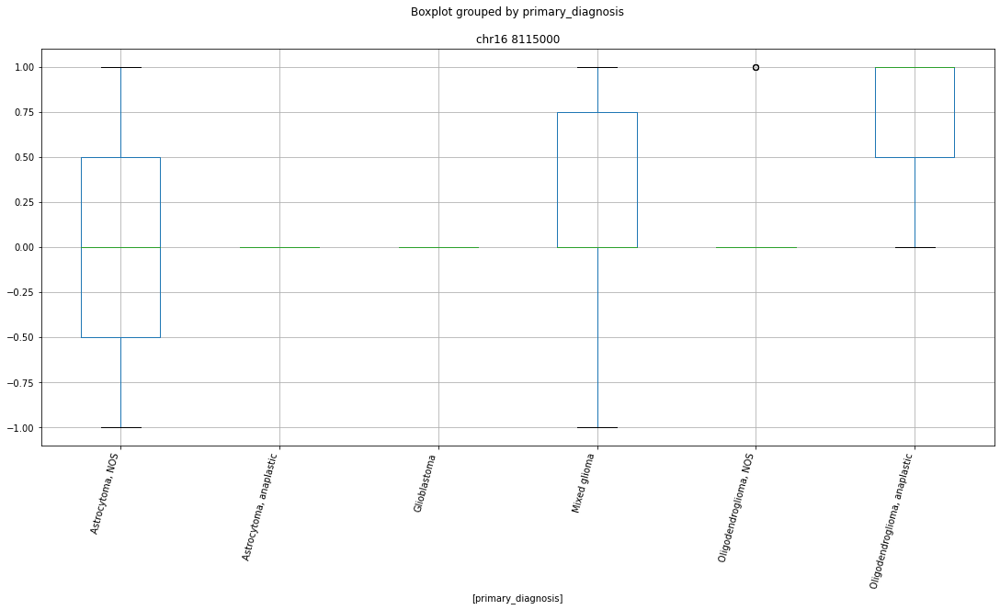

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr5 37012000


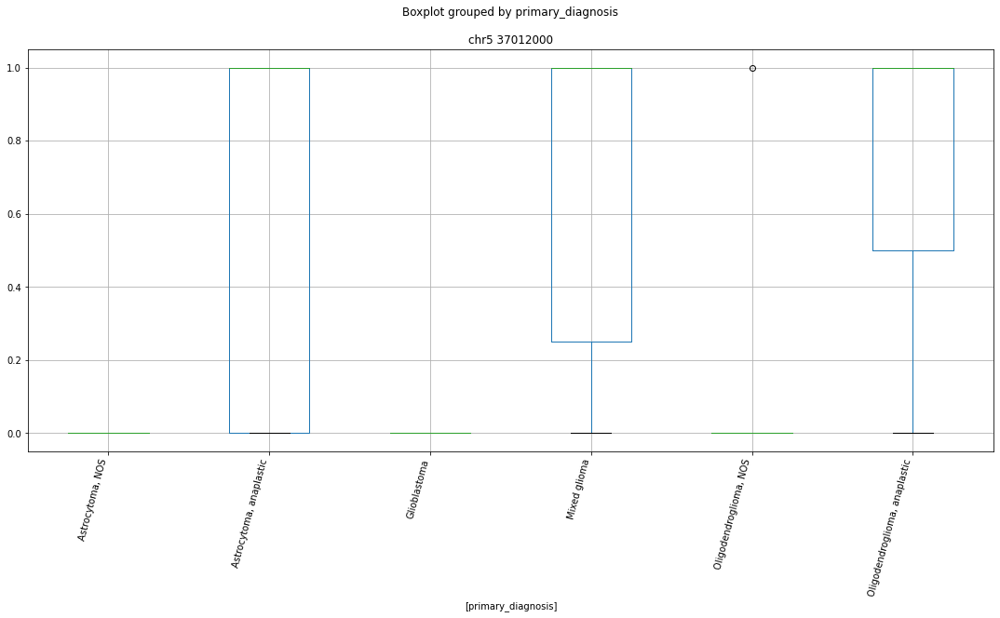

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr17 3112000


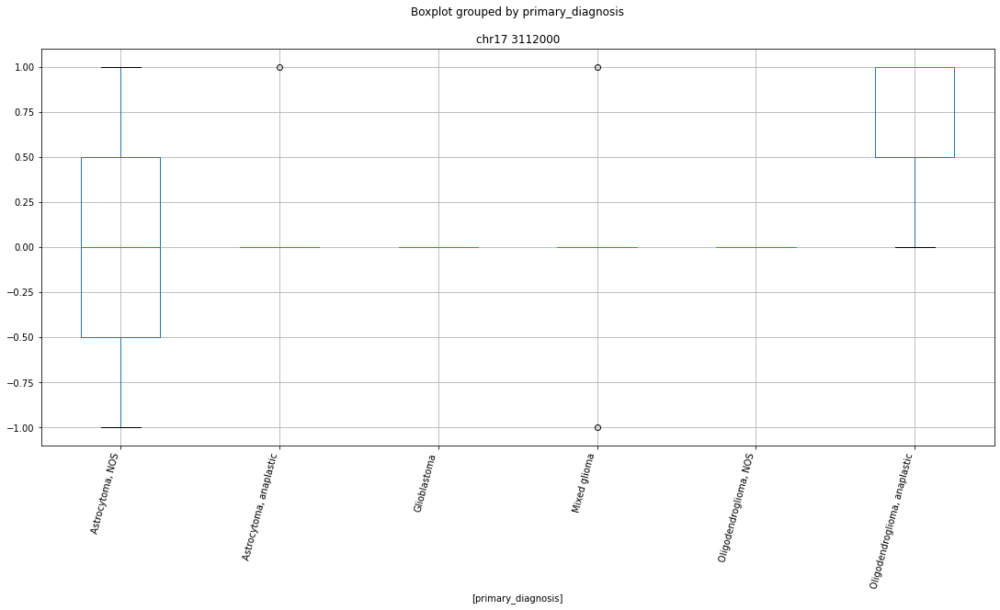

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr17 16095000


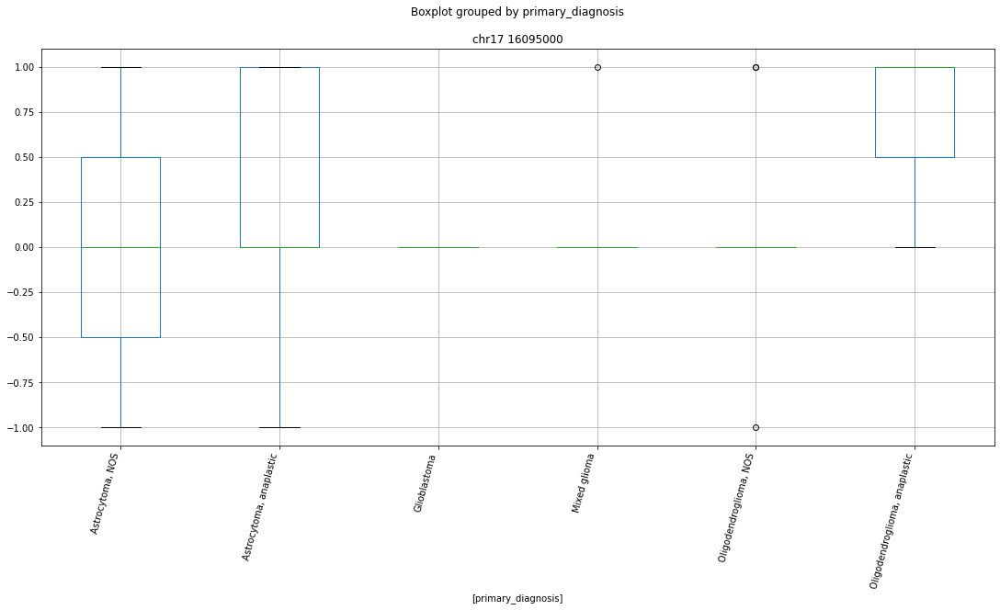

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr17 15867000


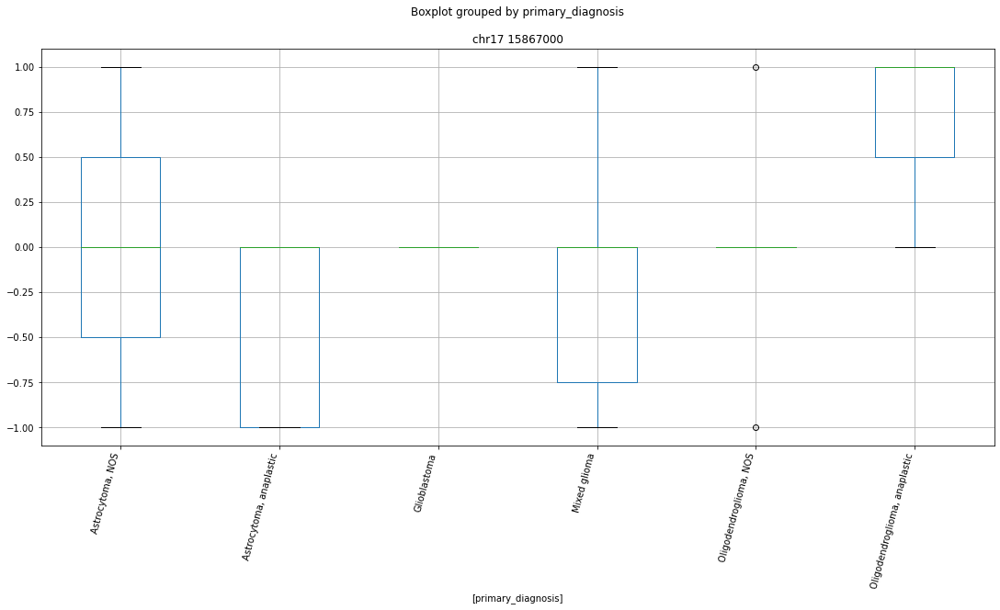

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr17 5143000


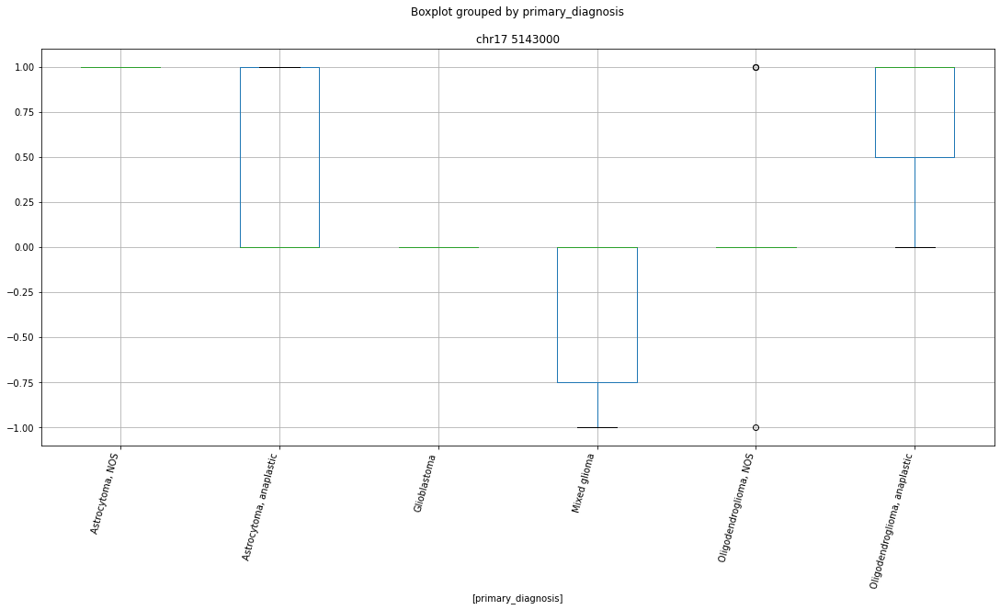

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr17 16311000


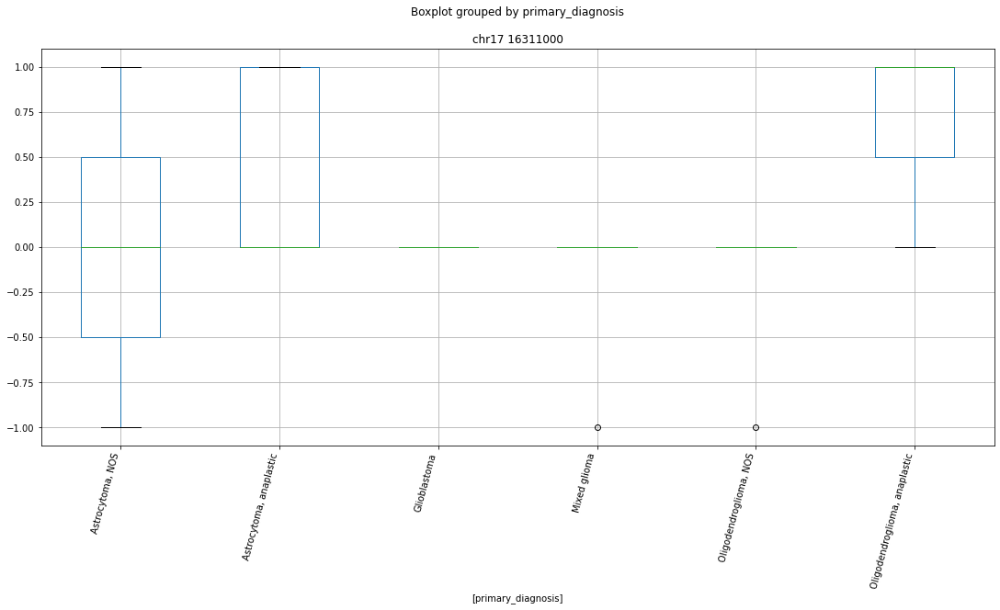

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr17 3564000


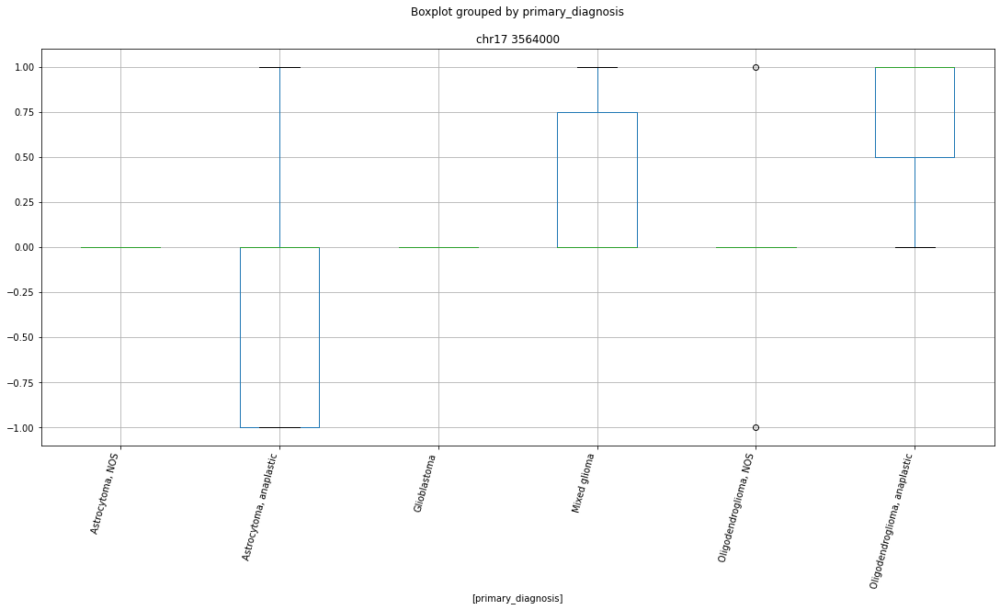

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr8 57071000


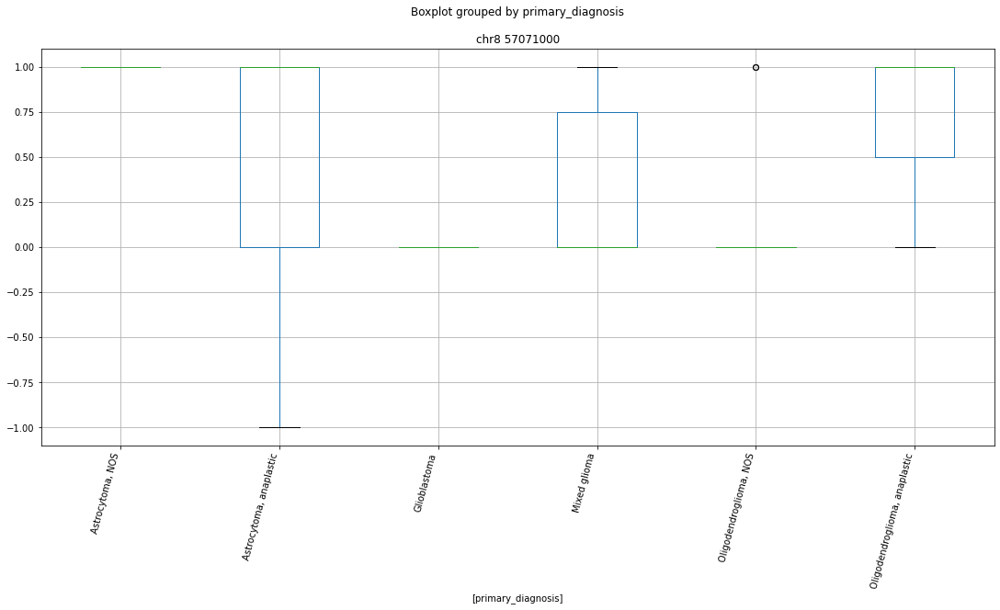

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr17 2507000


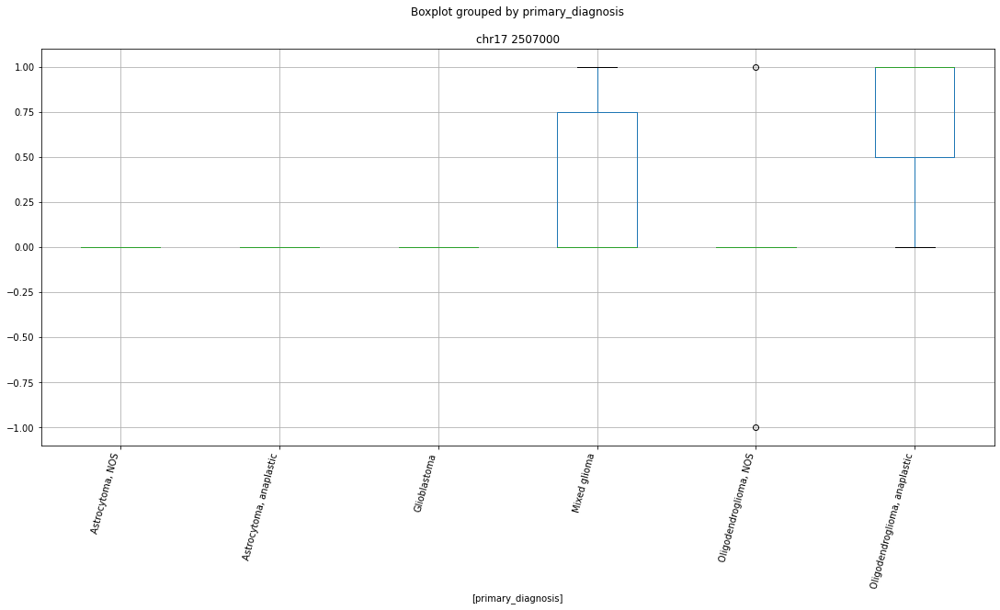

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr11 8979000


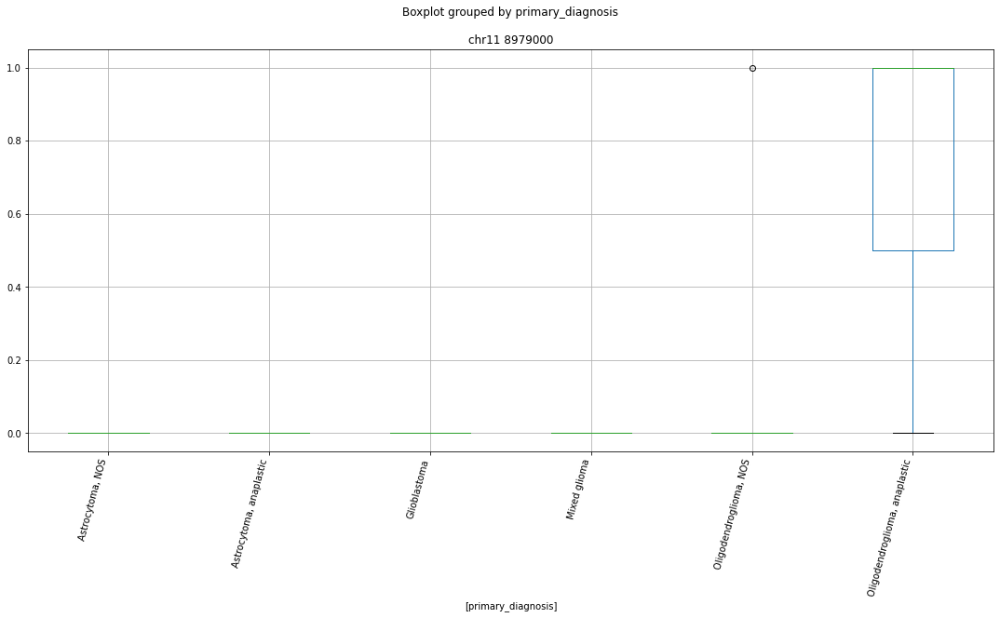

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr8 128118000


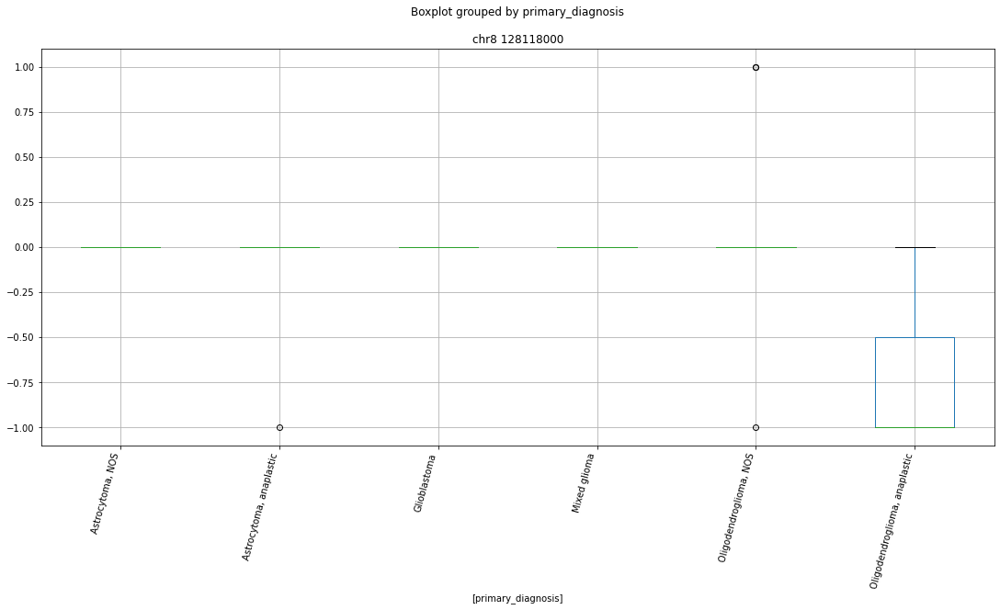

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr16 58395000


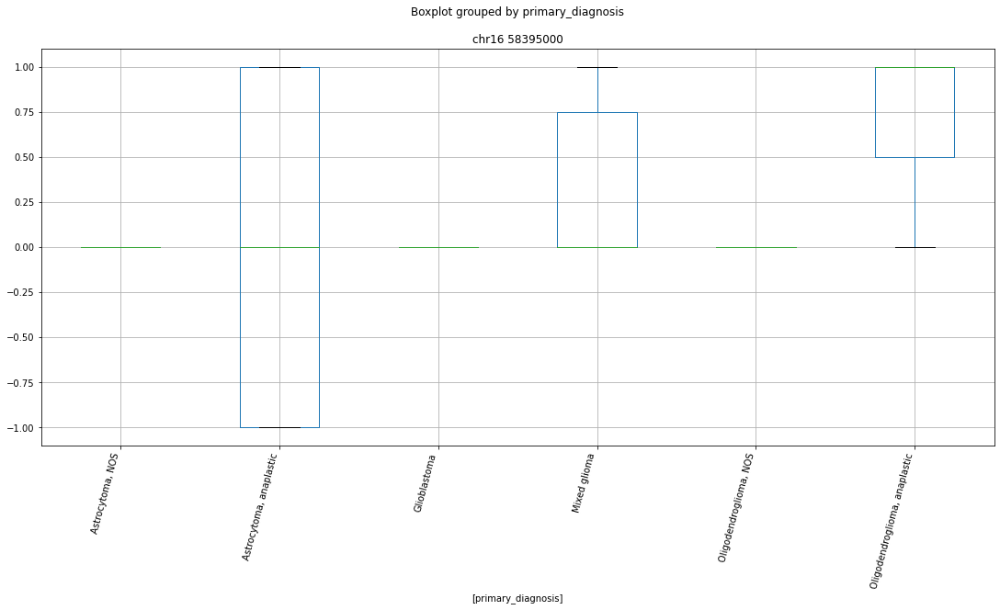

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr8 58676000


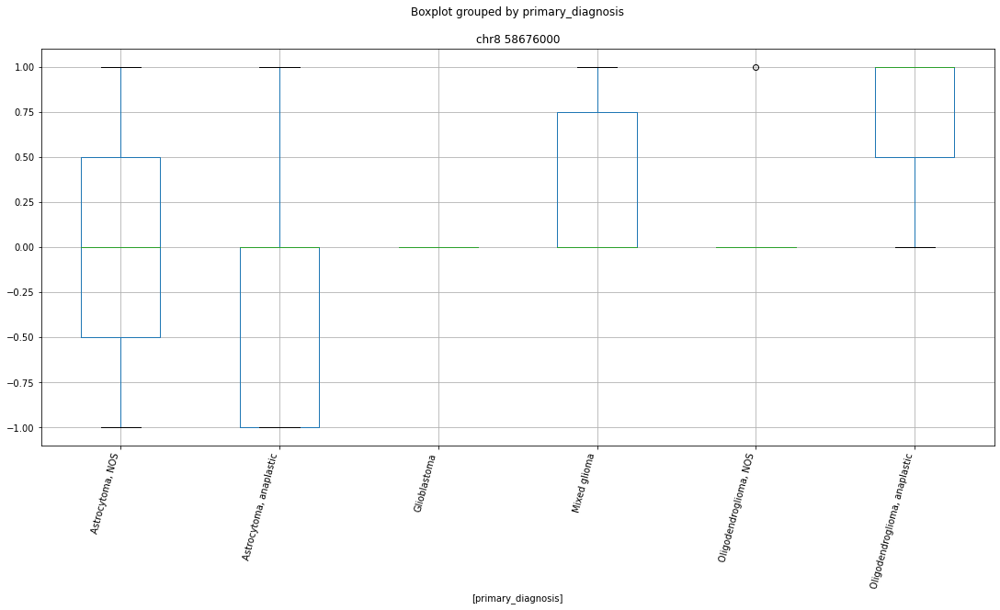

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr9 83000


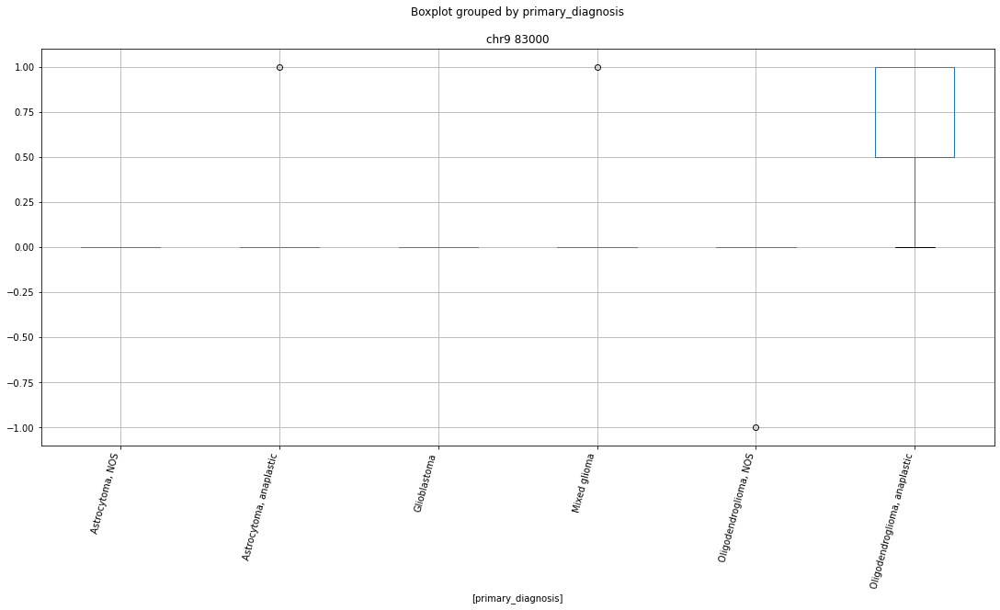

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr16 53698000


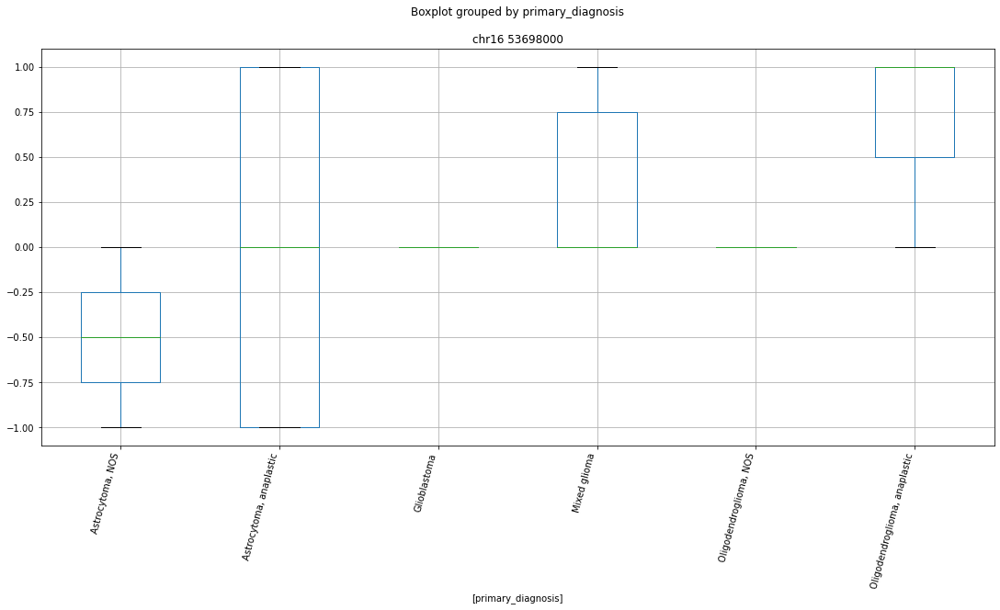

 p : 3.4049793131136327e-09  ( t : 7.895146188218008 ) :  chr19 53269000


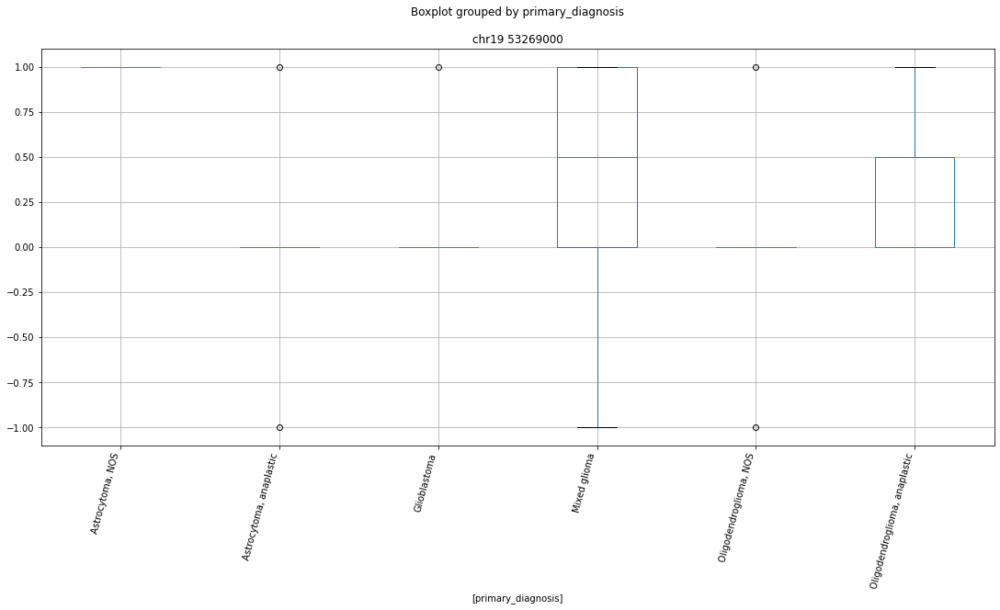

 p : 3.4049793131136327e-09  ( t : 7.895146188218008 ) :  chr5 39273000


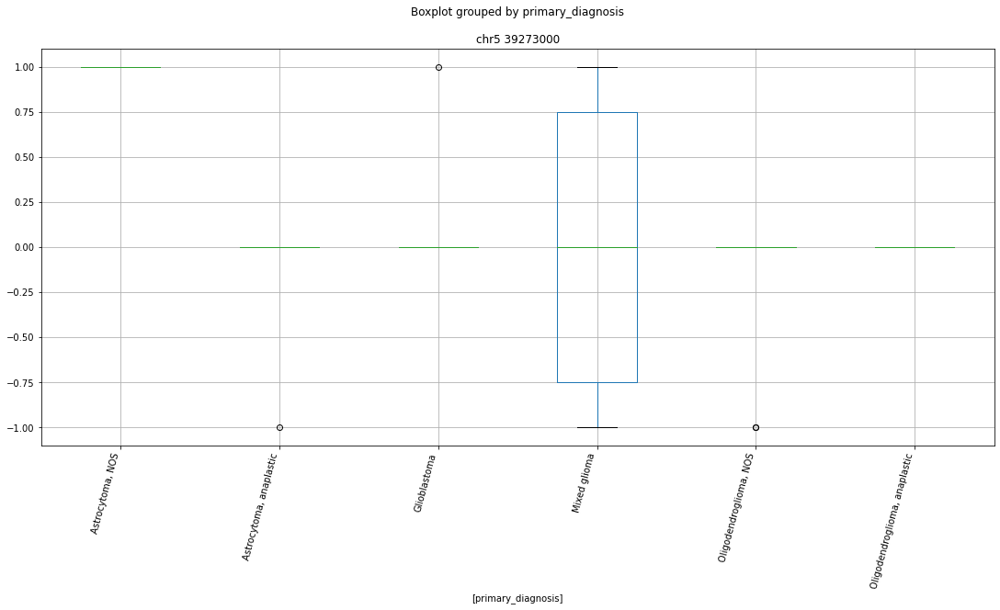

Clustermapping
['chr1 10029000' 'chr1 104134000' 'chr1 104135000' ... 'chrY 7711000'
 'primary_diagnosis' 'subject']


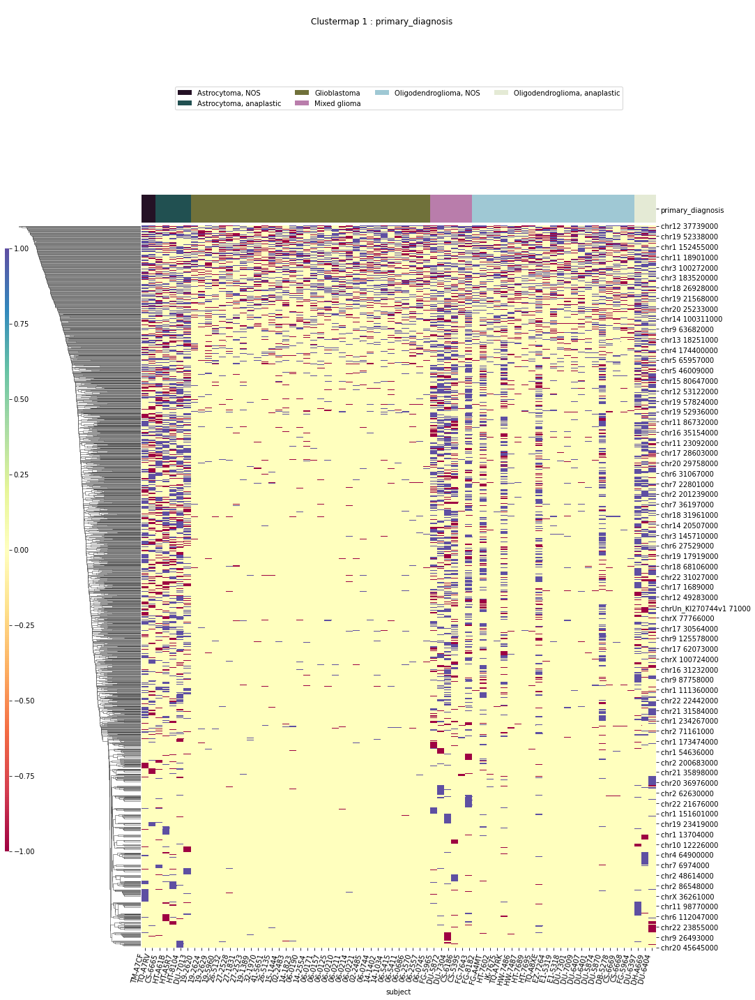

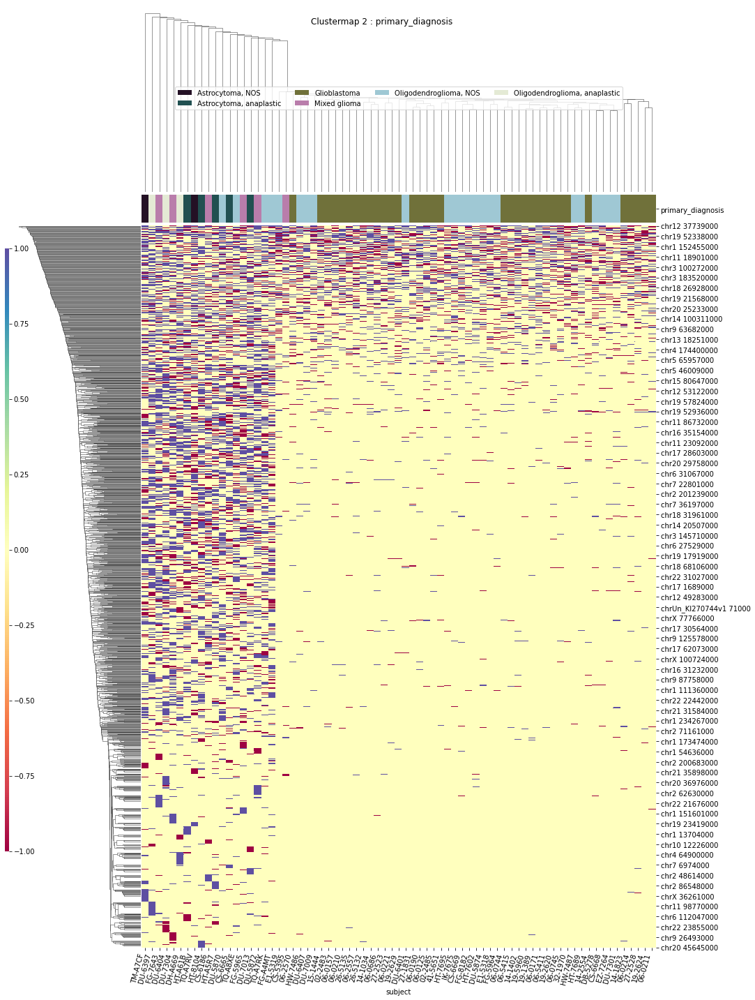

IDH
T-Testing
Boxplotting
Clustermapping
['IDH' 'chr1 104135000' 'chr1 11249000' 'chr1 143703000' 'chr1 144451000'
 'chr1 145932000' 'chr1 152455000' 'chr1 156182000' 'chr1 161017000'
 'chr1 161315000' 'chr1 161423000' 'chr1 237127000' 'chr1 25604000'
 'chr1 45513000' 'chr1 64416000' 'chr10 19509000' 'chr10 3061000'
 'chr10 41714000' 'chr11 105264000' 'chr11 118721000' 'chr11 17050000'
 'chr11 56058000' 'chr11 56618000' 'chr11 59700000' 'chr11 71167000'
 'chr12 107826000' 'chr12 19340000' 'chr12 37738000' 'chr12 85469000'
 'chr12 9601000' 'chr12 96158000' 'chr13 54267000' 'chr13 69614000'
 'chr13 78647000' 'chr14 23981000' 'chr14 39285000' 'chr14 88024000'
 'chr15 58834000' 'chr16 35955000' 'chr16 83879000' 'chr17 44181000'
 'chr17 62021000' 'chr18 14382000' 'chr18 2000000' 'chr18 70480000'
 'chr18 76646000' 'chr19 21551000' 'chr19 29364000' 'chr19 36799000'
 'chr19 37252000' 'chr19 37867000' 'chr19 44639000' 'chr19 51869000'
 'chr19 52421000' 'chr19 8315000' 'chr2 125277000' 'chr2 228

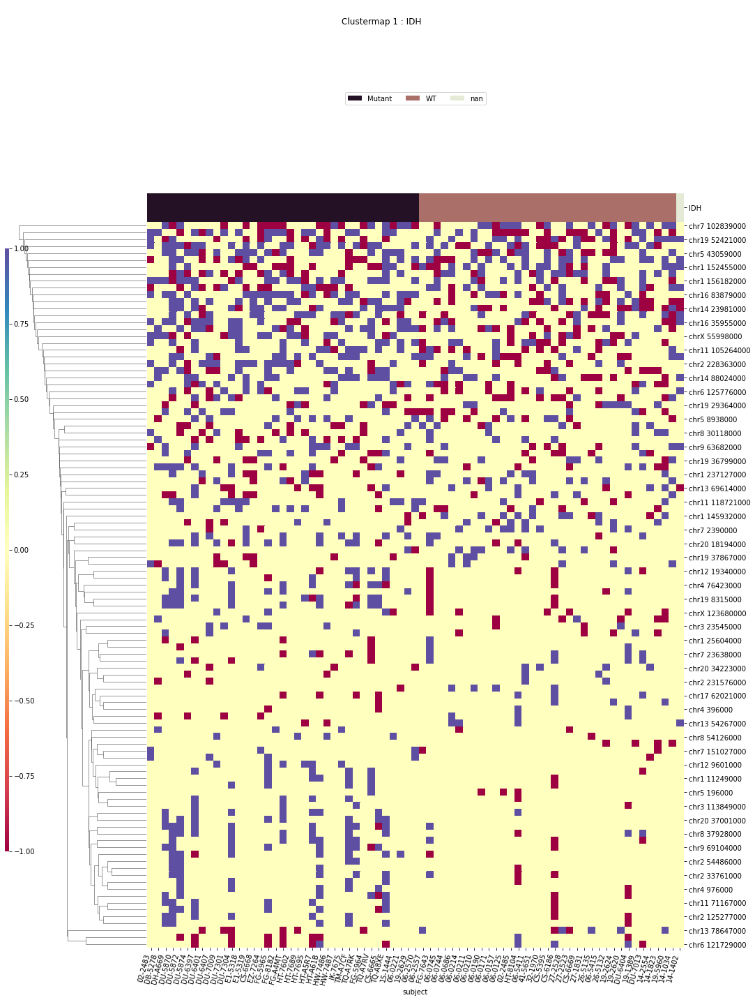

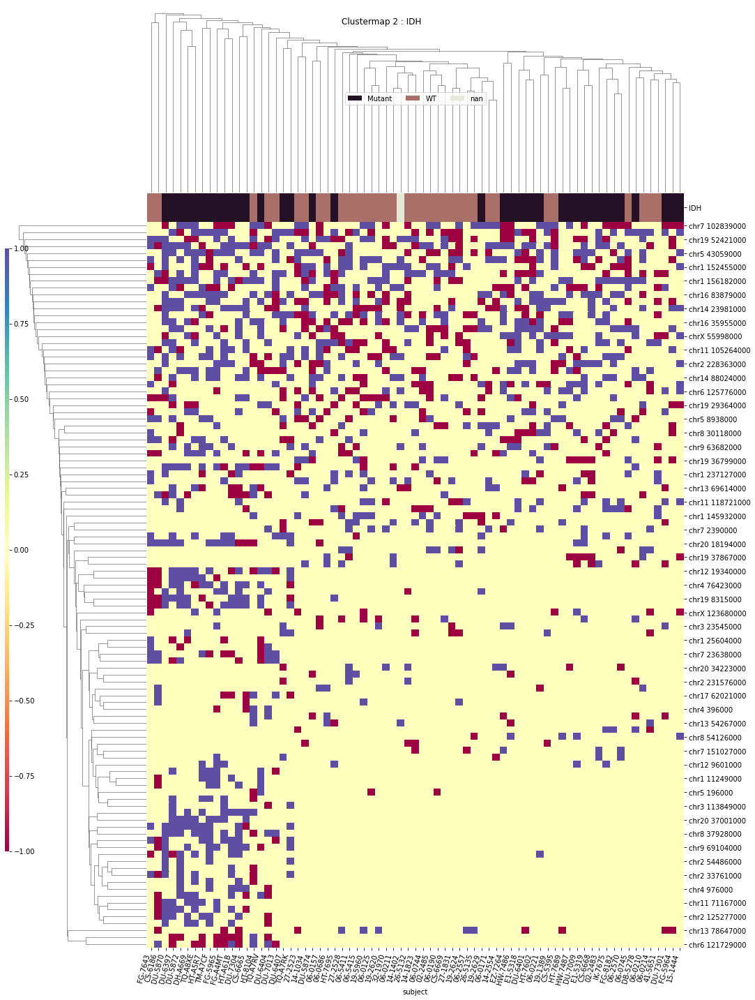

x1p19q
T-Testing
Boxplotting
Clustermapping
['chr1 10427000' 'chr1 109767000' 'chr1 114058000' 'chr1 114059000'
 'chr1 145764000' 'chr1 150728000' 'chr1 15135000' 'chr1 15136000'
 'chr1 152797000' 'chr1 180710000' 'chr1 20703000' 'chr1 212320000'
 'chr1 227276000' 'chr1 234267000' 'chr1 248906000' 'chr1 29360000'
 'chr1 45513000' 'chr1 52007000' 'chr1 54561000' 'chr1 54637000'
 'chr1 65140000' 'chr1 66592000' 'chr1 70461000' 'chr1 89066000'
 'chr1 89067000' 'chr10 102391000' 'chr10 1157000' 'chr10 21430000'
 'chr10 29427000' 'chr10 37493000' 'chr10 41714000' 'chr10 43338000'
 'chr10 71875000' 'chr10 75750000' 'chr10 8869000' 'chr11 118330000'
 'chr11 17050000' 'chr11 2961000' 'chr11 41305000' 'chr11 60451000'
 'chr11 71167000' 'chr11 86880000' 'chr11 8979000' 'chr11 91064000'
 'chr11 9319000' 'chr12 105873000' 'chr12 118105000' 'chr12 122708000'
 'chr12 123493000' 'chr12 124101000' 'chr12 24673000' 'chr12 34180000'
 'chr12 37738000' 'chr12 58336000' 'chr12 8461000' 'chr12 95948000'
 'c

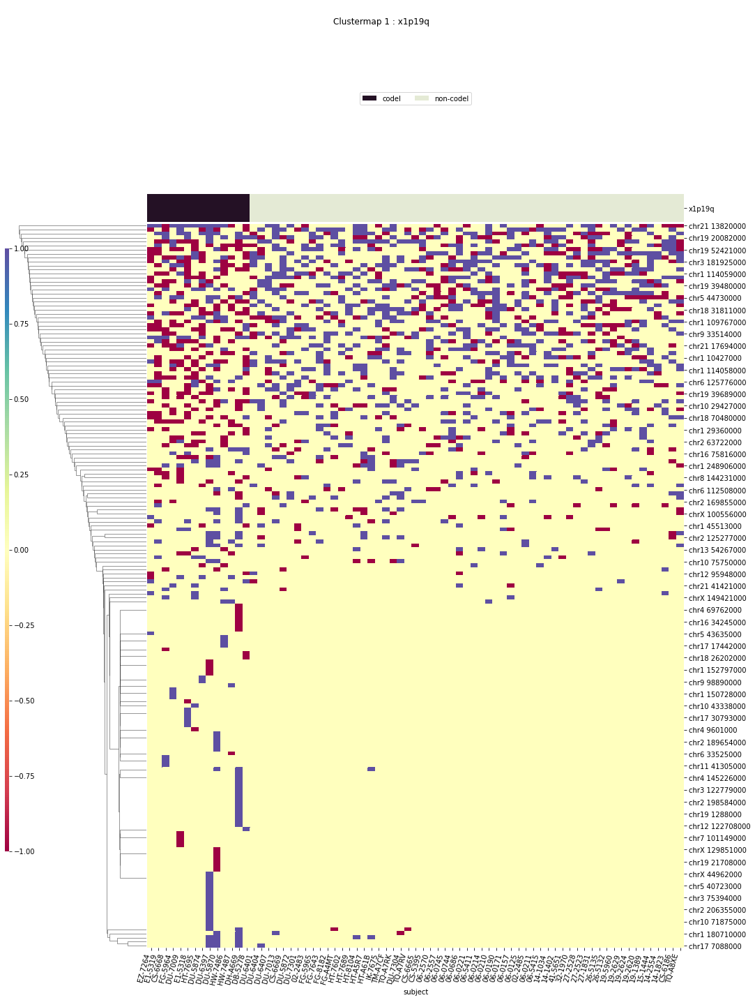

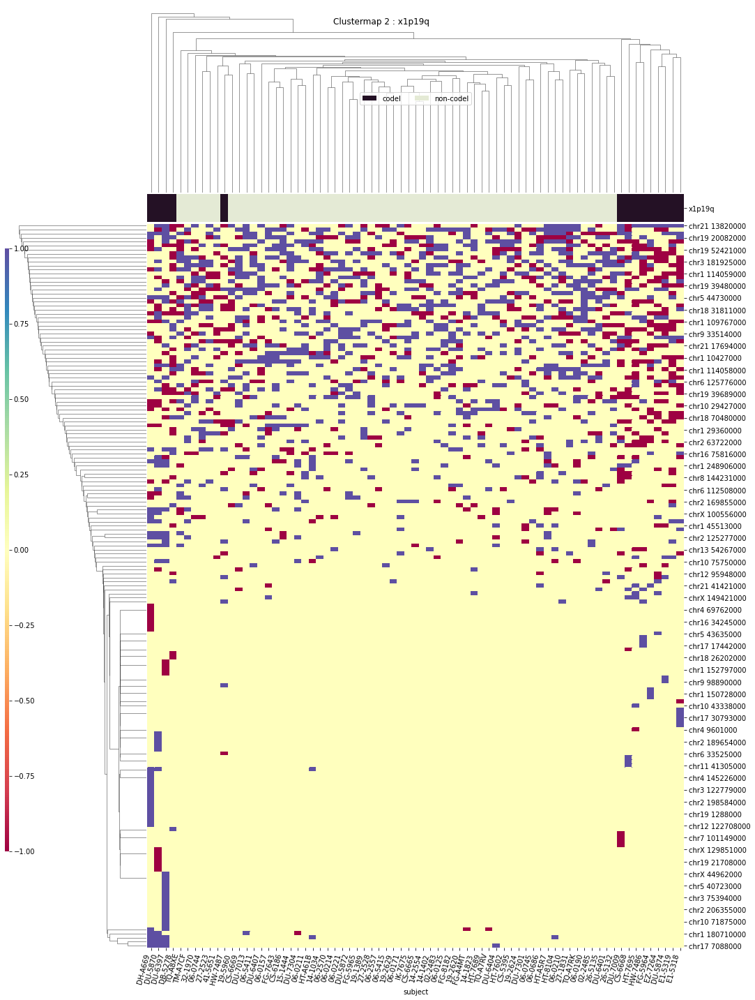

TERT
T-Testing
Boxplotting
Clustermapping
['TERT' 'chr1 11249000' 'chr1 114058000' 'chr1 120424000' 'chr1 147106000'
 'chr1 15135000' 'chr1 152455000' 'chr1 156182000' 'chr1 160946000'
 'chr1 161315000' 'chr1 227606000' 'chr1 237669000' 'chr1 33063000'
 'chr1 45223000' 'chr1 64416000' 'chr1 99836000' 'chr10 19509000'
 'chr10 19510000' 'chr10 26893000' 'chr10 29427000' 'chr10 34976000'
 'chr10 37494000' 'chr10 41714000' 'chr10 42138000' 'chr10 78075000'
 'chr10 96940000' 'chr10 97416000' 'chr11 33050000' 'chr11 56618000'
 'chr11 65452000' 'chr11 74353000' 'chr11 83133000' 'chr11 89983000'
 'chr11 91064000' 'chr12 123493000' 'chr12 19340000' 'chr12 34180000'
 'chr12 34619000' 'chr12 48842000' 'chr12 8461000' 'chr13 113867000'
 'chr13 22813000' 'chr13 22814000' 'chr13 23972000' 'chr13 24957000'
 'chr13 69614000' 'chr13 78647000' 'chr14 105676000' 'chr14 39285000'
 'chr14 77636000' 'chr14 88024000' 'chr15 58834000' 'chr15 65733000'
 'chr16 35629000' 'chr16 83879000' 'chr17 16401000' 'chr17

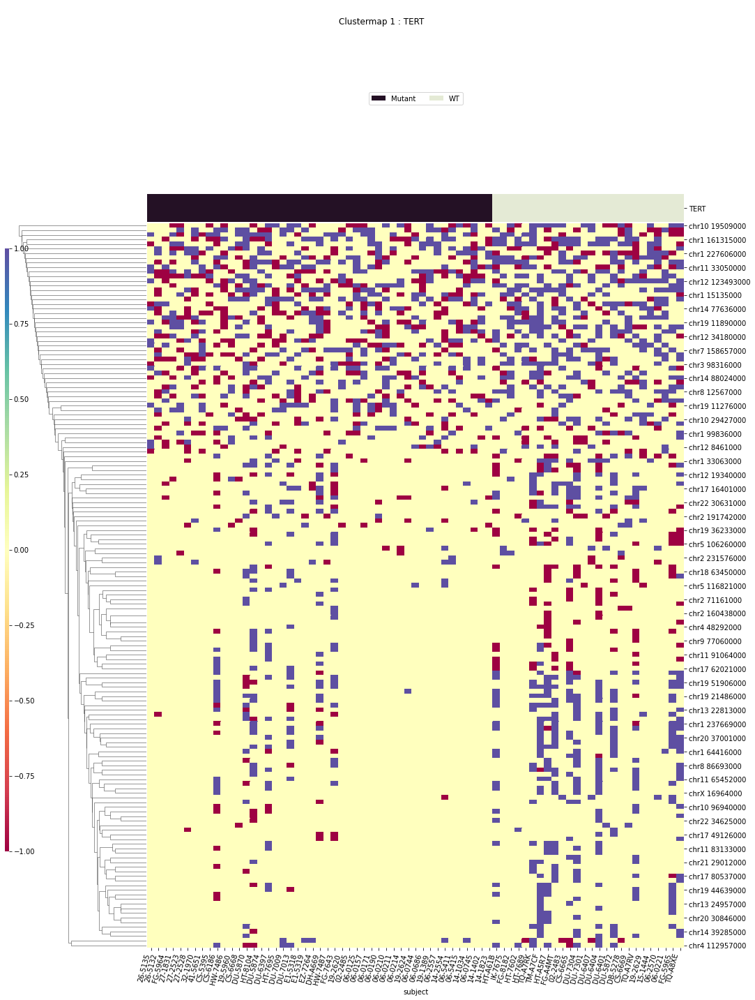

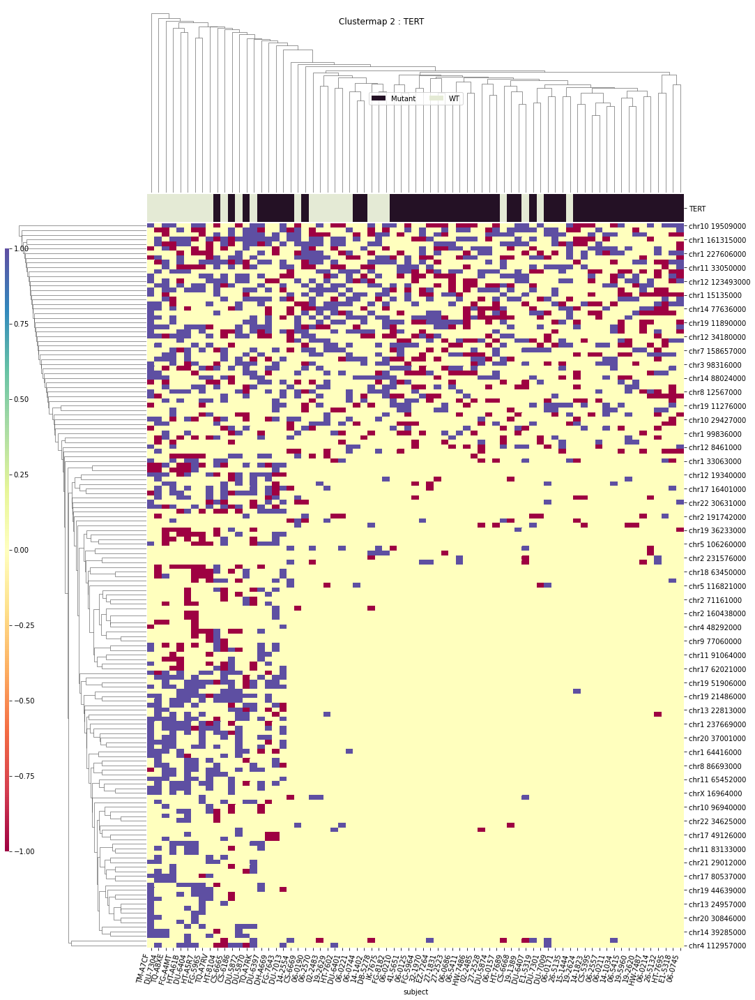

disease_type
T-Testing
Boxplotting
Clustermapping
['chr1 104135000' 'chr1 108535000' 'chr1 143703000' 'chr1 152455000'
 'chr1 156182000' 'chr1 160652000' 'chr1 160936000' 'chr1 207635000'
 'chr1 225966000' 'chr1 227606000' 'chr1 227710000' 'chr1 229931000'
 'chr1 234011000' 'chr1 234267000' 'chr1 245775000' 'chr1 33063000'
 'chr1 46321000' 'chr1 6304000' 'chr1 79702000' 'chr1 89066000'
 'chr1 99793000' 'chr10 19510000' 'chr10 29697000' 'chr10 3061000'
 'chr10 41714000' 'chr10 42138000' 'chr10 6833000' 'chr10 99827000'
 'chr11 105264000' 'chr11 17050000' 'chr11 23092000' 'chr11 24446000'
 'chr11 56058000' 'chr11 59700000' 'chr11 62326000' 'chr11 65452000'
 'chr11 65522000' 'chr11 67757000' 'chr11 74353000' 'chr11 76712000'
 'chr12 107826000' 'chr12 110570000' 'chr12 131926000' 'chr12 37738000'
 'chr12 68484000' 'chr12 8184000' 'chr12 85469000' 'chr12 8635000'
 'chr12 89867000' 'chr12 93075000' 'chr12 9601000' 'chr13 113867000'
 'chr13 78647000' 'chr14 20507000' 'chr14 25792000' 'chr14 6

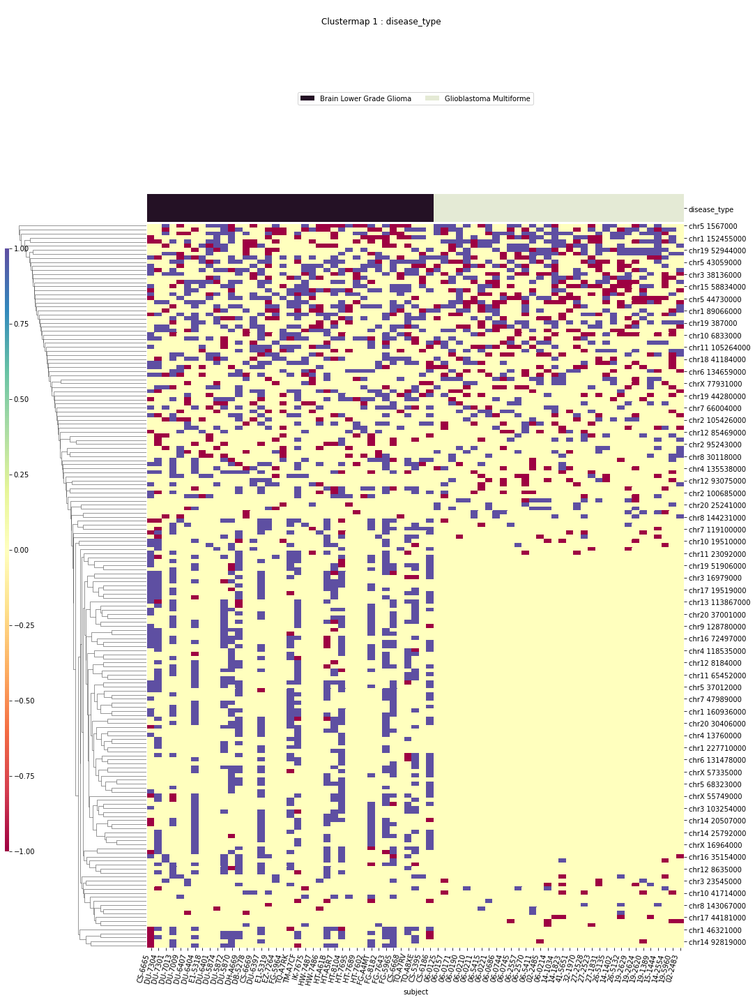

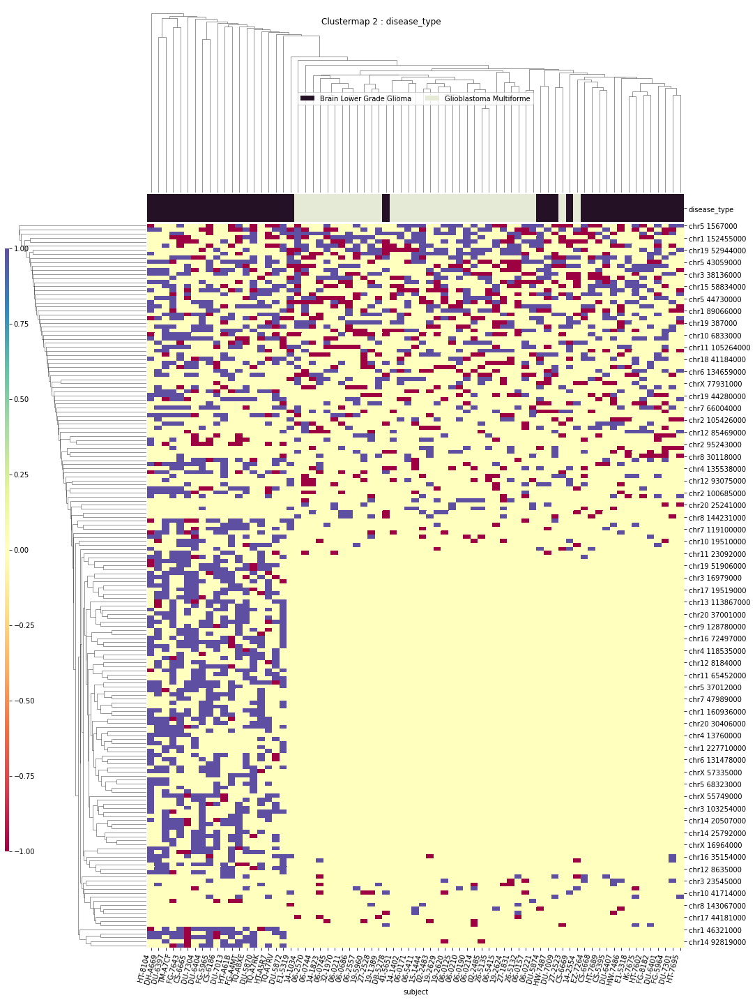

IDH_1p19q_status
T-Testing


/Users/jakewendt/Library/Python/3.6/lib/python/site-packages/numpy/core/fromnumeric.py:3622: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
/Users/jakewendt/Library/Python/3.6/lib/python/site-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
Clustermapping
['IDH_1p19q_status' 'chr1 104135000' 'chr1 10427000' 'chr1 11249000'
 'chr1 114058000' 'chr1 143703000' 'chr1 144451000' 'chr1 147106000'
 'chr1 15135000' 'chr1 15136000' 'chr1 152455000' 'chr1 156182000'
 'chr1 161017000' 'chr1 161315000' 'chr1 161423000' 'chr1 165093000'
 'chr1 202191000' 'chr1 227276000' 'chr1 234267000' 'chr1 237127000'
 'chr1 248906000' 'chr1 25604000' 'chr1 33063000' 'chr1 45513000'
 'chr1 46320000' 'chr1 52007000' 'chr1 54637000' 'chr1 64416000'
 'chr1 65140000' 'chr1 66592000' 'chr1 70461000' 'chr1 86899000'
 'chr1 89066000' 'chr1 89067000' 'chr1 93276000' 'chr1 99836000'
 'chr10 19509000' 'chr10 19510000' 'chr10 26893000' 'chr10 29427000'
 'chr10 34976000' 'chr10 37493000' 'chr10 41714000' 'chr10 75750000'
 'chr10 78075000' 'chr11 105264000' 'chr11 118330000' 'chr11 118721000'
 'chr11 17050000' 'chr11 18900000' 'chr11 56058000' 'chr11 56618000'
 'chr11 59700000' 'chr11 60451000' 'chr11 71167000' 'chr11 8979000'
 'chr11 91064000' 'chr

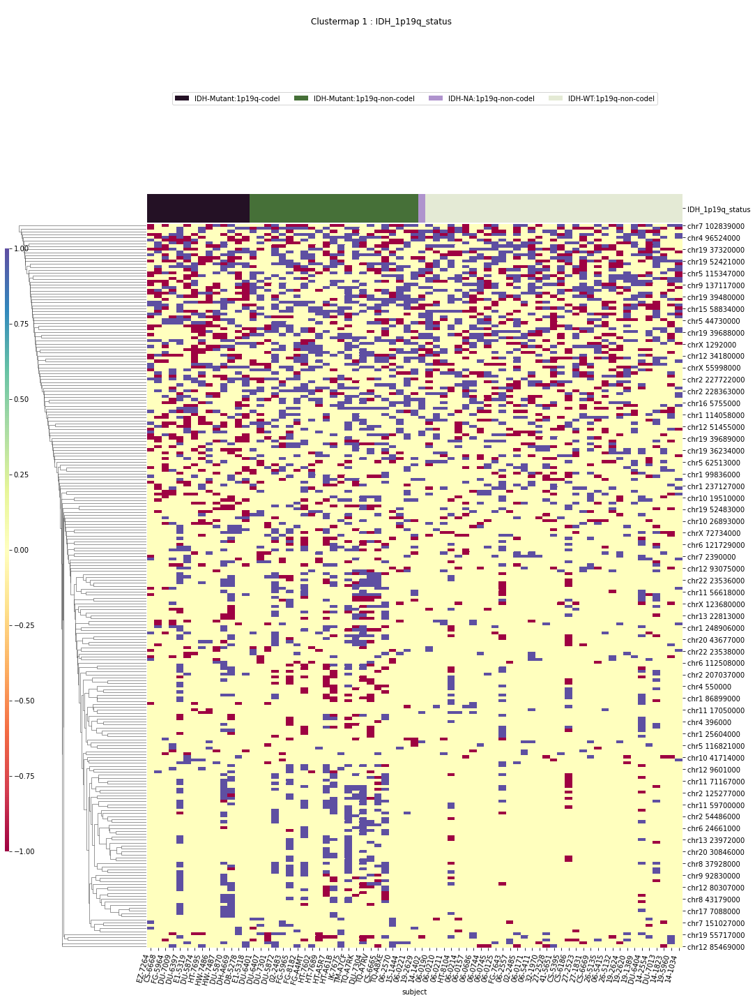

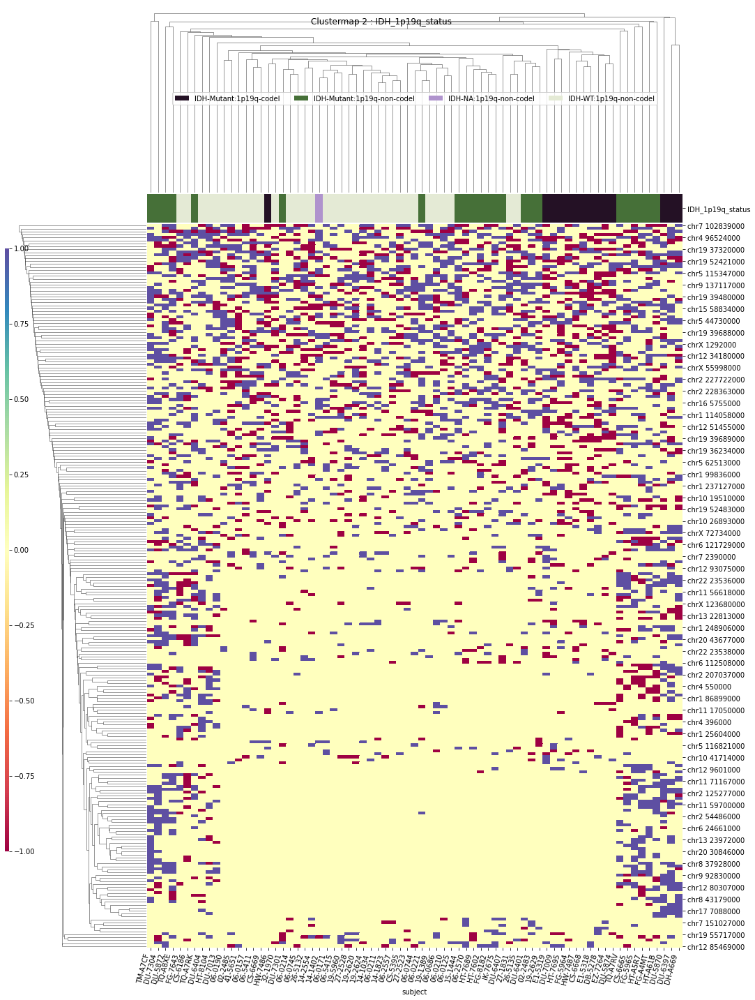

WHO_groups
T-Testing
Boxplotting
 p : 2.9666833044073793e-10  ( t : 9.349640132610398 ) :  chr15 90346000


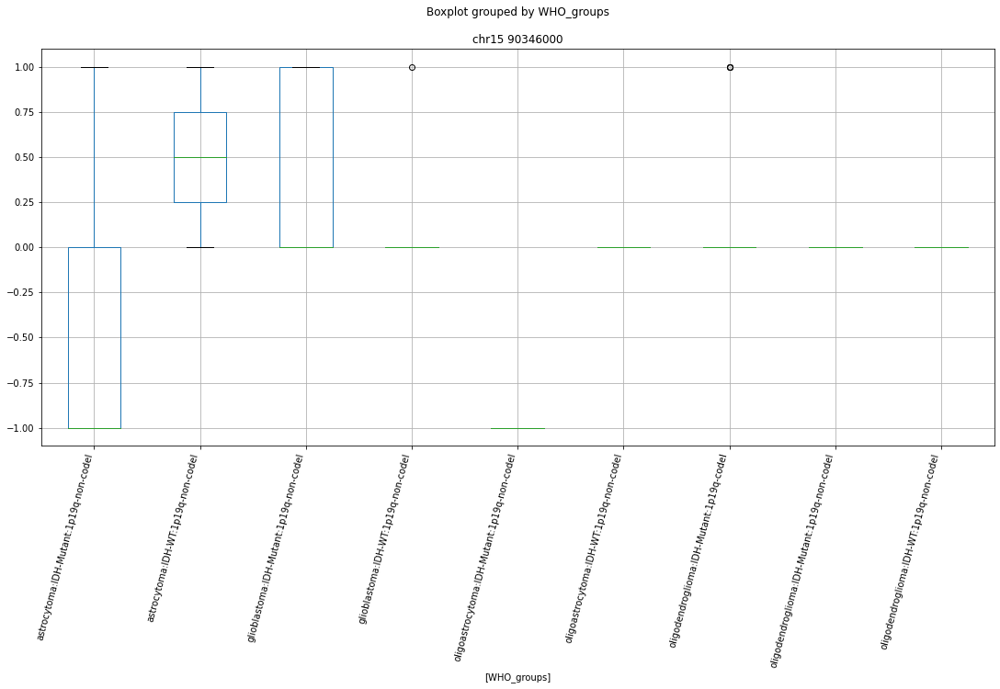

 p : 2.9666833044073793e-10  ( t : 9.349640132610398 ) :  chr11 56618000


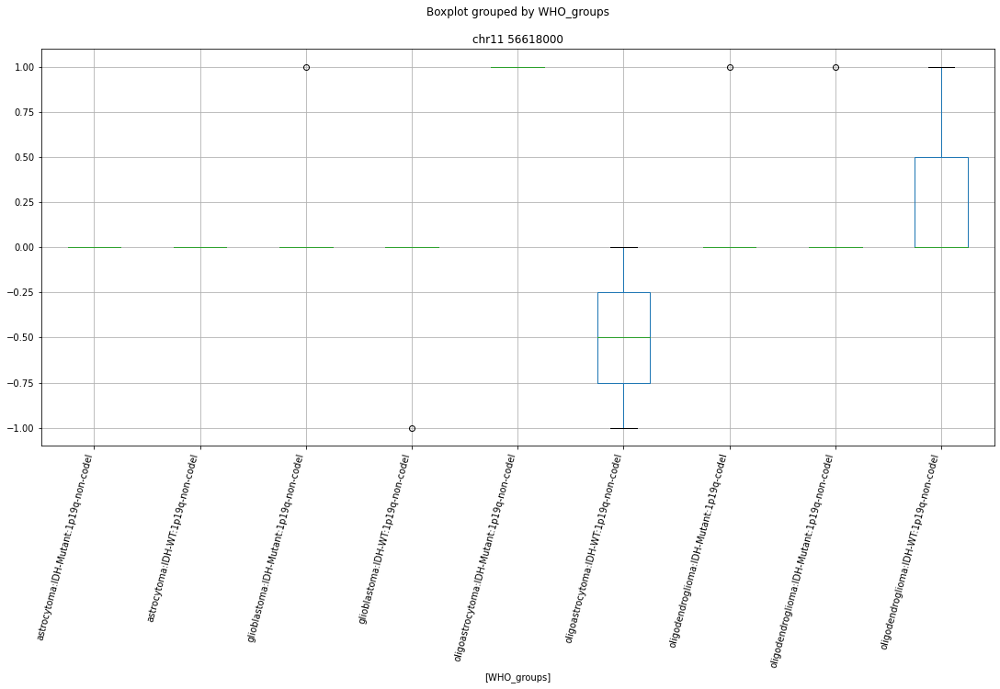

Clustermapping
['WHO_groups' 'chr1 10029000' 'chr1 104134000' ... 'chrY 6748000'
 'chrY 7711000' 'subject']


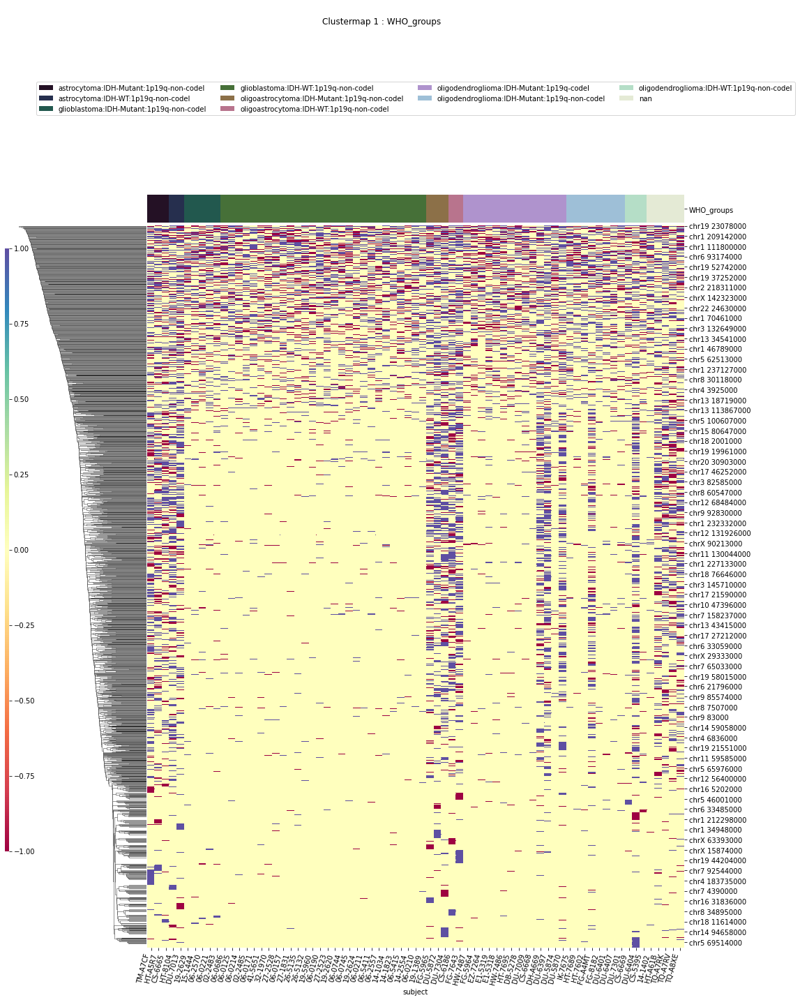

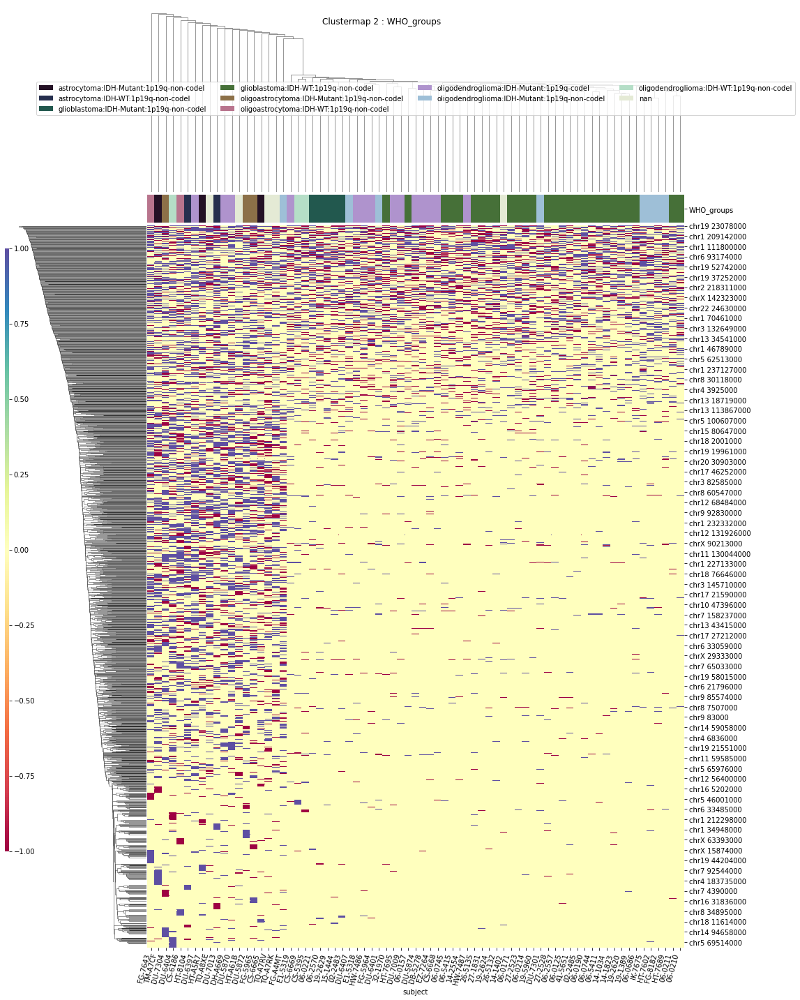

Triple_group
T-Testing


/Users/jakewendt/Library/Python/3.6/lib/python/site-packages/numpy/core/fromnumeric.py:3622: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
/Users/jakewendt/Library/Python/3.6/lib/python/site-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
Clustermapping
['Triple_group' 'chr1 10029000' 'chr1 104134000' 'chr1 104135000'
 'chr1 10427000' 'chr1 108159000' 'chr1 111529000' 'chr1 11249000'
 'chr1 114058000' 'chr1 13216000' 'chr1 13329000' 'chr1 1410000'
 'chr1 143703000' 'chr1 144451000' 'chr1 145933000' 'chr1 147106000'
 'chr1 147241000' 'chr1 150635000' 'chr1 15135000' 'chr1 15136000'
 'chr1 152455000' 'chr1 154287000' 'chr1 156182000' 'chr1 156328000'
 'chr1 160936000' 'chr1 160946000' 'chr1 161017000' 'chr1 161315000'
 'chr1 161423000' 'chr1 168837000' 'chr1 176395000' 'chr1 180710000'
 'chr1 192857000' 'chr1 202191000' 'chr1 209129000' 'chr1 212298000'
 'chr1 224101000' 'chr1 227276000' 'chr1 227607000' 'chr1 231128000'
 'chr1 234267000' 'chr1 23504000' 'chr1 235309000' 'chr1 236428000'
 'chr1 237127000' 'chr1 237669000' 'chr1 241415000' 'chr1 245775000'
 'chr1 246082000' 'chr1 246083000' 'chr1 248906000' 'chr1 25604000'
 'chr1 26819000' 'chr1 27065000' 'chr1 31177000' 'chr1 33063000'
 'chr1 42751000' 'chr1 4

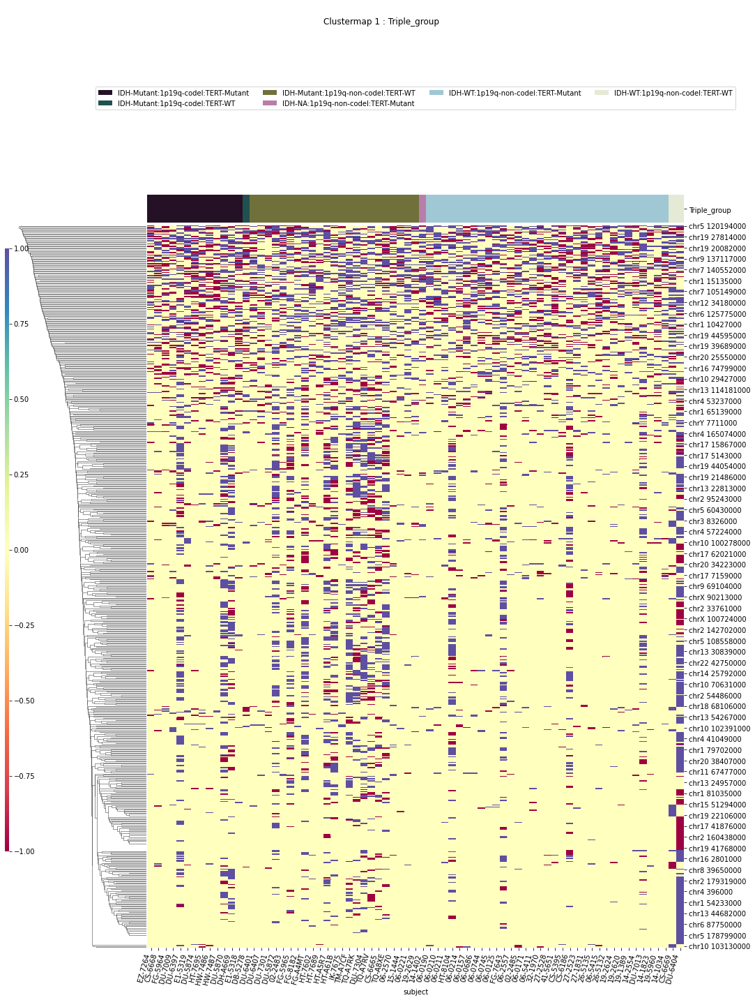

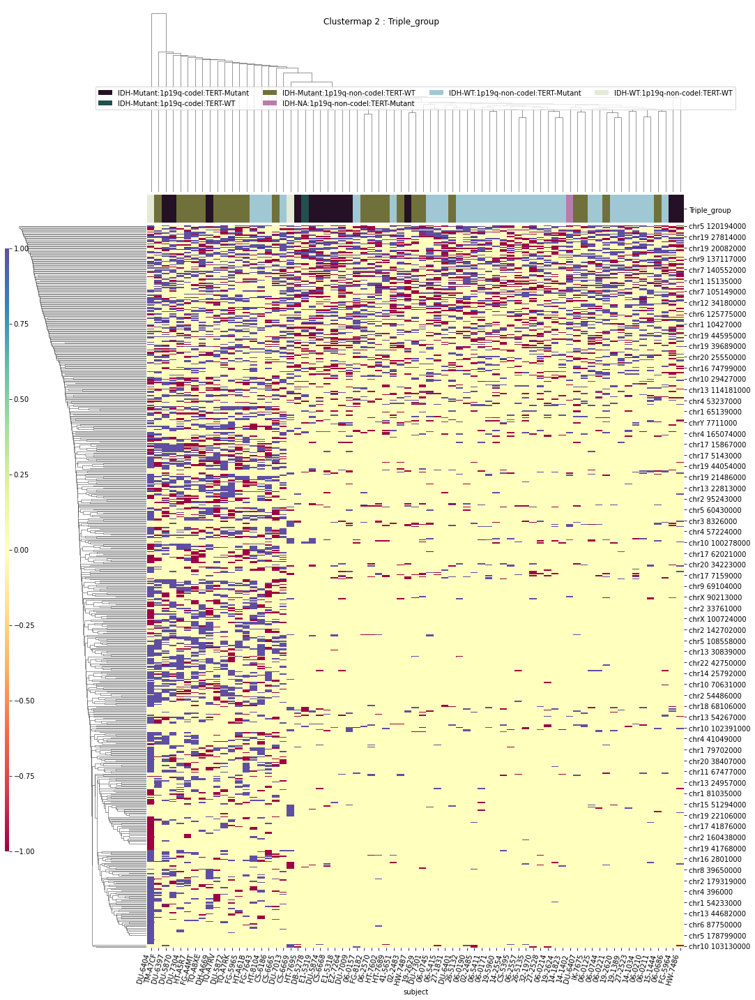

MGMT
T-Testing
Boxplotting
Clustermapping
['MGMT' 'chr1 104135000' 'chr1 1410000' 'chr1 152455000' 'chr1 155600000'
 'chr1 224339000' 'chr1 224340000' 'chr1 45513000' 'chr1 99793000'
 'chr10 125940000' 'chr10 6833000' 'chr11 105264000' 'chr11 118721000'
 'chr11 17050000' 'chr11 44664000' 'chr11 47037000' 'chr11 66588000'
 'chr11 67603000' 'chr11 71167000' 'chr12 107826000' 'chr12 32099000'
 'chr12 32100000' 'chr13 24592000' 'chr13 69614000' 'chr14 23981000'
 'chr14 88024000' 'chr16 2927000' 'chr16 30170000' 'chr17 62021000'
 'chr17 82453000' 'chr18 14382000' 'chr18 2000000' 'chr18 4918000'
 'chr18 68943000' 'chr18 69042000' 'chr19 21567000' 'chr19 23078000'
 'chr19 39479000' 'chr19 51869000' 'chr19 52724000' 'chr2 125277000'
 'chr2 142695000' 'chr2 142696000' 'chr2 228363000' 'chr2 33761000'
 'chr20 29441000' 'chr20 63659000' 'chr20 7956000' 'chr21 17695000'
 'chr21 17933000' 'chr22 24211000' 'chr3 120414000' 'chr3 183171000'
 'chr3 23544000' 'chr3 23545000' 'chr3 38135000' 'chr3 50820

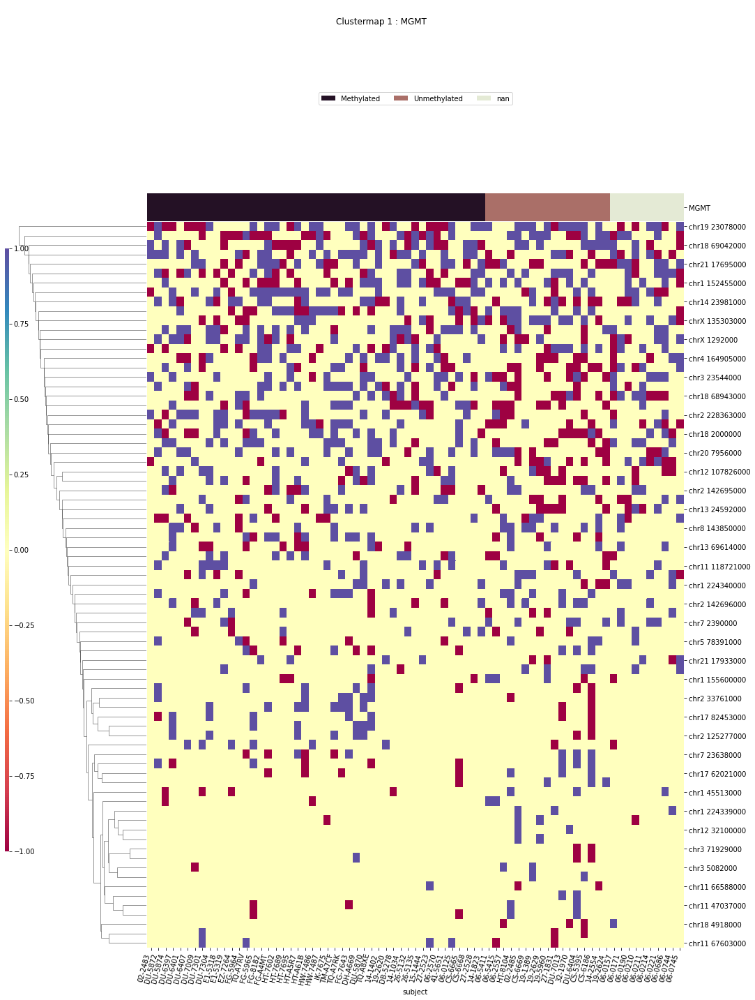

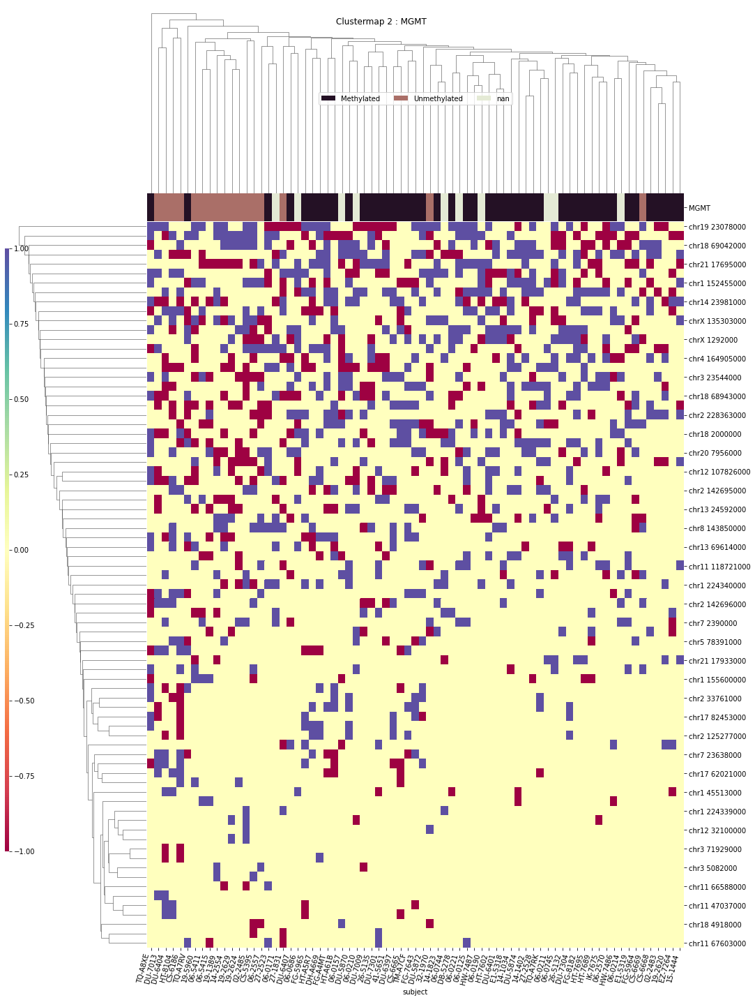

gender1
T-Testing
Boxplotting
Clustermapping
['chr1 120424000' 'chr1 13329000' 'chr1 149093000' 'chr1 160947000'
 'chr1 197406000' 'chr1 209141000' 'chr1 232332000' 'chr1 237669000'
 'chr1 247582000' 'chr1 27220000' 'chr1 29339000' 'chr1 33063000'
 'chr1 45223000' 'chr1 76111000' 'chr10 104785000' 'chr10 41713000'
 'chr10 59697000' 'chr10 80806000' 'chr10 86032000' 'chr11 105264000'
 'chr11 130044000' 'chr11 19859000' 'chr11 2333000' 'chr11 33049000'
 'chr11 60200000' 'chr11 64171000' 'chr11 67604000' 'chr11 71627000'
 'chr11 72501000' 'chr11 86732000' 'chr12 108656000' 'chr12 123492000'
 'chr12 12566000' 'chr12 89867000' 'chr12 9601000' 'chr13 24592000'
 'chr13 24957000' 'chr14 34079000' 'chr14 48598000' 'chr14 91556000'
 'chr15 65227000' 'chr15 75870000' 'chr15 88540000' 'chr16 21222000'
 'chr16 2219000' 'chr16 35629000' 'chr16 69280000' 'chr17 16095000'
 'chr17 28603000' 'chr17 46238000' 'chr18 14010000' 'chr19 11890000'
 'chr19 20466000' 'chr19 21606000' 'chr19 27678000' 'chr19 351

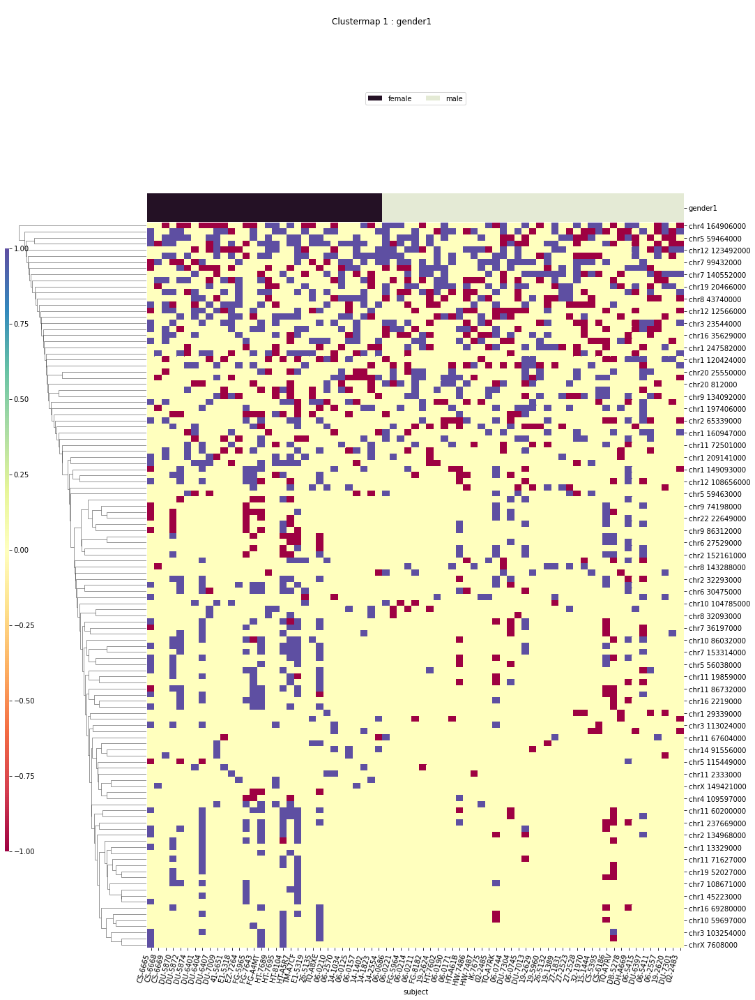

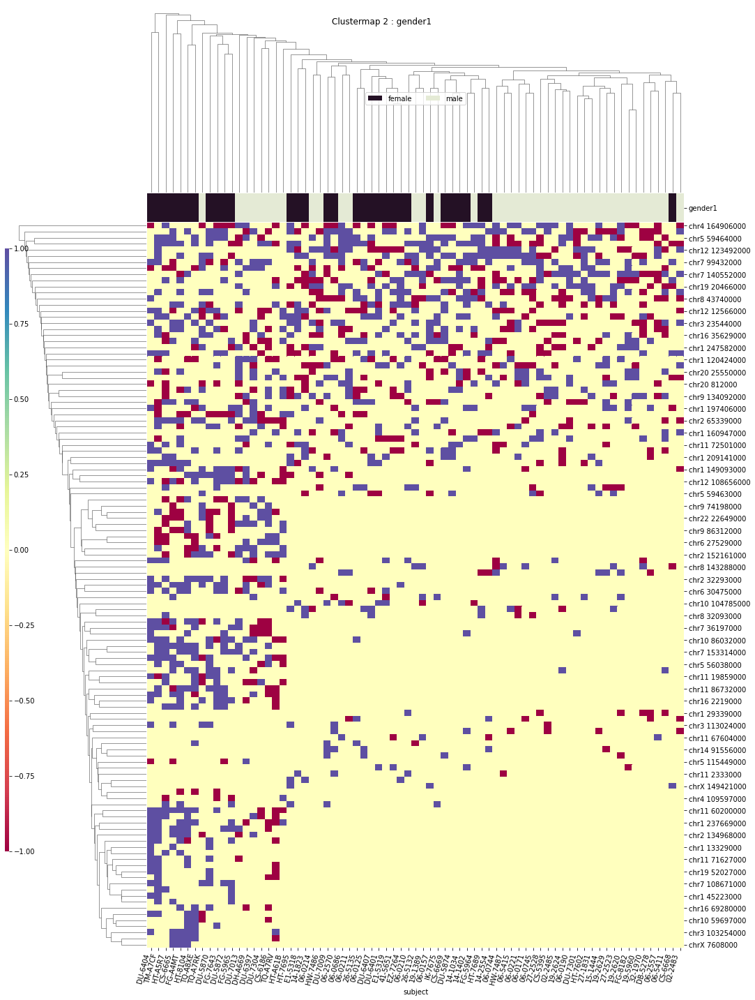

In [112]:
for column in 'primary_diagnosis','IDH','x1p19q','TERT','disease_type','IDH_1p19q_status','WHO_groups','Triple_group','MGMT','gender1':
    print(column)
    ttests_boxplots_and_heatmaps(compdf[compdf['hkle']==hkle],
        compdf.columns[compdf.columns.str.contains("^chr")],column,box_p=1e-8,heat_p=0.05)

In [113]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210524 18:03:46'

In [114]:
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [115]:
pd.set_option('display.max_columns', default_max_columns)

In [116]:
pd.set_option('display.max_rows',default_max_rows)

In [117]:
pd.set_option('display.precision', default_precision)